In [ ]:
import numpy as np
import pandas as pd
from pandas import DataFrame
import sqlite3
import matplotlib.pyplot as plt
import ast
import math
import time
from datetime import datetime
import glob
import sys
import copy
import cv2
from imp import reload

# read in db flyProjects to get experimetns at 60°


In [160]:
conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustProjects_3choice.db")
query2 = "SELECT  post0,exp,replicate, nStimuli  FROM projects;" #
readin_angle = pd.read_sql_query(query2,conn)

readin_angle['index'] = list(range(len(readin_angle.index)))



#readin_angle.head(10)

#['position','angle','distance']

dist_read = False
print('readin_anglekeys',readin_angle.keys())
#60 degree angle
angle60=(math.pi/180*60)
angle30=(math.pi/180*30) #0.5235987755982988
angle45=(math.pi/180*45) #0.7853981633974483
angle50=(math.pi/180*50) #0.872664625997
angle120=(math.pi/180*120)
angle180=(math.pi)

a=True
#p= pd.DataFrame(readin_angle,l)#.T.to_dict()
for i in range(0,250):
    
    #(readin_angle[readin_angle['index'] == i])
    #250 diff conditions from which to pick available
    
    
    
    if (ast.literal_eval(readin_angle.loc[i].values[0])) != None:
        ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])
        
        if dist_read == False:
            dist = (ast.literal_eval(readin_angle.loc[i].values[0])['distance'])
            dist_read = True
        if readin_angle['exp'][i] <10: 
            #only experiments <10 are the exp with two post condition, >10 are 3 post cond
            #print(readin_angle['exp'][i])
            #if 
            if ang == angle120 and readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                angle_used = ang
                    #selects for 60° cond and without nstim==0 or ==4 (controls with one post cond)
                    #print(i,ang)
                    #readin_angle[i]
                    #del tab
                    #print(readin_angle[readin_angle['index'] == i])
                    #Liste2=Liste2.append(readin_angle[readin_angle['index'] == i])
                print(ast.literal_eval(readin_angle.loc[i].values[0])['position'])
                tab=(readin_angle[readin_angle['index'] == i])
                if a==False:
                    tab2=tab2.append(tab,ignore_index=True)
                if a==True:
                    #tab2 contains list of exp,repl,nstim at certain angle 
                    tab2=tab
                    a=False
                if readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                    #print(readin_angle['nStimuli'][i])
                    pass
  
                
#readin_angle
#ang

#print(tab2.count())
print('tab2keys',tab2.keys())
print(dist)
print(ang, angle_used)
tab2



('readin_anglekeys', Index([u'post0', u'exp', u'replicate', u'nStimuli', u'index'], dtype='object'))
(-2.0, 2.4492935982947064e-16)
(-2.0, 2.4492935982947064e-16)
(-2.0, 2.4492935982947064e-16)
(-2.0, 2.4492935982947064e-16)
(-2.0, 2.4492935982947064e-16)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(1.4142135623730947, -1.4142135623730954)
(-1.4142135623730954, -1.414213562373095)
(-1.4142135623730954, -1.414213562373095)
(-1.4142135623730954, -1.414213562373095)
(-1.4142135623730954, -1.414213562373095)
(-1.4142135623730954, -1.414213562373095)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(-3.6739403974420594e-16, -2.0)
(1.4142135623730951, 1.414213562373095)
(1.4142135623730951, 1.414213562373095)
(1.4142135623730951, 1.414213562373095)
(1.4142135623730951, 1.414213562373095)
(1.4

,post0,exp,replicate,nStimuli,index
0,"{'position': (-2.0, 2.4492935982947064e-16), '...",0,0,2,2
1,"{'position': (-2.0, 2.4492935982947064e-16), '...",0,1,1,6
2,"{'position': (-2.0, 2.4492935982947064e-16), '...",0,2,1,11
3,"{'position': (-2.0, 2.4492935982947064e-16), '...",0,3,1,16
4,"{'position': (-2.0, 2.4492935982947064e-16), '...",0,4,1,21
5,"{'position': (1.4142135623730947, -1.414213562...",1,0,3,28
6,"{'position': (1.4142135623730947, -1.414213562...",1,1,2,32
7,"{'position': (1.4142135623730947, -1.414213562...",1,2,1,36
8,"{'position': (1.4142135623730947, -1.414213562...",1,3,2,42
9,"{'position': (1.4142135623730947, -1.414213562...",1,4,2,47


# EXPERIMENT ID READIN

In [161]:
conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustExperiments_3choice_complete2.db")

query = "SELECT exp, replicate, date,tStart, expId FROM experiments;"
readin_id = pd.read_sql_query(query,conn)
print(readin_id.keys())
readin_id=readin_id.assign(nStimuli = 5)
#posi=(ast.literal_eval(readin_angle.loc[0].values[0])['position'])
#posi=0
readin_id=readin_id.assign(position_post0_x = 1.0)
readin_id=readin_id.assign(position_post0_y = 1.0)

#*****************************dont read in as string, but as dict!!!!**********************************

#ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])

for i in range(0,len(readin_id.index)):
    #iterate through 40 rows of readin_id
    
    #kombi exp+ replicate in tab2 abgleichen und nStimuli rausschreiben!)
    #print(tab2['exp'][i])
    #pass

    b=readin_id['exp'][i]
    c=readin_id['replicate'][i]
    e=readin_id['date'][i]
    #tstart=readin_id['tStart'][i]
 
    for d in range(0,50):
        #iterate through 50 rows of tab2
        if tab2['exp'][d]==b and tab2['replicate'][d]==c:
            #print(tab2['exp'][d], tab2['replicate'][d], tab2['nStimuli'][d]  )
            
            #print(tab2['nStimuli'][d])
            f=tab2['nStimuli'][d]
            #g=tab2['post0']
            g=(ast.literal_eval(tab2.loc[d].values[0])['position'])
            h=round(g[0], 2)
            k=round(g[1], 2)
            #print(g.keys())
            #print(h,k)
            readin_id['nStimuli'][i]=f
            
            
            
            readin_id['position_post0_x'][i]=h
            readin_id['position_post0_y'][i]=k
    
    
#readin_id = readin_id[readin_id['exp'] < 10]

#pick exp of a specific date:
#readin_id = readin_id[readin_id['date'] == '2019-12-19']
readin_id.reset_index(drop=True, inplace=True) 
#exper_date='2019-12-12'


   
    
    
#df4 = df[df['nStimuli'] == 4]
#df4.head()
        
            
'''for i in range(0,40):
    path = (directory + readin_id['expId'][i] + filename)
    #print(path)
    
    df = pd.read_csv(path)
    #extends list to experimentID column
    df=df.assign(id = (readin_id['expId'][i]))
    df.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli', 'experimentID']
    
    if i == 0:
        df3=df
        df3.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli', 'experimentID']

    if i > 0:
        df3=df3.append(df, ignore_index=True)'''

            

readin_id

#40 expIDs available

Index([u'exp', u'replicate', u'date', u'tStart', u'expId'], dtype='object')


/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:41: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,exp,replicate,date,tStart,expId,nStimuli,position_post0_x,position_post0_y
0,0,0,2020-01-22,10:08,4c7731c9-664a-44aa-94e4-8a7b4753c37b,2,-2.00,0.00
1,0,1,2020-01-22,11:05,9fb60cee-d04a-4240-a24a-6e0731bfd4bc,1,-2.00,0.00
2,0,0,2020-01-22,12:00,b6a3cebf-bd0f-450c-b2ef-b15750383e4b,2,-2.00,0.00
3,1,2,2020-01-23,09:48,c38d4e08-f279-44cf-a7e1-0b379aaab5f7,1,1.41,-1.41
4,1,2,2020-01-23,10:45,57b0bb90-94c3-46b9-a31d-50c07915e70e,1,1.41,-1.41
5,1,4,2020-01-23,11:45,db62facd-f515-4fb9-9755-eadcdb4792c3,2,1.41,-1.41
6,2,3,2020-01-23,13:39,cc5ef638-09b6-4ccd-817f-c1c699c40624,2,-1.41,-1.41
7,2,4,2020-01-23,15:11,31e2a513-b9b2-4b76-bb08-845b52046ada,1,-1.41,-1.41
8,2,3,2020-01-23,16:09,5a075454-7bf4-4996-9097-51ad394691cf,2,-1.41,-1.41
9,3,2,2020-01-23,17:08,eeafd4f6-f219-48d7-a3fe-efb0f3c9cbd0,3,-0.00,-2.00


# csv

In [162]:
directory = '/home/bianca/Documents/github/locustVR/databases/data_collection/'
filename = '/results.csv'
counting=0
initialise = False
#for i in readin_id.index:
for i in range (0,(len(readin_id))):
#for i in range(0,1):
    #iterate through 20 leftover exp ids in readin_id that have 2 post cond, no control, only 60°
    path = (directory + readin_id['expId'][i] + filename)
    tstart = readin_id['tStart'][i]
    exper_date = readin_id['date'][i]
    print('tstart',tstart)  


    print(path)
    
     
    try:
        df = pd.read_csv(path)
        print(path)
    except:
        print('***************************csv in row %d doesnt exist**********************' %(i))
    
    #extends list to experimentID column
    df=df.assign(pos0x = (readin_id['position_post0_x'][i]))
    df=df.assign(pos0y = (readin_id['position_post0_y'][i]))
    #print(readin_id['expId'][i])
    df.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
    stim = readin_id['nStimuli'][i]
    #print stim
    #for j in range(0,len(df)):
    #    if df['nStimuli'][j]== stim:
    
    #select those with stimuli according to readin_in info those with the specific angle
    df=(df.loc[df['nStimuli'] == stim])  
    print(i)
    if initialise == False:
        df3=df
        df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
        initialise = True

    
    if i > 0:
        df3=df3.append(df, ignore_index=True)
        counting+=1
    print(counting, df.count)
    

    '''df3=df
    df3=df3.append(df, ignore_index=True)
    
    df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']'''

    
print('tstart', tstart)
df3 = df3.reset_index()
df3

('tstart', u'10:08')
/home/bianca/Documents/github/locustVR/databases/data_collection/4c7731c9-664a-44aa-94e4-8a7b4753c37b/results.csv
/home/bianca/Documents/github/locustVR/databases/data_collection/4c7731c9-664a-44aa-94e4-8a7b4753c37b/results.csv
0
(0, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
32311 -0.000143 -0.000159  0.0     0  1230.039686         2   -2.0    0.0
32312 -0.000295 -0.000307  0.0     0  1230.074167         2   -2.0    0.0
32313 -0.000406 -0.000420  0.0     0  1230.117727         2   -2.0    0.0
32314 -0.000554 -0.000538  0.0     0  1230.159414         2   -2.0    0.0
32315 -0.000663 -0.000558  0.0     0  1230.204601         2   -2.0    0.0
32316 -0.000696 -0.000536  0.0     0  1230.239999         2   -2.0    0.0
32317 -0.000702 -0.000518  0.0     0  1230.280822         2   -2.0    0.0
32318 -0.000688 -0.000543  0.0     0  1230.316696         2   -2.0    0.0
32319 -0.000628 -0.000541  0.0     0  1230.352

/home/bianca/Documents/github/locustVR/databases/data_collection/c38d4e08-f279-44cf-a7e1-0b379aaab5f7/results.csv
3
(3, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
13370  0.000000  0.000000  0.0     0   510.011301         1   1.41  -1.41
13371 -0.000039  0.000057  0.0     0   510.045948         1   1.41  -1.41
13372 -0.000094  0.000142  0.0     0   510.084862         1   1.41  -1.41
13373 -0.000149  0.000220  0.0     0   510.123221         1   1.41  -1.41
13374 -0.000198  0.000310  0.0     0   510.164037         1   1.41  -1.41
13375 -0.000258  0.000384  0.0     0   510.205500         1   1.41  -1.41
13376 -0.000300  0.000457  0.0     0   510.242543         1   1.41  -1.41
13377 -0.000324  0.000510  0.0     0   510.277007         1   1.41  -1.41
13378 -0.000357  0.000570  0.0     0   510.311167         1   1.41  -1.41
13379 -0.000383  0.000640  0.0     0   510.343791         1   1.41  -1.41
13380 -0.000426  0.000729  0.0   

(6, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
29531  0.000000  0.000000  0.0     0  1230.010485         2  -1.41  -1.41
29532 -0.000234 -0.000448  0.0     0  1230.047366         2  -1.41  -1.41
29533 -0.000565 -0.001024  0.0     0  1230.087033         2  -1.41  -1.41
29534 -0.001104 -0.001763  0.0     0  1230.131599         2  -1.41  -1.41
29535 -0.001600 -0.002394  0.0     0  1230.178901         2  -1.41  -1.41
29536 -0.002202 -0.003175  0.0     0  1230.222565         2  -1.41  -1.41
29537 -0.002546 -0.003632  0.0     0  1230.258762         2  -1.41  -1.41
29538 -0.002977 -0.004203  0.0     0  1230.299854         2  -1.41  -1.41
29539 -0.003539 -0.004911  0.0     0  1230.345518         2  -1.41  -1.41
29540 -0.004012 -0.005523  0.0     0  1230.385306         2  -1.41  -1.41
29541 -0.004377 -0.005996  0.0     0  1230.423284         2  -1.41  -1.41
29542 -0.004812 -0.006647  0.0     0  1230.462967         2  -1.41  -1.41
2

/home/bianca/Documents/github/locustVR/databases/data_collection/faca013d-a0f7-4a6d-b07e-988fdc8a48b7/results.csv
10
(10, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
29798  0.000141 -0.000292  0.0     0  1230.020522         2   -0.0   -2.0
29799  0.000689 -0.001437  0.0     0  1230.063407         2   -0.0   -2.0
29800  0.001189 -0.002571  0.0     0  1230.100594         2   -0.0   -2.0
29801  0.001644 -0.003705  0.0     0  1230.136897         2   -0.0   -2.0
29802  0.001978 -0.004530  0.0     0  1230.173621         2   -0.0   -2.0
29803  0.002420 -0.005581  0.0     0  1230.212018         2   -0.0   -2.0
29804  0.002625 -0.006753  0.0     0  1230.255989         2   -0.0   -2.0
29805  0.002921 -0.007767  0.0     0  1230.295988         2   -0.0   -2.0
29806  0.003291 -0.008773  0.0     0  1230.338135         2   -0.0   -2.0
29807  0.003852 -0.009940  0.0     0  1230.392221         2   -0.0   -2.0
29808  0.004206 -0.010591  0.0 

(13, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
30392 -0.000011  0.000008  0.0     0  1230.015898         2   1.41   1.41
30393 -0.000044  0.000011  0.0     0  1230.054691         2   1.41   1.41
30394 -0.000059 -0.000002  0.0     0  1230.093658         2   1.41   1.41
30395 -0.000060 -0.000017  0.0     0  1230.130810         2   1.41   1.41
30396 -0.000054 -0.000045  0.0     0  1230.165988         2   1.41   1.41
30397 -0.000051 -0.000053  0.0     0  1230.205293         2   1.41   1.41
30398 -0.000048 -0.000054  0.0     0  1230.254573         2   1.41   1.41
30399 -0.000039 -0.000061  0.0     0  1230.293305         2   1.41   1.41
30400 -0.000026 -0.000052  0.0     0  1230.336272         2   1.41   1.41
30401 -0.000032 -0.000047  0.0     0  1230.375891         2   1.41   1.41
30402 -0.000054 -0.000054  0.0     0  1230.420991         2   1.41   1.41
30403 -0.000072 -0.000047  0.0     0  1230.473755         2   1.41   1.41


(16, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
29308 -0.502731  0.912093  0.0     0  1230.002255         2  -1.41  -1.41
29309 -0.000342  0.000793  0.0     0  1230.048604         2  -1.41  -1.41
29310 -0.000779  0.001855  0.0     0  1230.085412         2  -1.41  -1.41
29311 -0.001146  0.002910  0.0     0  1230.129432         2  -1.41  -1.41
29312 -0.001514  0.003975  0.0     0  1230.169315         2  -1.41  -1.41
29313 -0.001927  0.004988  0.0     0  1230.206647         2  -1.41  -1.41
29314 -0.002222  0.005677  0.0     0  1230.244188         2  -1.41  -1.41
29315 -0.002591  0.006565  0.0     0  1230.284945         2  -1.41  -1.41
29316 -0.002930  0.007388  0.0     0  1230.325474         2  -1.41  -1.41
29317 -0.003234  0.008205  0.0     0  1230.365561         2  -1.41  -1.41
29318 -0.003497  0.008952  0.0     0  1230.403707         2  -1.41  -1.41
29319 -0.003809  0.009728  0.0     0  1230.443535         2  -1.41  -1.41


(19, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
30267 -0.000975  0.002535  0.0     1  1230.000082         2    2.0   -0.0
30268 -0.000951  0.002608  0.0     1  1233.045063         2    2.0   -0.0
30269 -0.000907  0.002708  0.0     1  1233.082016         2    2.0   -0.0
30270 -0.000861  0.002854  0.0     1  1233.125150         2    2.0   -0.0
30271 -0.000830  0.003015  0.0     1  1233.166150         2    2.0   -0.0
30272 -0.000832  0.003171  0.0     1  1233.205075         2    2.0   -0.0
30273 -0.000868  0.003333  0.0     1  1233.243388         2    2.0   -0.0
30274 -0.000942  0.003472  0.0     1  1233.282306         2    2.0   -0.0
30275 -0.001036  0.003571  0.0     1  1233.316485         2    2.0   -0.0
30276 -0.001193  0.003704  0.0     1  1233.355355         2    2.0   -0.0
30277 -0.001384  0.003853  0.0     1  1233.395949         2    2.0   -0.0
30278 -0.001700  0.004030  0.0     1  1233.458908         2    2.0   -0.0


(22, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
12821 -0.000004  0.000031  0.0     0   510.035038         1    0.0    2.0
12822 -0.000028  0.000095  0.0     0   510.072697         1    0.0    2.0
12823 -0.000052  0.000143  0.0     0   510.111174         1    0.0    2.0
12824 -0.000086  0.000192  0.0     0   510.151470         1    0.0    2.0
12825 -0.000147  0.000263  0.0     0   510.201823         1    0.0    2.0
12826 -0.000204  0.000307  0.0     0   510.240877         1    0.0    2.0
12827 -0.000237  0.000347  0.0     0   510.280608         1    0.0    2.0
12828 -0.000255  0.000387  0.0     0   510.321418         1    0.0    2.0
12829 -0.000281  0.000418  0.0     0   510.362849         1    0.0    2.0
12830 -0.000291  0.000448  0.0     0   510.400125         1    0.0    2.0
12831 -0.000351  0.000424  0.0     0   510.441850         1    0.0    2.0
12832 -0.000372  0.000399  0.0     0   510.482919         1    0.0    2.0


(25, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
12792  0.000017  0.000173  0.0     0   510.012541         1    2.0   -0.0
12793  0.000043  0.000868  0.0     0   510.053075         1    2.0   -0.0
12794  0.000070  0.001352  0.0     0   510.090820         1    2.0   -0.0
12795  0.000137  0.001954  0.0     0   510.131806         1    2.0   -0.0
12796  0.000219  0.002546  0.0     0   510.172479         1    2.0   -0.0
12797  0.000303  0.003078  0.0     0   510.213396         1    2.0   -0.0
12798  0.000408  0.003707  0.0     0   510.269393         1    2.0   -0.0
12799  0.000486  0.004016  0.0     0   510.313473         1    2.0   -0.0
12800  0.000564  0.004273  0.0     0   510.352361         1    2.0   -0.0
12801  0.000615  0.004515  0.0     0   510.388438         1    2.0   -0.0
12802  0.000645  0.004735  0.0     0   510.431945         1    2.0   -0.0
12803  0.000657  0.004906  0.0     0   510.466709         1    2.0   -0.0


(28, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
30001 -0.463651 -0.670625  0.0     0  1230.005922         2  -1.41  -1.41
30002 -0.000413 -0.000346  0.0     0  1230.050404         2  -1.41  -1.41
30003 -0.000905 -0.000807  0.0     0  1230.084724         2  -1.41  -1.41
30004 -0.001294 -0.001168  0.0     0  1230.119651         2  -1.41  -1.41
30005 -0.001843 -0.001656  0.0     0  1230.158497         2  -1.41  -1.41
30006 -0.002285 -0.002048  0.0     0  1230.192937         2  -1.41  -1.41
30007 -0.002903 -0.002569  0.0     0  1230.227604         2  -1.41  -1.41
30008 -0.003336 -0.002910  0.0     0  1230.262228         2  -1.41  -1.41
30009 -0.003859 -0.003304  0.0     0  1230.300571         2  -1.41  -1.41
30010 -0.004306 -0.003621  0.0     0  1230.339822         2  -1.41  -1.41
30011 -0.004673 -0.003860  0.0     0  1230.379526         2  -1.41  -1.41
30012 -0.004934 -0.004035  0.0     0  1230.416126         2  -1.41  -1.41


,index,x,y,z,cntr,t,nStimuli,pos0x,pos0y
0,0,-0.000143,-0.000159,0.0,0,1230.039686,2,-2.00,0.00
1,1,-0.000295,-0.000307,0.0,0,1230.074167,2,-2.00,0.00
2,2,-0.000406,-0.000420,0.0,0,1230.117727,2,-2.00,0.00
3,3,-0.000554,-0.000538,0.0,0,1230.159414,2,-2.00,0.00
4,4,-0.000663,-0.000558,0.0,0,1230.204601,2,-2.00,0.00
5,5,-0.000696,-0.000536,0.0,0,1230.239999,2,-2.00,0.00
6,6,-0.000702,-0.000518,0.0,0,1230.280822,2,-2.00,0.00
7,7,-0.000688,-0.000543,0.0,0,1230.316696,2,-2.00,0.00
8,8,-0.000628,-0.000541,0.0,0,1230.352872,2,-2.00,0.00
9,9,-0.000503,-0.000419,0.0,0,1230.390882,2,-2.00,0.00



# rotate all x and y values at certain ang from experiments

In [163]:
print(angle_used*180/math.pi)


120.0


In [164]:
t0 = time.time()

#8 angles in matrices depending on starting position of post0

#change habp= half the angle between posts angle accord. to current investigation!!!:
#here for 60° angle half is 30° so pi/6
#habp = (math.pi)/6   #60
#habp = (math.pi)/12
habp = angle_used

#rotation angles; referring to post position:
# post1 immer ccc zu post0. also in kreisrichtung (pihalbe, pi..) drehrichtung ist hier richtig!!!
ang5_0 = 2  *math.pi - habp
ang33  = 1.75*math.pi - habp

ang0_5 = 1.5*math.pi - habp
angm33 = 1.25*math.pi - habp

angm5_0 = 1*math.pi   - habp
angm3m3 = 0.75*math.pi - habp

ang0_m5 = 0.5*math.pi - habp
ang3m3 = 0.25*math.pi - habp

def rotation(x,y, theta):
    #theta = 0
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c,-s), (s, c)))
    a,b=np.dot(R,[x,y])
    return a,b

rot=[]
dist_45 = round(((dist**2)/2)**0.5 , 2)   #square_root_2a_sq, distance at on x or y axis at 45 degree 


for l in range(len(df3)): #(): len(df3) 0,40000
    print(df3['x'][l])
    x=df3['x'][l]
    y=df3['y'][l]
    #t=df3['t'][l]
    #print(x,y)
    
    if df3['pos0x'][l]== dist and df3['pos0y'][l]== 0.00:
        theta = ang5_0
        
    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== dist_45:
        theta = ang33
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== dist:
        theta = ang0_5
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== dist_45:
        theta = angm33
        
    if df3['pos0x'][l]== -dist and df3['pos0y'][l]== 0.00:
        theta = angm5_0
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== -dist_45:
        theta = angm3m3
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== -dist:
        theta = ang0_m5
        

    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== -dist_45:
        theta = ang3m3
        
    
    #print(rotation(x,y,theta))
    rot.extend([(rotation(x,y,theta))])
    #list rot contains all rotated values at 60° from all experiments!
    #x_rot,y_rot=    rotation(x,y,theta)  
print('length df3',len(df3))
print('length of rot',len(rot))
#rot[zeile][spalte]


-0.00014254
-0.00029508
-0.00040586
-0.00055429
-0.0006632
-0.00069612
-0.00070227
-0.00068754
-0.00062836
-0.00050278
-0.00038925
-0.00030077
-6.861e-05
4.485e-05
0.0001109
7.626e-05
-9.618e-05
-0.00030129
-0.00065506
-0.0008503
-0.00109501
-0.00154352
-0.00203909
-0.00268298
-0.0031369
-0.00368028
-0.00416391
-0.00451939
-0.00489782
-0.00535061
-0.00574163
-0.00605962
-0.0063227
-0.00662968
-0.00721269
-0.00757887
-0.0078348
-0.00813673
-0.00837489
-0.008671
-0.0088293
-0.00901159
-0.00924482
-0.00938179
-0.00951368
-0.00957952
-0.00965198
-0.00973519
-0.00981729
-0.00991507
-0.01011263
-0.01025659
-0.01044304
-0.0106149
-0.01088806
-0.01103723
-0.01109013
-0.01109376
-0.01101955
-0.01088274
-0.01067167
-0.01042645
-0.01020229
-0.00986532
-0.00946211
-0.00909358
-0.00877729
-0.00852788
-0.00827267
-0.00793082
-0.00759893
-0.00735892
-0.00696902
-0.00664405
-0.00644646
-0.00627875
-0.00601709
-0.00582777
-0.00555554
-0.00530426
-0.00503555
-0.00467349
-0.00424547
-0.00389121
-0.003322

-0.10069492
-0.09997323
-0.09964645
-0.09964851
-0.09964245
-0.09891816
-0.09848746
-0.0980229
-0.09769065
-0.09738005
-0.09718601
-0.09692577
-0.09653982
-0.09593302
-0.09554134
-0.09512416
-0.09479241
-0.09437181
-0.09409457
-0.09376213
-0.09359535
-0.09327908
-0.09266372
-0.09192794
-0.09150471
-0.09078018
-0.08986912
-0.08919976
-0.08864169
-0.08769131
-0.08696778
-0.08622557
-0.08569727
-0.08510385
-0.08450092
-0.08403434
-0.0834362
-0.08308157
-0.08285169
-0.08247426
-0.08219436
-0.0815177
-0.08062326
-0.07961414
-0.07887647
-0.07810249
-0.07758761
-0.07707119
-0.07644012
-0.07590603
-0.07484843
-0.07381401
-0.07299508
-0.07201804
-0.07148021
-0.07093533
-0.07051309
-0.07010988
-0.06995418
-0.06989193
-0.06993849
-0.0699797
-0.07006867
-0.07012207
-0.07016479
-0.07021591
-0.07025974
-0.07030024
-0.07029585
-0.07025266
-0.07018654
-0.07009903
-0.07002976
-0.06994397
-0.06976948
-0.06952913
-0.06918727
-0.06885395
-0.06834468
-0.06770021
-0.06720066
-0.06648215
-0.06550421
-0.06468

-0.1231765
-0.12320834
-0.12323123
-0.12323842
-0.12323893
-0.12324661
-0.12325279
-0.12323789
-0.12321983
-0.12323014
-0.12323551
-0.12327172
-0.12329325
-0.12327292
-0.12323329
-0.12316208
-0.12311815
-0.12306349
-0.12299665
-0.12295225
-0.12292774
-0.12292782
-0.12292311
-0.12290891
-0.12290586
-0.12289346
-0.12286463
-0.12283723
-0.1228134
-0.12277416
-0.1227469
-0.12273698
-0.12276431
-0.12279555
-0.12287319
-0.12308028
-0.12328542
-0.12359768
-0.12381668
-0.12409655
-0.12447422
-0.12480795
-0.12534569
-0.12596858
-0.12643391
-0.12690357
-0.12749056
-0.1280899
-0.12855633
-0.1290535
-0.12982596
-0.1306928
-0.13153363
-0.13253424
-0.13364675
-0.1342244
-0.13508649
-0.13578331
-0.13668086
-0.13734122
-0.1381524
-0.13893018
-0.13949831
-0.14008422
-0.14089729
-0.14150176
-0.1422371
-0.14272129
-0.14329798
-0.14372288
-0.14437854
-0.1449209
-0.14547073
-0.14618585
-0.14688599
-0.14752161
-0.14814436
-0.14865292
-0.1494829
-0.15004866
-0.1504454
-0.15083953
-0.15105409
-0.15128887
-0.1

0.04831636
0.04919898
0.05039957
0.05128309
0.05246468
0.05337353
0.05457855
0.05564315
0.05682571
0.0577165
0.05891492
0.06014111
0.06108611
0.06240872
0.06335918
0.06491186
0.06585826
0.06712006
0.06840301
0.06966276
0.07058644
0.07148554
0.0725821
0.07342644
0.07456832
0.07599926
0.0768384
0.07791243
0.0786697
0.07956444
0.08027182
0.08066369
0.08095879
0.08128047
0.08140693
0.08144384
0.08143503
0.08137164
0.0812727
0.08119249
0.08114693
0.08111685
0.08109666
0.08109392
0.08107555
0.08105405
0.08100977
0.08096972
0.08095258
0.08095708
0.08096175
0.08095916
0.08097269
0.08102378
0.08110238
0.08128351
0.081856
0.08258698
0.08321136
0.08394036
0.08457662
0.08554748
0.0863205
0.08736665
0.08813609
0.08914197
0.08985908
0.09058311
0.09154185
0.09223559
0.09316117
0.09387613
0.09484984
0.09556666
0.09631976
0.09740392
0.09850669
0.09934118
0.10043395
0.10154122
0.10237609
0.1034299
0.104193
0.10518219
0.10589001
0.10678984
0.1074653
0.10839544
0.10909551
0.11023722
0.11095961
0.11198002


0.11717701
0.11718239
0.11721371
0.1172622
0.11728559
0.11723479
0.11720345
0.11710038
0.1168637
0.11654736
0.1163765
0.1161301
0.11595552
0.11574733
0.11559299
0.11537931
0.11517673
0.11496793
0.11471382
0.11446342
0.1140478
0.11371138
0.11328818
0.1129908
0.11257015
0.11225831
0.11191286
0.11173216
0.1115425
0.11128811
0.11098331
0.1107039
0.11032959
0.11009646
0.10981359
0.1095877
0.10937631
0.10907708
0.10888299
0.10890524
0.10895273
0.1089887
0.10894378
0.10889336
0.1088399
0.10878335
0.1087089
0.10865361
0.10855568
0.10830703
0.10798881
0.10761383
0.10718749
0.106596
0.10604212
0.10539545
0.1046627
0.10407871
0.10350688
0.10278965
0.10211692
0.10161513
0.10124619
0.10159459
0.10201722
0.10240003
0.10280312
0.10298786
0.10301681
0.10302462
0.10291997
0.10295611
0.10292189
0.10288014
0.10280377
0.10270964
0.10295821
0.10332228
0.10373041
0.10441636
0.10485477
0.10525151
0.10577823
0.10612455
0.10656206
0.10694772
0.10717289
0.1073892
0.10751738
0.10765978
0.10785883
0.10790846
0.10

0.34529419
0.34534115
0.3453728
0.34537115
0.3453189
0.34525943
0.34522438
0.34517865
0.34511997
0.34506549
0.34500022
0.34495877
0.34492792
0.34490788
0.34488356
0.34486819
0.34487377
0.34488385
0.34486581
0.34485438
0.34485966
0.34488961
0.34492684
0.34493841
0.34491989
0.34490495
0.34485068
0.34473615
0.34464892
0.34457131
0.34453793
0.34456142
0.34456562
0.34457996
0.34459279
0.34458955
0.34458103
0.34455845
0.34454652
0.34453159
0.34449531
0.34445851
0.34441784
0.34437654
0.34430766
0.3442278
0.34416123
0.34411941
0.34410677
0.34412518
0.34416578
0.34422688
0.34429681
0.34435485
0.34437687
0.3443732
0.34437471
0.34437201
0.34435293
0.34432311
0.34430464
0.34424925
0.34420594
0.34419469
0.34415721
0.34414961
0.34415741
0.34416658
0.34417705
0.34419853
0.34420896
0.34421696
0.34424032
0.34425543
0.34428242
0.34429414
0.34428919
0.34427669
0.3442588
0.3442475
0.34423596
0.34419976
0.34415876
0.34411562
0.34408704
0.34407898
0.34407624
0.34407467
0.34407404
0.34407989
0.34409745
0.344

0.72452585
0.72498573
0.72543348
0.72592067
0.72644167
0.72682525
0.72700586
0.72719292
0.72734132
0.72747117
0.72763284
0.72783881
0.7281149
0.72866714
0.72908819
0.7296432
0.73008341
0.73067494
0.73124093
0.73175226
0.73221155
0.7326145
0.7329493
0.73315055
0.73343301
0.73373584
0.73431893
0.73478462
0.73530028
0.73578829
0.73627724
0.73679392
0.73731304
0.73780112
0.73815134
0.73860893
0.73908772
0.7396163
0.74018031
0.74076457
0.74134208
0.74193272
0.74251362
0.74292533
0.74343133
0.74394041
0.74447022
0.74514885
0.74599625
0.74693243
0.74750655
0.74790088
0.74840822
0.74902554
0.74951927
0.74997083
0.75036584
0.75067683
0.75098667
0.75118417
0.75148081
0.75180534
0.75213077
0.75254535
0.75279187
0.75312471
0.75342065
0.75362271
0.75384883
0.75406388
0.75426281
0.75446266
0.75458914
0.75474327
0.75487562
0.75500189
0.75510999
0.75520858
0.75541826
0.75555759
0.7556932
0.75585429
0.75594321
0.75589237
0.75572541
0.75548463
0.7553417
0.75534339
0.75539566
0.75539356
0.75550686
0.7556

0.65360969
0.6537142
0.65378696
0.65382205
0.65388393
0.65397096
0.65404319
0.65411134
0.65420038
0.65425488
0.6542963
0.65433832
0.65438437
0.65442375
0.65443133
0.65445292
0.65447687
0.65449122
0.65449951
0.65451651
0.654545
0.65457018
0.65458537
0.65458179
0.65454631
0.65454694
0.65455493
0.65457236
0.65458007
0.65456662
0.65453772
0.65450638
0.65448002
0.6544447
0.65440094
0.6543783
0.65435902
0.65433036
0.65429662
0.6542844
0.65427513
0.65424804
0.65424106
0.65424283
0.65424549
0.65425182
0.65424945
0.65423978
0.65424795
0.65426528
0.65427938
0.65429201
0.65431816
0.65429277
0.65428774
0.65429477
0.65430003
0.65430235
0.65432125
0.65432964
0.65430597
0.65428377
0.65423913
0.65416386
0.65409561
0.6540682
0.65407597
0.6540912
0.65414728
0.6542053
0.65425983
0.65430287
0.65434225
0.65435248
0.65435375
0.65435442
0.65436886
0.65440406
0.65442471
0.65442599
0.65444093
0.6544782
0.65451027
0.65453023
0.65453989
0.6545483
0.65455347
0.6545565
0.65455843
0.65455922
0.65455935
0.6545593
0.

0.00053363
0.0005205
0.00050887
0.00050312
0.00049803
0.00051712
0.00052667
0.00053136
0.00053483
0.00051902
0.00050832
0.00050154
0.00050068
0.00051304
0.000522
0.00055074
0.00058681
0.00060519
0.0006216
0.00062244
0.00061269
0.00057443
0.0005326
0.00050505
0.00046733
0.00044342
0.00042194
0.00042072
0.00042733
0.00043078
0.00043387
0.00045382
0.00050107
0.0005294
0.00056004
0.0005993
0.00061469
0.00062862
0.00063558
0.00062401
0.00061617
0.00059028
0.00053709
0.00050097
0.00048261
0.00046661
0.00044876
0.00043018
0.00041105
0.00040387
0.0004046
0.00041506
0.00042426
0.00043138
0.0004341
0.00043663
0.0004383
0.00043917
0.00044001
0.00044047
0.00044093
0.00044235
0.00046181
0.00047414
0.00048036
0.00049897
0.00053614
0.00055322
0.00055156
0.00055048
0.00054991
0.00056239
0.00056605
0.00055975
0.00055396
0.00053692
0.00052152
0.00051374
0.00050535
0.0005023
0.00049925
0.00049728
0.00049658
0.00049595
0.00049549
0.00049533
0.00050262
0.00051565
0.00051907
0.00050988
0.00051361
0.00053244

-0.17540956
-0.17613652
-0.17674817
-0.17710693
-0.17750962
-0.1777375
-0.17796063
-0.17807926
-0.17815169
-0.17818671
-0.17817634
-0.17813727
-0.17804821
-0.17799811
-0.1778859
-0.17780874
-0.17775217
-0.17783919
-0.17798613
-0.17822968
-0.17864039
-0.17899802
-0.17956396
-0.18021859
-0.18076342
-0.18147849
-0.18206791
-0.18272065
-0.18365794
-0.18436801
-0.1852713
-0.18592531
-0.18676144
-0.18738591
-0.18823912
-0.18887547
-0.18969371
-0.1902671
-0.19095758
-0.19137418
-0.19178641
-0.19209989
-0.1923145
-0.19269832
-0.19308461
-0.1936877
-0.19434309
-0.19485183
-0.1955204
-0.19600691
-0.19673206
-0.19750563
-0.19839236
-0.19888149
-0.19948861
-0.19997816
-0.20071714
-0.20131244
-0.20195965
-0.20289446
-0.20360104
-0.20457714
-0.2055331
-0.2062158
-0.2070883
-0.20796208
-0.20868091
-0.2096946
-0.21073995
-0.21178233
-0.21331265
-0.21427313
-0.21541101
-0.21601803
-0.21692935
-0.21750967
-0.21813122
-0.21896302
-0.21955916
-0.22030181
-0.2209227
-0.22132663
-0.22192088
-0.22230554
-0.2

-0.09349918
-0.09366462
-0.09382271
-0.09392465
-0.09398448
-0.0939974
-0.09405122
-0.09396268
-0.09395229
-0.09407311
-0.09409738
-0.09417327
-0.09428543
-0.0943825
-0.09437437
-0.09428214
-0.0941882
-0.09409885
-0.09394718
-0.09362267
-0.09341498
-0.09329872
-0.09315259
-0.09301466
-0.09291505
-0.0929653
-0.09303814
-0.09307098
-0.09306544
-0.09302474
-0.09293296
-0.09273561
-0.092466
-0.09214642
-0.09196805
-0.09189124
-0.0918273
-0.09172645
-0.09175347
-0.09183982
-0.09191346
-0.09199052
-0.09222325
-0.09279588
-0.09338738
-0.09384496
-0.09411584
-0.09427951
-0.09438136
-0.09433674
-0.0941823
-0.0938947
-0.093821
-0.09386827
-0.09384684
-0.0937321
-0.09358641
-0.09362016
-0.09378402
-0.09396568
-0.09430692
-0.09444348
-0.09448723
-0.09444004
-0.09438903
-0.09435146
-0.09423303
-0.09410422
-0.09384711
-0.09369019
-0.09345649
-0.09325586
-0.09310124
-0.09303037
-0.09284805
-0.09266792
-0.09248329
-0.09233851
-0.0921833
-0.09208512
-0.0921176
-0.09228686
-0.09243225
-0.09265636
-0.092

-0.0916622
-0.09173437
-0.09201516
-0.09213317
-0.09232944
-0.09262388
-0.09292866
-0.09302156
-0.09300953
-0.09295273
-0.09272476
-0.09255207
-0.09240338
-0.09214559
-0.09200444
-0.09173539
-0.0915616
-0.09153352
-0.09180123
-0.09201569
-0.09206407
-0.09204808
-0.09198117
-0.09178869
-0.09155186
-0.09147505
-0.0913118
-0.09122927
-0.09129468
-0.09137897
-0.09139216
-0.09140407
-0.09144406
-0.09144547
-0.09149328
-0.09163804
-0.09171804
-0.09184469
-0.09196283
-0.09194113
-0.0920457
-0.09214964
-0.09215714
-0.09212241
-0.0921195
-0.09203398
-0.09175676
-0.09157513
-0.091531
-0.09157435
-0.09196932
-0.09240659
-0.09289112
-0.09306074
-0.09305109
-0.09310308
-0.09310073
-0.09302162
-0.09276223
-0.09251275
-0.09226169
-0.09204196
-0.09221238
-0.09241964
-0.09259171
-0.09267544
-0.092845
-0.0928945
-0.09291614
-0.09294174
-0.09279512
-0.09270744
-0.09250055
-0.09227616
-0.09199326
-0.091639
-0.09143426
-0.09127285
-0.0911788
-0.09124734
-0.09141315
-0.09152754
-0.09154117
-0.09152333
-0.09

-0.20375613
-0.20376191
-0.20376568
-0.2037676
-0.20376945
-0.20377044
-0.20377141
-0.20378251
-0.20379992
-0.20382025
-0.20383777
-0.20386933
-0.20390441
-0.20393484
-0.20395272
-0.20398532
-0.20400127
-0.20401582
-0.20402314
-0.20402658
-0.20400005
-0.20402308
-0.20402867
-0.20403149
-0.20402808
-0.20400839
-0.20397773
-0.2039339
-0.20391739
-0.20390223
-0.20388965
-0.20393135
-0.20395056
-0.20392898
-0.20391425
-0.20390112
-0.2038926
-0.20388844
-0.20387483
-0.20388349
-0.20389769
-0.20390258
-0.20389367
-0.20388795
-0.20395197
-0.20403914
-0.20407561
-0.20407347
-0.20399213
-0.2039203
-0.20388547
-0.20381609
-0.20372746
-0.20366018
-0.20358932
-0.20355627
-0.20351705
-0.2034738
-0.20340647
-0.20335876
-0.20331321
-0.2032698
-0.20322362
-0.20315631
-0.203055
-0.20295482
-0.20274016
-0.20253107
-0.20227144
-0.20208043
-0.20181312
-0.20151429
-0.20119014
-0.20090085
-0.20059115
-0.20009115
-0.1996797
-0.19930794
-0.19899387
-0.19863606
-0.19831553
-0.1978487
-0.1975136
-0.1970686
-0.1

-0.31272977
-0.31263671
-0.31255896
-0.31244333
-0.31235687
-0.31225517
-0.31216709
-0.31208889
-0.31200586
-0.31197535
-0.31190439
-0.3118408
-0.31172199
-0.31161941
-0.31143665
-0.31131322
-0.31113977
-0.31101893
-0.31088156
-0.31077929
-0.31070413
-0.31065044
-0.31062829
-0.31058348
-0.31052688
-0.31047449
-0.3103587
-0.31008277
-0.30978923
-0.30944297
-0.30898537
-0.30860028
-0.308308
-0.3079171
-0.30752911
-0.30712653
-0.30670722
-0.30636307
-0.30587608
-0.30533625
-0.30461602
-0.30404391
-0.30350535
-0.3031379
-0.30278132
-0.30234351
-0.30199343
-0.30164652
-0.30138099
-0.30113777
-0.30093247
-0.30052282
-0.30003399
-0.299601
-0.29913439
-0.29865148
-0.29818573
-0.29774565
-0.29743911
-0.29703884
-0.2965769
-0.29626938
-0.29576089
-0.29532102
-0.2948237
-0.29442332
-0.29384715
-0.29340967
-0.29296799
-0.29237612
-0.2919261
-0.29146
-0.29082417
-0.29014524
-0.28962876
-0.28896801
-0.28849273
-0.28784881
-0.28721908
-0.28661318
-0.28601272
-0.28542741
-0.28495188
-0.28427765
-0.283

-0.38416579
-0.38433447
-0.38466172
-0.38493708
-0.38529624
-0.38553397
-0.38583403
-0.38608029
-0.38620899
-0.38632444
-0.38641511
-0.38656374
-0.38680696
-0.38710313
-0.38731437
-0.38757962
-0.38785364
-0.38804387
-0.3882455
-0.3883445
-0.38845566
-0.38859429
-0.38873147
-0.3888916
-0.38915856
-0.38933949
-0.38956218
-0.38972146
-0.38992463
-0.3901634
-0.39029449
-0.39041749
-0.39061884
-0.39090709
-0.39109457
-0.39121882
-0.39137649
-0.39147896
-0.39156923
-0.39163002
-0.39176585
-0.39187946
-0.3921163
-0.39232155
-0.39245229
-0.3925154
-0.39258797
-0.3926302
-0.39266105
-0.39273709
-0.39279567
-0.3928359
-0.39283958
-0.39280238
-0.39275762
-0.39269394
-0.39270978
-0.39277394
-0.3927532
-0.39273647
-0.39270004
-0.39268156
-0.39267056
-0.39271049
-0.39275857
-0.39274912
-0.39273419
-0.39266153
-0.39262477
-0.39262554
-0.39263796
-0.39260375
-0.3925615
-0.39249962
-0.39241822
-0.39238634
-0.39238261
-0.3923408
-0.39225614
-0.39214315
-0.3919413
-0.39170483
-0.39152514
-0.39129185
-0.3

0.06462182
0.06540529
0.06584026
0.06630969
0.06656106
0.06676754
0.06681848
0.06679109
0.06671291
0.06656505
0.06645844
0.06641694
0.06645764
0.06673126
0.06724476
0.06776323
0.06862973
0.06939427
0.070509
0.07198944
0.07292522
0.07421001
0.0751934
0.07616409
0.07741113
0.07862567
0.07947351
0.08084054
0.08164674
0.08245344
0.08349054
0.08422323
0.08513497
0.08620275
0.08686994
0.08780291
0.08851468
0.08945448
0.09014071
0.09099536
0.0916281
0.09253158
0.09326984
0.09430377
0.09506877
0.09606536
0.09705306
0.09782228
0.09887732
0.09995663
0.10074466
0.1017485
0.10286917
0.10413047
0.10497201
0.10562367
0.10646789
0.10707903
0.10785157
0.10877298
0.00073813
0.00077804
0.00086069
0.00094573
0.0010324
0.00109812
0.00116451
0.00125335
0.00133106
0.00136698
0.00139954
0.00142722
0.00144964
0.00146112
0.00146579
0.00149592
0.00155696
0.00166714
0.0017622
0.00181909
0.00185203
0.00184805
0.00177743
0.00172234
0.00164656
0.00159597
0.00159279
0.0016171
0.00162234
0.00160634
0.00158635
0.00155

-0.04497936
-0.04471066
-0.0444424
-0.04423551
-0.04395342
-0.04372333
-0.04354883
-0.04343226
-0.04326546
-0.04312303
-0.04285881
-0.04254016
-0.04218693
-0.04179388
-0.04149881
-0.04110759
-0.04082024
-0.04046808
-0.04004627
-0.03980408
-0.03953454
-0.03915329
-0.03882158
-0.03807866
-0.03741555
-0.03702752
-0.03664832
-0.0361103
-0.03560029
-0.03506313
-0.03462926
-0.03418718
-0.03360037
-0.03301591
-0.0325865
-0.03202146
-0.03147023
-0.03089218
-0.03023167
-0.02953064
-0.02883643
-0.02814967
-0.02747681
-0.02700527
-0.02637575
-0.02571499
-0.02505866
-0.0245863
-0.02401893
-0.0236284
-0.02312951
-0.02260599
-0.02205958
-0.02146931
-0.02100873
-0.02040199
-0.01977623
-0.01915746
-0.0187237
-0.01814524
-0.01749091
-0.01681425
-0.01612155
-0.01540237
-0.0146678
-0.01413224
-0.01342395
-0.01273313
-0.01222551
-0.0115742
-0.01109915
-0.01043458
-0.00972567
-0.00914937
-0.00813548
-0.00727103
-0.00635784
-0.00563859
-0.00461666
-0.00330052
-0.00224491
-0.00144363
-0.00038474
0.00060236
0

0.64286125
0.64216852
0.64160864
0.64083325
0.64024588
0.63945769
0.63869973
0.63794272
0.63693781
0.63629284
0.63542389
0.63432589
0.63346002
0.63263593
0.6316568
0.63064594
0.62982197
0.62904376
0.62837406
0.62783084
0.62742925
0.62717832
0.62704452
0.62700815
0.62705214
0.62710788
0.62720038
0.62730614
0.62741976
0.62753776
0.62766966
0.62773462
0.62777645
0.62779664
0.62783499
0.62786881
0.6278735
0.62783401
0.62759634
0.62727869
0.62701071
0.62658619
0.62613493
0.62567638
0.62509774
0.62466005
0.62412883
0.62354798
0.62277765
0.6222539
0.62175185
0.62129089
0.62091557
0.6204834
0.61966316
0.61876694
0.61836556
0.61781996
0.61726708
0.61667181
0.61601785
0.61531992
0.61451421
0.613759
0.61303112
0.61228401
0.61147407
0.61042297
0.60928765
0.60834151
0.6073935
0.60667333
0.60574464
0.6048281
0.6041364
0.60316846
0.6021685
0.60141584
0.60013028
0.59917212
0.59822741
0.59728278
0.5965876
0.59561363
0.59460818
0.59358638
0.5928362
0.59183176
0.59050202
0.58937248
0.58829017
0.58728662


0.66734254
0.66837633
0.66937052
0.6703279
0.67180193
0.67261223
0.67403649
0.67485291
0.67620227
0.67746855
0.67842565
0.67946824
0.68061962
0.68177984
0.68295374
0.68411264
0.68524716
0.68634489
0.68720224
0.68844299
0.68973223
0.69097604
0.6919012
0.69311791
0.69429584
0.69571717
0.69656386
0.69768689
0.69887574
0.69989766
0.70062652
0.70160188
0.70261152
0.70363336
0.704609
0.70537599
0.70674748
0.70759503
0.70901074
0.71011249
0.71090941
0.71190573
0.71282907
0.71368318
0.71456704
0.7154324
0.71623018
0.71698189
0.71770247
0.7183999
0.71909001
0.71976367
0.72027046
0.72091565
0.72149323
0.72209842
0.21313956
1.421e-05
8.291e-05
0.00016529
0.0003517
0.00049161
0.00076284
0.00098646
0.00130328
0.00150091
0.00161587
0.00167062
0.00171579
0.00174685
0.00178585
0.00184074
0.00193824
0.00203285
0.00215897
0.00237365
0.00264773
0.00296261
0.00336244
0.00364286
0.00382993
0.00400325
0.00426223
0.00444031
0.00458836
0.00470735
0.00487434
0.00515045
0.0054041
0.00580024
0.00622194
0.0066448

-0.1635162
-0.16354298
-0.16354681
-0.16356915
-0.16355867
-0.16352214
-0.16346116
-0.16336764
-0.16320156
-0.16305611
-0.16286399
-0.16274235
-0.16259902
-0.16250083
-0.16238005
-0.16222334
-0.16209261
-0.16192079
-0.16182131
-0.16170242
-0.16162328
-0.16151778
-0.16146182
-0.16140831
-0.16135563
-0.16132882
-0.16128996
-0.16124536
-0.16120195
-0.16122262
-0.16128178
-0.16139821
-0.16151491
-0.16158041
-0.16168385
-0.1617298
-0.1617714
-0.16179178
-0.16181009
-0.16181628
-0.1617915
-0.16176592
-0.1617108
-0.16165868
-0.16159698
-0.16157141
-0.16151932
-0.16148989
-0.16149507
-0.16153438
-0.16157863
-0.16164649
-0.16168459
-0.16171814
-0.16174599
-0.16177624
-0.16179123
-0.16180154
-0.16181059
-0.16181494
-0.16179299
-0.16174328
-0.16167562
-0.16161695
-0.16156616
-0.16146117
-0.16132181
-0.16113892
-0.16100771
-0.1608708
-0.16062915
-0.16048333
-0.16028907
-0.16011194
-0.15996545
-0.15984985
-0.15980554
-0.15981553
-0.15985463
-0.15991704
-0.15995179
-0.15999189
-0.16002171
-0.1600428

-0.51135159
-0.51219056
-0.51280159
-0.51362015
-0.51446234
-0.51509588
-0.51590252
-0.51666438
-0.51739535
-0.51807298
-0.51875999
-0.51945712
-0.51996568
-0.52059625
-0.52124852
-0.52183832
-0.5221917
-0.52238105
-0.5224473
-0.52245942
-0.52245035
-0.52243528
-0.52240753
-0.52237514
-0.52234915
-0.5223133
-0.52228618
-0.52225009
-0.52222272
-0.52219672
-0.52220094
-0.52220024
-0.52221657
-0.52223877
-0.52225881
-0.52226801
-0.52226401
-0.52226454
-0.52226463
-0.52226206
-0.52226533
-0.52225913
-0.52225924
-0.52225949
-0.52225684
-0.52228857
-0.52233485
-0.52246623
-0.52277441
-0.52303905
-0.52349415
-0.52390206
-0.52435314
-0.5249656
-0.52555319
-0.52607337
-0.52651738
-0.52679921
-0.5270965
-0.52733546
-0.52747604
-0.52756409
-0.52761118
-0.52759954
-0.52752277
-0.5274615
-0.52736851
-0.52724101
-0.52716051
-0.5270544
-0.52698611
-0.52688781
-0.52681063
-0.52670481
-0.52662524
-0.5265699
-0.52653749
-0.52649059
-0.52643728
-0.52639178
-0.52637177
-0.52637953
-0.52639219
-0.5264193
-

-0.80887904
-0.80875116
-0.80868435
-0.80865767
-0.80865247
-0.80865096
-0.80865119
-0.80865303
-0.80865501
-0.80865819
-0.80866171
-0.80866538
-0.80867592
-0.80869258
-0.808717
-0.80873822
-0.80877095
-0.8088104
-0.80885241
-0.80889995
-0.80893031
-0.80896283
-0.80902544
-0.80909578
-0.80919914
-0.80929595
-0.80938806
-0.80946966
-0.80951845
-0.80957452
-0.80967668
-0.80970826
-0.80975372
-0.80978211
-0.80979145
-0.8097863
-0.80975923
-0.80974379
-0.80972957
-0.80970049
-0.80966789
-0.80964025
-0.8096021
-0.80953558
-0.80947767
-0.80940853
-0.80934903
-0.80929962
-0.80926157
-0.80922579
-0.80917454
-0.80910009
-0.80905812
-0.80901928
-0.80899523
-0.80896932
-0.80894752
-0.80894484
-0.80894333
-0.80894233
-0.80894327
-0.80897003
-0.80898427
-0.80898886
-0.80898273
-0.8089784
-0.80899413
-0.80901723
-0.80903208
-0.80903965
-0.80905266
-0.80907029
-0.80908598
-0.80909408
-0.8090998
-0.80910514
-0.80910868
-0.80911054
-0.80911236
-0.80912213
-0.80913925
-0.8091479
-0.80915566
-0.80916059


-0.75552161
-0.75562014
-0.75581979
-0.75602098
-0.75620588
-0.7562727
-0.7563292
-0.75630285
-0.75618737
-0.75599547
-0.75578265
-0.75564024
-0.75539964
-0.7552832
-0.75513102
-0.75502878
-0.75504146
-0.75507271
-0.75512879
-0.75531078
-0.75558613
-0.75586767
-0.75612577
-0.75631041
-0.75644426
-0.7565318
-0.75663373
-0.75669515
-0.75673848
-0.7568785
-0.75693869
-0.75693968
-0.75688632
-0.75680906
-0.75668234
-0.75659233
-0.75649107
-0.75642161
-0.75632873
-0.75625536
-0.75624187
-0.75626294
-0.75634619
-0.75651074
-0.7567196
-0.75700376
-0.75720834
-0.7574381
-0.75769897
-0.75801813
-0.75839568
-0.75863604
-0.75890012
-0.7590253
-0.75909553
-0.7591113
-0.75908977
-0.75903686
-0.75897634
-0.75890336
-0.75886582
-0.75887618
-0.7589227
-0.7590601
-0.7591787
-0.75927328
-0.75938425
-0.75948155
-0.75957252
-0.75966354
-0.75969354
-0.75971927
-0.75976495
-0.75987064
-0.75998264
-0.76012114
-0.76019428
-0.76023809
-0.76024969
-0.76025728
-0.76027514
-0.76028293
-0.76028839
-0.76031633
-0.7

-0.73754721
-0.73753898
-0.73752799
-0.73748725
-0.73742539
-0.73736237
-0.73732728
-0.73727845
-0.73724063
-0.73720121
-0.73718679
-0.737176
-0.73716337
-0.73716447
-0.7371697
-0.73713839
-0.73711623
-0.73707755
-0.73707246
-0.73706916
-0.73706333
-0.73705515
-0.73701745
-0.7369741
-0.73690336
-0.73682791
-0.73677761
-0.73673408
-0.73667816
-0.73663135
-0.73657537
-0.73654029
-0.73652351
-0.73653798
-0.73657796
-0.7366595
-0.73675182
-0.73687984
-0.73697819
-0.73708401
-0.73714152
-0.73719077
-0.73719025
-0.73714619
-0.73711475
-0.73706153
-0.73700322
-0.73696101
-0.73691749
-0.73687697
-0.73685171
-0.73685498
-0.73689799
-0.73694444
-0.73696784
-0.73697763
-0.73697572
-0.7369724
-0.73695019
-0.73692352
-0.7369131
-0.73689579
-0.73688709
-0.73685109
-0.73678887
-0.73673962
-0.73671556
-0.73672092
-0.73673663
-0.7367394
-0.73671268
-0.73665982
-0.73658986
-0.73654974
-0.73651001
-0.73645714
-0.73642479
-0.7364346
-0.73642471
-0.73638483
-0.73632312
-0.73626803
-0.73614471
-0.73605488
-

-0.73136935
-0.73152394
-0.73172859
-0.73196714
-0.73216801
-0.73237727
-0.73268003
-0.73264146
-0.73232241
-0.73208265
-0.73169016
-0.73143957
-0.73113084
-0.73077905
-0.73054975
-0.73038517
-0.73026334
-0.73016186
-0.73016096
-0.73019348
-0.73019128
-0.73022301
-0.73024592
-0.73027037
-0.73030722
-0.73028719
-0.73029079
-0.73029003
-0.73023403
-0.73023242
-0.7302924
-0.73028783
-0.73024616
-0.73030328
-0.73038531
-0.73037707
-0.73028918
-0.73018519
-0.73002451
-0.72973938
-0.72935147
-0.72903054
-0.72858775
-0.7282745
-0.7279008
-0.72766244
-0.72743101
-0.72732152
-0.72731454
-0.72741353
-0.72758616
-0.72788663
-0.72820191
-0.72840173
-0.72864404
-0.72879547
-0.72893061
-0.72898323
-0.72895705
-0.72885907
-0.72875263
-0.72858496
-0.7284142
-0.7282693
-0.72825948
-0.72820583
-0.72810968
-0.72802161
-0.72794321
-0.72802668
-0.72806112
-0.72811509
-0.72814467
-0.72818018
-0.72829626
-0.72841429
-0.72845259
-0.72846181
-0.72844205
-0.72840835
-0.72835083
-0.72835537
-0.72834321
-0.728317

-0.61007876
-0.60979118
-0.60949266
-0.60909853
-0.60880616
-0.60843535
-0.60795283
-0.60759131
-0.60733321
-0.60697504
-0.60662034
-0.60629648
-0.60604301
-0.60594395
-0.60587978
-0.6058419
-0.60585158
-0.60588414
-0.60594772
-0.60602797
-0.60609504
-0.60619023
-0.60626449
-0.60636582
-0.6064429
-0.60652086
-0.60661218
-0.60665835
-0.6067026
-0.60673866
-0.60675229
-0.60674906
-0.60672214
-0.60665784
-0.60653173
-0.60635484
-0.60618471
-0.60606608
-0.60594049
-0.60577313
-0.60566504
-0.60553799
-0.60547092
-0.60541122
-0.60538333
-0.60535443
-0.60532949
-0.60530597
-0.60529284
-0.60527064
-0.60526076
-0.60524654
-0.60519221
-0.60512671
-0.60500648
-0.60489761
-0.60473722
-0.60456861
-0.60442083
-0.60430964
-0.60416007
-0.60403753
-0.60384165
-0.6036823
-0.60355759
-0.60348198
-0.60341326
-0.60336167
-0.60330227
-0.60325435
-0.6032195
-0.60319991
-0.6031754
-0.60312586
-0.60304714
-0.60294616
-0.60284825
-0.60269781
-0.60253209
-0.60237194
-0.60226969
-0.60217631
-0.60208948
-0.6020538

-0.00390624
-0.00392537
-0.0039341
-0.00394119
-0.00394469
-0.00394794
-0.0039495
-0.00395117
-0.00395195
-0.00395234
-0.00395265
-0.00395283
-0.00395293
-0.00395297
-0.003964
-0.00397963
-0.00398755
-0.00399454
-0.00399967
-0.00400426
-0.00402496
-0.00404204
-0.0040681
-0.00408405
-0.00409403
-0.00409906
-0.00410248
-0.00410549
-0.00410728
-0.00410828
-0.0041174
-0.00413404
-0.00414451
-0.00415919
-0.00418393
-0.00419292
-0.00418605
-0.00417681
-0.00417211
-0.00416857
-0.00416546
-0.00416558
-0.0041827
-0.00419096
-0.00418367
-0.00417597
-0.00417031
-0.00416644
-0.00415892
-0.00413815
-0.00412511
-0.00411872
-0.00411402
-0.00410982
-0.00410711
-0.00410537
-0.00410447
-0.00408645
-0.00407263
-0.0040638
-0.00405824
-0.0040555
-0.00404933
-0.00403374
-0.00401992
-0.00401117
-0.00400677
-0.00401047
-0.00402461
-0.00403185
-0.00403684
-0.00404141
-0.00404369
-0.00404576
-0.00404709
-0.00404776
-0.00404825
-0.00404877
-0.00404903
-0.00404917
-0.0040493
-0.00404941
-0.00404947
-0.00404951
-0

-0.00766003
-0.0076264
-0.00760487
-0.00757857
-0.00753268
-0.00749874
-0.0074767
-0.00746545
-0.00745469
-0.00744892
-0.00741915
-0.00737997
-0.00733602
-0.00733325
-0.00734892
-0.00736088
-0.00738794
-0.00741442
-0.00745892
-0.00750537
-0.00757086
-0.00761796
-0.00768209
-0.00771349
-0.0077417
-0.00775906
-0.00776231
-0.00775374
-0.00774566
-0.00771823
-0.00766441
-0.0075937
-0.00751247
-0.00746614
-0.00742375
-0.00740986
-0.00741454
-0.0074616
-0.00750755
-0.00759462
-0.00769143
-0.00781343
-0.0079954
-0.00819405
-0.00834193
-0.00847109
-0.00861933
-0.00875008
-0.00877696
-0.00873851
-0.00863516
-0.00849125
-0.00831012
-0.00819823
-0.00806094
-0.00795234
-0.00780634
-0.00767824
-0.00747102
-0.00721262
-0.00706053
-0.00692013
-0.00679305
-0.00672594
-0.00668999
-0.00660994
-0.00653865
-0.0064317
-0.00630973
-0.00616069
-0.00596305
-0.00577041
-0.00548671
-0.00515418
-0.00470958
-0.00435957
-0.00405585
-0.00385821
-0.00368346
-0.00347977
-0.00331357
-0.003161
-0.00303659
-0.00290772
-

-0.04757736
-0.04783982
-0.04802404
-0.04825829
-0.04838661
-0.04851314
-0.04865464
-0.04888784
-0.04909074
-0.04923707
-0.0493313
-0.04940148
-0.04944505
-0.04952374
-0.04952294
-0.04947637
-0.04945802
-0.04945964
-0.04947996
-0.04953547
-0.04965098
-0.04979898
-0.04994802
-0.05017827
-0.05034524
-0.05055724
-0.05068665
-0.05072822
-0.05068543
-0.0505748
-0.05037497
-0.05010115
-0.04971548
-0.04950473
-0.04921307
-0.04909178
-0.04906733
-0.04907575
-0.04909719
-0.04916343
-0.04916091
-0.04914687
-0.04907224
-0.04894253
-0.04889408
-0.04882654
-0.04880166
-0.04879996
-0.04878558
-0.0487864
-0.04879993
-0.04886515
-0.04891337
-0.04895351
-0.0490548
-0.04918059
-0.04933366
-0.04953457
-0.04978599
-0.05007058
-0.05027245
-0.05058827
-0.0510124
-0.05139652
-0.05178723
-0.05227053
-0.05279038
-0.05333928
-0.05376882
-0.05433839
-0.05487738
-0.05525806
-0.05560024
-0.05605111
-0.05647625
-0.05686681
-0.05732297
-0.05771274
-0.05810903
-0.05848714
-0.05891115
-0.05934425
-0.05969578
-0.060181

-0.22335186
-0.223291
-0.22327294
-0.22327356
-0.22328775
-0.22328347
-0.22326683
-0.22327238
-0.22328758
-0.22330237
-0.22331666
-0.22332591
-0.2233306
-0.2233351
-0.223327
-0.22333818
-0.22336447
-0.22337931
-0.22335408
-0.22333624
-0.22332376
-0.22331659
-0.22329457
-0.2232699
-0.22327572
-0.22326598
-0.22324074
-0.22321544
-0.22320367
-0.22321179
-0.22321425
-0.22325049
-0.22328742
-0.22329847
-0.22329806
-0.22329427
-0.22327967
-0.22326664
-0.22328856
-0.22333424
-0.223392
-0.22341152
-0.22342861
-0.22342127
-0.22334445
-0.22317338
-0.22301976
-0.22286166
-0.22267012
-0.22250357
-0.22238329
-0.2222384
-0.22213201
-0.22196068
-0.22172617
-0.22161784
-0.22148972
-0.2213724
-0.22120635
-0.22107474
-0.22093874
-0.22081616
-0.22068849
-0.22060749
-0.22056786
-0.22057048
-0.22057435
-0.22057399
-0.22054032
-0.22051265
-0.22047598
-0.22044582
-0.22043173
-0.22039864
-0.22034362
-0.22029745
-0.22025759
-0.22022443
-0.2201954
-0.22020664
-0.22026686
-0.22033777
-0.220432
-0.22057368
-0.220

-0.16602865
-0.16607896
-0.16610968
-0.16623124
-0.16633513
-0.16639655
-0.16641335
-0.16639632
-0.16638858
-0.16636547
-0.16630281
-0.16622685
-0.16619063
-0.16612625
-0.16607917
-0.16601517
-0.16600105
-0.1660542
-0.166113
-0.16619874
-0.1662876
-0.16632901
-0.16641005
-0.16647462
-0.16654406
-0.16655755
-0.16658787
-0.16661011
-0.16660551
-0.16656907
-0.16652517
-0.1664535
-0.16637191
-0.16628361
-0.16618063
-0.1661625
-0.16619263
-0.16621757
-0.16623127
-0.16626967
-0.16630741
-0.16642786
-0.16653239
-0.16656702
-0.16656317
-0.16652465
-0.16644188
-0.16631936
-0.16618732
-0.16614226
-0.16613254
-0.16621784
-0.16627324
-0.1662672
-0.16621145
-0.16615582
-0.16612708
-0.16607252
-0.16600194
-0.16594374
-0.16592101
-0.16596198
-0.16600311
-0.16603841
-0.16603135
-0.16605745
-0.166167
-0.1662248
-0.16629854
-0.16633105
-0.16635226
-0.16634988
-0.16631331
-0.16625498
-0.1661991
-0.16616973
-0.16609433
-0.1660169
-0.16595311
-0.16586582
-0.16577436
-0.16574363
-0.16573889
-0.16579036
-0.1

-0.13830391
-0.13836971
-0.13847773
-0.13849704
-0.13851401
-0.13855445
-0.13857731
-0.13861495
-0.13855783
-0.13847451
-0.13845727
-0.13849979
-0.13855465
-0.138635
-0.13872394
-0.13881369
-0.1389594
-0.13905898
-0.1391689
-0.1392729
-0.13928452
-0.13921665
-0.1389908
-0.13875728
-0.138706
-0.13873644
-0.13880249
-0.13893226
-0.13904982
-0.13924229
-0.13938132
-0.13933546
-0.13918826
-0.13897423
-0.13873436
-0.13864999
-0.13865299
-0.13868357
-0.13875269
-0.138781
-0.13883155
-0.13879867
-0.13862904
-0.13844895
-0.13830161
-0.13815586
-0.13787114
-0.1375444
-0.13730543
-0.13702435
-0.13689639
-0.13686364
-0.13687092
-0.13697209
-0.13719456
-0.13738638
-0.13752322
-0.13761034
-0.13779214
-0.13787978
-0.13807582
-0.13824438
-0.13839108
-0.13859334
-0.13881584
-0.13905891
-0.13923698
-0.13929908
-0.13924579
-0.13918848
-0.13909902
-0.13892707
-0.13866661
-0.13833346
-0.13802953
-0.13770161
-0.13736121
-0.13704024
-0.13683676
-0.13676873
-0.13678822
-0.13687613
-0.13706886
-0.13725667
-0.

-0.20972594
-0.2104843
-0.211137
-0.21171192
-0.21257184
-0.21330528
-0.21383678
-0.21452998
-0.21534801
-0.21586871
-0.21618798
-0.21658094
-0.21681923
-0.21709024
-0.21719264
-0.21729014
-0.21741745
-0.21750428
-0.21765191
-0.21780048
-0.21796111
-0.21810882
-0.21824258
-0.21833151
-0.21843621
-0.21855056
-0.21865921
-0.21886047
-0.2191418
-0.21949296
-0.21983021
-0.22040713
-0.22108944
-0.22183843
-0.22261534
-0.22336722
-0.22408628
-0.22478992
-0.22532289
-0.22605122
-0.22677191
-0.22742991
-0.228109
-0.22852878
-0.22878971
-0.22910125
-0.22934425
-0.22983105
-0.23016664
-0.23048238
-0.2308533
-0.23120206
-0.23147355
-0.23187641
-0.2322713
-0.23271259
-0.23310334
-0.2336552
-0.23419295
-0.23479091
-0.23545786
-0.2359785
-0.23663483
-0.23724166
-0.23766667
-0.23818622
-0.23854931
-0.23894971
-0.23931045
-0.23962153
-0.23981067
-0.23999115
-0.24009525
-0.24016706
-0.24019263
-0.2401723
-0.24011417
-0.24007621
-0.24007783
-0.2400579
-0.24002546
-0.2400048
-0.24001789
-0.24008283
-0.24

-0.61315423
-0.61331896
-0.61347904
-0.61363775
-0.61379465
-0.61392939
-0.6140206
-0.61410644
-0.61418276
-0.61421106
-0.61423458
-0.61423981
-0.61423115
-0.61422603
-0.61421095
-0.61419963
-0.61422439
-0.61426476
-0.61430255
-0.61434356
-0.61441842
-0.6145042
-0.61452865
-0.61454716
-0.61452483
-0.61452821
-0.61448788
-0.61442448
-0.61435717
-0.61432461
-0.61429052
-0.61424131
-0.61424543
-0.614271
-0.6142858
-0.61428453
-0.61428326
-0.61428202
-0.61428081
-0.61429454
-0.61433914
-0.61441546
-0.61451364
-0.6146048
-0.6147032
-0.61490065
-0.61505965
-0.61533
-0.6156443
-0.61591685
-0.61635887
-0.61671086
-0.6172975
-0.61770919
-0.61808755
-0.61838961
-0.61856969
-0.61877817
-0.6189293
-0.61910287
-0.6192
-0.61934851
-0.61948331
-0.61969182
-0.61986788
-0.62006256
-0.62037536
-0.62078114
-0.62135409
-0.62180154
-0.62219903
-0.62262139
-0.62291194
-0.62310449
-0.62332643
-0.62345587
-0.6235538
-0.62364908
-0.62371564
-0.62373675
-0.62377573
-0.62385127
-0.6239008
-0.62396836
-0.62403719

-0.14072804
-0.14095203
-0.14111861
-0.14130743
-0.14138114
-0.14143292
-0.14144892
-0.14144351
-0.14143509
-0.14144574
-0.14150009
-0.14165169
-0.14181939
-0.14201141
-0.1422843
-0.14247409
-0.14263019
-0.14278558
-0.14287307
-0.14294854
-0.14298417
-0.14301233
-0.14302021
-0.14302372
-0.14303549
-0.14306915
-0.14312664
-0.14321944
-0.14334149
-0.14343526
-0.14358224
-0.14371767
-0.14386046
-0.14396758
-0.1440922
-0.14417706
-0.14428274
-0.1443825
-0.14445512
-0.14454987
-0.14463308
-0.14468051
-0.14470766
-0.14472221
-0.14470833
-0.14468447
-0.14464484
-0.14461374
-0.14458787
-0.14451906
-0.14447549
-0.1444295
-0.14436307
-0.14428183
-0.14422293
-0.14418273
-0.14414599
-0.1441124
-0.14407996
-0.14406263
-0.14404634
-0.14404417
-0.14406588
-0.14410438
-0.14412286
-0.14414149
-0.14414925
-0.1441531
-0.14415441
-0.14415482
-0.1441678
-0.14420694
-0.14422777
-0.14425051
-0.14427034
-0.14427993
-0.14431415
-0.14437007
-0.14442209
-0.14448155
-0.14453308
-0.14458148
-0.1446106
-0.14462483


-0.02866212
-0.02859381
-0.0286015
-0.02862422
-0.02867852
-0.02880553
-0.02895347
-0.02914022
-0.02933806
-0.02955084
-0.02973053
-0.02984619
-0.02993459
-0.02998421
-0.02998611
-0.02989612
-0.02983409
-0.02980733
-0.02975471
-0.0296252
-0.02955569
-0.02959897
-0.02971609
-0.02982273
-0.0299924
-0.03017001
-0.03058336
-0.0310317
-0.03142973
-0.03207652
-0.03246605
-0.03276338
-0.03310181
-0.03325167
-0.03326559
-0.03314677
-0.03287479
-0.0325237
-0.03205341
-0.03185846
-0.03170872
-0.0315109
-0.03140772
-0.03139965
-0.03149575
-0.03165683
-0.03171005
-0.03181414
-0.03206503
-0.03228338
-0.03242054
-0.03249284
-0.03253057
-0.03256927
-0.03255387
-0.03247665
-0.03241664
-0.03241127
-0.03239559
-0.03230455
-0.03217289
-0.03213157
-0.03205601
-0.03205545
-0.03219442
-0.03226008
-0.03221133
-0.03213628
-0.03214254
-0.03214292
-0.03204687
-0.0318976
-0.03170853
-0.03170673
-0.03189499
-0.03219791
-0.03247551
-0.03288558
-0.03340628
-0.03368816
-0.03406173
-0.03457085
-0.03503575
-0.03531185

-0.37996085
-0.38004148
-0.3802969
-0.38072298
-0.38093348
-0.38131156
-0.38149168
-0.38172111
-0.3818998
-0.38206822
-0.38235794
-0.38270791
-0.38289266
-0.38311012
-0.38325528
-0.38347171
-0.38360626
-0.38378637
-0.38413431
-0.3844265
-0.38480366
-0.38519414
-0.38595281
-0.38671922
-0.38729321
-0.38782589
-0.38833647
-0.38903741
-0.38958249
-0.39018161
-0.39077226
-0.39113085
-0.39129617
-0.3914744
-0.39162316
-0.39180872
-0.39193625
-0.39216356
-0.3923412
-0.39258594
-0.39301566
-0.393562
-0.39417889
-0.39466103
-0.39530493
-0.39589506
-0.39656095
-0.39691156
-0.39725572
-0.39754821
-0.39794637
-0.3981538
-0.39829472
-0.39851018
-0.39864295
-0.39878507
-0.39897033
-0.39905539
-0.39910234
-0.39913189
-0.39913974
-0.39921042
-0.39914267
-0.39898999
-0.39874682
-0.39852883
-0.39839745
-0.39826362
-0.39803101
-0.3978594
-0.39777115
-0.3976936
-0.39747676
-0.39735144
-0.39724655
-0.39729683
-0.3974485
-0.39772937
-0.39797085
-0.39808085
-0.39826113
-0.3983575
-0.39840541
-0.39852097
-0.3

0.42884785
0.42970794
0.43036654
0.43098519
0.4316301
0.4322862
0.43290706
0.43352426
0.43418284
0.4346755
0.4353572
0.43621431
0.43668323
0.4373476
0.4377318
0.43824707
0.43879743
0.43937277
0.43971831
0.44023296
0.44084074
0.44147979
0.44216865
0.4429077
0.44358082
0.44443725
0.44501341
0.44538807
0.44558498
0.44563042
0.44586936
0.4463058
0.44689927
0.44759864
0.44868733
0.44939276
0.45009358
0.45070668
0.45130646
0.4519538
0.45261487
0.45319985
0.4536044
0.45389895
0.45428863
0.45465085
0.45518182
0.45570889
0.45623436
0.45685725
0.4575634
0.45830864
0.45879249
0.45929103
0.45985582
0.46032934
0.46096072
0.46160906
0.46193478
0.46227587
0.46258509
0.46296414
0.46341653
0.46392223
0.46442727
0.46501586
0.4656656
0.46625281
0.46675431
0.46723809
0.46774113
0.46838827
0.46917361
0.46970291
0.47048815
0.4709574
0.47140058
0.47188577
0.47238603
0.47267368
0.47319025
0.47382505
0.47440431
0.47499163
0.4755601
0.47615225
0.47678876
0.4776367
0.47839669
0.47891226
0.4794545
0.47987994
0.48

0.73156216
0.73137682
0.73121012
0.7310462
0.7309081
0.7308341
0.73076737
0.73072636
0.73069144
0.73062596
0.73052232
0.73040949
0.73028379
0.73015899
0.73004474
0.72995502
0.72983669
0.72977009
0.72971575
0.72964544
0.72955939
0.72946313
0.72937684
0.72926729
0.72917379
0.72910766
0.72902184
0.72894296
0.72890223
0.72884623
0.72879707
0.72873816
0.72869654
0.72867176
0.72863649
0.72860234
0.72853273
0.7284772
0.7284339
0.72838179
0.72830387
0.7282151
0.72810961
0.72799506
0.72785871
0.72775448
0.72761571
0.72748716
0.72734413
0.727259
0.72724291
0.72725593
0.72730667
0.72734348
0.72738452
0.72745563
0.72753823
0.72762767
0.7277214
0.72781811
0.72791948
0.72800806
0.7280638
0.72810041
0.72814622
0.72819248
0.72823826
0.72830358
0.7283818
0.72851246
0.72862821
0.72869935
0.72879546
0.72889226
0.72898957
0.72908709
0.72918441
0.72926586
0.72931824
0.7293725
0.72938586
0.72937556
0.72935345
0.72933696
0.72930937
0.72928496
0.72923327
0.72919394
0.72916334
0.72912405
0.72909881
0.72908274


0.65636371
0.65608876
0.65578676
0.65547307
0.655194
0.6548853
0.65458632
0.65424678
0.65389124
0.65353082
0.65325543
0.65299415
0.65269239
0.65249791
0.65227104
0.65187935
0.65118372
0.65054447
0.64989038
0.64925866
0.64866716
0.648102
0.64756705
0.64697267
0.64647985
0.64611424
0.64592126
0.64578914
0.6457088
0.64562166
0.64552723
0.64543902
0.64535082
0.64532701
0.64531727
0.64527176
0.64519125
0.64507828
0.64495557
0.64478952
0.64464532
0.64445613
0.64428404
0.64410079
0.64389239
0.64367494
0.64350461
0.64324834
0.6429844
0.64261106
0.64237072
0.64203071
0.64154543
0.64122838
0.64088053
0.64043365
0.64000903
0.63951321
0.63918933
0.63887736
0.63851418
0.63825166
0.63794175
0.63762795
0.63723114
0.63692755
0.63661428
0.63630655
0.63598201
0.6356721
0.63535734
0.6350213
0.63470061
0.63435843
0.63406991
0.6335918
0.63334354
0.63278217
0.63246605
0.63213612
0.63188029
0.63154531
0.63118616
0.63084839
0.63052315
0.63023665
0.62996242
0.62972791
0.62953887
0.62937846
0.62912194
0.6289327

0.56548331
0.56550175
0.56549802
0.56542609
0.56529775
0.5652258
0.56509669
0.56499284
0.56491107
0.56483533
0.5647332
0.56465533
0.56458457
0.56456733
0.56458201
0.56466519
0.56475586
0.56492306
0.56504762
0.56510554
0.56517951
0.5652485
0.56538721
0.56557373
0.56560479
0.56561542
0.56561439
0.56553808
0.56550692
0.56546157
0.56541341
0.56539099
0.56535475
0.56534208
0.56530632
0.5652604
0.56519558
0.56510072
0.56508794
0.56516306
0.56530479
0.56546048
0.56558479
0.56573311
0.56583393
0.56586282
0.56602701
0.56614905
0.56627473
0.56631898
0.56635957
0.5663409
0.56624932
0.56609998
0.56598219
0.56593946
0.56584228
0.56568606
0.56550911
0.5653299
0.56525237
0.56522782
0.56519719
0.56517948
0.56523502
0.56528596
0.56532363
0.56538156
0.5653897
0.56544861
0.56551338
0.56549651
0.5654848
0.56551607
0.56551826
0.56549939
0.56547921
0.56542119
0.56536997
0.56533389
0.5652649
0.56511988
0.564961
0.56481087
0.56470332
0.56460297
0.56456449
0.56465153
0.56490478
0.5650839
0.56514921
0.56513754


0.63436797
0.6343181
0.63432664
0.63434195
0.63437951
0.6344149
0.63445329
0.63447839
0.63447587
0.63443229
0.63435031
0.63430127
0.63428952
0.63430083
0.63432094
0.63435788
0.63438389
0.6344002
0.63441802
0.63444169
0.63444992
0.63446899
0.63447668
0.63449695
0.63453084
0.6345524
0.63458819
0.63463782
0.63467853
0.63470363
0.63471941
0.63471169
0.63470594
0.63470064
0.63469686
0.6346946
0.63469338
0.63469407
0.63471211
0.63471293
0.6347041
0.63470447
0.63471302
0.63468352
0.63465905
0.63463
0.6346117
0.63460008
0.63459437
0.63458912
0.6345858
0.63458329
0.6345821
0.63458135
0.63458088
0.63456566
0.6345514
0.63454097
0.63453584
0.63453275
0.63453082
0.63452964
0.63452895
0.63452855
0.63452833
0.63451485
0.6344745
0.63442699
0.634372
0.63429465
0.63425811
0.63424702
0.63423894
0.6342268
0.63420231
0.63420561
0.63420872
0.63421092
0.63421253
0.63421375
0.6342067
0.63419092
0.63419998
0.63423096
0.63426039
0.63428387
0.63429885
0.63430841
0.63431473
0.63430486
0.63427723
0.63421657
0.6341

-0.08784292
-0.08801722
-0.08812629
-0.08823876
-0.08841355
-0.08860888
-0.08875621
-0.08895665
-0.08911709
-0.08929186
-0.08944576
-0.0895048
-0.08957846
-0.08962486
-0.08965594
-0.08972064
-0.08980869
-0.09000012
-0.09024026
-0.09044261
-0.09074896
-0.09099261
-0.09130462
-0.09167642
-0.09201139
-0.09217692
-0.09238595
-0.09250152
-0.09256124
-0.0925795
-0.09256816
-0.09255818
-0.09254614
-0.09254975
-0.0925271
-0.09248787
-0.09242225
-0.09232363
-0.09224585
-0.09215707
-0.09208401
-0.0920156
-0.09195286
-0.09193932
-0.09194038
-0.0919678
-0.09199255
-0.09201143
-0.09205101
-0.0921504
-0.09229923
-0.09245912
-0.092597
-0.09270274
-0.09276739
-0.09282377
-0.09286743
-0.09296456
-0.09311798
-0.09323139
-0.09332312
-0.09344096
-0.09354476
-0.09369072
-0.09389439
-0.09418222
-0.09443643
-0.09483762
-0.0952637
-0.0955862
-0.09602369
-0.09642462
-0.09672059
-0.09712932
-0.09741145
-0.09775553
-0.09804901
-0.09822021
-0.09841871
-0.09856587
-0.09863454
-0.09870509
-0.09871941
-0.09871269
-0

-0.12430175
-0.12434341
-0.12435973
-0.1243755
-0.12438398
-0.12439258
-0.12441213
-0.12443197
-0.12444224
-0.12445013
-0.12442622
-0.1244042
-0.12435489
-0.12430401
-0.12426355
-0.12419546
-0.12415645
-0.12411916
-0.12408092
-0.12403652
-0.12400456
-0.12396195
-0.12393145
-0.1239062
-0.123867
-0.12383555
-0.12381271
-0.12377488
-0.12374208
-0.12369878
-0.12366715
-0.12360806
-0.12353534
-0.12347484
-0.12338916
-0.12330236
-0.12313471
-0.12298643
-0.122758
-0.12258564
-0.12233781
-0.12207483
-0.12188966
-0.12172543
-0.12153168
-0.12141593
-0.12137254
-0.121364
-0.12138504
-0.1214383
-0.12149539
-0.1215946
-0.12166964
-0.12177638
-0.12186672
-0.12195303
-0.12204965
-0.12211151
-0.12215779
-0.1222011
-0.12222328
-0.12224817
-0.1222872
-0.12231708
-0.12235031
-0.12241407
-0.12247092
-0.12255418
-0.1226209
-0.1226799
-0.12273255
-0.12277337
-0.12279251
-0.12280329
-0.12279743
-0.12278692
-0.12276221
-0.12273155
-0.12268389
-0.12261977
-0.12247808
-0.12228305
-0.12213275
-0.12198361
-0.1217

0.02952643
0.02951664
0.02949317
0.02946906
0.02939794
0.02932608
0.02922302
0.02913276
0.02901787
0.02892152
0.02883117
0.02870127
0.02860685
0.02849387
0.02841665
0.0283677
0.02832161
0.02828549
0.02823856
0.02816214
0.02808348
0.02804449
0.02804115
0.02804487
0.02806897
0.02809662
0.02811133
0.0281262
0.02815481
0.02817353
0.02817637
0.02818618
0.02819531
0.02818711
0.02817805
0.02817373
0.02817103
0.02816915
0.02816847
0.02818784
0.02823765
0.02827741
0.02833505
0.0284281
0.02853408
0.02864776
0.02876596
0.02886202
0.02893458
0.02903176
0.02910468
0.02917774
0.0292735
0.02931864
0.02932942
0.02936853
0.02942898
0.02947895
0.02951557
0.02956508
0.02962002
0.0296626
0.02972551
0.02976515
0.02980022
0.029817
0.02983201
0.0298406
0.02983777
0.02981932
0.02979727
0.02977266
0.02974827
0.02972198
0.02968714
0.02964277
0.02958603
0.02953294
0.02947418
0.02938872
0.0292985
0.0291872
0.02904381
0.02892279
0.02874944
0.02861414
0.02842763
0.0282384
0.02810615
0.02792054
0.02773085
0.02754472

0.1094648
0.10954395
0.10967759
0.10982934
0.10993314
0.11003929
0.11015002
0.11027209
0.11035749
0.11046427
0.11054102
0.11062675
0.11068146
0.11074434
0.11081333
0.11086881
0.1108932
0.11090931
0.1109178
0.1109053
0.11088795
0.11084122
0.11079091
0.11074129
0.11070263
0.11061794
0.11056628
0.11051977
0.11046893
0.11046455
0.11049212
0.1105293
0.11061275
0.11067887
0.11073911
0.11079218
0.11081836
0.11083587
0.11085239
0.11087377
0.11093365
0.11100882
0.11115427
0.11129554
0.11149747
0.1117011
0.1120107
0.1122623
0.11249971
0.11276503
0.11294718
0.11312433
0.11323723
0.11327005
0.1132723
0.11325745
0.11325841
0.11327474
0.11328295
0.11324665
0.11313675
0.11302602
0.11291583
0.11273596
0.11256976
0.11239094
0.11225147
0.11215243
0.11207978
0.11206145
0.11206022
0.1120248
0.11198294
0.11189796
0.11180524
0.11174192
0.11170262
0.11166449
0.11164559
0.11165367
0.11169818
0.11178377
0.11187539
0.11198782
0.11216781
0.11231365
0.11247972
0.11272644
0.11295002
0.11327056
0.11350337
0.1138752

0.18994855
0.19046898
0.19084199
0.19149966
0.19209598
0.1925784
0.19325157
0.19394403
0.19469575
0.19572823
0.19655422
0.19733888
0.19814341
0.19899944
0.20010571
0.20095743
0.20155511
0.20262005
0.20331396
0.20362838
0.20390269
0.20401873
0.20413167
0.2042679
0.2044495
0.2046764
0.2048646
0.2051494
0.20551815
0.20597898
0.20638219
0.20696802
0.20752751
0.20796287
0.20889775
0.20956813
0.21023389
0.21068652
0.21124418
0.21183369
0.21245352
0.21311983
0.21381135
0.21476889
0.2157289
0.21648695
0.21716879
0.21771239
0.21832605
0.21880958
0.2194906
0.22018613
0.2207027
0.22144298
0.22216474
0.22282971
0.22359963
0.22441097
0.22494704
0.22567416
0.22621072
0.22690023
0.22753755
0.22797395
0.22839398
0.22897236
0.22939901
0.23001152
0.23073781
0.23151522
0.23211044
0.23306131
0.23379626
0.23436318
0.2351175
0.23587193
0.2366858
0.23734678
0.23824802
0.23913035
0.2399883
0.24087335
0.2414845
0.24223014
0.24291551
0.2436223
0.24420952
0.2450239
0.24577429
0.24647619
0.24717232
0.24805312
0.2

0.29119124
0.29119975
0.29120335
0.29119491
0.29117336
0.29115066
0.29109763
0.29106167
0.29100595
0.29095707
0.29091995
0.29090799
0.29094762
0.29106742
0.29130641
0.29147324
0.29184084
0.29207335
0.29215645
0.29217623
0.29214995
0.29206714
0.29194095
0.29178738
0.29158285
0.29142914
0.29141354
0.29149622
0.29163695
0.29173762
0.29180294
0.29185892
0.29194072
0.29203817
0.29220584
0.29231763
0.29250821
0.29280015
0.29305716
0.29331115
0.29353917
0.29371831
0.29385689
0.29388219
0.29385984
0.29381905
0.29377177
0.29373158
0.29372082
0.29381523
0.29397031
0.29414788
0.29429411
0.29441138
0.29447799
0.29450619
0.29452221
0.29451543
0.29449735
0.29453242
0.2946024
0.29471727
0.29487244
0.29502369
0.29514709
0.29523627
0.29526164
0.29525776
0.29522931
0.29517359
0.29512177
0.29514882
0.29523805
0.29540152
0.29550209
0.29564013
0.2957189
0.29583326
0.29587456
0.29589799
0.29590813
0.29598206
0.29610403
0.29628378
0.29643912
0.29661991
0.29676503
0.29685959
0.29692988
0.29696902
0.29696552
0

0.04346174
0.0435677
0.04365552
0.0438119
0.04394616
0.04409409
0.04423783
0.04443216
0.04460766
0.04472945
0.04488689
0.04502712
0.04512289
0.04518867
0.0452081
0.04521527
0.04522446
0.04521544
0.04511794
0.045001
0.04484645
0.04468092
0.04457586
0.04452225
0.04455639
0.04465921
0.04475455
0.04489174
0.0451425
0.04550233
0.04569685
0.04594925
0.04618721
0.0463522
0.04654677
0.04669182
0.04688919
0.04711396
0.04727788
0.04748786
0.0476498
0.04784628
0.04797829
0.04810241
0.04824981
0.04838752
0.04846331
0.04852912
0.04856861
0.04860848
0.04868545
0.04876685
0.04890105
0.04902391
0.04917184
0.04932203
0.04951904
0.04974632
0.04989884
0.05002962
0.05011528
0.05015539
0.05020248
0.05028771
0.05045946
0.05061646
0.05085277
0.0512582
0.05150032
0.05178823
0.05200068
0.05209038
0.05220126
0.05228536
0.05242261
0.05257899
0.05271288
0.05289565
0.05306816
0.05319125
0.05333085
0.05343596
0.05354192
0.05367227
0.05383875
0.05399319
0.05422897
0.05449657
0.05468859
0.05493245
0.05515575
0.055416

0.17464989
0.17458644
0.17455337
0.17450681
0.17451234
0.17451885
0.17454597
0.17459605
0.17467123
0.17476259
0.17483454
0.17489757
0.17496193
0.17501825
0.17506902
0.1751149
0.17517392
0.17522069
0.17526828
0.17531337
0.17527273
0.17521277
0.17517407
0.17516127
0.17507421
0.17497752
0.17490981
0.17479468
0.1747844
0.17482371
0.17489848
0.17497637
0.17505386
0.17505644
0.17500791
0.17496379
0.17489233
0.17481016
0.17476791
0.17469491
0.17465462
0.17460511
0.17461731
0.17467736
0.1747275
0.17479133
0.17483062
0.17480704
0.17481604
0.17482418
0.17483749
0.17486778
0.17489587
0.17494413
0.1749926
0.17505964
0.17511997
0.17515446
0.17510057
0.17502192
0.17488314
0.17483186
0.17480241
0.17475896
0.17476231
0.1747701
0.17474164
0.17473662
0.17476467
0.17479987
0.17486493
0.17487544
0.17487318
0.17489356
0.17485433
0.17479986
0.17474132
0.17473607
0.17475664
0.17478608
0.17483884
0.17489001
0.17496636
0.17501501
0.17505004
0.17510062
0.17514992
0.17522622
0.17528875
0.17535461
0.17540077
0.17

0.35543699
0.35618022
0.3570929
0.35797064
0.35866185
0.35988734
0.36063396
0.3621011
0.36336222
0.36439713
0.36514918
0.36615696
0.3671706
0.36819123
0.36921599
0.37019286
0.37117866
0.37194942
0.37315752
0.3738398
0.37474319
0.37572669
0.37676645
0.37779048
0.37897591
0.38043962
0.38151762
0.38240961
0.38311688
0.38412155
0.38520268
0.38627926
0.38773985
0.38867073
0.3895911
0.39051418
0.39144201
0.39267371
0.39395456
0.39490873
0.39646163
0.39755956
0.3985977
0.39953467
0.40040486
0.40131622
0.40201989
0.40291186
0.40378135
0.40442188
0.40528502
0.40614928
0.40696765
0.40784426
0.40879294
0.41004005
0.41096405
0.41183482
0.41265442
0.41343836
0.41420201
0.41496462
0.41576907
0.41637069
0.41719207
0.41798155
0.41887241
0.41956137
0.42026021
0.42093987
0.42157709
0.42219899
0.42286308
0.42340176
0.42413358
0.42486129
0.42552347
0.42610612
0.42684828
0.42743995
0.42786197
0.42836643
0.42887462
0.42941242
0.42997937
0.43062711
0.43135254
0.4318222
0.43202766
0.43227283
0.43242013
0.4325

-0.00848631
-0.00877075
-0.00896755
-0.00914879
-0.00928953
-0.00928491
-0.00915808
-0.00892321
-0.00848819
-0.00817556
-0.00803909
-0.00804049
-0.00815796
-0.00833772
-0.00860816
-0.00888108
-0.00924573
-0.00945434
-0.00973417
-0.00992492
-0.01006969
-0.01018412
-0.01029837
-0.01019902
-0.01004228
-0.00972345
-0.00962663
-0.0096345
-0.00978418
-0.00990585
-0.0100293
-0.01010531
-0.01016103
-0.01027653
-0.01036563
-0.01052931
-0.01075919
-0.01097513
-0.01125576
-0.01166511
-0.01198863
-0.01238954
-0.01267508
-0.01296183
-0.01319525
-0.01341135
-0.0135848
-0.01371764
-0.0138449
-0.01390157
-0.01392673
-0.01398578
-0.01405009
-0.01414136
-0.01417796
-0.01421103
-0.01438704
-0.01459044
-0.01474007
-0.01481542
-0.01487616
-0.01484339
-0.01478467
-0.01472285
-0.01459262
-0.01452485
-0.01442397
-0.01435866
-0.01433171
-0.01431562
-0.01429343
-0.01427622
-0.01428425
-0.01428995
-0.01429185
-0.0143057
-0.0143391
-0.01437873
-0.01447835
-0.0146979
-0.01491869
-0.01525274
-0.01544922
-0.01556473

-0.10960625
-0.11028625
-0.11099714
-0.11151027
-0.11212264
-0.11268011
-0.11339719
-0.11384014
-0.11423128
-0.11456549
-0.11475498
-0.11492762
-0.11505405
-0.11510255
-0.11509903
-0.11502041
-0.11488779
-0.11477183
-0.11468281
-0.11460366
-0.11453078
-0.11448694
-0.11442031
-0.11429188
-0.11413068
-0.11399539
-0.11380329
-0.11365398
-0.11336239
-0.11321736
-0.11301772
-0.11286454
-0.11271068
-0.11250428
-0.11234896
-0.11214815
-0.11197885
-0.11185108
-0.1118067
-0.11179688
-0.11183346
-0.11188642
-0.11196548
-0.11203023
-0.11206753
-0.11209816
-0.11208513
-0.11206617
-0.11205196
-0.11206952
-0.11212534
-0.1122313
-0.11232996
-0.11247611
-0.11256534
-0.11262881
-0.11263003
-0.11262433
-0.11263456
-0.11268112
-0.11272712
-0.11278054
-0.11285101
-0.11300457
-0.11311635
-0.1132589
-0.11332146
-0.11338663
-0.11343912
-0.11350101
-0.11355534
-0.11364579
-0.11380198
-0.11399179
-0.11418261
-0.11434093
-0.11450404
-0.11472492
-0.11492154
-0.11514547
-0.11532146
-0.11554039
-0.11569749
-0.1158

0.00517697
0.00538369
0.00553378
0.00574405
0.00590165
0.00613557
0.00631217
0.00648224
0.00660319
0.00675889
0.006874
0.00698478
0.00709695
0.00716347
0.00725995
0.00741232
0.00746419
0.00750818
0.00753316
0.00757452
0.00761063
0.00760907
0.00758667
0.00754184
0.00751749
0.00750556
0.00752204
0.00753985
0.00755585
0.00757354
0.00760554
0.00767737
0.00776474
0.00785191
0.0079717
0.00807418
0.00825397
0.00844009
0.00858083
0.00876203
0.00891943
0.00904295
0.00915974
0.00923056
0.00929467
0.00932953
0.0093687
0.00936598
0.00933948
0.00929262
0.00923505
0.00918097
0.00909858
0.00903152
0.0089047
0.00881825
0.00867359
0.00850886
0.00841063
0.00830306
0.00817777
0.00806357
0.00803121
0.00804093
0.00808401
0.00814309
0.00823315
0.00835447
0.00844344
0.00855451
0.00870546
0.0088734
0.00897236
0.00900812
0.00904207
0.00907953
0.00909248
0.00905539
0.00898144
0.00890423
0.00880098
0.00871748
0.00861756
0.00856373
0.00848151
0.00842857
0.00836531
0.00833232
0.00831036
0.00828571
0.00826053
0.008

0.10583138
0.10634727
0.1068487
0.10723456
0.10774689
0.10829166
0.10871819
0.10915081
0.10972531
0.11028874
0.11071924
0.1112832
0.1117971
0.11225792
0.11255548
0.11287763
0.11313418
0.11329108
0.11342299
0.11346623
0.11347974
0.11346947
0.11346543
0.11348347
0.11357144
0.11379792
0.11394219
0.11415959
0.1143786
0.11470732
0.11522455
0.11598894
0.1166832
0.11722535
0.11793922
0.11862518
0.11924086
0.11983029
0.120408
0.12083649
0.12140229
0.12193538
0.12244319
0.1229178
0.1232384
0.12367257
0.12397542
0.12436255
0.1247517
0.12516708
0.12546139
0.12584007
0.126095
0.12638218
0.12661139
0.12673431
0.12680042
0.12682473
0.12683822
0.12683809
0.1268114
0.12676686
0.12669127
0.12656509
0.12645185
0.12639299
0.1264251
0.12654216
0.12668047
0.126886
0.12728416
0.12780324
0.12824836
0.12872934
0.12963204
0.13018771
0.13091836
0.13156351
0.13199018
0.13248387
0.13293183
0.1332399
0.13363029
0.13391814
0.13415471
0.13442433
0.13461677
0.13485924
0.13506703
0.13526515
0.13533141
0.13539918
0.135

0.5116678
0.51229338
0.51331857
0.51400213
0.51462036
0.51495783
0.51525296
0.51546638
0.51563043
0.5157813
0.51600388
0.51633111
0.5167988
0.5170191
0.51735739
0.51763329
0.51788411
0.51801754
0.51808949
0.51817969
0.51833675
0.51854147
0.51874002
0.51897134
0.5192845
0.51959972
0.52001845
0.52041366
0.52057167
0.52078156
0.5209281
0.52099227
0.5209184
0.52087465
0.52103749
0.52120549
0.52154225
0.52185984
0.52218245
0.52256788
0.52304294
0.52344095
0.52379069
0.52405699
0.52432352
0.52477971
0.52522369
0.52570552
0.52654127
0.52719021
0.52751343
0.52763105
0.52759602
0.52745507
0.52725431
0.52715553
0.52734346
0.52759445
0.52788211
0.52843465
0.52953873
0.53022708
0.53078756
0.53123174
0.53157932
0.53173342
0.53176316
0.53173023
0.53167311
0.53161047
0.53156762
0.53161055
0.53189401
0.53217372
0.53267034
0.53295696
0.53337096
0.53378913
0.53400047
0.53407906
0.53409304
0.53416303
0.5341588
0.53416437
0.5341991
0.53421029
0.53437073
0.53461464
0.53508869
0.53562644
0.53623979
0.536878

0.51079413
0.51083617
0.51087667
0.51091085
0.51092349
0.51091818
0.51086214
0.51071478
0.51053154
0.51038278
0.51022628
0.51003236
0.50989191
0.50976773
0.509681
0.50953009
0.5093829
0.50916752
0.50900282
0.50882161
0.50871586
0.50862157
0.50855803
0.50852458
0.50854782
0.50857912
0.50856069
0.50850457
0.50844009
0.50839469
0.50834994
0.50834322
0.5083703
0.50842519
0.50848036
0.50859171
0.50879572
0.50904534
0.5092614
0.50938908
0.50953683
0.50966076
0.50974738
0.50983424
0.50987329
0.50989754
0.50990441
0.5098985
0.5099107
0.50991983
0.50990276
0.50983936
0.50977254
0.50963902
0.50950306
0.50939876
0.50932374
0.50924278
0.50919593
0.50916693
0.50915519
0.50914493
0.50907591
0.50896559
0.50885809
0.5087693
0.50870056
0.50862855
0.50860245
0.50857883
0.50854447
0.50851044
0.50852897
0.50859812
0.50865797
0.50872823
0.50880546
0.50886914
0.50893618
0.50897044
0.50899407
0.50901962
0.50902962
0.50903845
0.50902292
0.50901187
0.50903641
0.50907014
0.50910927
0.50916453
0.50924068
0.50926

0.5082647
0.50831374
0.50827963
0.50821788
0.50819328
0.50822665
0.50830587
0.50837324
0.50848213
0.50859605
0.50870229
0.50876797
0.50880842
0.50882627
0.50886017
0.50886783
0.50899582
0.50905971
0.50906283
0.5090642
0.50906993
0.50901046
0.50895025
0.50889738
0.50889211
0.50887421
0.50884642
0.50879455
0.50874076
0.50871594
0.5087376
0.50878542
0.50886543
0.50897022
0.50905597
0.50911892
0.50921141
0.50922874
0.5092604
0.50931211
0.50926563
0.50915912
0.50902488
0.50873827
0.50833016
0.50808903
0.50775139
0.50749752
0.50719587
0.5069677
0.50686615
0.50684585
0.50692424
0.5069813
0.50701209
0.50710125
0.50717017
0.50731617
0.50748445
0.50768587
0.5078842
0.50822144
0.50845072
0.50872652
0.50896081
0.50921298
0.50942074
0.50968281
0.50986134
0.5100445
0.51007078
0.51008971
0.51010993
0.51014298
0.51018806
0.51019323
0.51018818
0.51011407
0.51003888
0.50996467
0.50988048
0.50977052
0.50961563
0.50953359
0.50948169
0.50940102
0.50930534
0.50925133
0.5092287
0.50919118
0.50914814
0.509105

0.55906662
0.5591155
0.55913971
0.55915592
0.55917051
0.55917929
0.5591844
0.55918726
0.55919023
0.55920987
0.55922178
0.55922775
0.55923271
0.55923489
0.55923657
0.55925083
0.55926246
0.55927273
0.55927764
0.55932521
0.55934668
0.55934509
0.55934337
0.55935522
0.55939885
0.55945354
0.55949481
0.55952296
0.55954831
0.5595675
0.55957677
0.55959414
0.55960545
0.55960277
0.55959996
0.55958753
0.55957841
0.55958238
0.55958562
0.55959701
0.55959588
0.55959376
0.55960209
0.55961671
0.55963893
0.55967352
0.55970961
0.55974177
0.55975793
0.55976112
0.5597406
0.55971896
0.55969445
0.55964787
0.55954512
0.55946904
0.55942751
0.55937695
0.55934778
0.55933431
0.55934498
0.55938197
0.55942062
0.55947643
0.55954812
0.5597205
0.55991168
0.56013032
0.56045916
0.56069977
0.56101147
0.5612403
0.56153739
0.5617341
0.56208265
0.56239582
0.56270281
0.56298487
0.56317444
0.56338403
0.56351239
0.56365618
0.56375461
0.56390756
0.56404722
0.5641476
0.56423841
0.56434386
0.56440845
0.56447805
0.56453706
0.56458

0.58225191
0.58231574
0.58237869
0.58245378
0.5825558
0.58256886
0.58255881
0.58250408
0.5824274
0.58240665
0.58240314
0.58246315
0.58252924
0.58252698
0.58246947
0.58242645
0.582366
0.58229304
0.58217271
0.58207796
0.58202299
0.58191615
0.58182899
0.58176567
0.58174747
0.58173367
0.58170548
0.58172953
0.58175508
0.58180694
0.58181818
0.58180403
0.58173977
0.58165397
0.58160417
0.58154528
0.5815138
0.58147634
0.58148709
0.58152881
0.58155049
0.58161314
0.58172059
0.58175208
0.58170715
0.58167891
0.58169177
0.58167589
0.58167914
0.58166265
0.58168732
0.58170055
0.58171036
0.58178465
0.58180822
0.58181541
0.58174665
0.58154529
0.58129138
0.58103533
0.58058511
0.58006454
0.57950485
0.57896751
0.57852201
0.57808595
0.57773554
0.5774179
0.57695953
0.5764218
0.57586593
0.57523433
0.57460842
0.57414889
0.57351946
0.573011
0.57225396
0.57143515
0.57080995
0.56993221
0.56902327
0.56818552
0.56756084
0.56671421
0.56583737
0.56517796
0.56430603
0.56344515
0.56259812
0.5617744
0.56089945
0.5599267

0.27789966
0.27797426
0.27806504
0.27819621
0.27836837
0.2786257
0.27899883
0.27918097
0.27928604
0.27935427
0.27942515
0.27952201
0.27962287
0.27978936
0.27994596
0.28017996
0.2802752
0.28035203
0.28027224
0.2800711
0.27986693
0.27978659
0.27984926
0.28002351
0.28019647
0.28045608
0.28071908
0.28084427
0.2808753
0.28087759
0.28093897
0.28109862
0.28125369
0.28136565
0.28143765
0.28146053
0.28144576
0.28147111
0.28159299
0.28177613
0.28195174
0.28214154
0.2823135
0.28253547
0.28269653
0.2830424
0.28341547
0.28371034
0.28401125
0.28439537
0.28463999
0.28490543
0.28507596
0.28517186
0.28528481
0.28548924
0.28568667
0.28598989
0.28622273
0.28655549
0.28681767
0.2872182
0.28757367
0.28810803
0.28852017
0.28905313
0.28953679
0.28985969
0.29025639
0.2905327
0.29120341
0.29181108
0.29234023
0.2927057
0.29299385
0.29325214
0.29356721
0.29395797
0.29427244
0.29469919
0.29520624
0.29556418
0.29593709
0.29634693
0.29668133
0.29711143
0.29749674
0.29784669
0.29829341
0.29868625
0.2991801
0.2995786

0.14779469
0.14863105
0.14947805
0.15077777
0.15163322
0.15227152
0.1531576
0.15381126
0.1546734
0.15532051
0.1561687
0.15682487
0.15771406
0.1585687
0.15962279
0.16024196
0.16110089
0.16198784
0.16313079
0.16434248
0.16536273
0.16614052
0.16714851
0.16807937
0.1687085
0.16940017
0.16993518
0.17023127
0.17046804
0.17072907
0.1709239
0.17131921
0.1717851
0.17218427
0.17247689
0.1727516
0.17307709
0.17338146
0.17370639
0.17398803
0.17431335
0.17484026
0.17527766
0.17593244
0.17688374
0.17785524
0.17861899
0.17917597
0.17991488
0.18067585
0.18126194
0.1820667
0.1828611
0.18347323
0.18410145
0.18493329
0.18555213
0.18638092
0.18719125
0.18780605
0.18864655
0.18927706
0.19011104
0.19094736
0.19179551
0.19265128
0.19331417
0.19423017
0.19512091
0.19574755
0.19656625
0.19735588
0.19810923
0.19885679
0.19941546
0.20015752
0.20112368
0.20195262
0.20257752
0.20340266
0.20426253
0.20490487
0.20561934
0.20622293
0.20700542
0.20758067
0.20833374
0.20888306
0.20961964
0.21035028
0.21087726
0.2117245

0.47874103
0.4778543
0.47697573
0.47607158
0.47540587
0.47453555
0.47394247
0.47324384
0.47266845
0.47232265
0.47202436
0.4716189
0.4710388
0.47050023
0.46988292
0.46918354
0.46859977
0.46753625
0.46683995
0.46588646
0.46513205
0.46410845
0.46303174
0.4621974
0.46114253
0.4601386
0.45940166
0.45848677
0.45742468
0.45658854
0.45571339
0.4550211
0.45429603
0.45326136
0.45220847
0.45141627
0.45062986
0.44958041
0.44851692
0.44772718
0.44673584
0.44600447
0.44502841
0.44428628
0.44305407
0.44200987
0.44096418
0.43992257
0.43885547
0.43775893
0.43661431
0.43575158
0.43491387
0.43355504
0.43247366
0.43129521
0.43010212
0.42920179
0.4282915
0.42707523
0.42587637
0.42500695
0.42418236
0.42310873
0.42205242
0.42050524
0.41918468
0.41837584
0.41698813
0.41615445
0.41505557
0.41391921
0.41302523
0.41150358
0.41061822
0.40942825
0.40851228
0.40731834
0.40643767
0.40526537
0.404355
0.40313399
0.40218242
0.40125369
0.40001442
0.3988198
0.3976893
0.3968993
0.39611827
0.39467898
0.39383297
0.39272657


-0.25250041
-0.25288468
-0.25357319
-0.25403112
-0.25466551
-0.25548297
-0.25618296
-0.25674595
-0.25755929
-0.25818604
-0.25900929
-0.25962755
-0.26059714
-0.26130481
-0.26199163
-0.26265846
-0.26340502
-0.26396491
-0.26473497
-0.26547956
-0.26633645
-0.26682915
-0.26746576
-0.26805239
-0.2686141
-0.2691599
-0.26970222
-0.27055668
-0.27105643
-0.27160289
-0.27240731
-0.2729928
-0.27374958
-0.27443398
-0.27493541
-0.2755588
-0.27598323
-0.27633613
-0.27690883
-0.27739721
-0.27807097
-0.2786193
-0.27900114
-0.27936456
-0.27977762
-0.28006276
-0.28043735
-0.28078855
-0.2811506
-0.28153379
-0.28203451
-0.28265612
-0.28330843
-0.28404787
-0.28466329
-0.28511906
-0.28579713
-0.286152
-0.28655602
-0.2868239
-0.28713295
-0.28738195
-0.28763106
-0.28781115
-0.28790894
-0.28798646
-0.28802437
-0.28804418
-0.288139
-0.28827251
-0.28851779
-0.28881454
-0.2891249
-0.28935802
-0.2896889
-0.28994317
-0.29027397
-0.29053135
-0.29088197
-0.29126345
-0.2915964
-0.29204918
-0.29239194
-0.29273474
-0.293

-0.34177313
-0.34166209
-0.34156926
-0.3414628
-0.34142041
-0.34142403
-0.34149927
-0.34165315
-0.34178676
-0.34195898
-0.34210217
-0.34218142
-0.34226425
-0.34235152
-0.34243369
-0.3425561
-0.34265775
-0.34276322
-0.34283547
-0.34283682
-0.34281005
-0.3427715
-0.34269611
-0.34261741
-0.34248061
-0.34236146
-0.34224332
-0.34211264
-0.34203209
-0.34198674
-0.34196902
-0.34192664
-0.34185931
-0.34175109
-0.34166015
-0.34155991
-0.34149803
-0.34139721
-0.34130018
-0.3411792
-0.34083083
-0.34052786
-0.34027927
-0.33992722
-0.33967203
-0.33936365
-0.33913203
-0.338798
-0.33833563
-0.33804833
-0.33764368
-0.33734454
-0.33694813
-0.33656685
-0.33617504
-0.33589439
-0.33576365
-0.33560948
-0.33533254
-0.335073
-0.33486571
-0.33463087
-0.33441309
-0.33424337
-0.33401462
-0.33380848
-0.33366462
-0.33340074
-0.33312053
-0.33290841
-0.33264505
-0.33247539
-0.33230841
-0.332214
-0.33220113
-0.33223094
-0.33228362
-0.3323421
-0.3324464
-0.33253115
-0.33259871
-0.33259447
-0.33257849
-0.3325893
-0.33

-0.05874063
-0.05850283
-0.05815686
-0.05777816
-0.05749523
-0.05702841
-0.05676242
-0.05641788
-0.05603452
-0.05564834
-0.05532782
-0.05487281
-0.05437882
-0.05400286
-0.05352526
-0.05316722
-0.05271789
-0.05226877
-0.05194073
-0.05149123
-0.05113017
-0.05060355
-0.05020928
-0.04967594
-0.04914525
-0.04866607
-0.04832305
-0.04785086
-0.04742631
-0.04714626
-0.04672161
-0.0464051
-0.04609973
-0.04587069
-0.04559136
-0.04533421
-0.04515861
-0.04487403
-0.04464133
-0.04439537
-0.04420487
-0.0440276
-0.04382547
-0.04370695
-0.04359387
-0.04349789
-0.0433982
-0.04327221
-0.04320885
-0.04315942
-0.04311366
-0.04297618
-0.04278678
-0.04263031
-0.0423579
-0.04202055
-0.04171228
-0.0412672
-0.04091374
-0.04040675
-0.03985067
-0.03922936
-0.03885215
-0.03835384
-0.03788802
-0.03756042
-0.03723875
-0.0368418
-0.03646702
-0.03621219
-0.03587516
-0.03563017
-0.03533571
-0.03513171
-0.03479422
-0.03453355
-0.03417386
-0.03390018
-0.0335144
-0.03320444
-0.03275684
-0.03227876
-0.03190676
-0.03141229

0.03589228
0.03584735
0.03581873
0.03577971
0.03574024
0.03571513
0.03567026
0.03563253
0.03559858
0.03557646
0.03555738
0.03553516
0.03551503
0.03547946
0.03543745
0.03538509
0.03530739
0.03525753
0.03519957
0.03517059
0.03513899
0.03512388
0.03508763
0.03504437
0.03500529
0.03496825
0.03489053
0.03482135
0.03474716
0.03470984
0.03465236
0.03459918
0.03451916
0.03443291
0.03432503
0.03419835
0.0340865
0.03392142
0.03373913
0.03358906
0.03341646
0.03326554
0.03308922
0.03296682
0.03289504
0.03282591
0.03280413
0.03282928
0.03292381
0.03302309
0.03313133
0.03322189
0.03335712
0.03349675
0.03363989
0.03376251
0.03382735
0.03386479
0.03389077
0.0339311
0.03396526
0.03402956
0.03413675
0.03423591
0.03433551
0.03440174
0.03446542
0.03454645
0.0346924
0.03482428
0.03502455
0.03522324
0.03548103
0.03566165
0.03577919
0.03593131
0.03603088
0.03613569
0.03619498
0.03626998
0.03629134
0.03626787
0.03623092
0.03616383
0.03610388
0.0359879
0.03588448
0.03579779
0.03567917
0.0356004
0.03551154
0.03

0.11368403
0.11382412
0.1139813
0.11414683
0.11427819
0.11437642
0.11445666
0.11449834
0.11453652
0.11457552
0.11464523
0.11472593
0.11484616
0.11499288
0.1151717
0.11531512
0.11550808
0.11570216
0.1158931
0.11602618
0.11607908
0.11606699
0.11601406
0.11588091
0.11572326
0.11554329
0.11532275
0.115138
0.11471444
0.11429805
0.11405074
0.11363569
0.1134075
0.11315111
0.11298559
0.11277033
0.11266012
0.11259108
0.11254574
0.11252872
0.11252124
0.11251627
0.11253241
0.11257943
0.11262917
0.11272788
0.11283922
0.11293346
0.11307929
0.11317833
0.11326142
0.11339105
0.11349145
0.11364719
0.11379581
0.11402463
0.11421323
0.11452461
0.11472514
0.11499941
0.11521033
0.11548764
0.11573636
0.11601212
0.1162245
0.11637515
0.11644375
0.11645398
0.11643303
0.11638548
0.1163332
0.11626268
0.11618016
0.11609059
0.11599656
0.11588407
0.11579958
0.11569739
0.11561443
0.11553872
0.11548197
0.11538865
0.1153154
0.11526946
0.11523986
0.1152209
0.11521132
0.11518324
0.115169
0.1151551
0.11512815
0.1150727
0.

0.22039237
0.2200182
0.21947991
0.21891999
0.21851381
0.21797758
0.21745433
0.21705914
0.21653349
0.21589395
0.21550805
0.21500257
0.21455601
0.21429575
0.21402117
0.21381184
0.21364621
0.21350683
0.21339477
0.21322573
0.21299293
0.21269041
0.21221699
0.21184293
0.21124041
0.21060432
0.21010441
0.20943648
0.20894407
0.20830077
0.2077004
0.20712464
0.20659968
0.2060674
0.20566161
0.20503708
0.20469762
0.20440647
0.20404632
0.20370136
0.20343265
0.2030375
0.20272361
0.20226873
0.20189098
0.20132625
0.20071844
0.20012293
0.19952899
0.19900108
0.1984629
0.19803924
0.19784448
0.19763789
0.19748773
0.19726442
0.19706547
0.19674261
0.19633397
0.19598749
0.19546988
0.19488559
0.19441339
0.19380684
0.19337369
0.19285358
0.19258859
0.19232449
0.19217881
0.19215413
0.19217125
0.19222692
0.19235902
0.19249815
0.19259603
0.19275589
0.19291453
0.1930235
0.19315912
0.19324375
0.19334183
0.19344971
0.19351094
0.19353981
0.19357043
0.19358934
0.19358496
0.1935671
0.19352765
0.19348604
0.19341343
0.1933

0.11160606
0.11155511
0.11153208
0.11151866
0.11153079
0.11161582
0.11174078
0.11186609
0.11194828
0.1119796
0.11199107
0.11202654
0.11205182
0.11207096
0.11210114
0.1121299
0.11212597
0.11208416
0.1119867
0.11188292
0.11170515
0.11155289
0.11133755
0.11120725
0.11112608
0.11108383
0.1110841
0.11108977
0.11111061
0.11116031
0.1111905
0.1111989
0.11116739
0.11111313
0.11106994
0.11103944
0.11102725
0.1110423
0.11109149
0.11117601
0.11124337
0.11129958
0.11130284
0.11127378
0.1112243
0.11117899
0.11116882
0.11118483
0.11125211
0.11135846
0.1114804
0.11162348
0.11172307
0.11186205
0.11195814
0.11198507
0.11200322
0.11198217
0.11194593
0.11189884
0.11182395
0.11177575
0.11171096
0.11168159
0.11167599
0.11170149
0.11173524
0.11176658
0.11178869
0.11180255
0.11184078
0.11188767
0.11189028
0.11187219
0.11182194
0.11172109
0.11159597
0.11150855
0.11139825
0.11128241
0.11122587
0.11120832
0.11118423
0.1111626
0.11113751
0.11110036
0.11107805
0.11104153
0.11102123
0.11100994
0.111016
0.11099801


-0.02538375
-0.02514803
-0.02492845
-0.02477457
-0.02455567
-0.02438737
-0.02417915
-0.02398827
-0.02383391
-0.02373382
-0.02361868
-0.02355422
-0.02347062
-0.02338285
-0.02322202
-0.0231084
-0.02306855
-0.02304006
-0.0229862
-0.02294095
-0.02291525
-0.0229327
-0.02299466
-0.0231494
-0.02341482
-0.02366374
-0.02391093
-0.0241749
-0.02433534
-0.02462164
-0.02478279
-0.02487628
-0.02486818
-0.02485128
-0.02485756
-0.0248877
-0.02492801
-0.02498254
-0.02504412
-0.02514976
-0.025271
-0.02539513
-0.02560429
-0.02575068
-0.02586502
-0.02599211
-0.02609196
-0.02618976
-0.02626933
-0.02631947
-0.02635308
-0.02637289
-0.02638552
-0.02639644
-0.02640655
-0.02642262
-0.02642443
-0.02636832
-0.02630574
-0.02621739
-0.02610114
-0.02597696
-0.02589042
-0.02580001
-0.02573048
-0.02569576
-0.02565669
-0.0256044
-0.02555224
-0.02552863
-0.02552751
-0.02554886
-0.02555133
-0.02550558
-0.02542218
-0.02528349
-0.02511334
-0.02497189
-0.02486315
-0.02474046
-0.02462481
-0.02455911
-0.02453792
-0.02455015
-

0.21116502
0.2104728
0.20995614
0.20921385
0.20847438
0.20788343
0.20732634
0.20660382
0.20609156
0.20538437
0.20482343
0.20407391
0.2034548
0.2029096
0.20247601
0.20218486
0.20188316
0.20169357
0.20154691
0.20143876
0.20139455
0.20131507
0.20103059
0.20059236
0.20027323
0.19989107
0.19968239
0.19936672
0.19899638
0.19860969
0.19823618
0.19803233
0.1980105
0.19815744
0.19843202
0.19893311
0.19950619
0.19995943
0.20056084
0.20093783
0.20133354
0.20155551
0.20180615
0.20191978
0.20194202
0.20177119
0.20150465
0.20112717
0.20084682
0.20052332
0.20024864
0.19997652
0.19964258
0.19940137
0.19905845
0.1988737
0.19858368
0.19836181
0.19799659
0.19749387
0.19719972
0.19680618
0.19655525
0.19618541
0.19591712
0.19558573
0.1953173
0.19512968
0.19486273
0.19457244
0.19436545
0.19400721
0.19372688
0.19340022
0.19316778
0.19289625
0.1926587
0.1924005
0.19225943
0.19213165
0.1920338
0.19198977
0.19193977
0.1918775
0.19178999
0.19164007
0.19148305
0.1913047
0.19120663
0.19114672
0.19112374
0.19114311

0.02121739
0.02129219
0.02133432
0.02141853
0.02150941
0.02163008
0.02178395
0.02201763
0.02226775
0.02250233
0.02265882
0.02283312
0.02296503
0.02303948
0.02314888
0.02323032
0.02333243
0.02339759
0.02341511
0.0234184
0.02341777
0.0234325
0.02345322
0.02350166
0.02360477
0.02372423
0.02393928
0.02406212
0.02422857
0.02443916
0.02472538
0.02504426
0.02534698
0.0256843
0.02599922
0.02616218
0.02642495
0.02666023
0.02683478
0.02699258
0.02708826
0.02707865
0.02695746
0.02682463
0.02673096
0.02658057
0.02653157
0.02649853
0.02656904
0.02660784
0.02665375
0.02675861
0.02700418
0.02739639
0.02764547
0.0279239
0.02819935
0.02849079
0.02890636
0.02926536
0.02950965
0.02984507
0.03016452
0.03052525
0.03089683
0.03116438
0.03156174
0.03180784
0.03197491
0.03215054
0.03232731
0.03244698
0.03255436
0.03264301
0.03267281
0.0327536
0.03290925
0.03311196
0.03354533
0.03390753
0.03441311
0.03482197
0.03521952
0.03561555
0.03601663
0.03637899
0.03660977
0.03695826
0.03714372
0.03736907
0.03757917
0.03

0.17893314
0.17899975
0.1790291
0.17905559
0.17907548
0.17910439
0.17913395
0.17918924
0.17924085
0.17930657
0.17935294
0.17940979
0.17943787
0.17943782
0.17943058
0.17942374
0.17941786
0.17938678
0.1793416
0.1792951
0.17924952
0.17920756
0.17916323
0.17913527
0.17912126
0.17910839
0.17910032
0.17909263
0.17905566
0.17900922
0.17899902
0.17899391
0.17898931
0.17898713
0.17896606
0.17893242
0.17890764
0.17889146
0.17886276
0.17882174
0.17878325
0.1787359
0.1787145
0.17869614
0.17868735
0.17867949
0.17867474
0.17867237
0.17867073
0.17865583
0.17864435
0.17864427
0.17865578
0.17868047
0.17870731
0.17875381
0.17879096
0.17882633
0.17885953
0.17888904
0.17891178
0.17892433
0.17892907
0.17892646
0.17891228
0.17890511
0.17889848
0.17889735
0.17891372
0.17892389
0.17893866
0.17897592
0.17899698
0.17901536
0.17902732
0.17903935
0.17908013
0.179142
0.17921676
0.17927073
0.17929757
0.17933465
0.17936457
0.17938643
0.17940005
0.17940464
0.17940718
0.17940852
0.179409
0.17940914
0.17940057
0.179386

0.39175561
0.39156746
0.39136378
0.39137447
0.39161258
0.3920143
0.3925578
0.39283124
0.39298124
0.39316676
0.39346497
0.39392021
0.39430825
0.39464429
0.39522052
0.39574171
0.39617695
0.39644449
0.39675241
0.39690722
0.39700179
0.39704152
0.39700802
0.39699166
0.39694598
0.39681718
0.39660654
0.3964501
0.3962806
0.39614213
0.39609886
0.39617123
0.39651435
0.39705378
0.3975383
0.39822577
0.39896103
0.39966559
0.40020083
0.40066744
0.40087245
0.40098024
0.40102771
0.40105345
0.40105363
0.40097197
0.40072843
0.40058012
0.40033697
0.40018775
0.40012139
0.3999407
0.39966057
0.39944424
0.39923314
0.39908246
0.39899501
0.39900898
0.39912383
0.39927864
0.3994042
0.3994718
0.39963107
0.39976136
0.3998159
0.39977053
0.39957859
0.39924654
0.39901148
0.39892031
0.39894797
0.39904126
0.39908158
0.39912729
0.3992328
0.3993714
0.39936893
0.39942464
0.39948895
0.39960597
0.39969656
0.39968407
0.39971977
0.39981645
0.39991278
0.39988158
0.39969361
0.39952134
0.39931304
0.39909522
0.39901195
0.39899762

0.46692494
0.46696339
0.46701197
0.46707193
0.467108
0.46714257
0.4671883
0.46726197
0.46730511
0.4673449
0.46736979
0.46738527
0.46739491
0.46738432
0.46736925
0.46735022
0.46733331
0.46732256
0.46729548
0.4672575
0.46721587
0.46719421
0.46717564
0.46714952
0.46709433
0.46703348
0.46698865
0.46696406
0.46692627
0.46688453
0.46684307
0.4667979
0.46678686
0.46681187
0.46685624
0.46688004
0.46690122
0.46689623
0.46689417
0.46692249
0.4669674
0.4669964
0.4670236
0.46705149
0.46707981
0.46710521
0.46711973
0.46715148
0.46718055
0.46720391
0.4672332
0.46726239
0.46726838
0.46724558
0.46719775
0.46714889
0.46711133
0.46704179
0.4669291
0.46687148
0.46680377
0.46676668
0.4667271
0.46668966
0.4666584
0.46663712
0.46661843
0.46659097
0.4665768
0.46657705
0.46657756
0.46655978
0.46659322
0.46660902
0.46662162
0.46664713
0.46666343
0.46667723
0.46671713
0.46675328
0.46678535
0.46681039
0.46682633
0.46683648
0.46683885
0.46680869
0.46676855
0.46672673
0.4667328
0.46675275
0.46677086
0.46678457
0.4

0.48912263
0.48948645
0.48985935
0.4902511
0.49064405
0.49098578
0.49129072
0.49156319
0.49182046
0.49208406
0.4924192
0.49268936
0.49296203
0.49317015
0.49344374
0.49371616
0.4939618
0.49420947
0.4944064
0.49475193
0.49511984
0.49542182
0.49565195
0.49584733
0.49606691
0.49626475
0.49653281
0.49677315
0.49699927
0.49718185
0.49744002
0.49773412
0.49804148
0.49837317
0.49872151
0.49908004
0.49943937
0.49979027
0.50006604
0.50036349
0.50075673
0.50115223
0.50145373
0.50186417
0.50225079
0.50258817
0.50280378
0.50304373
0.50319349
0.50326537
0.50325161
0.50319851
0.50314527
0.50307625
0.50301252
0.50292454
0.50289363
0.50289256
0.5029081
0.50294685
0.50300857
0.50313917
0.50325432
0.50343557
0.50361879
0.50382304
0.50399515
0.50423555
0.5044669
0.50465239
0.50478968
0.50493292
0.50505198
0.50521765
0.5053918
0.50558746
0.50576893
0.50591544
0.50601149
0.50608221
0.50617401
0.50627948
0.50644619
0.50666138
0.50686615
0.50708227
0.50732169
0.50754905
0.50779721
0.50807679
0.5083709
0.50856

0.75118839
0.75103141
0.75083264
0.75063258
0.75050547
0.75046651
0.75046379
0.7504641
0.75045638
0.7504037
0.75034098
0.75025192
0.75020513
0.75016535
0.75013488
0.75011725
0.75010288
0.75006439
0.75003802
0.75002611
0.75001005
0.74998366
0.74993959
0.74991476
0.7498938
0.74988418
0.74987716
0.74987404
0.74987333
0.74987395
0.74987563
0.74984562
0.74982133
0.74978629
0.74972979
0.74968391
0.74965699
0.749632
0.74963403
0.74965431
0.74966871
0.74965686
0.74962798
0.74953833
0.74943421
0.74933317
0.74909681
0.74892333
0.7487425
0.74855707
0.7483366
0.74818032
0.74795129
0.74774459
0.74752408
0.74728887
0.74703035
0.74683405
0.74671353
0.74661606
0.74652387
0.74646846
0.74645023
0.74645351
0.74647692
0.74653095
0.74662327
0.74670139
0.74672713
0.74673775
0.74674608
0.74675129
0.74675744
0.74676149
0.74673846
0.74666244
0.74644346
0.7462647
0.74612744
0.74597459
0.74574891
0.74563731
0.74550462
0.74536911
0.74524934
0.74512551
0.74505699
0.74500695
0.74498303
0.74496308
0.74495312
0.74493

-0.00658938
-0.00654426
-0.0064985
-0.0064394
-0.00637602
-0.00629498
-0.00620905
-0.00606768
-0.00590689
-0.00576484
-0.00565439
-0.00553269
-0.00543238
-0.00529026
-0.00519486
-0.00512882
-0.00506614
-0.00498825
-0.00492616
-0.00481738
-0.00473059
-0.0046872
-0.00469103
-0.00470481
-0.00470469
-0.00466445
-0.00461938
-0.00444381
-0.00423616
-0.00411662
-0.00399554
-0.00391381
-0.00383379
-0.00377005
-0.00367917
-0.00355054
-0.00349145
-0.00339536
-0.00326727
-0.00317423
-0.00308843
-0.00303246
-0.00300093
-0.00294745
-0.00293053
-0.00291892
-0.00290727
-0.00290369
-0.00290271
-0.00293336
-0.00296416
-0.00298522
-0.00305603
-0.00316994
-0.00342556
-0.00362382
-0.00384596
-0.00414428
-0.00437967
-0.00465175
-0.00499845
-0.00521784
-0.00533577
-0.00541863
-0.00545873
-0.00557362
-0.00568684
-0.0058214
-0.00601981
-0.00627866
-0.00650488
-0.0068349
-0.0071116
-0.00746335
-0.00767845
-0.00794906
-0.00819591
-0.00834306
-0.00856696
-0.00871751
-0.00863961
-0.00847801
-0.00824216
-0.0080326

0.14406716
0.14418034
0.14433695
0.14459211
0.14481925
0.14503172
0.14528222
0.14557052
0.14580825
0.14617868
0.14660315
0.14692175
0.14721175
0.14755019
0.1478237
0.14798543
0.14812198
0.14823167
0.14831682
0.1483851
0.14851203
0.14871941
0.14891126
0.14922253
0.14960334
0.15003637
0.15036372
0.15098502
0.15138826
0.15171485
0.15217169
0.15260421
0.15290068
0.15322905
0.15360892
0.15399635
0.15437038
0.15479471
0.15524388
0.15571261
0.15600875
0.15631895
0.15655862
0.15699761
0.15738142
0.15773856
0.15806518
0.15836627
0.15861006
0.15882625
0.15912399
0.15926074
0.15942861
0.15960023
0.15973079
0.15993066
0.16020542
0.16054858
0.16084587
0.16128499
0.16178341
0.16218527
0.16296733
0.16329373
0.16370068
0.16398618
0.1643136
0.16461963
0.1649017
0.16519196
0.16554038
0.16580462
0.16607228
0.16628471
0.16661319
0.16688738
0.16714163
0.16748196
0.16779607
0.16805158
0.16842947
0.16878084
0.16912214
0.16939765
0.16978453
0.17009753
0.17054338
0.17098173
0.17140882
0.17172082
0.1721192
0.17

0.40083532
0.40120436
0.40158848
0.40196579
0.40221556
0.40250276
0.40271341
0.4030017
0.40331983
0.40365748
0.40400425
0.40432569
0.40464435
0.40498287
0.40533327
0.40564567
0.40587122
0.4061517
0.40646569
0.40681148
0.40706962
0.40740265
0.40767806
0.40796861
0.40839582
0.40874204
0.40919504
0.40963143
0.41003352
0.41032688
0.41071931
0.4112494
0.41166117
0.41207493
0.4124981
0.41281547
0.41327749
0.41376932
0.41437437
0.41473294
0.41520495
0.41565812
0.41598007
0.4162899
0.41668853
0.41715035
0.41756885
0.41787806
0.41815015
0.41834639
0.41850574
0.41865141
0.41877699
0.41900898
0.41926572
0.41948513
0.41981117
0.42015292
0.42053103
0.4208366
0.42127444
0.42184769
0.42226918
0.42271631
0.42300804
0.42319649
0.42342268
0.4236435
0.4238665
0.42404723
0.42429955
0.42456235
0.42479647
0.42514848
0.42552306
0.42577494
0.42608126
0.42637937
0.42662667
0.42711321
0.42743715
0.42787312
0.42830204
0.42863298
0.42905742
0.42949324
0.42982113
0.43024506
0.43067722
0.4310937
0.43163232
0.432293

0.97150512
0.97196967
0.97257808
0.97316873
0.97361187
0.97432765
0.97506799
0.97554213
0.97621669
0.97674216
0.97746478
0.97814817
0.97862664
0.97917743
0.97967208
0.98004899
0.98055454
0.98107896
0.9814893
0.98205845
0.98266598
0.98317614
0.98383517
0.98432779
0.98497426
0.98551903
0.98586495
0.98629193
0.98674522
0.98724541
0.98764599
0.98822026
0.9886989
0.9893771
0.98989008
0.99072879
0.99147114
0.99210716
0.9925332
0.99290859
0.993153
0.99345971
0.99383732
0.99443203
0.994815
0.99547435
0.99600279
0.99643892
0.99687626
0.99740855
0.99796903
0.99873782
0.99941725
1.00010618
1.00077733
1.00127299
1.00194061
1.0026007
1.00323638
1.00378473
1.00425012
1.00454987
1.00500484
1.00527596
1.00558925
1.00604638
1.00666565
1.00717591
1.00772633
1.00847269
1.00914961
1.00982091
1.01033757
1.01067154
1.01094091
1.01133362
1.01165474
1.01208225
1.01258922
1.01312894
1.01384292
1.0142934
1.01489417
1.01580768
1.01623301
1.01679464
1.01739284
1.01783495
1.01844639
1.01941506
1.02004535
1.0204938

0.04790756
0.04849947
0.04929707
0.05015714
0.05126394
0.05215828
0.0530659
0.05417495
0.05481507
0.05556762
0.0563196
0.05703216
0.05788838
0.05840377
0.05911119
0.06020393
0.06103017
0.06188543
0.06270579
0.06350321
0.06425661
0.06495649
0.06561652
0.06605875
0.06659115
0.06708333
0.06758974
0.0680835
0.06855881
0.06902381
0.06949993
0.07003124
0.07061723
0.07109593
0.0717539
0.07239527
0.07311038
0.07350477
0.07400773
0.07450925
0.07502939
0.07554027
0.07605595
0.07660305
0.07704995
0.07766821
0.07829658
0.07893226
0.07958318
0.08012575
0.08075648
0.08134601
0.08175216
0.08234728
0.08275508
0.08315493
0.08346253
0.08367181
0.083827
0.08394919
0.08404377
0.08410877
0.08415733
0.08421224
0.08428193
0.08441288
0.08461526
0.08496605
0.08544887
0.08595901
0.08636696
0.08679604
0.08723826
0.08768801
0.0881976
0.08862965
0.08923766
0.08987255
0.0909054
0.09179457
0.09248659
0.09312516
0.09371147
0.09429226
0.09493041
0.09558083
0.09623313
0.09685379
0.09752397
0.09824739
0.09901397
0.09973

0.43829851
0.438869
0.43943087
0.44013577
0.44078456
0.44139689
0.44229461
0.44288522
0.44334075
0.44394652
0.44454388
0.44530217
0.44593772
0.44660846
0.44724559
0.44783053
0.44826233
0.44894222
0.44940744
0.44969463
0.45014765
0.45051533
0.45079788
0.45132253
0.45177559
0.45211573
0.45259282
0.45311293
0.45381011
0.4544063
0.45486781
0.45546631
0.4562514
0.45706302
0.45769802
0.45825095
0.45873839
0.4591854
0.45950901
0.4599445
0.46034724
0.46074316
0.46115013
0.46157598
0.4619381
0.46246825
0.46289141
0.46343992
0.46401127
0.46459316
0.46501112
0.46551356
0.46599033
0.46648784
0.46712391
0.4676522
0.46818251
0.46875139
0.4693564
0.46984308
0.47051053
0.47120014
0.4717005
0.47237443
0.47304256
0.47368363
0.47414254
0.47471067
0.47510853
0.47557493
0.47602764
0.4764841
0.47691727
0.47721599
0.47768028
0.47806687
0.47840351
0.47876856
0.47916807
0.47963866
0.48002803
0.48079884
0.48114669
0.48156232
0.481835
0.48214679
0.48241405
0.48257201
0.48275805
0.48291719
0.4830785
0.48315506
0.

0.80922172
0.80969011
0.81003437
0.81054904
0.81094491
0.81132118
0.81162005
0.81205538
0.81249696
0.81292762
0.8133534
0.81365939
0.81412147
0.81443007
0.81472302
0.81511712
0.81545117
0.81576923
0.81612481
0.81642706
0.81700214
0.8173813
0.81793151
0.81833643
0.81884004
0.81932424
0.8196692
0.82014738
0.82063797
0.82111179
0.82148073
0.82199511
0.82238269
0.82289808
0.82328542
0.82378979
0.82427031
0.82475308
0.82536722
0.82575336
0.82628303
0.82686358
0.82751087
0.82819733
0.82887703
0.82949195
0.83004977
0.83069811
0.83119015
0.83165726
0.83209848
0.83254236
0.83299853
0.83346624
0.83393456
0.83441039
0.83490049
0.83539473
0.83589062
0.83637924
0.83673587
0.83717615
0.83758654
0.83794996
0.83817024
0.83845031
0.83872471
0.83901416
0.8393126
0.83962301
0.83993821
0.84018322
0.84054743
0.84084762
0.84134839
0.84194211
0.84254816
0.8429796
0.84352609
0.84400947
0.84444403
0.8447721
0.84521759
0.84569238
0.84620064
0.84671073
0.84708842
0.84762564
0.84815829
0.84854061
0.84901076
0.849

1.12612822
1.12618357
1.12621086
1.12622076
1.12621997
1.12621282
1.12618399
1.12615413
1.12611802
1.1260651
1.12597712
1.12589212
1.12581503
1.12576284
1.12569516
1.12564615
1.12561538
1.12559857
1.125616
1.12561945
1.12559756
1.12557847
1.1255731
1.12559265
1.12568435
1.12578031
1.12589829
1.12601674
1.12615189
1.1262719
1.12635933
1.12643973
1.12647864
1.12649661
1.12650986
1.12653333
1.1265285
1.12655118
1.12657845
1.1266093
1.12666255
1.12671306
1.12674378
1.12678519
1.1268422
1.12689658
1.12694071
1.12694669
1.12691924
1.12686382
1.12679075
1.12670653
1.12663881
1.12654431
1.12642693
1.12635975
1.1262984
1.12623948
1.12619342
1.12619853
1.1262119
1.12626562
1.12630384
1.12636173
1.1264026
1.1264565
1.12649968
1.12654447
1.12658322
1.12662019
1.12666866
1.12669874
1.12672351
1.12675357
1.12679568
1.12681493
1.12681615
1.12680831
1.12680054
1.12679616
1.1267915
1.12678782
1.12679638
1.12680905
1.12679871
1.12679167
1.12678487
1.12677991
1.12675851
1.12673353
1.1266872
1.12665733
1.

0.00881582
0.00898857
0.00923383
0.00953545
0.00978054
0.01010324
0.01032318
0.01065444
0.01091399
0.01117413
0.01132899
0.01146988
0.01155742
0.01164977
0.01172853
0.01180225
0.01193832
0.01212619
0.01236571
0.01263603
0.0128907
0.01317823
0.01356292
0.01382897
0.01400079
0.01418569
0.01433007
0.01440465
0.01446804
0.01448675
0.0144577
0.01441513
0.01432016
0.01425364
0.01410968
0.0140275
0.01396303
0.01391873
0.01388816
0.0138832
0.01391436
0.01396772
0.01402514
0.01411225
0.01423055
0.01431491
0.0144115
0.01456029
0.01468396
0.01483526
0.01499466
0.01508438
0.01513962
0.01521938
0.01529525
0.0153722
0.01547209
0.01556592
0.01570531
0.01584537
0.01595058
0.0160652
0.01617141
0.01629635
0.0164164
0.01667715
0.01691684
0.01714451
0.01735883
0.01756321
0.01771196
0.01793333
0.0181356
0.0182683
0.01835706
0.01843796
0.01848673
0.01849759
0.01845841
0.01837257
0.01831465
0.01828323
0.01828928
0.01835561
0.01849569
0.01867499
0.01882103
0.01901371
0.01920537
0.01942285
0.01967215
0.0199545

-0.29839401
-0.30052259
-0.30208306
-0.30455215
-0.3064136
-0.30817979
-0.30985537
-0.31109065
-0.31358983
-0.31529833
-0.31663437
-0.31895888
-0.32139816
-0.32395716
-0.32552407
-0.3281487
-0.32994372
-0.33208701
-0.33423364
-0.33634503
-0.33845206
-0.34056785
-0.34264877
-0.3447347
-0.34630206
-0.34840904
-0.35049411
-0.35258283
-0.35466787
-0.3561909
-0.35773965
-0.35980213
-0.36133672
-0.36336176
-0.36583952
-0.36784328
-0.36935813
-0.3719285
-0.37348853
-0.37553957
-0.37761188
-0.37965925
-0.38176719
-0.38387372
-0.38602111
-0.38825246
-0.39042628
-0.39356018
-0.39563554
-0.39769205
-0.40026936
-0.40277196
-0.40525745
-0.40727252
-0.40926262
-0.41163797
-0.41429699
-0.41657119
-0.41842814
-0.42074147
-0.42252407
-0.42427878
-0.42605864
-0.42783979
-0.42963899
-0.43142555
-0.43328123
-0.43566335
-0.43761587
-0.4395807
-0.44153093
-0.44352188
-0.4459275
-0.44776425
-0.44948497
-0.45136549
-0.45283722
-0.45368268
-0.45426782
-0.45462676
-0.45483577
-0.45506045
-0.45536328
-0.45581783

-1.42873601
-1.42984283
-1.43052623
-1.43119038
-1.4316055
-1.43199124
-1.43208825
-1.4319864
-1.43180232
-1.43173834
-1.43180486
-1.43205077
-1.43255692
-1.43362206
-1.43516109
-1.43668728
-1.43844731
-1.44085059
-1.44290642
-1.44504627
-1.44832192
-1.45104931
-1.45318746
-1.45528651
-1.45729255
-1.45965617
-1.46143558
-1.46304829
-1.46475104
-1.46584324
-1.46669982
-1.46743275
-1.46834238
-1.46941083
-1.47047444
-1.47176474
-1.47365583
-1.47533833
-1.47718903
-1.47966737
-1.48174496
-1.48333438
-1.48548721
-1.4877092
-1.49054097
-1.49385894
-1.49649061
-1.49849842
-1.50041713
-1.50271198
-1.50445353
-1.50618117
-1.50793665
-1.50923735
-1.51138335
-1.5134986
-1.51553646
-1.51755868
-1.51986536
-1.52127205
-1.52251072
-1.52357006
-1.52442736
-1.52510566
-1.52570232
-1.52649272
-1.52705217
-1.52775431
-1.52863043
-1.52972001
-1.53104174
-1.53254823
-1.534199
-1.53596104
-1.53781753
-1.53969231
-1.54151836
-1.543231
-1.54485867
-1.54677923
-1.54858012
-1.54997773
-1.55139548
-1.5529623
-

-1.52590286
-1.52686551
-1.52802602
-1.52941735
-1.53235022
-1.53472698
-1.53722941
-1.54035487
-1.54337402
-1.54561586
-1.54762087
-1.54868812
-1.54990525
-1.55144426
-1.55243947
-1.5534485
-1.55450488
-1.5562426
-1.55789306
-1.55941656
-1.56153143
-1.5637686
-1.56558951
-1.56749034
-1.56941473
-1.5717081
-1.5734263
-1.57498544
-1.57700554
-1.57843009
-1.57940153
-1.5801873
-1.58081151
-1.58117336
-1.58152344
-1.58172997
-1.58183743
-1.58185249
-1.5818144
-1.58180028
-1.58186922
-1.58235127
-1.58314548
-1.58407941
-1.58527719
-1.58673817
-1.58843463
-1.5902931
-1.59275973
-1.5942871
-1.59687382
-1.60005653
-1.60219278
-1.60430591
-1.60640963
-1.608472
-1.61052945
-1.61254224
-1.61454044
-1.61653598
-1.61948447
-1.62192692
-1.62383495
-1.62624353
-1.62812649
-1.62996838
-1.63176928
-1.63350197
-1.63522862
-1.63696381
-1.63869214
-1.6404299
-1.64216698
-1.64397594
-1.64582946
-1.64771115
-1.64957514
-1.65141077
-1.65279489
-1.6550467
-1.65728639
-1.66000344
-1.66284293
-1.6647533
-1.667

-0.37144146
-0.37154022
-0.37167367
-0.37176251
-0.37183523
-0.37187195
-0.37190294
-0.37192051
-0.37193012
-0.37193385
-0.37193555
-0.37193523
-0.37193356
-0.37191964
-0.37190544
-0.37191588
-0.37200818
-0.37222664
-0.37244623
-0.37283029
-0.37336511
-0.37412705
-0.3750689
-0.3758571
-0.37704179
-0.37827182
-0.3795628
-0.38099714
-0.38295818
-0.38461962
-0.38676468
-0.38857657
-0.39053399
-0.39257581
-0.39468592
-0.39689656
-0.39919851
-0.40157653
-0.40451407
-0.40685512
-0.40927064
-0.41174309
-0.41419345
-0.41665975
-0.41915953
-0.42172952
-0.42430528
-0.42682731
-0.42927813
-0.43240905
-0.43620286
-0.43873116
-0.44129367
-0.44450343
-0.44701272
-0.44947427
-0.45198797
-0.4549514
-0.45729362
-0.45955611
-0.46179287
-0.46400835
-0.46617126
-0.46778075
-0.46986959
-0.47239406
-0.47439999
-0.47639044
-0.47836616
-0.48037973
-0.48194784
-0.48410389
-0.48689705
-0.48920812
-0.49160668
-0.49342059
-0.49642649
-0.49871274
-0.50091486
-0.50253621
-0.50516166
-0.50771229
-0.50969859
-0.51164

0.5336342
0.53495766
0.53664588
0.53831794
0.53951348
0.54107734
0.54259458
0.54414111
0.54576087
0.54742773
0.54912499
0.55038711
0.55208034
0.55336722
0.55508382
0.5567794
0.55845569
0.55977094
0.56159102
0.56345318
0.56525729
0.56686384
0.56810493
0.5697635
0.57126003
0.57276935
0.57387232
0.57535427
0.57686801
0.57843852
0.58002651
0.58162441
0.5829067
0.58425492
0.58615031
0.58815346
0.59014957
0.59316447
0.59457966
0.59651533
0.59902012
0.60057468
0.60271737
0.60489593
0.60647518
0.60910078
0.61121179
0.61277274
0.61481841
0.61683412
0.61833589
0.62032175
0.62229901
0.62425358
0.62610251
0.62793058
0.62972751
0.63152197
0.63332055
0.6351569
0.63706143
0.63903964
0.64107811
0.64310683
0.64515832
0.64672046
0.64878991
0.6507924
0.65274869
0.65469518
0.65642267
0.65816962
0.65948206
0.66124889
0.6625761
0.66477141
0.66689685
0.66818863
0.66997405
0.67130841
0.67305253
0.6747624
0.67644806
0.6776914
0.67969624
0.6819458
0.68376018
0.68514663
0.68648789
0.68780631
0.68874803
0.6903052

-0.19871947
-0.20034561
-0.20254958
-0.20415097
-0.20628056
-0.20837408
-0.20999624
-0.21215328
-0.21432936
-0.21645808
-0.21798819
-0.21990813
-0.22175977
-0.22311888
-0.22491917
-0.22674112
-0.22807702
-0.22986628
-0.23171829
-0.23357228
-0.23548114
-0.2369234
-0.23882215
-0.24076687
-0.24278335
-0.24433825
-0.24643307
-0.24798538
-0.25003797
-0.25159753
-0.25369377
-0.25581227
-0.25792151
-0.26004156
-0.26167944
-0.26389792
-0.266151
-0.26841932
-0.27062211
-0.27225186
-0.27443762
-0.2766277
-0.2788138
-0.28092657
-0.28362443
-0.28636419
-0.28858364
-0.29024504
-0.29247349
-0.29530261
-0.29758363
-0.29984838
-0.30203427
-0.30367183
-0.30589593
-0.30757943
-0.30983824
-0.31260692
-0.31586122
-0.31804536
-0.320151
-0.32219026
-0.32412218
-0.32605017
-0.32799413
-0.33039801
-0.33232128
-0.33419194
-0.33603018
-0.33787027
-0.34011962
-0.34191468
-0.34366596
-0.34537295
-0.34713531
-0.34938629
-0.35165697
-0.3534864
-0.3553259
-0.35722137
-0.35914502
-0.36107381
-0.36298797
-0.36485729
-

-0.12171475
-0.12405108
-0.12708584
-0.12953005
-0.13203077
-0.13439097
-0.13731436
-0.1396305
-0.14190332
-0.14357303
-0.14581497
-0.1480586
-0.15030187
-0.15195907
-0.15417496
-0.1564509
-0.15816994
-0.16047238
-0.16291054
-0.1657802
-0.16813144
-0.17051271
-0.17289974
-0.17464452
-0.17698801
-0.17936506
-0.1811785
-0.1842114
-0.18601
-0.18844836
-0.19092078
-0.19334614
-0.19511191
-0.19746361
-0.1998228
-0.20218545
-0.20447081
-0.20610332
-0.2082215
-0.2101807
-0.21209435
-0.21498031
-0.21702931
-0.21968536
-0.22187725
-0.22408332
-0.22682617
-0.22844853
-0.23057202
-0.23265782
-0.23467171
-0.23663735
-0.23908069
-0.24150484
-0.24440076
-0.24637411
-0.24788559
-0.24993849
-0.25203085
-0.25410065
-0.25563574
-0.25762835
-0.25952463
-0.26088235
-0.26260261
-0.26455373
-0.2660535
-0.26757423
-0.26914723
-0.27077465
-0.27241803
-0.27408732
-0.27538885
-0.27765358
-0.27908229
-0.28101723
-0.28249828
-0.28453897
-0.28663173
-0.28876775
-0.29093249
-0.2925866
-0.29537594
-0.29706243
-0.299

-1.09074892
-1.09316703
-1.09613086
-1.0980642
-1.1003809
-1.10264255
-1.10477872
-1.10673039
-1.10839141
-1.10977165
-1.11089919
-1.11192769
-1.11299665
-1.11420364
-1.11560862
-1.11721247
-1.11953799
-1.12167418
-1.12522879
-1.12980996
-1.13260081
-1.13541245
-1.13815567
-1.14084138
-1.14349273
-1.14665432
-1.14904247
-1.15136496
-1.15428187
-1.15602791
-1.15834036
-1.16065836
-1.16361479
-1.16599834
-1.16836433
-1.17066401
-1.17301297
-1.17537573
-1.17775244
-1.18010006
-1.18180963
-1.18412453
-1.18713968
-1.18946107
-1.19165963
-1.19379851
-1.19584714
-1.19784808
-1.19993639
-1.20217058
-1.2046018
-1.20780044
-1.21052097
-1.21332353
-1.21609955
-1.21867492
-1.22130938
-1.2240427
-1.22676994
-1.22949658
-1.2322757
-1.23510027
-1.23794743
-1.24076885
-1.243539
-1.2469604
-1.24970645
-1.25237831
-1.25492576
-1.25791435
-1.26023451
-1.26249509
-1.2647039
-1.26691163
-1.269222
-1.27217771
-1.27460419
-1.27769553
-1.28025233
-1.28282488
-1.28535839
-1.28780144
-1.29088748
-1.29335038
-1.

-1.46928102
-1.47112145
-1.47289672
-1.47458969
-1.47660477
-1.47825128
-1.47998496
-1.48177539
-1.48365179
-1.48599384
-1.48787568
-1.48983015
-1.49234691
-1.49495471
-1.49715358
-1.49878171
-1.50094385
-1.50364343
-1.50578736
-1.50850256
-1.51070887
-1.51293516
-1.51532388
-1.51944117
-1.52241851
-1.52482298
-1.52778022
-1.52953686
-1.53182892
-1.53461732
-1.53835451
-1.54204217
-1.54579125
-1.54795737
-1.55015436
-1.55236717
-1.55459859
-1.55684787
-1.55954914
-1.56163482
-1.56366659
-1.56563735
-1.567566
-1.56934568
-1.57145887
-1.5727073
-1.57438506
-1.57654996
-1.57920701
-1.58156199
-1.58353861
-1.58556595
-1.58729893
-1.58980092
-1.59180069
-1.59376184
-1.59667051
-1.59860715
-1.60054738
-1.603032
-1.60504641
-1.60708628
-1.60915622
-1.61128739
-1.6134592
-1.6156802
-1.61792543
-1.62069636
-1.62287468
-1.62557611
-1.6273342
-1.6298995
-1.63142277
-1.63347112
-1.63547911
-1.6375212
-1.63954028
-1.64203919
-1.64404308
-1.64602762
-1.64801478
-1.65002882
-1.65213491
-1.65374632
-1

-0.56343229
-0.5655507
-0.56770136
-0.56932943
-0.57150979
-0.57367678
-0.575859
-0.57806334
-0.5808471
-0.58250095
-0.58529217
-0.58697529
-0.58923964
-0.59149585
-0.5936931
-0.59588732
-0.5975217
-0.59969795
-0.60239069
-0.60452705
-0.60668728
-0.6089017
-0.61113071
-0.61281533
-0.61515085
-0.61817693
-0.62063527
-0.62309567
-0.62615704
-0.62858042
-0.6309816
-0.63327941
-0.63613676
-0.63846337
-0.64081071
-0.64309006
-0.64524902
-0.6477993
-0.64972228
-0.65157741
-0.65386971
-0.65578912
-0.65782045
-0.65995962
-0.6621803
-0.66449678
-0.66684618
-0.66919523
-0.67210969
-0.67443688
-0.67672923
-0.67963842
-0.68192728
-0.68418984
-0.68642635
-0.68863308
-0.69085737
-0.6930317
-0.69571834
-0.69785967
-0.70000007
-0.70211484
-0.70425389
-0.7064456
-0.70922555
-0.71246343
-0.71566411
-0.71781504
-0.71994607
-0.72258739
-0.7247566
-0.72751128
-0.72977776
-0.73203058
-0.73431599
-0.73662724
-0.73893402
-0.74120283
-0.74404349
-0.7463368
-0.74860303
-0.75081176
-0.75299272
-0.75515901
-0.757

-1.65144146
-1.65180775
-1.65208505
-1.65285706
-1.65354231
-1.6550859
-1.6566145
-1.6584415
-1.66115578
-1.66353372
-1.66607294
-1.66864852
-1.67125336
-1.67384886
-1.67641832
-1.67894676
-1.68143003
-1.6838811
-1.68690041
-1.68924524
-1.69153767
-1.69383426
-1.69614713
-1.6984804
-1.7008329
-1.70323489
-1.70571005
-1.70835074
-1.7110353
-1.71453073
-1.71665519
-1.72020503
-1.72304247
-1.72585605
-1.72934839
-1.73196961
-1.73569048
-1.73813971
-1.74188474
-1.74452299
-1.74706592
-1.74962722
-1.75217474
-1.75469292
-1.75782348
-1.75969856
-1.76287168
-1.7654445
-1.76804788
-1.77135232
-1.77523761
-1.7777395
-1.78017743
-1.78380451
-0.02896986
-0.0292829
-0.03046045
-0.0315522
-0.03229894
-0.0331968
-0.0339829
-0.03499739
-0.03543616
-0.03597408
-0.03648143
-0.03702085
-0.03756498
-0.03799522
-0.03859258
-0.03921935
-0.0398347
-0.04028069
-0.0408802
-0.04147312
-0.04203717
-0.04258218
-0.04312871
-0.04354321
-0.04410714
-0.04471576
-0.04522068
-0.04591424
-0.04659586
-0.04734862
-0.0483

-1.84077491
-1.842381
-1.84451064
-1.8466483
-1.84876956
-1.85086261
-1.85343315
-1.85552022
-1.85762866
-1.85976439
-1.86185236
-1.86388889
-1.86596187
-1.86801972
-1.87008218
-1.87366925
-1.87571494
-1.87774045
-1.88030808
-1.88233672
-1.88495485
-1.88719886
-1.88937541
-1.89148442
-1.89403354
-1.89592948
-1.89764675
-1.89911958
-1.90031654
-1.90138906
-1.9019434
-1.90237201
-0.02523252
-0.02518733
-0.02508219
-0.02499661
-0.02489854
-0.02479663
-0.02471705
-0.02459224
-0.02447367
-0.02438934
-0.02423509
-0.02411658
-0.0240458
-0.02398219
-0.02394649
-0.02394192
-0.02396265
-0.02403891
-0.02422677
-0.02454222
-0.02486678
-0.02527853
-0.02605007
-0.02708313
-0.02830487
-0.02930774
-0.03071828
-0.03249937
-0.03354718
-0.03497362
-0.03647083
-0.03833974
-0.03944929
-0.04094028
-0.04276157
-0.04486145
-0.04629942
-0.04775653
-0.04918435
-0.05058689
-0.05230613
-0.05340875
-0.05494094
-0.05655256
-0.05822029
-0.05990653
-0.06122296
-0.0634966
-0.06532632
-0.06713264
-0.06936821
-0.0712219

-0.35198465
-0.3520269
-0.35208377
-0.35207851
-0.35205228
-0.35200145
-0.35194474
-0.35189408
-0.35183057
-0.35176495
-0.35173997
-0.35172441
-0.35169873
-0.35168152
-0.35169812
-0.35174372
-0.35180729
-0.3518614
-0.35187665
-0.35186056
-0.35185531
-0.35186584
-0.35185479
-0.35186395
-0.35190537
-0.35195113
-0.35200575
-0.352089
-0.3521995
-0.3523351
-0.3524921
-0.3526188
-0.35273162
-0.35284297
-0.35297712
-0.35315823
-0.35323832
-0.35329259
-0.35336143
-0.35342994
-0.35346482
-0.35346961
-0.35347452
-0.35348479
-0.35346694
-0.35339717
-0.35329578
-0.35314334
-0.35298416
-0.35279659
-0.35262088
-0.35245675
-0.35234844
-0.35226154
-0.35224469
-0.35226947
-0.35231547
-0.35233602
-0.35233005
-0.35232092
-0.35232474
-0.35231494
-0.35229261
-0.35226516
-0.35224179
-0.35220475
-0.35214753
-0.35207625
-0.3520132
-0.35194606
-0.35187199
-0.35182952
-0.35175097
-0.35168743
-0.35161149
-0.35152729
-0.35147451
-0.35139204
-0.35130484
-0.35125364
-0.35117006
-0.351015
-0.35082145
-0.35064024
-0.

-0.07875022
-0.07967609
-0.08059515
-0.08122737
-0.08201562
-0.08274148
-0.08345744
-0.08397784
-0.0846551
-0.08529778
-0.08577934
-0.08659233
-0.08707696
-0.08773113
-0.08824205
-0.08896152
-0.08978198
-0.09044251
-0.09111231
-0.09205438
-0.09307783
-0.09419548
-0.09537391
-0.09661667
-0.0979244
-0.09897912
-0.10037953
-0.10177653
-0.10313823
-0.10415501
-0.10549029
-0.10680522
-0.10807127
-0.1092988
-0.11022423
-0.11143933
-0.11260558
-0.11346237
-0.11458936
-0.11575499
-0.11692707
-0.11807286
-0.11921684
-0.12062081
-0.12202753
-0.12315001
-0.12427263
-0.12540959
-0.12719615
-0.12809458
-0.12930057
-0.13049519
-0.1314126
-0.1326616
-0.13361803
-0.13494899
-0.13631765
-0.13771246
-0.13879968
-0.14026019
-0.14177413
-0.14332723
-0.14495901
-0.14662624
-0.14788509
-0.14953837
-0.15113594
-0.15272177
-0.15426507
-0.15573115
-0.15675923
-0.15797936
-0.15876496
-0.15983386
-0.16044805
-0.16087756
-0.16113538
-0.16125423
-0.16128991
-0.16127748
-0.1611981
-0.16112255
-0.16099086
-0.1608747

-0.20467099
-0.20505996
-0.20532926
-0.2057241
-0.20593539
-0.20621402
-0.20649344
-0.20677459
-0.20705501
-0.2073586
-0.20767396
-0.20800775
-0.20836966
-0.20867283
-0.20920891
-0.20954432
-0.20999967
-0.21043524
-0.21087766
-0.2113123
-0.21173779
-0.21217261
-0.21253574
-0.21280245
-0.21317733
-0.2136903
-0.21406522
-0.21442476
-0.21478605
-0.21515173
-0.21542571
-0.21588734
-0.21631242
-0.21682868
-0.21747562
-0.21771792
-0.21810377
-0.21858065
-0.21886118
-0.21910993
-0.21937174
-0.21963001
-0.2199148
-0.22011989
-0.22041754
-0.22076896
-0.22103742
-0.22136741
-0.22174065
-0.22202079
-0.22225969
-0.22242431
-0.22264824
-0.22301784
-0.22328884
-0.22349664
-0.22382349
-0.22412459
-0.22432542
-0.22451309
-0.2246969
-0.22487159
-0.22503641
-0.22527647
-0.2254571
-0.22569124
-0.22595389
-0.22616043
-0.22643757
-0.22672722
-0.22709246
-0.22737444
-0.22762451
-0.22779982
-0.22808236
-0.22830766
-0.22853408
-0.22869525
-0.22889809
-0.22911794
-0.22935826
-0.22955813
-0.22986229
-0.23020265

-0.51061745
-0.51042816
-0.51028
-0.51016991
-0.51007977
-0.51003339
-0.51004356
-0.51019863
-0.51031776
-0.51052422
-0.5107933
-0.51103312
-0.51136124
-0.51171416
-0.51209044
-0.51248121
-0.51307585
-0.51342912
-0.51367499
-0.51400486
-0.51438222
-0.51481357
-0.51527477
-0.51575051
-0.51623958
-0.51667923
-0.51708937
-0.51736774
-0.51773612
-0.51815098
-0.51855177
-0.51914639
-0.51952516
-0.51981023
-0.52019471
-0.52066352
-0.52096406
-0.52136584
-0.52176695
-0.52204474
-0.52240865
-0.52286289
-0.52316646
-0.52360822
-0.52405099
-0.52454376
-0.524916
-0.52539167
-0.52574543
-0.52615541
-0.52652903
-0.52689114
-0.52741143
-0.52771813
-0.52803822
-0.52840605
-0.5287952
-0.5291154
-0.52956901
-0.53006229
-0.53058243
-0.53116092
-0.53177872
-0.53258601
-0.53334907
-0.53410903
-0.53470211
-0.53531882
-0.53571208
-0.53624619
-0.53679403
-0.53741929
-0.53782648
-0.53816089
-0.53850998
-0.53870943
-0.53898168
-0.53928623
-0.53959545
-0.5398417
-0.54021896
-0.54060726
-0.54100326
-0.54138252
-

-0.93460057
-0.93459204
-0.93458664
-0.93457642
-0.93456157
-0.93457029
-0.93460483
-0.93462921
-0.93463341
-0.93465142
-0.93464604
-0.93464052
-0.93466758
-0.93468232
-0.93466591
-0.93465825
-0.93466426
-0.9346508
-0.93464163
-0.93463456
-0.93463952
-0.93463624
-0.93464091
-0.93463639
-0.93461666
-0.93457998
-0.93455737
-0.93453508
-0.93450942
-0.93449325
-0.93448307
-0.93447807
-0.93447963
-0.93448075
-0.93450318
-0.93452491
-0.93455405
-0.9345805
-0.93461377
-0.93464452
-0.9346569
-0.9346776
-0.93469727
-0.93470958
-0.93471717
-0.93473482
-0.93475612
-0.93482841
-0.93489575
-0.934988
-0.93506581
-0.93521922
-0.93542494
-0.93567764
-0.93590612
-0.93621575
-0.93653528
-0.93686937
-0.93721685
-0.93757944
-0.93818612
-0.93861135
-0.93905482
-0.93941263
-0.93991906
-0.94032337
-0.94123228
-0.94171447
-0.94236935
-0.94285189
-0.9436382
-0.94408451
-0.94472572
-0.94526341
-0.9457777
-0.9464368
-0.94704998
-0.94752401
-0.94815459
-0.94879672
-0.94943527
-0.95000503
-0.95079289
-0.95129736
-

-0.11081838
-0.11125049
-0.1118417
-0.11224563
-0.11248643
-0.11283812
-0.11321374
-0.11345742
-0.11381624
-0.11401282
-0.11425067
-0.11442367
-0.11458942
-0.11466138
-0.11465748
-0.11458366
-0.11454697
-0.1145141
-0.11444563
-0.11428731
-0.11407448
-0.11387685
-0.11376562
-0.11372408
-0.11373929
-0.11375551
-0.11378888
-0.11376481
-0.1137421
-0.11370102
-0.11364716
-0.11360148
-0.11362839
-0.11369727
-0.11373367
-0.11385506
-0.11413544
-0.11443378
-0.11462438
-0.11478778
-0.11491887
-0.11496889
-0.11506958
-0.11528913
-0.11553879
-0.11578807
-0.11602184
-0.11624505
-0.11653693
-0.11674285
-0.11686755
-0.11697805
-0.11713089
-0.11733524
-0.11757069
-0.11812548
-0.1185577
-0.11889812
-0.11933511
-0.11978787
-0.12034642
-0.12076477
-0.12113772
-0.12147559
-0.12183059
-0.1225254
-0.12305745
-0.12346414
-0.12399816
-0.12440791
-0.12494704
-0.12544866
-0.12601019
-0.1264421
-0.12673363
-0.12711651
-0.12755764
-0.12801691
-0.12848227
-0.12897616
-0.12935986
-0.12973928
-0.13026323
-0.1306129

-0.29570669
-0.29564784
-0.29558366
-0.29552002
-0.29540637
-0.29526652
-0.29516349
-0.29503362
-0.29488362
-0.2947379
-0.29462115
-0.29445487
-0.29432315
-0.29406352
-0.29379966
-0.2935015
-0.29327441
-0.29311511
-0.29291124
-0.29272586
-0.29258847
-0.29237432
-0.2921225
-0.29192429
-0.29166021
-0.29144841
-0.29115682
-0.29078185
-0.29037062
-0.28993898
-0.28956556
-0.28932971
-0.28904467
-0.28886614
-0.2886767
-0.28849791
-0.28832101
-0.2882269
-0.28813143
-0.28808231
-0.28800399
-0.28791459
-0.28777574
-0.2875579
-0.28728435
-0.28701778
-0.28675533
-0.28646884
-0.2861816
-0.28589936
-0.28571613
-0.28550678
-0.28532154
-0.28518314
-0.2849311
-0.28471658
-0.28451382
-0.28437687
-0.28415007
-0.28388399
-0.28354831
-0.28329686
-0.28308785
-0.28277701
-0.2824119
-0.28210297
-0.28165793
-0.28131588
-0.28085386
-0.28038899
-0.27995241
-0.27953672
-0.27907624
-0.27875138
-0.27833721
-0.2779608
-0.27768394
-0.27729466
-0.27685587
-0.27623318
-0.275672
-0.27502424
-0.2745077
-0.27380044
-0.27

0.05995068
0.06092032
0.06179479
0.06310308
0.06447958
0.0655417
0.06724828
0.06868938
0.06952756
0.06984344
0.07004022
0.07041942
0.0708413
0.07156247
0.07223508
0.0732205
0.0740718
0.07491572
0.075369
0.0758481
0.07628866
0.07662307
0.07715415
0.07776387
0.07817582
0.07872501
0.07958456
0.08033704
0.08146279
0.08242421
0.08338983
0.08426406
0.08483608
0.08536404
0.08565034
0.08592683
0.08606489
0.08618669
0.08629785
0.08643796
0.0865442
0.08667206
0.08682599
0.08697851
0.08726492
0.08783097
0.08850764
0.08914106
0.08963916
0.0902643
0.09084347
0.09120891
0.09166637
0.09223314
0.09264436
0.09306293
0.09339299
0.09388689
0.09466427
0.09531462
0.09581815
0.09625555
0.096945
0.09784557
0.09854561
0.09935992
0.10008484
0.10084808
0.10161242
0.1022819
0.10285259
0.10352693
0.10425875
0.1050335
0.1058284
0.10668353
0.10756467
0.1083604
0.10883192
0.10933095
0.10992279
0.11062154
0.11139239
0.11220531
0.11278535
0.11344992
0.11405279
0.11482775
0.1151126
0.11541701
0.11583521
0.11637034
0.11

0.35463337
0.35453745
0.35442164
0.35423886
0.35409585
0.35398495
0.3539095
0.35381067
0.35374961
0.35366842
0.35355509
0.35342339
0.35327921
0.35318386
0.35301823
0.35294982
0.35290828
0.35288398
0.3528732
0.35284959
0.35280164
0.35272924
0.35261926
0.35247886
0.35234429
0.35225306
0.35214132
0.35203593
0.35195857
0.35191647
0.35190605
0.35190041
0.35187624
0.35186486
0.35184741
0.35179563
0.35168355
0.35149026
0.35131319
0.35108741
0.35088237
0.35074066
0.35056232
0.35045083
0.35031987
0.35021595
0.35014348
0.35010086
0.35006483
0.35008408
0.35013262
0.3501771
0.35027137
0.35035787
0.35043481
0.35057047
0.35070919
0.35083439
0.35092232
0.35103448
0.35113949
0.35121191
0.35125451
0.35129944
0.35131042
0.35128342
0.35126571
0.35122494
0.35119009
0.35116842
0.35115827
0.35114592
0.35111936
0.35105815
0.35098272
0.35087621
0.35075654
0.35062053
0.35046372
0.35033592
0.35015792
0.34997394
0.34977111
0.34956736
0.3493864
0.3491918
0.34907074
0.34896286
0.34889694
0.34888307
0.34891161
0.34

0.24372489
0.24362184
0.24349411
0.24334461
0.24318084
0.24300786
0.24283849
0.24258663
0.24241479
0.24221923
0.24193014
0.24172019
0.24150542
0.24132732
0.24115095
0.2410017
0.24087567
0.24076332
0.2406388
0.24051852
0.2404037
0.24030898
0.2401946
0.24010404
0.24001373
0.23991587
0.23975142
0.23959598
0.23948465
0.23938164
0.2392836
0.23918868
0.23914126
0.23913059
0.23910825
0.23908968
0.23907245
0.2390582
0.23904061
0.239029
0.23901577
0.23897272
0.23878882
0.23855925
0.23827171
0.23797653
0.23758094
0.23727649
0.23705189
0.23679774
0.23669007
0.23656456
0.23645219
0.23633658
0.23619687
0.23593304
0.23571694
0.23559687
0.23550437
0.23544849
0.23541683
0.23537224
0.23529394
0.23520832
0.23511759
0.23495264
0.23474681
0.23450788
0.23420754
0.23398936
0.23368305
0.2334929
0.23332613
0.23318159
0.23305954
0.23297923
0.23293158
0.23288003
0.23279686
0.23272051
0.232639
0.23255414
0.23246727
0.23235669
0.2322572
0.2321898
0.23214801
0.23212241
0.23211303
0.2321097
0.23211006
0.23211261
0.

0.090769
0.09036097
0.08947873
0.08905129
0.0887496
0.08848928
0.08822471
0.08807272
0.0878704
0.08764135
0.08739001
0.08709759
0.08660274
0.08633933
0.08589748
0.08563431
0.0852329
0.08470617
0.08427993
0.08392464
0.08367287
0.08344102
0.08322916
0.08307065
0.08284455
0.08258997
0.08225205
0.08186967
0.08148964
0.08112209
0.08077877
0.08045431
0.0801798
0.0799442
0.07976005
0.07959198
0.07941102
0.07913165
0.07894009
0.07862616
0.0782828
0.07793364
0.07758507
0.07716739
0.07680391
0.07642468
0.07605898
0.07581942
0.07549808
0.07511602
0.07469069
0.07438882
0.07413416
0.07395241
0.07375552
0.07357234
0.07328998
0.07281255
0.0725185
0.07222312
0.07189059
0.07163909
0.07126374
0.07089502
0.07044362
0.07004711
0.06975019
0.069484
0.06919158
0.0689127
0.06865672
0.06839354
0.06812333
0.06783102
0.06747272
0.06722888
0.06700741
0.06677249
0.06648242
0.06614379
0.06577057
0.06542541
0.06510472
0.06473233
0.06437615
0.06413257
0.06389228
0.06369466
0.06344854
0.06318467
0.06280723
0.06247418


-0.05660458
-0.05672928
-0.0569206
-0.05711031
-0.05730177
-0.05746642
-0.05770654
-0.05796298
-0.05827258
-0.05851471
-0.05876164
-0.05893387
-0.05916541
-0.05940751
-0.05959903
-0.05986279
-0.06013384
-0.06031109
-0.06065992
-0.06100893
-0.06126761
-0.0615261
-0.06186718
-0.06220995
-0.06252857
-0.06282357
-0.06301839
-0.06325158
-0.06348397
-0.06375066
-0.06402417
-0.06429429
-0.06457937
-0.06499869
-0.06535774
-0.0656311
-0.06599941
-0.06637241
-0.06674971
-0.0671525
-0.0675233
-0.06795624
-0.06829946
-0.06869549
-0.06897664
-0.06927779
-0.06947067
-0.06960748
-0.06971857
-0.06985831
-0.06997782
-0.07014646
-0.07032159
-0.07055428
-0.0708593
-0.07108621
-0.07141133
-0.07166979
-0.07211372
-0.07238277
-0.07267661
-0.07285872
-0.07299629
-0.07309144
-0.07323474
-0.07344548
-0.07362803
-0.07391445
-0.07423778
-0.07461217
-0.07503842
-0.07541597
-0.07595064
-0.07635091
-0.07684505
-0.07717663
-0.07751017
-0.07772936
-0.07784612
-0.07789871
-0.07790239
-0.07784691
-0.07777991
-0.0776904

-0.27433212
-0.27449188
-0.27474515
-0.27494462
-0.27519527
-0.27538363
-0.27560217
-0.275784
-0.27591982
-0.27603066
-0.27609924
-0.27613421
-0.27618201
-0.27624507
-0.27634056
-0.27651432
-0.27669696
-0.27690732
-0.27703977
-0.27713519
-0.27718482
-0.2772767
-0.27736986
-0.27749891
-0.27767825
-0.27794415
-0.27818755
-0.27846373
-0.27876431
-0.27902021
-0.27923138
-0.27939836
-0.27952614
-0.27959735
-0.27962756
-0.27966192
-0.27974615
-0.27986936
-0.27999173
-0.28010243
-0.28020577
-0.28029118
-0.28036218
-0.28045909
-0.2805268
-0.28060022
-0.28068434
-0.28080039
-0.2809113
-0.28098229
-0.28101913
-0.28109389
-0.28122353
-0.28135938
-0.28153831
-0.28175147
-0.28194674
-0.28215964
-0.28229754
-0.28241786
-0.28254142
-0.28262997
-0.28272568
-0.28281247
-0.28296569
-0.28311523
-0.2832924
-0.28356304
-0.28374111
-0.28389048
-0.28399833
-0.28414867
-0.28424556
-0.28428816
-0.28430971
-0.28430181
-0.28429499
-0.28428978
-0.28427252
-0.28426674
-0.28426179
-0.28428745
-0.28439791
-0.2846508

-0.37576976
-0.37586214
-0.37598362
-0.37614202
-0.37638744
-0.37654121
-0.37677392
-0.37702545
-0.37727423
-0.37750108
-0.37774438
-0.37789711
-0.37805609
-0.37817202
-0.37835529
-0.37852551
-0.37868852
-0.37892178
-0.37913084
-0.37934893
-0.37959463
-0.37981797
-0.38002723
-0.38018455
-0.38030099
-0.38045534
-0.38065687
-0.3807734
-0.38092853
-0.38107781
-0.38122391
-0.38136822
-0.38153278
-0.38169729
-0.38180806
-0.38196289
-0.38214643
-0.3823078
-0.38256516
-0.38278745
-0.38313173
-0.38348321
-0.38378419
-0.38411825
-0.38427631
-0.38441647
-0.38452783
-0.38468046
-0.38479832
-0.38492135
-0.38511799
-0.38530661
-0.38549525
-0.38573055
-0.38594268
-0.38618742
-0.38638921
-0.38669262
-0.38695767
-0.38718905
-0.38739453
-0.38752932
-0.38759026
-0.38765117
-0.38774722
-0.38786491
-0.38802001
-0.38818645
-0.38839276
-0.38852891
-0.38864732
-0.38877668
-0.38892697
-0.38913391
-0.38932465
-0.38955272
-0.38986232
-0.39009023
-0.39040079
-0.39057417
-0.39071252
-0.39087686
-0.39101777
-0.391

-0.03792658
-0.03796348
-0.03799189
-0.03802795
-0.03809182
-0.03820007
-0.03831722
-0.03842075
-0.03849
-0.03861345
-0.03870306
-0.03878681
-0.03884962
-0.03892563
-0.03897024
-0.03901405
-0.03905894
-0.0390841
-0.03909536
-0.03910279
-0.03910486
-0.03910412
-0.03910141
-0.03909733
-0.03907924
-0.03907778
-0.03911115
-0.03915487
-0.03916057
-0.03916415
-0.03919317
-0.03917927
-0.03914049
-0.03911363
-0.03902969
-0.03891112
-0.03882085
-0.03876106
-0.03871725
-0.03869507
-0.03866905
-0.03862756
-0.03862262
-0.03865497
-0.03868506
-0.038715
-0.03876005
-0.03883
-0.03890162
-0.03895212
-0.03900038
-0.03907835
-0.03919058
-0.03930414
-0.03944655
-0.0395783
-0.03976779
-0.0399565
-0.04012307
-0.04024357
-0.04032401
-0.04034749
-0.0403801
-0.04044777
-0.04055041
-0.04072278
-0.04085476
-0.04097291
-0.04109934
-0.04120528
-0.04126815
-0.04135354
-0.04147155
-0.04158392
-0.04170619
-0.04178924
-0.04192685
-0.04219076
-0.04245955
-0.04283398
-0.04308851
-0.0433869
-0.04366027
-0.04404346
-0.04

-0.13593809
-0.13628926
-0.13649881
-0.13667272
-0.13684765
-0.13693451
-0.13698642
-0.13701752
-0.13707391
-0.13717024
-0.13744496
-0.13772754
-0.13794311
-0.1381724
-0.13838605
-0.13854206
-0.13867397
-0.13879187
-0.13885101
-0.13891887
-0.13898835
-0.139019
-0.13903561
-0.13904318
-0.13904561
-0.13905597
-0.13905343
-0.13903664
-0.13900599
-0.13900011
-0.13902372
-0.1390338
-0.13903831
-0.13905245
-0.13906628
-0.13910286
-0.13917711
-0.13925053
-0.13933164
-0.13941759
-0.13952909
-0.13962775
-0.139706
-0.13979136
-0.1398983
-0.14002885
-0.14018136
-0.14034903
-0.14052502
-0.14072042
-0.14092091
-0.14120708
-0.14135981
-0.14146736
-0.14153503
-0.14152725
-0.14151914
-0.14154266
-0.14159032
-0.14167116
-0.14178683
-0.14194969
-0.1421233
-0.14230318
-0.14247222
-0.14263096
-0.1427708
-0.14293111
-0.14308368
-0.1432505
-0.14342734
-0.14360009
-0.14379888
-0.1439612
-0.14425169
-0.14448205
-0.14467005
-0.14480594
-0.14488853
-0.14495364
-0.14501628
-0.1451116
-0.14515677
-0.14526842
-0.1

-0.38978632
-0.3900389
-0.39028464
-0.39054214
-0.00098277
-0.00107679
-0.00122001
-0.00141167
-0.0016162
-0.00175814
-0.001939
-0.00209245
-0.00219716
-0.00232838
-0.00244547
-0.0025548
-0.00269339
-0.00284567
-0.00300356
-0.00310882
-0.00326331
-0.00338547
-0.00352926
-0.00368449
-0.00385972
-0.00400802
-0.00416889
-0.00426033
-0.00436359
-0.00455924
-0.0047294
-0.00490729
-0.00507476
-0.00518755
-0.00533533
-0.00552801
-0.00570505
-0.00584388
-0.006047
-0.00631371
-0.0064669
-0.00667569
-0.00688713
-0.00709149
-0.00733838
-0.00746829
-0.0076148
-0.00774013
-0.00787894
-0.00803081
-0.00809851
-0.00813861
-0.00816084
-0.00817214
-0.00817649
-0.00817651
-0.00817384
-0.00817074
-0.00817515
-0.00820904
-0.00828032
-0.00836661
-0.00849531
-0.00859628
-0.00875008
-0.00891746
-0.00913777
-0.00931925
-0.00950424
-0.00964451
-0.00984224
-0.0100724
-0.0102577
-0.01050001
-0.01073057
-0.01094681
-0.01116874
-0.01134016
-0.01163408
-0.01195439
-0.01226471
-0.01255127
-0.01279985
-0.01301427
-0.0

0.13011928
0.13085184
0.13133505
0.13200743
0.13271595
0.13326685
0.1338274
0.13459765
0.1353153
0.13595953
0.13654454
0.13697419
0.13754119
0.13811431
0.13865826
0.1391687
0.13984717
0.14051662
0.14126637
0.14201714
0.14271811
0.14336663
0.14396702
0.14458408
0.14507553
0.14578125
0.14647725
0.14715535
0.14789807
0.14847681
0.14943571
0.15013041
0.15074708
0.1513217
0.15188016
0.15264753
0.15332976
0.15406494
0.15461999
0.15542505
0.15628035
0.15690804
0.15750806
0.15821518
0.15880041
0.15918073
0.15970065
0.16026083
0.16071011
0.1611495
0.16160719
0.16201259
0.16261571
0.16301534
0.16335475
0.1638082
0.16429464
0.16476586
0.16526717
0.165714
0.16627874
0.16696633
0.16755744
0.16869216
0.16972507
0.17066367
0.17133459
0.17237816
0.17295726
0.17373676
0.17431583
0.17508198
0.17582573
0.17686987
0.17754969
0.17828932
0.17884773
0.17959149
0.18050621
0.18103603
0.18174161
0.18246828
0.18304311
0.1838334
0.18465798
0.18553653
0.18644449
0.18733451
0.18818135
0.18900013
0.18954686
0.190202

0.16135245
0.16149082
0.16162785
0.16183984
0.16199495
0.1623162
0.16261417
0.16301891
0.16328737
0.16369461
0.16417407
0.16458978
0.16518147
0.1656271
0.16619731
0.16686691
0.16727242
0.16779333
0.16834053
0.16888905
0.16941086
0.16978898
0.17032966
0.17076308
0.17133712
0.17185105
0.17231695
0.17271771
0.17300213
0.17329242
0.17366013
0.17402772
0.17435005
0.17460918
0.17497967
0.17533953
0.17561232
0.17604768
0.17644459
0.17688575
0.17731906
0.1777396
0.17803467
0.17842803
0.17870917
0.17905075
0.17952232
0.17978016
0.18008316
0.18057638
0.18120039
0.18170443
0.18228993
0.1828009
0.18349542
0.18420019
0.18472156
0.1854221
0.18609557
0.18654543
0.18706353
0.1874656
0.18776872
0.18796726
0.18816798
0.18836072
0.18854643
0.18877352
0.18907066
0.18933164
0.18969944
0.18997518
0.19032754
0.19058289
0.19085436
0.1909781
0.19107472
0.19131465
0.1915476
0.19179065
0.19214468
0.19255523
0.19302512
0.19335728
0.19377389
0.19405407
0.19436332
0.19453138
0.19473747
0.19490254
0.19497887
0.19507

0.47864908
0.47862019
0.47855993
0.47850271
0.47843259
0.47839227
0.47835625
0.47832909
0.47831866
0.4783072
0.47828356
0.47825996
0.47824161
0.47820815
0.47817989
0.4781619
0.47815045
0.47814317
0.47813856
0.47813627
0.47811601
0.47806714
0.47803202
0.47799121
0.47798053
0.47798133
0.47803066
0.4781085
0.47819724
0.47832639
0.47846263
0.47859681
0.47871751
0.47884296
0.47896475
0.47903055
0.47907024
0.47909478
0.47910971
0.47912058
0.47914509
0.47918448
0.47921943
0.4792636
0.47929038
0.47933503
0.47937341
0.47939688
0.47941106
0.47941719
0.47940294
0.47937636
0.47935626
0.47934586
0.47934128
0.4793633
0.47938495
0.47939824
0.47938767
0.47934626
0.47931337
0.47929244
0.4792761
0.47925607
0.47923557
0.47922514
0.4792154
0.47920905
0.47920396
0.47920129
0.47919943
0.47915842
0.47906657
0.47901703
0.47895493
0.47892565
0.4788924
0.47885085
0.4787889
0.47874789
0.4786939
0.47862937
0.47855264
0.47849587
0.47846588
0.47846029
0.47847485
0.47850305
0.47851534
0.4785225
0.47851713
0.47851351

0.45426243
0.4547371
0.4551635
0.45557673
0.45589789
0.45617684
0.45643455
0.45666112
0.45683133
0.45707329
0.45743179
0.45782304
0.45824071
0.45873502
0.45928227
0.45985994
0.46098451
0.46158702
0.46209986
0.46255304
0.46303367
0.46348022
0.46372109
0.46403793
0.46437138
0.46468301
0.46502135
0.4654403
0.46589808
0.46647071
0.46711901
0.46766336
0.46822208
0.468772
0.46936896
0.46996682
0.47055252
0.47114014
0.47182825
0.47267007
0.4732725
0.47404816
0.47465447
0.47526186
0.47587435
0.47634544
0.47691326
0.47739201
0.47777521
0.47807925
0.47833315
0.47855352
0.47872778
0.47899788
0.47946062
0.47984602
0.4802665
0.48063556
0.48133442
0.48190243
0.48246875
0.48300364
0.48347529
0.48389082
0.48421157
0.48442267
0.48454484
0.4845561
0.48452221
0.48444514
0.48438393
0.4843359
0.48431096
0.48432327
0.48435347
0.48442334
0.48452702
0.48466887
0.48483191
0.4850782
0.48534536
0.48558723
0.48593295
0.48629321
0.48676981
0.48721669
0.48808113
0.48883482
0.48952428
0.49010159
0.49059926
0.4911423

0.22389904
0.22446766
0.22506792
0.2254351
0.22593574
0.22634215
0.22689893
0.22761469
0.22809428
0.22861244
0.22933003
0.22984676
0.23047182
0.23100539
0.23135307
0.23177161
0.23206325
0.23242034
0.23268648
0.23305399
0.23325719
0.23355816
0.23394969
0.23440635
0.23492692
0.23532655
0.23586383
0.23626953
0.23681107
0.23732866
0.23789854
0.2384309
0.238941
0.23930083
0.23970957
0.24005152
0.24034195
0.24051935
0.24084245
0.24107124
0.24141236
0.24183499
0.2423335
0.24274768
0.24331585
0.24386786
0.24444142
0.24500062
0.24540506
0.24587758
0.24622632
0.24654724
0.24700168
0.24735907
0.24778695
0.24818251
0.24863615
0.2490349
0.24980243
0.25045718
0.25112524
0.25192051
0.25250463
0.25287336
0.25331697
0.25362264
0.25388572
0.25402208
0.25400172
0.25398114
0.25407695
0.25431066
0.25471771
0.25525122
0.25610815
0.25718981
0.25813
0.25905536
0.25967559
0.26039017
0.26095093
0.26139695
0.26167627
0.26196999
0.2622167
0.26252205
0.26306012
0.2635285
0.26389776
0.26430288
0.26475378
0.26505964

0.40653135
0.40714967
0.40777373
0.40843552
0.40912811
0.41029602
0.41121729
0.41234908
0.41308844
0.41399808
0.41524893
0.41617507
0.41729966
0.41827748
0.41901228
0.41971432
0.42039042
0.4211202
0.4219081
0.42272593
0.42356855
0.42439983
0.42543642
0.42626222
0.4271151
0.4280204
0.42910911
0.42996206
0.43089634
0.4321217
0.43316781
0.43415545
0.43509307
0.43602527
0.4372115
0.43815383
0.4391059
0.44006619
0.44076805
0.44185308
0.44285324
0.44344614
0.44443668
0.44560475
0.44644411
0.44729778
0.44812222
0.44910687
0.45004538
0.45075309
0.45151701
0.01255904
0.01301286
0.01356294
0.01396553
0.0143835
0.01492639
0.01558413
0.01601517
0.01643104
0.01677268
0.01717032
0.01751161
0.01801417
0.01840453
0.01896229
0.01955746
0.02019198
0.02087524
0.021422
0.02220389
0.02302264
0.02400961
0.02456276
0.02531534
0.02588028
0.02677486
0.02769643
0.02821059
0.02866603
0.02897407
0.02937961
0.0297846
0.03024333
0.0307846
0.03167302
0.03242395
0.03283732
0.03338007
0.03415095
0.03462546
0.0349938
0

0.39183987
0.39231941
0.39305182
0.39379654
0.39425531
0.39488098
0.39565713
0.39609638
0.39672093
0.39714466
0.39753643
0.39789307
0.39813847
0.398462
0.39881022
0.39907504
0.39944404
0.39985009
0.40025646
0.40065866
0.40123913
0.40182164
0.40228565
0.40307416
0.40366698
0.40433171
0.40484272
0.40530708
0.40588951
0.40624135
0.40682394
0.40730145
0.40780894
0.40833586
0.40891843
0.40956672
0.41023879
0.411289
0.4123159
0.41281433
0.41365608
0.41437972
0.4151533
0.41616497
0.4167719
0.41755061
0.41827027
0.41927201
0.42000058
0.42103483
0.42225594
0.42327181
0.42425112
0.42516914
0.4262121
0.42680896
0.42742433
0.42775017
0.42808652
0.42840228
0.42869202
0.42935831
0.43007325
0.43054656
0.43101801
0.43119816
0.43146299
0.43193143
0.43248438
0.43311411
0.43384177
0.43442583
0.43502824
0.43608257
0.43750951
0.43922233
0.44104235
0.44271572
0.4441416
0.44528559
0.44610946
0.44678083
0.44746466
0.44816499
0.44886896
0.44965159
0.4500898
0.45037114
0.45059616
0.45076153
0.45092836
0.4511574

0.48851844
0.48891702
0.48951845
0.49029514
0.49078162
0.49157184
0.49214725
0.49264892
0.49308244
0.49333823
0.49358729
0.49376651
0.49386219
0.49385099
0.49378183
0.49370608
0.49361431
0.49353036
0.49344252
0.49337721
0.49334445
0.49332105
0.49330071
0.49330465
0.4933377
0.49340278
0.49354179
0.49376201
0.49404011
0.49437622
0.49475381
0.4951939
0.4957081
0.49631902
0.49696251
0.49759265
0.49832287
0.4988259
0.49933439
0.49961769
0.49983762
0.50000741
0.50022097
0.500445
0.50067859
0.50092746
0.50120382
0.50153035
0.50191211
0.50227004
0.5026323
0.50304854
0.50348049
0.50387786
0.50423643
0.50464628
0.50497171
0.50532111
0.50582062
0.50638922
0.5069311
0.50752001
0.50813234
0.50887677
0.50943444
0.51031947
0.51100961
0.51133063
0.51174612
0.51236303
0.51296603
0.51390216
0.5147199
0.51552166
0.51610969
0.51682778
0.51749745
0.51811698
0.51870731
0.51947007
0.52039146
0.52101056
0.52167983
0.52239203
0.52307344
0.52383235
0.52436754
0.5248686
0.52569929
0.52641762
0.52692169
0.5274179

0.02638185
0.02700965
0.02770517
0.02872811
0.02911341
0.02954237
0.02986798
0.03024377
0.0306849
0.0311112
0.03156723
0.03202157
0.03250656
0.03287619
0.03325839
0.03375987
0.03415586
0.03467319
0.035039
0.03548583
0.03578471
0.03605986
0.03640685
0.03668768
0.03709784
0.03759096
0.03801718
0.0384304
0.03890302
0.03942
0.03980263
0.04033394
0.04072827
0.04110141
0.04156808
0.04206337
0.04256865
0.04303082
0.04344088
0.04372436
0.04425677
0.04459835
0.04513483
0.04575287
0.04641541
0.04707476
0.04755505
0.04815632
0.04857272
0.0490769
0.04937635
0.04966708
0.04985181
0.05004776
0.05026368
0.05045885
0.05071823
0.05097048
0.05116027
0.05155459
0.05181978
0.05219574
0.05255082
0.05278118
0.05307502
0.05334134
0.05384733
0.05418701
0.05466757
0.05502234
0.05528747
0.05563937
0.0558861
0.05623179
0.05662903
0.05696778
0.05749657
0.05791543
0.05846658
0.05903837
0.05949814
0.0601098
0.0606902
0.06109433
0.06159295
0.06220773
0.06249468
0.06267423
0.06283098
0.06291235
0.06299992
0.06308604


0.05778337
0.05825766
0.05882389
0.05929302
0.05964897
0.06008793
0.06048536
0.06081362
0.06135256
0.06177336
0.06233453
0.06311757
0.06376637
0.0641695
0.06446236
0.06481465
0.06503653
0.06527927
0.06546327
0.06557211
0.06567268
0.0657632
0.06584717
0.0659199
0.06601377
0.06622667
0.0664326
0.06665902
0.0669836
0.06742976
0.06793939
0.06847992
0.06900342
0.06935177
0.06976921
0.07006239
0.07039681
0.07070379
0.07083339
0.07093247
0.07095194
0.07094581
0.07091801
0.07084704
0.07075644
0.07065188
0.07059597
0.07053925
0.07049747
0.07047892
0.07050227
0.07064235
0.07088424
0.07112696
0.07148355
0.07185183
0.07219479
0.07246226
0.07278663
0.07325933
0.07369457
0.07411612
0.07434637
0.07458557
0.07483651
0.07519006
0.07559721
0.0758652
0.07622158
0.07685545
0.07745911
0.07795259
0.07842036
0.07890188
0.07923717
0.0796747
0.08007679
0.08047327
0.08073993
0.08106807
0.08128609
0.08158495
0.0818938
0.08214558
0.08239999
0.08266354
0.08294782
0.08326413
0.08350329
0.08375249
0.08405239
0.08427

0.38195409
0.38189149
0.38191006
0.38174367
0.38163389
0.38133762
0.38109986
0.38103406
0.38110666
0.38132138
0.3815582
0.38178992
0.38224357
0.38267616
0.38303809
0.38342539
0.38376696
0.38420274
0.3845762
0.38495794
0.38521354
0.38536447
0.38521791
0.38503709
0.3847753
0.38459536
0.38428868
0.38391199
0.38363344
0.38343276
0.38356018
0.38371283
0.38379758
0.38374393
0.38363467
0.38349358
0.38341138
0.38331954
0.38319781
0.38312614
0.38304815
0.38289863
0.38291804
0.38345977
0.38416984
0.38540174
0.38637802
0.38757236
0.38845702
0.38893107
0.38937002
0.38950088
0.3895346
0.38952244
0.38946095
0.38945816
0.38950509
0.38964214
0.38987569
0.39014665
0.39038085
0.39070135
0.39101266
0.39137685
0.39192456
0.39289102
0.39400306
0.39518106
0.39616739
0.39658674
0.39677391
0.39694609
0.3969549
0.39686638
0.39676096
0.39670179
0.39662952
0.39673988
0.39692198
0.39763185
0.39824844
0.39861151
0.39896778
0.39937597
0.39986805
0.40018122
0.4003648
0.40082705
0.40129898
0.40208541
0.402962
0.40384

0.14008176
0.14037965
0.14058865
0.14079193
0.14093231
0.14106064
0.14119123
0.14129761
0.14145847
0.14167452
0.1419292
0.14219186
0.14241921
0.14278193
0.14316853
0.14345033
0.14374131
0.1441545
0.14469889
0.14532697
0.14571067
0.14603836
0.14632232
0.14658162
0.1468312
0.14710218
0.14729264
0.14751829
0.14768754
0.14784028
0.14804107
0.1482371
0.14843261
0.14870332
0.14898484
0.14920754
0.14952949
0.15004149
0.15065778
0.15103179
0.15146026
0.15188865
0.15233774
0.15266459
0.15293868
0.15319676
0.15338747
0.15360651
0.15396922
0.15421961
0.15456481
0.15489358
0.15533103
0.15569102
0.15597304
0.15645495
0.15685729
0.15713518
0.15755931
0.1578661
0.15827386
0.15864089
0.1589259
0.15925604
0.15962562
0.16009098
0.16042404
0.16065809
0.16121652
0.16174739
0.1622087
0.16281134
0.16325997
0.16366483
0.16400464
0.16437941
0.16486824
0.16530686
0.16558767
0.16599168
0.1663107
0.16683913
0.16711617
0.16747031
0.16792167
0.16835845
0.16878901
0.16910491
0.16938556
0.16959142
0.16987029
0.17003

0.36647997
0.36646043
0.36646653
0.3664868
0.36649549
0.36649282
0.36649245
0.36650563
0.36651786
0.36652722
0.36654501
0.3665916
0.36664199
0.3666894
0.36671948
0.36673896
0.3667488
0.36675816
0.36676673
0.3667894
0.36680437
0.36681214
0.36681927
0.36683129
0.36684749
0.36687218
0.3669158
0.36694414
0.36696798
0.36698696
0.36702313
0.36705713
0.36707351
0.3670839
0.367089
0.36709359
0.36709871
0.36711455
0.36712896
0.36713626
0.36714264
0.36714585
0.36715944
0.36717654
0.36718719
0.36718056
0.36718077
0.36719838
0.3672158
0.36723133
0.36723884
0.36724563
0.36724889
0.36725232
0.36725379
0.36725474
0.36725511
0.36725517
0.36725513
0.367255
0.36726858
0.36727955
0.36730661
0.36732333
0.36732508
0.36731781
0.36731819
0.36733269
0.36734178
0.36734744
0.36735011
0.36735287
0.36735402
0.36735453
0.3673549
0.36735496
0.36735491
0.36735476
0.36735457
0.3673544
0.36735416
0.36735397
0.36735366
0.36735336
0.36735318
0.36735294
0.36735277
0.36735254
0.36735233
0.36735207
0.36735652
0.36737414
0.

-0.16860706
-0.1687927
-0.16894086
-0.16911514
-0.1692843
-0.16948819
-0.16972144
-0.16998707
-0.17018738
-0.17045615
-0.17073323
-0.17097995
-0.1712772
-0.17157154
-0.17195604
-0.1723374
-0.1726396
-0.17296573
-0.1733311
-0.17362035
-0.17397135
-0.17438792
-0.17485659
-0.17517988
-0.1755034
-0.17575564
-0.1760937
-0.17636111
-0.17679699
-0.17706716
-0.17739997
-0.17772218
-0.17804243
-0.1783981
-0.17869356
-0.17910505
-0.17952107
-0.17983462
-0.18027088
-0.1806963
-0.18117189
-0.18143994
-0.18186219
-0.18215444
-0.1823818
-0.18270685
-0.18296282
-0.18332102
-0.18367602
-0.18394594
-0.18440228
-0.18467972
-0.18503923
-0.18534865
-0.18565098
-0.18598057
-0.18632908
-0.18661183
-0.1870161
-0.18742537
-0.18782492
-0.1881834
-0.18847915
-0.18878532
-0.18920442
-0.18962887
-0.18992061
-0.19029939
-0.19056793
-0.19100123
-0.19134614
-0.1915775
-0.1918581
-0.192065
-0.19241728
-0.19272828
-0.19288051
-0.19305305
-0.19321584
-0.19340452
-0.19354767
-0.19359723
-0.19355584
-0.19344591
-0.193253

0.35866819
0.35869518
0.35876866
0.35893359
0.35923231
0.35948061
0.35959614
0.35971623
0.35969523
0.35961071
0.35951759
0.35947355
0.35951719
0.35963256
0.3596999
0.35969475
0.35965604
0.35961177
0.35952132
0.35938267
0.35922094
0.35916066
0.35901997
0.35891242
0.35877262
0.35864842
0.35848644
0.35834829
0.3580906
0.3578394
0.35747015
0.35708634
0.3566983
0.35638548
0.35610381
0.35588482
0.35569033
0.35541197
0.3552139
0.35506328
0.35497803
0.35498117
0.35505999
0.35513299
0.35525139
0.35535292
0.35547335
0.35553857
0.35554737
0.35551073
0.35546396
0.35536736
0.35521493
0.35506555
0.35481595
0.354442
0.35414926
0.35374319
0.35330003
0.3529498
0.3525177
0.35222974
0.35190743
0.35169045
0.35142041
0.35120092
0.35105149
0.35084186
0.35067684
0.35047097
0.3502584
0.34998877
0.349754
0.34939002
0.34900098
0.34869582
0.34825069
0.34780784
0.3473287
0.34698432
0.34666348
0.34638707
0.34620025
0.34594144
0.34567393
0.34545471
0.34516032
0.34481053
0.34452904
0.34399921
0.34359742
0.34332296
0

0.00931101
0.00900241
0.00873899
0.00856253
0.00828747
0.00807089
0.00767586
0.00735811
0.00713118
0.00682026
0.00657172
0.00621205
0.00583863
0.00546722
0.00509991
0.00471728
0.00441064
0.00403602
0.00369465
0.00335787
0.00293182
0.00245962
0.00189464
0.00149159
0.00109071
0.00076792
0.00018082
-0.00025716
-0.00075448
-0.00112884
-0.00162574
-0.00204268
-0.00244405
-0.00273723
-0.00312926
-0.00347751
-0.00387468
-0.00420309
-0.00456541
-0.00493828
-0.00534829
-0.00568091
-0.0061336
-0.00648884
-0.00695278
-0.00728787
-0.0077232
-0.00812722
-0.0084003
-0.00875139
-0.00909047
-0.00945145
-0.00985234
-0.01028593
-0.0107199
-0.01113076
-0.01153898
-0.011853
-0.01231127
-0.01275656
-0.01313123
-0.01344376
-0.01369969
-0.01388074
-0.014117
-0.01435178
-0.01464765
-0.01489394
-0.01521917
-0.0156205
-0.01594455
-0.0163758
-0.0167721
-0.0171099
-0.01738765
-0.01759573
-0.01787623
-0.01810552
-0.01838097
-0.01865505
-0.01894107
-0.01926777
-0.01959591
-0.01985913
-0.02014369
-0.02042228
-0.0206

-0.50406627
-0.50443638
-0.50481602
-0.50530878
-0.50570531
-0.50607527
-0.50652873
-0.50712564
-0.50793465
-0.50864553
-0.50915812
-0.50965838
-0.51015719
-0.51068901
-0.51124185
-0.5117677
-0.51227223
-0.51278657
-0.51318289
-0.51367986
-0.51415559
-0.51471551
-0.51516313
-0.51559768
-0.51598966
-0.51645507
-0.5168461
-0.51732593
-0.51780638
-0.51829805
-0.51866015
-0.51918505
-0.51958204
-0.52010232
-0.52055108
-0.52090118
-0.52128149
-0.52167363
-0.52203821
-0.52237445
-0.52279653
-0.52318289
-0.52349793
-0.52363278
-0.52375858
-0.52379137
-0.52380277
-0.52379234
-0.5237711
-0.52372714
-0.52368155
-0.52365288
-0.52361168
-0.52356852
-0.52352307
-0.52346378
-0.5234232
-0.52339161
-0.52336595
-0.52334392
-0.52331744
-0.52328584
-0.5232589
-0.52323709
-0.52321886
-0.52320365
-0.52320885
-0.52320808
-0.52317961
-0.52310564
-0.52303449
-0.5229851
-0.5229429
-0.5229252
-0.52288501
-0.52285844
-0.52283882
-0.52282394
-0.5228217
-0.52281833
-0.52282284
-0.52284115
-0.52288575
-0.52291798
-

-0.18662648
-0.18597258
-0.18534709
-0.184709
-0.18402052
-0.1833009
-0.18251323
-0.18167525
-0.18081178
-0.17997441
-0.1793743
-0.17863427
-0.17795005
-0.17748661
-0.17688671
-0.17623699
-0.17555685
-0.17490127
-0.17414331
-0.17359718
-0.1730745
-0.17258099
-0.17222781
-0.17179784
-0.17138288
-0.17106476
-0.1705327
-0.1701288
-0.16974953
-0.16935166
-0.16892714
-0.16844779
-0.16802523
-0.16743881
-0.16683671
-0.16623505
-0.16561488
-0.16495875
-0.16426985
-0.16357252
-0.16290351
-0.16223952
-0.16172687
-0.16100476
-0.16023649
-0.15964947
-0.15849724
-0.15741512
-0.15679134
-0.15637501
-0.15583394
-0.15525739
-0.15462756
-0.15410535
-0.15334965
-0.15253529
-0.15191395
-0.15106414
-0.15021894
-0.14938598
-0.14881554
-0.14806061
-0.14724386
-0.14659959
-0.14571778
-0.14506266
-0.14424745
-0.14349432
-0.14276669
-0.14206459
-0.14138361
-0.1403803
-0.13968599
-0.13897572
-0.13845248
-0.13779059
-0.13725519
-0.13652842
-0.13591561
-0.13516968
-0.13440796
-0.13381179
-0.1329738
-0.13230879
-

-0.32737592
-0.32780526
-0.32825576
-0.32893222
-0.32927449
-0.32985028
-0.33036712
-0.33082343
-0.33116828
-0.33143708
-0.33180193
-0.33206185
-0.33259204
-0.33293408
-0.33327699
-0.33359247
-0.3338327
-0.33416978
-0.33453805
-0.33491491
-0.33533093
-0.33577742
-0.33621349
-0.33671531
-0.33715246
-0.33749716
-0.33796744
-0.33832012
-0.33902328
-0.33958716
-0.3399872
-0.34025571
-0.34070834
-0.34117607
-0.34157026
-0.34196182
-0.34225079
-0.34262947
-0.34302336
-0.34338487
-0.34373403
-0.34407667
-0.34440934
-0.34464164
-0.34493878
-0.34523023
-0.34544951
-0.34579201
-0.34597719
-0.34627288
-0.34648745
-0.34663881
-0.34681134
-0.34695923
-0.34706471
-0.34714138
-0.34719849
-0.34722096
-0.34723487
-0.34724645
-0.34729918
-0.34742393
-0.34756711
-0.34766267
-0.34777655
-0.34795948
-0.3481498
-0.34829861
-0.34847861
-0.34860937
-0.34878423
-0.34897611
-0.34914902
-0.34942712
-0.34982391
-0.35024086
-0.35047671
-0.35079681
-0.35114916
-0.35141682
-0.3517881
-0.35215957
-0.35264406
-0.35305

0.04016054
0.04086017
0.04150918
0.04205886
0.04244252
0.04293535
0.04370283
0.04427583
0.04493685
0.04562592
0.04634594
0.04691177
0.04768497
0.04845118
0.04901259
0.0499813
0.05077702
0.05160776
0.05223481
0.05305661
0.05362793
0.05434302
0.05484083
0.05547992
0.05605801
0.05657469
0.05693416
0.05744655
0.05820439
0.05910695
0.05991073
0.06076628
0.06165019
0.0625246
0.06351008
0.06423896
0.06493727
0.06543244
0.06612105
0.06679551
0.0675188
0.06828657
0.06910004
0.06993609
0.07095852
0.07157594
0.07243323
0.07330323
0.07459836
0.07560516
0.07616408
0.07686856
0.07754725
0.07818991
0.07866851
0.07931943
0.08003419
0.08058689
0.08133313
0.08207731
0.08301871
0.08357389
0.0843251
0.08507103
0.08591118
0.08680344
0.08756207
0.08815969
0.08893866
0.08970326
0.09064563
0.09176945
0.09263634
0.0931346
0.09380352
0.09452818
0.09508645
0.09583151
0.09653798
0.09725908
0.09778888
0.09843636
0.09892872
0.09974712
0.10044654
0.10099162
0.10174328
0.10249972
0.10328471
0.10406834
0.10465558
0.10

0.30705277
0.30655167
0.3060421
0.3053757
0.30483233
0.30413256
0.30355287
0.30290192
0.3021018
0.30134217
0.30077459
0.30019657
0.29958925
0.29895214
0.29825566
0.29753088
0.29680486
0.29615402
0.2955668
0.29480143
0.29438209
0.29374996
0.29318635
0.29269624
0.29234319
0.29207513
0.29161292
0.29120762
0.29043984
0.28965167
0.28904904
0.28808542
0.28740949
0.28670689
0.28585129
0.28516905
0.28454874
0.28398462
0.28344157
0.28292017
0.28224907
0.28168322
0.28118234
0.28048788
0.28015233
0.27965739
0.27911515
0.27853911
0.27793869
0.27735003
0.27675565
0.27594978
0.2749261
0.27406929
0.27338395
0.27271183
0.27202599
0.27134332
0.270655
0.269951
0.26917509
0.26838157
0.26698917
0.26626117
0.26555144
0.26475903
0.26433327
0.2638075
0.2632616
0.26274111
0.26217611
0.26161897
0.26109513
0.2606111
0.26009485
0.2594222
0.25903254
0.25827963
0.25767485
0.25702769
0.25637557
0.25572398
0.25492936
0.25433298
0.25369386
0.25316963
0.25259435
0.2519867
0.25142151
0.25057361
0.2497778
0.24873596
0.2

-0.3402115
-0.34098174
-0.34173631
-0.34248972
-0.3432085
-0.34405842
-0.34472956
-0.34544898
-0.34622233
-0.347004
-0.34794044
-0.34868247
-0.34940462
-0.35028514
-0.35105466
-0.35188934
-0.35273256
-0.35352918
-0.35429755
-0.35500134
-0.35581068
-0.35644896
-0.3573086
-0.35800513
-0.35871566
-0.35987782
-0.36131612
-0.36243454
-0.36335116
-0.36407862
-0.36493211
-0.36558636
-0.36626507
-0.36697183
-0.36775809
-0.36834591
-0.36888955
-0.36941289
-0.36980057
-0.37033616
-0.37090159
-0.37153511
-0.372185
-0.3729994
-0.37404052
-0.37476911
-0.37551968
-0.37645935
-0.377247
-0.377987
-0.37869191
-0.3793965
-0.38029498
-0.38094432
-0.3815341
-0.38211276
-0.38269757
-0.38331375
-0.38405694
-0.38466905
-0.38535498
-0.38610566
-0.38686351
-0.38781724
-0.38858898
-0.38935171
-0.39010608
-0.39086717
-0.39169516
-0.39253313
-0.39354866
-0.39450674
-0.39525989
-0.39603634
-0.39705037
-0.39797532
-0.39867178
-0.39978105
-0.40081005
-0.40178355
-0.40254314
-0.40337873
-0.40428143
-0.4051774
-0.4060

-0.08658549
-0.08683878
-0.08706437
-0.08722081
-0.0874207
-0.08756517
-0.08773835
-0.08790903
-0.08814946
-0.08842119
-0.08874863
-0.08900608
-0.08929809
-0.08973155
-0.09013976
-0.09048762
-0.09077374
-0.09102289
-0.09121556
-0.09151693
-0.0919817
-0.09230693
-0.09262268
-0.09298235
-0.09360348
-0.09392504
-0.0944424
-0.09493748
-0.0953238
-0.09561044
-0.09598
-0.09629829
-0.09658856
-0.09691706
-0.09723566
-0.09752283
-0.09771075
-0.09794515
-0.09819476
-0.09847771
-0.09878394
-0.09909502
-0.09956128
-0.10022605
-0.10080336
-0.10134214
-0.1017085
-0.1020632
-0.10242867
-0.10286091
-0.10340181
-0.10369252
-0.10405276
-0.10437838
-0.10470439
-0.1052651
-0.10558262
-0.10614413
-0.10648644
-0.10687199
-0.10713321
-0.10745848
-0.10778304
-0.1081159
-0.10844774
-0.10895487
-0.10931903
-0.10978423
-0.11021995
-0.11040195
-0.1106041
-0.1108219
-0.11102047
-0.11131586
-0.11167828
-0.11199399
-0.11234576
-0.11274221
-0.11330981
-0.11381041
-0.11427794
-0.11475482
-0.11526396
-0.11564895
-0.11

-0.51778113
-0.51825723
-0.51866861
-0.5189583
-0.51919458
-0.51955243
-0.52001145
-0.52038561
-0.52077368
-0.52119567
-0.52161151
-0.52199308
-0.52233642
-0.52265894
-0.52299212
-0.52329138
-0.52354575
-0.52380988
-0.52418127
-0.52447313
-0.5248254
-0.52497029
-0.52520242
-0.52546534
-0.52576619
-0.52612901
-0.52660412
-0.52697244
-0.52727672
-0.52757982
-0.52787154
-0.52816857
-0.52850024
-0.52876479
-0.52906282
-0.52937862
-0.52975139
-0.53007445
-0.53034854
-0.53063948
-0.53092515
-0.5312858
-0.5315815
-0.53185844
-0.53215512
-0.53248113
-0.53282896
-0.53317198
-0.53360112
-0.53415551
-0.53459645
-0.53506923
-0.53557917
-0.53592997
-0.53620669
-0.5364583
-0.53673573
-0.53694846
-0.53731419
-0.53755712
-0.53793066
-0.53832124
-0.53868945
-0.5390008
-0.53935237
-0.53966917
-0.53994876
-0.54014447
-0.54039184
-0.54067272
-0.54097183
-0.54133203
-0.54158359
-0.5418143
-0.54201876
-0.54216214
-0.54223928
-0.54228804
-0.54236329
-0.54248248
-0.542682
-0.54294667
-0.54340311
-0.54380282
-

-0.15594107
-0.15593322
-0.15592573
-0.15592056
-0.15593276
-0.15595642
-0.15597743
-0.15599268
-0.15601909
-0.15603233
-0.15603608
-0.15606422
-0.15610936
-0.15614893
-0.15616917
-0.156196
-0.15623137
-0.15624815
-0.15623647
-0.15621609
-0.15621229
-0.15620955
-0.15620741
-0.15620569
-0.15619641
-0.15617904
-0.15615175
-0.15613481
-0.15609374
-0.15606032
-0.15605405
-0.15604492
-0.15602768
-0.15601192
-0.15600186
-0.15601238
-0.1560613
-0.1561005
-0.15613785
-0.15617976
-0.15620037
-0.15623192
-0.15625782
-0.15627369
-0.15626405
-0.15625735
-0.15625292
-0.15626476
-0.15627425
-0.15626614
-0.15623778
-0.15619347
-0.15616424
-0.15615336
-0.15615116
-0.15616424
-0.1561785
-0.15619628
-0.15621192
-0.15620556
-0.156189
-0.15616862
-0.15615556
-0.15614532
-0.15614391
-0.1561198
-0.15610444
-0.15609486
-0.15608689
-0.1560498
-0.156012
-0.15597712
-0.15596555
-0.15594765
-0.15592322
-0.15590001
-0.15589445
-0.15586449
-0.15585403
-0.15585775
-0.15587228
-0.15590715
-0.15594485
-0.15598604
-0.

-0.15719876
-0.15739685
-0.15756995
-0.15774444
-0.15799086
-0.15822156
-0.15849832
-0.15878459
-0.15921113
-0.15955346
-0.15987668
-0.1602619
-0.16059911
-0.16108622
-0.16148977
-0.16191053
-0.16243491
-0.16294629
-0.1633192
-0.16366568
-0.16398629
-0.16441406
-0.16469579
-0.16503277
-0.1653715
-0.16582458
-0.16619703
-0.16658588
-0.16692633
-0.16741383
-0.16778668
-0.16817241
-0.1685717
-0.16894843
-0.16931055
-0.16979949
-0.17014148
-0.17055053
-0.17093069
-0.17122251
-0.17150781
-0.17178863
-0.17203014
-0.17228845
-0.172512
-0.17272673
-0.1729276
-0.17311387
-0.1732878
-0.17338345
-0.17342921
-0.17347176
-0.17351235
-0.17350361
-0.17347234
-0.17348103
-0.17350813
-0.17358692
-0.1736479
-0.17371056
-0.17381617
-0.17393983
-0.1741305
-0.17435642
-0.17454424
-0.17474945
-0.17503952
-0.1753224
-0.17583214
-0.17623564
-0.17661246
-0.17697819
-0.17741786
-0.17770121
-0.17811788
-0.17847258
-0.17879988
-0.17911843
-0.17945854
-0.17980642
-0.18023919
-0.18050817
-0.18087279
-0.18123215
-0.

-0.55206279
-0.55210211
-0.55213725
-0.55228157
-0.55242939
-0.55260267
-0.55279453
-0.55287652
-0.55299359
-0.55304529
-0.55292046
-0.55275744
-0.55262365
-0.55249917
-0.55244411
-0.55251067
-0.55264645
-0.5528823
-0.55310084
-0.55334008
-0.55356023
-0.55380339
-0.5539457
-0.55408868
-0.55450076
-0.55482987
-0.5550819
-0.5553245
-0.55548804
-0.5556492
-0.55575868
-0.55580291
-0.55585526
-0.55592284
-0.55604944
-0.55625759
-0.55654116
-0.55675375
-0.55699655
-0.5572944
-0.55753082
-0.55779199
-0.5579454
-0.5580567
-0.55816865
-0.55832239
-0.55847155
-0.55865467
-0.5588564
-0.55917471
-0.55955506
-0.55982661
-0.56005467
-0.56025122
-0.56047158
-0.56073216
-0.56094178
-0.56123466
-0.56152649
-0.56184209
-0.56223679
-0.56263049
-0.56284279
-0.56312823
-0.56334403
-0.56364763
-0.56398189
-0.56431225
-0.56453938
-0.56473963
-0.56502132
-0.56525611
-0.56550441
-0.56581049
-0.56613801
-0.56644891
-0.56675344
-0.56716629
-0.56759902
-0.56813621
-0.56847284
-0.56885637
-0.56914202
-0.56951069
-

-0.2326031
-0.23305432
-0.23361022
-0.23401369
-0.23450458
-0.23495154
-0.2355066
-0.23588269
-0.2363703
-0.23668449
-0.23713318
-0.23761176
-0.23815177
-0.23853102
-0.23916807
-0.23957839
-0.24012944
-0.24035418
-0.24061814
-0.24091527
-0.24116933
-0.2415452
-0.24186594
-0.24238564
-0.24290424
-0.24343771
-0.24397582
-0.24443514
-0.24498277
-0.24533865
-0.24572979
-0.24601664
-0.24626612
-0.24640769
-0.24653472
-0.24661291
-0.24666338
-0.24667087
-0.24669333
-0.24674345
-0.24683053
-0.24689478
-0.24711238
-0.24745244
-0.24769011
-0.24793238
-0.24816335
-0.24846348
-0.24891297
-0.24939249
-0.24994477
-0.25043371
-0.25088355
-0.25154716
-0.2520195
-0.25261038
-0.25316363
-0.25374633
-0.25444972
-0.25496035
-0.25528769
-0.25568598
-0.25611439
-0.25665373
-0.25706796
-0.25750774
-0.25799163
-0.25850037
-0.25889248
-0.25941538
-0.25980422
-0.2603381
-0.26071767
-0.26121528
-0.26154028
-0.26198776
-0.26234478
-0.26283005
-0.26317911
-0.26362039
-0.2639621
-0.26439638
-0.26481648
-0.26512128

-3.78e-06
-1.034e-05
-6.6e-06
-4.19e-06
-2.97e-06
-1.62e-06
-1.11e-06
1.3e-05
2.788e-05
3.716e-05
4.177e-05
4.673e-05
4.957e-05
5.088e-05
4.363e-05
2.683e-05
1.45e-05
8.79e-06
4.43e-06
-1.86e-06
-2.126e-05
-3.08e-05
-4.107e-05
-4.484e-05
-4.881e-05
-5.064e-05
-5.174e-05
-5.238e-05
-5.273e-05
-5.29e-05
-5.295e-05
-5.294e-05
-5.288e-05
-5.28e-05
-5.271e-05
-5.26e-05
-5.25e-05
-5.239e-05
-4.687e-05
-3.276e-05
-1.294e-05
1.718e-05
3.981e-05
6.912e-05
7.997e-05
9.007e-05
9.616e-05
9.988e-05
0.00010216
0.00010323
0.00010415
0.00010464
0.00010491
0.00010496
0.00010493
0.00010481
0.00010468
0.00010454
0.00010439
0.00010424
0.00010409
0.00010398
0.00010383
0.00010369
0.00010355
0.00010338
0.00010329
0.00011623
0.00013097
0.00014916
0.00017527
0.00018751
0.00019499
0.00020025
0.00020289
0.00020446
0.00020536
0.00020583
0.00020604
0.00020608
0.00020601
0.00020591
0.00020576
0.00020558
0.00020538
0.00020519
0.00020499
0.00020479
0.0002046
0.00020442
0.00020424
0.00020406
0.0002039
0.00020374
0.000

6.177e-05
5.521e-05
5.188e-05
4.903e-05
6.32e-05
7.544e-05
8.599e-05
8.993e-05
9.241e-05
9.412e-05
9.507e-05
9.571e-05
9.611e-05
0.00011072
0.00012506
0.00013398
0.00013958
0.00014235
0.00014501
0.00014649
0.0001474
0.00014794
0.00014831
0.00014846
0.00014852
0.00014853
0.00014851
0.00014848
0.00014843
0.00014066
0.00011564
0.00010804
0.00010161
7.783e-05
6.715e-05
7.195e-05
8.052e-05
8.593e-05
8.939e-05
9.159e-05
9.273e-05
9.375e-05
9.44e-05
7.761e-05
6.449e-05
5.801e-05
5.107e-05
4.731e-05
4.557e-05
4.473e-05
4.403e-05
4.363e-05
4.339e-05
4.333e-05
4.333e-05
4.336e-05
4.343e-05
4.351e-05
4.358e-05
4.366e-05
4.375e-05
4.384e-05
4.393e-05
4.404e-05
5.256e-05
6.597e-05
8e-05
8.806e-05
9.32e-05
9.545e-05
9.648e-05
9.712e-05
9.752e-05
9.779e-05
9.789e-05
9.796e-05
9.799e-05
9.799e-05
9.799e-05
8.326e-05
6.887e-05
6.183e-05
5.522e-05
5.116e-05
4.858e-05
4.702e-05
4.608e-05
4.561e-05
4.516e-05
4.496e-05
4.487e-05
5.697e-05
7.204e-05
8.352e-05
8.993e-05
9.301e-05
9.495e-05
9.617e-05
9.689e-0

0.00064655
0.000666
0.00067785
0.00068366
0.00068987
0.00069274
0.00069414
0.00070724
0.00072308
0.00073309
0.00073933
0.00074397
0.00074605
0.00074729
0.00074787
0.00074837
0.00074854
0.00074854
0.00074436
0.00072594
0.00072615
0.00073227
0.00072463
0.00071365
0.00071824
0.00072918
0.00073474
0.00073968
0.00074275
0.00074463
0.00074579
0.00074648
0.00074693
0.00074883
0.00076802
0.00078234
0.00077582
0.00076524
0.00076001
0.00076168
0.00077558
0.00078446
0.00079005
0.00079348
0.00079555
0.00079679
0.00078995
0.00077334
0.00076502
0.00075773
0.00075301
0.0007494
0.00075137
0.00076869
0.00077966
0.00078635
0.00079057
0.00079375
0.00079518
0.00079606
0.00079647
0.00079684
0.00079701
0.00079702
0.000797
0.00079695
0.00079689
0.00079683
0.00079675
0.00079667
0.00079658
0.00079652
0.00079644
0.00079636
0.00078465
0.00076934
0.0007596
0.00075343
0.00074945
0.00074749
0.00074541
0.00075523
0.00076688
0.00077771
0.00078297
0.00078772
0.00079424
0.00081979
0.00085028
0.00086985
0.00088203
0.000

0.00015937
0.00015192
0.00013775
0.00011898
0.00010702
0.00010102
9.579e-05
9.249e-05
9.043e-05
8.916e-05
8.839e-05
8.788e-05
8.768e-05
8.758e-05
0.00010765
0.00011983
0.0001277
0.00013172
0.0001358
0.0001378
0.00015866
0.00018153
0.00021169
0.00022485
0.00023309
0.00024757
0.00024845
0.00024749
0.0002468
0.00024628
0.00024588
0.00025655
0.00027183
0.00028146
0.0002863
0.00029041
0.00029245
0.00029419
0.00029498
0.00029568
0.00029592
0.00027713
0.00027275
0.00028142
0.00028688
0.00028956
0.00031041
0.0003246
0.00033349
0.00033902
0.00034308
0.00034487
0.00034571
0.00035421
0.00037111
0.00037962
0.00038694
0.00039152
0.00039434
0.000396
0.00039693
0.00039742
0.00039762
0.00039765
0.00039756
0.00039741
0.00039727
0.00039707
0.00039691
0.00039669
0.00039647
0.00039631
0.0003961
0.00039584
0.00039559
0.00039539
0.00039521
0.00039503
0.00039486
0.00039469
0.00039687
0.00041879
0.00042918
0.00043561
0.00043959
0.0004415
0.00044318
0.00044417
0.00044471
0.00044497
0.00045397
0.00045515
0.0004

3.176e-05
3.183e-05
3.191e-05
2.225e-05
2.593e-05
2.913e-05
3.034e-05
3.113e-05
3.165e-05
4.984e-05
7.026e-05
7.982e-05
8.17e-05
9.002e-05
0.00010753
0.0001186
0.00012684
0.00013067
0.00013304
0.0001345
0.00013535
0.00013583
0.00013608
0.00013618
0.0001362
0.00013615
0.00013604
0.0001556
0.00016528
0.00016946
0.00015663
0.00014861
0.00014355
0.00013972
0.00013786
0.00013664
0.00013584
0.00013532
0.00013495
0.00012804
0.00010215
7.482e-05
5.745e-05
4.641e-05
3.948e-05
3.513e-05
2.039e-05
3.8e-06
-6.52e-06
-1.172e-05
-1.786e-05
-2.003e-05
-2.132e-05
-2.231e-05
-2.261e-05
-2.267e-05
-2.262e-05
-2.252e-05
-2.238e-05
-2.219e-05
-2.204e-05
-2.188e-05
-2.172e-05
-2.156e-05
-2.14e-05
-2.125e-05
-2.11e-05
-2.096e-05
-2.076e-05
-2.067e-05
-2.051e-05
-3.692e-05
-6.337e-05
-7.575e-05
-7.483e-05
-7.403e-05
-7.367e-05
-5.866e-05
-4.408e-05
-3.478e-05
-2.897e-05
-2.453e-05
-2.201e-05
-2.079e-05
-2e-05
-1.948e-05
-1.914e-05
-1.887e-05
-1.873e-05
-1.865e-05
-1.856e-05
-1.85e-05
-1.843e-05
-1.837e-05
-1

0.00112965
0.00112883
0.00112862
0.00112853
0.00112514
0.00110674
0.00109534
0.00106975
0.00105314
0.00103255
0.00099906
0.00096968
0.00095135
0.00093983
0.00093271
0.00093071
0.00094721
0.00095768
0.00095686
0.00095482
0.00096159
0.0009679
0.00097204
0.00097532
0.00097703
0.00097796
0.00099558
0.00101249
0.00103558
0.00107445
0.00109897
0.00112367
0.00114426
0.00116269
-0.00051711
-0.00051874
-0.00052079
-0.00052174
-0.00052203
-0.00056775
-0.00061617
-0.00071494
-0.00080764
-0.00086203
-0.00091038
-0.00094024
-0.00095847
-0.00096779
-0.00097517
-0.00097933
-0.00095692
-0.00092207
-0.0009027
-0.00092483
-0.00094482
-0.0009343
-0.00091087
-0.00088217
-0.00082704
-0.00073547
-0.00060093
-0.00053726
-0.00046593
-0.00038536
-0.00033499
-0.00026099
-0.00020905
-0.00018372
-0.00016084
-0.00014387
-0.00013469
-0.00014449
-0.00015421
-0.00018624
-0.00020487
-0.00023486
-0.00025384
-0.00026613
-0.00027536
-0.00027893
-0.00028154
-0.00028485
-0.00029478
-0.00031231
-0.00032121
-0.00032922
-0.00

-0.00084934
-0.00084905
-0.00084886
-0.00084862
-0.00084837
-0.00085054
-0.0008759
-0.00088809
-0.00089346
-0.00089625
-0.00089749
-0.00089817
-0.00089843
-0.00089859
-0.00089858
-0.00089844
-0.00089828
-0.00089809
-0.0008925
-0.00087138
-0.0008613
-0.00085493
-0.00085085
-0.00084822
-0.00084624
-0.00084527
-0.00083104
-0.00081603
-0.00078389
-0.00076649
-0.00075591
-0.00074925
-0.00074502
-0.00074196
-0.0007399
-0.00073936
-0.00073907
-0.00073411
-0.00071623
-0.00069208
-0.00067015
-0.00065655
-0.00064793
-0.00064364
-0.00063985
-0.00065698
-0.00066807
-0.00070862
-0.00075049
-0.00077199
-0.000778
-0.00078695
-0.00081266
-0.00082012
-0.00081013
-0.00080266
-0.00079373
-0.00077403
-0.00076155
-0.00075364
-0.00074872
-0.00074559
-0.00072175
-0.00070861
-0.00070243
-0.00069678
-0.00069323
-0.00069108
-0.00068978
-0.000689
-0.00068856
-0.00068837
-0.00068823
-0.00068822
-0.00068825
-0.00068831
-0.00068839
-0.00068846
-0.00068856
-0.00068869
-0.00068879
-0.00068892
-0.00068082
-0.00066426


-0.00069049
-0.00069058
-0.00069066
-0.00069073
-0.00069081
-0.00069088
-0.00069094
-0.00069103
-0.00069107
-0.00069115
-0.00070004
-0.0007164
-0.00072498
-0.00073231
-0.00073604
-0.00073935
-0.00074138
-0.00074265
-0.00074343
-0.00074391
-0.00075781
-0.00077428
-0.00080229
-0.00081589
-0.00082832
-0.00083755
-0.00086157
-0.00087641
-0.00088578
-0.00089051
-0.00089424
-0.00089677
-0.00089827
-0.00089926
-0.00089955
-0.00089971
-0.0008997
-0.00089959
-0.00089947
-0.00089928
-0.00089907
-0.00089879
-0.00089851
-0.00089828
-0.00089806
-0.00089785
-0.00089764
-0.00089744
-0.0008973
-0.00089711
-0.00089697
-0.00090985
-0.00092448
-0.00093354
-0.0009404
-0.00094353
-0.00094541
-0.0009465
-0.00095339
-0.00097095
-0.00097968
-0.00098738
-0.00099236
-0.00099471
-0.00099661
-0.00098922
-0.000973
-0.00096283
-0.0009563
-0.00095208
-0.00094938
-0.00094763
-0.00094647
-0.00094569
-0.00094504
-0.00094456
-0.00094439
-0.0009442
-0.00094405
-0.0009439
-0.00094379
-0.00094369
-0.00093847
-0.00091789
-0

-0.000772
-0.00075948
-0.00075163
-0.00074768
-0.00074424
-0.0007426
-0.00074144
-0.00074045
-0.00073981
-0.00073955
-0.00073954
-0.00073958
-0.00073968
-0.0007398
-0.00073994
-0.00074008
-0.00074022
-0.00074037
-0.00074058
-0.00074072
-0.00074085
-0.00076055
-0.0007731
-0.00077945
-0.00078509
-0.00078867
-0.00079099
-0.00079242
-0.00079333
-0.0007939
-0.00079426
-0.00079448
-0.00079462
-0.0007947
-0.00079475
-0.00079478
-0.00079479
-0.0007948
-0.0007948
-0.0007948
-0.00079479
-0.00079479
-0.00079478
-0.00079478
-0.00079477
-0.00079476
-0.00079476
-0.00079475
-0.00079475
-0.00079474
-0.00079474
-0.00080043
-0.0008179
-0.000829
-0.00083599
-0.00084025
-0.00084232
-0.00084419
-0.00084534
-0.00084614
-0.00084654
-0.00084669
-0.00084675
-0.00086611
-0.00087872
-0.0008866
-0.00090635
-0.00091995
-0.00093221
-0.00094494
-0.00096718
-0.0009813
-0.00099007
-0.00099537
-0.00099861
-0.00100061
-0.00101612
-0.0010306
-0.00103967
-0.00104525
-0.00104789
-0.00105063
-0.00105197
-0.00105252
-0.00105

-0.00137093
-0.00137108
-0.00137119
-0.00137133
-0.00137148
-0.00137165
-0.00137174
-0.00137187
-0.00137199
-0.00137211
-0.00137223
-0.00137231
-0.00137242
-0.0013725
-0.0013726
-0.00137272
-0.00137281
-0.0013729
-0.00137296
-0.00137305
-0.00137313
-0.00137319
-0.00137326
-0.00137334
-0.00137339
-0.00137346
-0.00137352
-0.00137357
-0.00137363
-0.00137369
-0.00137375
-0.00137379
-0.00137384
-0.00137389
-0.00137394
-0.00137398
-0.00137402
-0.00137407
-0.00137411
-0.00137415
-0.00137419
-0.00137422
-0.00137426
-0.0013743
-0.00137434
-0.00137437
-0.0013744
-0.00137443
-0.00137446
-0.00138267
-0.00139923
-0.0014097
-0.00141501
-0.0014198
-0.00142273
-0.00142519
-0.00142608
-0.0014266
-0.00142691
-0.00142708
-0.00142714
-0.00143879
-0.00145408
-0.00146387
-0.00147001
-0.00147307
-0.00147576
-0.00147738
-0.00147837
-0.00147894
-0.00147919
-0.00147935
-0.00147941
-0.0014794
-0.00147934
-0.00147927
-0.00147915
-0.00147905
-0.00147894
-0.00147881
-0.00147873
-0.00147862
-0.00147852
-0.00147844
-

-0.00223058
-0.00224875
-0.00226025
-0.00226743
-0.00227084
-0.00227389
-0.00227566
-0.00227784
-0.0023082
-0.00233601
-0.0023572
-0.00236697
-0.00237167
-0.00237654
-0.00237909
-0.00238009
-0.00239403
-0.00242001
-0.00244862
-0.00246214
-0.00247338
-0.00246188
-0.00241901
-0.00240666
-0.00239307
-0.00240301
-0.00241217
-0.00242544
-0.00244574
-0.00245844
-0.00246625
-0.0024711
-0.00246381
-0.00246906
-0.00247225
-0.00247417
-0.00246916
-0.00245207
-0.0024273
-0.00240591
-0.00239226
-0.00236472
-0.00232914
-0.0023043
-0.00228868
-0.00227538
-0.00227053
-0.00226755
-0.00226571
-0.00226461
-0.00226396
-0.0022636
-0.00226343
-0.00226337
-0.00226338
-0.00226344
-0.0022635
-0.0022636
-0.00226939
-0.00222757
-0.00220184
-0.00218574
-0.00217559
-0.00216913
-0.00216523
-0.00217633
-0.0022027
-0.00223617
-0.00226669
-0.00228598
-0.00229828
-0.00230588
-0.00232894
-0.0023448
-0.00235295
-0.0023599
-0.0023577
-0.00236381
-0.00236659
-0.00238984
-0.00242339
-0.00246301
-0.00250479
-0.00253444
-0.0

6.497e-05
6.05e-05
4.264e-05
3.135e-05
2.428e-05
2.083e-05
1.772e-05
1.536e-05
-5.13e-06
-1.812e-05
-2.643e-05
-3.253e-05
-5.357e-05
-6.791e-05
-7.694e-05
-8.257e-05
-8.492e-05
-6.765e-05
-5.672e-05
-6.679e-05
-7.385e-05
-8.001e-05
-0.00010211
-0.00011722
-0.00012681
-0.0001315
-0.00013558
-0.00013761
-0.00013953
-0.00014019
-0.00012331
-0.00011278
-0.00010354
-9.554e-05
-9.185e-05
-8.974e-05
-8.867e-05
-8.794e-05
-8.743e-05
-8.715e-05
-8.686e-05
-8.664e-05
-8.646e-05
-8.625e-05
-8.61e-05
-8.599e-05
-8.589e-05
-8.58e-05
-8.571e-05
-8.561e-05
-8.553e-05
-8.543e-05
-8.538e-05
-8.531e-05
-8.524e-05
-8.515e-05
-8.507e-05
-8.746e-05
-0.00011847
-0.00013478
-0.00013573
-0.0001365
-0.00013666
-0.00013671
-0.00013669
-0.00013659
-0.00013644
-0.00013634
-0.00013622
-7.249e-05
-4.499e-05
-2.409e-05
-2.626e-05
-2.767e-05
-2.863e-05
-2.928e-05
-2.982e-05
-3.013e-05
-3.036e-05
-3.054e-05
-3.069e-05
-3.086e-05
-3.097e-05
-5.028e-05
-6.687e-05
-7.309e-05
-8.313e-05
-0.00010309
-0.00011579
-0.00012382

-0.00068983
-0.0006606
-0.00060402
-0.00057705
-0.00056027
-0.00054767
-0.00053972
-0.00053593
-0.00053483
-0.00053393
-0.00053344
-0.00053314
-0.00053326
-0.00055651
-0.00056758
-0.00058068
-0.00060647
-0.00061835
-0.00064214
-0.00066702
-0.00067634
-0.00068304
-0.00070062
-0.00071669
-0.00072874
-0.00073431
-0.00073838
-0.00074022
-0.00074165
-0.00074207
-0.00074225
-0.00074227
-0.00075599
-0.00077306
-0.00080216
-0.00081878
-0.00082917
-0.00083698
-0.00084116
-0.00084338
-0.00086433
-0.00087667
-0.00088591
-0.00088916
-0.00089252
-0.00089422
-0.00089487
-0.00089513
-0.00089517
-0.00089507
-0.00089489
-0.00089466
-0.0008944
-0.00089412
-0.0009033
-0.00092234
-0.00093114
-0.00093648
-0.0009398
-0.00094217
-0.00094332
-0.00094374
-0.00094967
-0.00096713
-0.00097809
-0.00098615
-0.00099054
-0.00099246
-0.00099338
-0.00099407
-0.00099439
-0.00099448
-0.00099965
-0.00101729
-0.00102839
-0.00104647
-0.00106572
-0.00107792
-0.00108549
-0.00109107
-0.00110668
-0.00112268
-0.00113248
-0.00113

-0.00156329
-0.00156667
-0.00156925
-0.00155934
-0.0015448
-0.00153568
-0.00152997
-0.00152644
-0.00152471
-0.00152326
-0.00152241
-0.00152204
-0.00153501
-0.00154645
-0.00155703
-0.00156232
-0.00156708
-0.00156471
-0.00154897
-0.0015391
-0.00153291
-0.00152488
-0.00148235
-0.0014578
-0.00142831
-0.00136993
-0.00136773
-0.00136588
-0.00136474
-0.00136439
-0.00136432
-0.00138004
-0.00139136
-0.00141875
-0.00144529
-0.00147474
-0.00149329
-0.00150529
-0.0015114
-0.00151667
-0.00153748
-0.00155842
-0.00156603
-0.0015698
-0.00157317
-0.00157105
-0.00155416
-0.00155721
-0.00157773
-0.00159721
-0.00160963
-0.00161728
-0.00162202
-0.00162496
-0.00162287
-0.0015831
-0.00155554
-0.00155631
-0.00156208
-0.00156395
-0.00155229
-0.00154183
-0.00153517
-0.00153183
-0.00152888
-0.00152701
-0.00152585
-0.00152512
-0.0015238
-0.00149755
-0.00148774
-0.00148159
-0.00147772
-0.00147531
-0.00147416
-0.0014841
-0.00149923
-0.00150959
-0.00149306
-0.00148384
-0.00147957
-0.00147686
-0.00148589
-0.00151901


0.1704036
0.16929201
0.16806311
0.16696518
0.16583309
0.16497435
0.16379559
0.1625779
0.16138669
0.16017265
0.15887523
0.15756004
0.15627171
0.15497981
0.15402234
0.15278448
0.15157332
0.15033783
0.1490774
0.14783305
0.14665986
0.14547191
0.14430752
0.14296406
0.14194919
0.14093817
0.13956222
0.13786689
0.1363715
0.13511768
0.13386066
0.13198414
0.13036527
0.12907632
0.12810396
0.12679969
0.12547902
0.12416905
0.12291018
0.12134988
0.12043228
0.11924505
0.1180627
0.11690759
0.11574072
0.11453717
0.11329079
0.11174513
0.11051356
0.1092817
0.10775072
0.10576077
0.10382805
0.1023978
0.10125872
0.10012179
0.09926311
0.09809629
0.09698229
0.09595148
0.09491132
0.0938133
0.09272907
0.09190397
0.09077728
0.08960378
0.08843484
0.08707025
0.08595172
0.08543178
0.08491894
0.08455936
0.08439106
0.08428105
0.08430274
0.08433144
0.08424167
0.08391781
0.08359592
0.08307613
0.08265422
0.08201755
0.08125116
0.08035525
0.07941351
0.07841787
0.07766218
0.07662081
0.07514539
0.07422076
0.07300421
0.07184

-0.16574662
-0.16542325
-0.16508547
-0.16475191
-0.16443081
-0.16400674
-0.16357436
-0.16317714
-0.16287165
-0.16256088
-0.16231268
-0.16197068
-0.16162
-0.16126217
-0.16090034
-0.16055492
-0.16022157
-0.15996961
-0.15964936
-0.1593184
-0.15899038
-0.15855855
-0.15819044
-0.15780195
-0.15739552
-0.15709929
-0.15671144
-0.15611921
-0.15573875
-0.15546699
-0.15510205
-0.15474475
-0.15442071
-0.15411475
-0.15388172
-0.15357721
-0.15326098
-0.15291768
-0.15254626
-0.15216144
-0.15178268
-0.15140729
-0.15104266
-0.15076171
-0.15037404
-0.14998597
-0.14957609
-0.14907935
-0.14854805
-0.14809706
-0.147644
-0.1471857
-0.14670478
-0.14622879
-0.14553975
-0.14512232
-0.14475539
-0.14443639
-0.14416245
-0.14387175
-0.14364793
-0.14334706
-0.14299626
-0.14278292
-0.14242083
-0.14208028
-0.14166126
-0.14115517
-0.14071952
-0.14040701
-0.14011646
-0.13975111
-0.13937534
-0.13908848
-0.13885705
-0.13846298
-0.13809514
-0.13774902
-0.13745749
-0.13706874
-0.13673159
-0.13635909
-0.13595728
-0.1355689


0.35588511
0.35699554
0.35804255
0.3591098
0.36016219
0.36092995
0.36194159
0.36299596
0.36381852
0.36490821
0.36596938
0.36727338
0.36834289
0.36941692
0.37079044
0.37192015
0.37306475
0.37449548
0.37604601
0.37683184
0.37785665
0.37881696
0.37953977
0.38056318
0.3816613
0.38251074
0.38362009
0.3847012
0.38552673
0.3865674
0.3875752
0.38857048
0.38934717
0.39072498
0.39189078
0.39302415
0.39388807
0.39505775
0.39620098
0.39731499
0.39816198
0.39933422
0.40050075
0.40161584
0.40265303
0.4036731
0.40466835
0.40562337
0.4068551
0.40857326
0.40976488
0.41085561
0.4115935
0.41249583
0.41337109
0.41424319
0.41508586
0.41619642
0.41740588
0.41811604
0.41902289
0.41986571
0.42068327
0.42148509
0.42202466
0.42265457
0.4231492
0.42352271
0.4237673
0.42392228
0.42399469
0.42401459
0.42401792
0.42414949
0.42447507
0.42496141
0.42543488
0.42679069
0.42763628
0.42880812
0.42980415
0.43079474
0.43179692
0.43285881
0.43367659
0.43499817
0.43569308
0.436513
0.43720939
0.43782673
0.43840413
0.43901537


0.46773656
0.4669932
0.46653429
0.46608421
0.4656138
0.4651628
0.46484701
0.46444506
0.46398724
0.46308006
0.4623211
0.46163842
0.46122313
0.46083636
0.46056026
0.46018122
0.45977806
0.459304
0.45880056
0.45829153
0.45789796
0.45741157
0.45699473
0.45663257
0.45628152
0.45598111
0.45569998
0.45548773
0.45519702
0.45489834
0.4545616
0.45429671
0.45393519
0.45354329
0.4532505
0.45286825
0.45248073
0.45212364
0.45184882
0.45142149
0.45106663
0.45058157
0.45008851
0.44962495
0.44916088
0.44870754
0.44826708
0.44784595
0.44741535
0.44688883
0.44641682
0.44593387
0.44549073
0.44518122
0.44479549
0.44442906
0.44418592
0.44389864
0.44357807
0.44329403
0.44285222
0.44238383
0.44191473
0.44155459
0.44097753
0.44066317
0.44027214
0.43989493
0.43952327
0.43923269
0.43887874
0.43852416
0.43819125
0.43796322
0.43767042
0.43741423
0.4372065
0.4370703
0.43694324
0.43687436
0.43684226
0.43680543
0.43679046
0.43678943
0.43679649
0.43680877
0.43681977
0.43683704
0.43685039
0.43684163
0.43677029
0.4366424

0.07323894
0.07358064
0.07414352
0.07470208
0.07512504
0.07580146
0.07642369
0.07716988
0.07788686
0.07848233
0.07905608
0.07960008
0.08010278
0.08063828
0.08104968
0.08134818
0.08171285
0.08208378
0.08248311
0.08297245
0.08321634
0.08335724
0.08359197
0.08378424
0.08393924
0.08426
0.08468873
0.08514877
0.08560595
0.08610167
0.08648091
0.08689124
0.08746261
0.08803607
0.08860053
0.08902025
0.08968267
0.09007429
0.09057121
0.09101146
0.09143577
0.09192784
0.09238406
0.09274935
0.09312725
0.09353035
0.09383222
0.09422569
0.09459887
0.09487162
0.09530702
0.09561241
0.09581314
0.09604761
0.09628433
0.0965104
0.09686335
0.09724639
0.09760006
0.09787981
0.09816325
0.09839457
0.09870508
0.09902021
0.09935159
0.09958131
0.09990037
0.10030248
0.10069417
0.10109121
0.10141761
0.10173799
0.10203247
0.10232812
0.10259321
0.10298261
0.10333156
0.10362871
0.10390969
0.10406916
0.10432621
0.10447698
0.10463353
0.10478936
0.10494318
0.10519904
0.1054856
0.10580357
0.10615762
0.10651169
0.10690082
0.10

0.85767093
0.85819
0.85881562
0.8592451
0.85954542
0.85993091
0.86028425
0.86055216
0.86078975
0.86094626
0.86100449
0.86104316
0.86105481
0.86105464
0.86101758
0.86098265
0.86093188
0.86089814
0.86087106
0.86089525
0.86097677
0.86109219
0.86122713
0.86137817
0.86153784
0.86183051
0.86218605
0.86248011
0.86290892
0.86338354
0.86389456
0.86429214
0.86507659
0.86571416
0.86624018
0.86671904
0.86706398
0.86749675
0.86808078
0.86861791
0.86919412
0.86975771
0.87054123
0.87128143
0.8718861
0.87218977
0.8725506
0.87283712
0.87303762
0.87317503
0.87323988
0.87328786
0.87328423
0.87324371
0.87324341
0.8732943
0.87346115
0.87370308
0.87400874
0.87437499
0.87475089
0.87518659
0.87541
0.87567369
0.87587606
0.87609691
0.87621306
0.87630222
0.87633742
0.87638226
0.87649238
0.87677671
0.87694243
0.87715084
0.87736255
0.87758845
0.87776728
0.87791096
0.87802579
0.87810051
0.87815974
0.87821617
0.87824022
0.87824537
0.87824361
0.87823951
0.87823132
0.87819655
0.87816463
0.87812281
0.87809436
0.8780766

0.36090851
0.36081658
0.36070057
0.360585
0.36041461
0.36022974
0.35998536
0.3599101
0.35986845
0.3599461
0.35995605
0.36007398
0.36016589
0.3601828
0.36012542
0.36012125
0.36020093
0.36016978
0.35998855
0.35989114
0.36001127
0.36013047
0.36021237
0.36035883
0.36053544
0.36058753
0.36059011
0.3606302
0.36105146
0.36141014
0.36152217
0.36150139
0.3614431
0.36138133
0.3611392
0.36089037
0.3605928
0.36026678
0.35994998
0.3598669
0.36009001
0.3604597
0.36089213
0.36113054
0.36133438
0.36150714
0.3615346
0.36166819
0.36178057
0.36177071
0.36167997
0.3616849
0.36165897
0.36159911
0.36152533
0.36128974
0.3610586
0.36078974
0.36068837
0.36063129
0.36055282
0.36073824
0.36103249
0.36123987
0.36140448
0.36166766
0.36196466
0.36221939
0.36226947
0.36219272
0.36215301
0.36222528
0.36245549
0.36271083
0.36318449
0.36375849
0.36401581
0.3639499
0.36385153
0.36387183
0.36381478
0.36366924
0.36347312
0.3631778
0.36308819
0.36310807
0.36320779
0.36357373
0.36416821
0.36476416
0.36548033
0.36633983
0.36

0.49990044
0.50057935
0.50145928
0.50233946
0.50319359
0.50398258
0.50473056
0.5054782
0.50632587
0.50724581
0.50792044
0.50878946
0.50973816
0.51099985
0.51223711
0.51298556
0.51403111
0.51508035
0.51602803
0.51672064
0.51755635
0.51840438
0.51927945
0.52010064
0.52089915
0.5216674
0.52241844
0.52318022
0.52394304
0.5247203
0.52548249
0.52614787
0.5267279
0.52713154
0.52744532
0.52756061
0.52757737
0.52754271
0.52747881
0.52742388
0.52738805
0.52733095
0.52726596
0.52720958
0.52705514
0.52692453
0.52682139
0.52671797
0.52664443
0.52659441
0.52650542
0.52641103
0.52635381
0.52626086
0.52612842
0.52604024
0.52602048
0.52599052
0.52591607
0.52586075
0.52585649
0.52586599
0.52590023
0.52596814
0.52601535
0.52607605
0.52617427
0.52628717
0.52639348
0.52651161
0.52674045
0.52691308
0.52713928
0.52741539
0.52761823
0.5278407
0.52805582
0.52823684
0.52848473
0.52861728
0.52870216
0.52874818
0.52879661
0.52881051
0.52883911
0.52887525
0.52892224
0.52896748
0.52899537
0.52903224
0.52905417
0.52

0.11792151
0.11883355
0.11965416
0.12029581
0.12082553
0.12126416
0.12189413
0.12272392
0.12353394
0.124396
0.12499383
0.12615015
0.12689388
0.12820084
0.12952881
0.13062206
0.1316499
0.1326081
0.133341
0.13426847
0.13533319
0.13595844
0.1366209
0.13718472
0.13781869
0.13842214
0.13927386
0.13997856
0.1407561
0.14163163
0.1424492
0.14332552
0.14418749
0.14503003
0.14597008
0.14729305
0.14834101
0.14956178
0.15038451
0.15117657
0.15202144
0.15246478
0.15264118
0.15283417
0.15296902
0.15319702
0.15365118
0.15414397
0.15479067
0.15533304
0.15622173
0.15720598
0.15865033
0.16061681
0.1620473
0.16311962
0.16390134
0.1646676
0.16526724
0.16577989
0.16621075
0.1664935
0.16696942
0.16741258
0.16783232
0.16819842
0.16850596
0.16890299
0.16942523
0.16995867
0.17059115
0.17129324
0.17187716
0.17272264
0.17341629
0.17441842
0.17563948
0.17677049
0.17737854
0.17806868
0.17874111
0.17942064
0.18006408
0.18071772
0.18119388
0.18180393
0.18249279
0.18324395
0.18392744
0.18465995
0.18527662
0.18595455


0.04644926
0.04693573
0.04730778
0.04778573
0.04826112
0.04874271
0.04921161
0.04960789
0.04997403
0.05034262
0.05075793
0.05119266
0.05176645
0.05223506
0.05270165
0.05318621
0.05364719
0.05400244
0.05449731
0.05487786
0.05557099
0.05613935
0.05682945
0.05721872
0.05785125
0.05834611
0.05884217
0.05933362
0.05982345
0.06031392
0.06079445
0.06115086
0.06162125
0.06210052
0.06263624
0.06318924
0.06360393
0.06415907
0.06495486
0.06545214
0.06591878
0.06639294
0.06678598
0.06734164
0.06790606
0.06830582
0.06879296
0.0691799
0.06940079
0.06952099
0.06973441
0.07000974
0.07042998
0.07079695
0.07115358
0.07168189
0.07193811
0.07228918
0.07274636
0.07350642
0.07459707
0.07528786
0.07647233
0.07743447
0.07803405
0.07841577
0.07886059
0.07934077
0.07990225
0.08046583
0.0810479
0.08163872
0.0822978
0.08279185
0.08321761
0.08359037
0.08411067
0.08456016
0.08503827
0.08552824
0.08598977
0.08645935
0.08676701
0.08716865
0.08771225
0.08831153
0.08880653
0.08940761
0.08987099
0.09030726
0.09083134
0.

0.47971543
0.48002527
0.48062434
0.48108683
0.48178335
0.48288768
0.48359841
0.48426051
0.48490415
0.48533054
0.48569563
0.48599759
0.48642804
0.48690924
0.48722079
0.48741156
0.48747784
0.4877234
0.48813167
0.48864161
0.48919536
0.48975324
0.4903179
0.49091305
0.49139785
0.49191111
0.49268072
0.4934199
0.49390593
0.494575
0.49514189
0.49559929
0.49606456
0.49651596
0.49693578
0.49745421
0.49785033
0.49813693
0.49858046
0.49882849
0.49925023
0.49971268
0.00795105
0.00808402
0.00836302
0.00864889
0.00890087
0.00910913
0.00936004
0.00949758
0.00961196
0.00966347
0.00966312
0.00963628
0.00956052
0.00943978
0.00935726
0.00929168
0.00918223
0.0091904
0.00932159
0.00951298
0.00967363
0.00986058
0.01004714
0.01033511
0.01060132
0.01097388
0.01131781
0.01155902
0.01185669
0.01210148
0.0124605
0.01282234
0.01318082
0.0134068
0.01370469
0.0139621
0.01412192
0.01432445
0.01447052
0.01466992
0.01473893
0.01488057
0.0150416
0.01520287
0.01535048
0.01543883
0.01552601
0.01561482
0.01574142
0.0158612

-0.88889517
-0.88899149
-0.88916238
-0.88932433
-0.88947921
-0.88963055
-0.88971325
-0.88979985
-0.88981932
-0.88978195
-0.88970402
-0.88960103
-0.88950041
-0.88937487
-0.88917194
-0.88908839
-0.88909005
-0.8891341
-0.88918091
-0.88922358
-0.88925225
-0.88924859
-0.88924169
-0.88922893
-0.88918685
-0.88915338
-0.88911928
-0.88910324
-0.88909343
-0.88907748
-0.88901815
-0.88893743
-0.8887965
-0.8887003
-0.88859362
-0.88850678
-0.88846786
-0.88847384
-0.88851549
-0.88857858
-0.88865523
-0.88874016
-0.88883325
-0.88897255
-0.88907871
-0.88922733
-0.88933391
-0.88940354
-0.88944774
-0.88950669
-0.88954395
-0.88956034
-0.88956488
-0.88955939
-0.8895372
-0.88949492
-0.8894581
-0.88943679
-0.88943231
-0.88934631
-0.88920706
-0.88889819
-0.88864467
-0.88838099
-0.88791236
-0.88768661
-0.88750994
-0.88739156
-0.88729267
-0.88713959
-0.88695757
-0.88671148
-0.88644175
-0.88611298
-0.88572855
-0.88530856
-0.88495577
-0.88460472
-0.8841917
-0.88376312
-0.88324724
-0.88274791
-0.88235453
-0.881979


-0.93243322
-0.93310002
-0.93383687
-0.93440796
-0.93494618
-0.93559999
-0.93615691
-0.93674054
-0.93744138
-0.93796371
-0.93845355
-0.93913593
-0.93995085
-0.94053528
-0.94113969
-0.94173036
-0.94245366
-0.94316971
-0.94376315
-0.94438644
-0.94500563
-0.94574687
-0.94631496
-0.94686998
-0.94746221
-0.9482596
-0.94925009
-0.94988759
-0.95066464
-0.95147631
-0.95239636
-0.95316857
-0.95412172
-0.95488063
-0.95564137
-0.95641752
-0.95724883
-0.95828546
-0.95907488
-0.96015702
-0.96122333
-0.96225845
-0.9631134
-0.96391765
-0.96483208
-0.96543606
-0.96597322
-0.96618092
-0.96634506
-0.96641612
-0.9664507
-0.96642803
-0.96631228
-0.96604235
-0.96584553
-0.96568074
-0.96562276
-0.96561327
-0.96562706
-0.96569362
-0.96584603
-0.96612532
-0.96656179
-0.96713261
-0.96781292
-0.96883542
-0.969614
-0.97044151
-0.97108582
-0.97201218
-0.97269084
-0.97333861
-0.97396006
-0.9745953
-0.97527279
-0.97602298
-0.97706807
-0.97794619
-0.97878128
-0.97960998
-0.98041234
-0.98148429
-0.98237272
-0.9833360

0.05797024
0.05825921
0.05840969
0.05857952
0.05868631
0.05884565
0.0591317
0.05957218
0.06016231
0.06088186
0.06179668
0.06258459
0.06338353
0.06409857
0.06473886
0.06519677
0.0658039
0.06663305
0.0671938
0.06799896
0.06898887
0.07064847
0.07188139
0.07263328
0.07417365
0.07518438
0.076417
0.07747717
0.07854257
0.07930798
0.0805506
0.08144638
0.08226729
0.08304287
0.08384204
0.0846881
0.08562588
0.08659878
0.0873306
0.08826025
0.08912806
0.08995154
0.09072585
0.09163358
0.092508
0.09353555
0.09460469
0.09562938
0.09631984
0.09714564
0.09792915
0.09854195
0.0994531
0.10027581
0.10120179
0.10221537
0.1031816
0.10405317
0.10477221
0.105608
0.10671526
0.10764017
0.10817973
0.10886931
0.10973027
0.11017146
0.11052528
0.11084156
0.11117478
0.11145938
0.11170372
0.11195794
0.11223135
0.11248471
0.11284907
0.11321273
0.11348691
0.11377731
0.11409651
0.11444706
0.11484951
0.11531591
0.11601744
0.11646008
0.11708362
0.11772463
0.11836977
0.11899233
0.11945722
0.12005253
0.12058785
0.12096847
0.

-0.03089835
-0.03091768
-0.03095307
-0.031
-0.03107098
-0.03115736
-0.03121332
-0.03124939
-0.03133886
-0.03141807
-0.0314894
-0.03154894
-0.03158552
-0.0316197
-0.03163732
-0.03165774
-0.03165639
-0.03161623
-0.03155156
-0.03149299
-0.03145179
-0.03140369
-0.03134078
-0.03128711
-0.03121878
-0.03113785
-0.03107783
-0.03103878
-0.03101189
-0.03099903
-0.03102591
-0.03106673
-0.03111528
-0.03118572
-0.03123612
-0.03128408
-0.03135769
-0.03142303
-0.03153596
-0.0316306
-0.03175876
-0.03187989
-0.03197602
-0.03205604
-0.0321629
-0.03224424
-0.03228319
-0.03234725
-0.03248447
-0.0326191
-0.0328302
-0.03309451
-0.03334142
-0.03349766
-0.03376064
-0.03400923
-0.03427729
-0.0345487
-0.03477942
-0.03506254
-0.03540785
-0.03579007
-0.0362982
-0.03673927
-0.03703329
-0.03744905
-0.03787398
-0.03825712
-0.03863828
-0.03892952
-0.03930197
-0.03952201
-0.03983711
-0.04020331
-0.04065876
-0.04090928
-0.04131128
-0.04161875
-0.04180986
-0.04232906
-0.04291537
-0.04328961
-0.04374841
-0.04407295
-0.04

-0.96057901
-0.96217694
-0.96338362
-0.96455323
-0.96611904
-0.96746808
-0.96864443
-0.96981996
-0.97090682
-0.9719523
-0.97293741
-0.97389013
-0.97487663
-0.97549002
-0.97593964
-0.97661584
-0.97728831
-0.97787617
-0.97890524
-0.97977268
-0.98070842
-0.98162292
-0.9824868
-0.98320672
-0.98388288
-0.98488563
-0.98577274
-0.98664952
-0.98753837
-0.98837777
-0.98941711
-0.99043443
-0.99101667
-0.99195978
-0.99304587
-0.99402526
-0.99473754
-0.99563801
-0.9964299
-0.99716164
-0.99806153
-0.99864961
-0.99948182
-1.00032293
-1.00132158
-1.00232784
-1.00334823
-1.00437754
-1.00565009
-1.00651062
-1.00724177
-1.00797454
-1.00885136
-1.0099965
-1.01094167
-1.01193017
-1.01316063
-1.01443533
-1.01555526
-1.01705669
-1.01836435
-1.01964601
-1.02099486
-1.02223537
-1.02341936
-1.02467316
-1.0262317
-1.02767465
-1.02879627
-1.02986587
-1.03079602
-1.03163763
-1.03255494
-1.03450338
-1.0359747
-1.03717351
-1.03839151
-1.03957524
-1.04085165
-1.04201909
-1.04320262
-1.04462576
-1.04583554
-1.0470965

-0.49617937
-0.49491029
-0.49312879
-0.49122474
-0.48931117
-0.48750202
-0.48613739
-0.48440102
-0.48262612
-0.48122887
-0.47980599
-0.47846929
-0.47724826
-0.47590493
-0.47446773
-0.47189176
-0.46961266
-0.46738103
-0.46580372
-0.4633149
-0.46169009
-0.4603398
-0.45881785
-0.45753547
-0.4560521
-0.45450096
-0.45294447
-0.45148855
-0.45007347
-0.44854452
-0.44656608
-0.44445564
-0.44254942
-0.44109728
-0.43863709
-0.43709271
-0.43500564
-0.43301557
-0.43107671
-0.42888078
-0.42604841
-0.42407825
-0.42248476
-0.42090159
-0.41936538
-0.41782004
-0.41553884
-0.41363428
-0.41214631
-0.41079284
-0.40943363
-0.40807039
-0.4064155
-0.40503684
-0.40371349
-0.40244696
-0.40053545
-0.39924082
-0.39803658
-0.39692023
-0.39588836
-0.39494355
-0.3940642
-0.39285615
-0.39206508
-0.3915531
-0.39101148
-0.39020557
-0.38951109
-0.38871529
-0.38782737
-0.38723811
-0.38662874
-0.38604772
-0.38547019
-0.38470006
-0.3842787
-0.38395461
-0.38371011
-0.38352693
-0.38330023
-0.38296418
-0.38238647
-0.38185301

0.12807362
0.12936418
0.13073117
0.13205519
0.13339201
0.13471526
0.1355208
0.13609083
0.13629287
0.13626875
0.13634057
0.13668723
0.13742051
0.1384704
0.13969343
0.14135315
0.1426675
0.14361399
0.14526327
0.14659764
0.14792654
0.14923607
0.15043781
0.1515986
0.15309691
0.15468524
0.155927
0.15713237
0.1583129
0.15943527
0.16055606
0.16173896
0.16261225
0.16375451
0.16492394
0.16577546
0.1668902
0.16795218
0.1691094
0.17020798
0.17129084
0.17211001
0.17350399
0.17461838
0.1755765
0.17696434
0.17797945
0.17934407
0.18103119
0.18229601
0.18324644
0.18458337
0.18568657
0.18717801
0.1889737
0.19026619
0.19134124
0.19234262
0.19339231
0.19451888
0.19569981
0.19717583
0.19892707
0.2008063
0.20213839
0.20317051
0.20453974
0.20584604
0.20682174
0.20847667
0.21014706
0.21112118
0.2126224
0.21376145
0.21459197
0.21572765
0.21683759
0.21791991
0.21901005
0.21978855
0.22084437
0.22204786
0.22329763
0.22456502
0.22551763
0.22677837
0.22803781
0.22934442
0.2303585
0.23216357
0.23325407
0.23497042
0.

0.0764189
0.07771385
0.0786474
0.0798352
0.08093751
0.08246312
0.08320527
0.08417259
0.0850348
0.08575111
0.08633189
0.08667642
0.08697756
0.0871324
0.08724592
0.08736604
0.08758093
0.08784792
0.08848754
0.08936138
0.0903775
0.09146523
0.09229322
0.09341829
0.09456696
0.09583478
0.09680774
0.09836304
0.0995679
0.10077049
0.10164351
0.10280983
0.10411783
0.10537823
0.1065901
0.10778221
0.10891971
0.11030873
0.11172744
0.11281959
0.11360468
0.11462366
0.11535073
0.11635937
0.117437
0.11823803
0.11931077
0.12033998
0.12104139
0.12172081
0.12269155
0.12375214
0.12534345
0.12637409
0.12742127
0.12844873
0.12928409
0.13043043
0.13152194
0.1329563
0.133831
0.1347411
0.13608689
0.137507
0.1391835
0.13998825
0.1411825
0.14216544
0.14322137
0.14425447
0.14516777
0.14581467
0.14662005
0.14776003
0.14907756
0.15024119
0.15095748
0.15186444
0.15265612
0.15356095
0.15410318
0.1544743
0.15482987
0.15515643
0.1553872
0.15551574
0.15573658
0.15593673
0.15624809
0.15677891
0.15743413
0.1580443
0.1590786

0.22682555
0.22761998
0.22843645
0.22922863
0.22997936
0.23070222
0.23134171
0.23194727
0.23266808
0.23325665
0.23387124
0.2347247
0.23520143
0.23555633
0.23581555
0.23591278
0.2359222
0.23588293
0.23580519
0.23567927
0.23561526
0.2356125
0.23569069
0.23589578
0.23615698
0.23660762
0.23710454
0.23772107
0.23841702
0.23915846
0.23992307
0.24129912
0.24230197
0.24316575
0.24406841
0.24493451
0.24604634
0.24696861
0.24783564
0.24898676
0.24974499
0.25109705
0.25191111
0.2532317
0.25425343
0.2551954
0.25601885
0.25721599
0.25826417
0.25931288
0.26033413
0.26204578
0.26311446
0.26414269
0.26503446
0.26592909
0.26700675
0.26802745
0.26884314
0.26945577
0.2704125
0.27127389
0.27248611
0.2735306
0.27462414
0.27600575
0.27703382
0.27808901
0.27919076
0.28052128
0.28156541
0.2828297
0.28399454
0.28483667
0.28573184
0.2863164
0.28684717
0.28738324
0.28811658
0.28874095
0.28941662
0.29012587
0.29086844
0.29180621
0.29252046
0.29327948
0.29378642
0.29420482
0.29456395
0.29475831
0.29486706
0.294889

0.31077756
0.31148711
0.31290463
0.31412245
0.31475559
0.3155521
0.31622548
0.31685823
0.31737537
0.31781402
0.31846925
0.31924245
0.31991414
0.32025962
0.32033805
0.32040742
0.32078144
0.32160047
0.32276255
0.32398698
0.32538793
0.32683992
0.32819781
0.32944711
0.33135453
0.33229036
0.33345454
0.33499839
0.33604925
0.33709893
0.33817401
0.33899588
0.3399305
0.34099848
0.34212581
0.34332533
0.34454495
0.34572723
0.34698182
0.34833917
0.34969296
0.35136474
0.35263908
0.35383868
0.35508178
0.35599063
0.35750595
0.35877097
0.36001412
0.36119171
0.3623876
0.36361813
0.36483775
0.3660689
0.36730285
0.36846956
0.370226
0.37169814
0.37336689
0.37472037
0.3758041
0.37687005
0.37805963
0.37931193
0.38115873
0.38236645
0.38352472
0.38494659
0.38582911
0.38666613
0.38784064
0.38883825
0.38986224
0.39117864
0.39302802
0.39460128
0.39618754
0.39763839
0.39939302
0.00384201
0.00427084
0.00510235
0.00566216
0.00628964
0.00666189
0.00691343
0.00702057
0.00701849
0.0069419
0.00677627
0.00665294
0.00664

0.08359191
0.08404717
0.08471438
0.08546715
0.08625693
0.0869602
0.08738986
0.08772319
0.0879353
0.08790351
0.08750547
0.08689743
0.08634824
0.08573429
0.08538375
0.08497383
0.08470328
0.08453315
0.08450552
0.08451246
0.08448152
0.08440093
0.08426753
0.08410898
0.08383874
0.08349462
0.08317017
0.08254296
0.08183342
0.08124893
0.08039018
0.07952721
0.07890261
0.07804732
0.07735756
0.07648426
0.07567464
0.07481554
0.07388135
0.07277897
0.07191995
0.07115295
0.07029994
0.06950397
0.06887418
0.06789985
0.06682318
0.06570546
0.06398428
0.06235899
0.06123382
0.0603563
0.05919472
0.05809581
0.0573198
0.05639364
0.0555719
0.05501857
0.05428101
0.05319195
0.05198384
0.05122129
0.05013622
0.04903646
0.04825748
0.04728427
0.04631558
0.04554004
0.04449663
0.0436997
0.04234256
0.04105239
0.03969123
0.03879328
0.0381025
0.03710254
0.03630487
0.03524809
0.0341659
0.0331336
0.03211505
0.03108663
0.03033597
0.02934521
0.02830545
0.02720441
0.02607782
0.02493821
0.02365999
0.02293054
0.02195958
0.021032

-0.22103273
-0.22294687
-0.22440578
-0.22632133
-0.22823138
-0.23014227
-0.23205697
-0.23349102
-0.235407
-0.23684143
-0.23923994
-0.24116538
-0.24307741
-0.24451672
-0.24643252
-0.24844679
-0.24988579
-0.2517996
-0.25371204
-0.25562467
-0.25756221
-0.25995315
-0.26186808
-0.26378232
-0.26569505
-0.26809507
-0.26952983
-0.27105154
-0.27296507
-0.27488128
-0.27679447
-0.27871097
-0.28062417
-0.28254085
-0.28445748
-0.28589413
-0.28780837
-0.28924307
-0.29115934
-0.2925955
-0.29451322
-0.29642774
-0.2983456
-0.30026007
-0.30217468
-0.30361203
-0.30552438
-0.30696389
-0.30887804
-0.31078986
-0.31270457
-0.3146205
-0.31605775
-0.31797147
-0.32036462
-0.32323832
-0.3256382
-0.32755465
-0.32996121
-0.33187865
-0.3333127
-0.33522806
-0.33714249
-0.33905489
-0.34144676
-0.34398408
-0.34551555
-0.34756205
-0.34909816
-0.35165579
-0.35420938
-0.3562577
-0.35830235
-0.35983854
-0.36188138
-0.36392849
-0.36597697
-0.36750981
-0.36955837
-0.37160206
-0.37364887
-0.37569956
-0.37723461
-0.37928414
-

-0.89069335
-0.89207835
-0.8939278
-0.89577599
-0.89762581
-0.89993811
-0.9017867
-0.90317547
-0.90502511
-0.90687703
-0.90918851
-0.91104055
-0.91335558
-0.9156666
-0.91798239
-0.91937489
-0.92122458
-0.92261052
-0.92445844
-0.92630945
-0.92815987
-0.92954895
-0.93139822
-0.93278335
-0.93509702
-0.9369457
-0.93879252
-0.94064558
-0.94249694
-0.9443788
-0.94623312
-0.9480855
-0.94994241
-0.95138846
-0.95323487
-0.95508297
-0.95693539
-0.95878562
-0.96063658
-0.96203254
-0.96388404
-0.96573095
-0.96712118
-0.968974
-0.97082433
-0.9722136
-0.97406616
-0.97592535
-0.97777412
-0.98054866
-0.98240286
-0.98378929
-0.98563789
-0.9874854
-0.98938261
-0.99087902
-0.99284676
-0.99481203
-0.99677756
-0.99874612
-1.0002191
-1.00218878
-1.00416311
-1.00564262
-1.00760789
-1.00957545
-1.01154469
-1.01301966
-1.01499191
-1.01696261
-1.01893364
-1.02139809
-1.02337048
-1.02536122
-1.02732998
-1.02979419
-1.0317645
-1.03372905
-1.03569636
-1.03766246
-1.03963035
-1.04160884
-1.04357823
-1.04605149
-1.0

-1.5688535
-1.57120823
-0.04774522
-0.04973292
-0.05221721
-0.05370564
-0.05569091
-0.0576793
-0.0591671
-0.06115295
-0.0626431
-0.0646289
-0.06661227
-0.06810054
-0.07008723
-0.0715764
-0.07356396
-0.07505322
-0.07704728
-0.07903402
-0.08102808
-0.08301573
-0.08500192
-0.08649036
-0.08850465
-0.09049607
-0.09298315
-0.09496881
-0.09696541
-0.09845453
-0.10044223
-0.10242891
-0.1039196
-0.1059051
-0.10789511
-0.10988482
-0.11187272
-0.11386439
-0.1158518
-0.11783643
-0.11982375
-0.12180774
-0.12379086
-0.12676807
-0.12875279
-0.13074206
-0.13272938
-0.13421714
-0.13620005
-0.13819049
-0.14018099
-0.14217118
-0.14416222
-0.14614806
-0.14813422
-0.14962519
-0.15261456
-0.15410256
-0.15609961
-0.15808863
-0.15958112
-0.16156693
-0.16355957
-0.16554889
-0.16804075
-0.17052187
-0.17250898
-0.17400153
-0.17598836
-0.17798026
-0.17996709
-0.18145661
-0.18344373
-0.18542895
-0.18692187
-0.18890596
-0.19089607
-0.19288935
-0.1943791
-0.19636768
-0.19835431
-0.20034476
-0.20233237
-0.20382125
-0

-1.09286165
-1.09468592
-1.0960567
-1.09788237
-1.09971663
-1.10199936
-1.10336929
-1.10519563
-1.10747667
-1.10930535
-1.11113206
-1.11250185
-1.11434185
-1.11616866
-1.11754005
-1.11937207
-1.12119756
-1.12256695
-1.12439594
-1.12622166
-1.12759131
-1.12941906
-1.13124437
-1.13306852
-1.13489483
-1.13672702
-1.13855306
-1.1408366
-1.1422053
-1.14402856
-1.14586061
-1.14723053
-1.14905508
-1.15088278
-1.15271493
-1.15454168
-1.15637292
-1.15774321
-1.15957216
-1.16094141
-1.16276552
-1.16413646
-1.16596636
-1.16779187
-1.17007298
-1.1723554
-1.17418017
-1.17600442
-1.17784712
-1.17967653
-1.18150381
-1.18332756
-1.18515436
-1.18697815
-1.18880392
-1.19063292
-1.19245751
-1.19428503
-1.1965746
-1.19839978
-1.19976885
-1.20205463
-1.20524529
-1.20707829
-1.20890594
-1.21118913
-1.21256295
-1.21439043
-1.21618784
-1.21799402
-1.21991916
-1.22179184
-1.223192
-1.2250598
-1.22652126
-1.2286144
-1.23229736
-1.23439877
-1.23597792
-1.23808484
-1.24018219
-1.24227806
-1.24542864
-1.2485689
-1

-0.00076604
-0.00081784
-0.0008578
-0.0009101
-0.00099765
-0.00106388
-0.00113218
-0.00118067
-0.00121335
-0.00122538
-0.00119783
-0.00114018
-0.00103741
-0.00095623
-0.0008298
-0.00067714
-0.00050968
-0.00032721
-0.00017101
-5.724e-05
5.064e-05
0.000129
0.00023915
0.00034018
0.00041667
0.00046709
0.00051215
0.00060709
0.00072267
0.00086444
0.00099812
0.00124022
0.00150375
0.0017777
0.00216819
0.00239899
0.00265521
0.00285563
0.00302122
0.00315171
0.00333105
0.00349633
0.00361051
0.0037749
0.00394924
0.00411854
0.00428617
0.00439738
0.00452786
0.00466004
0.00480102
0.00496361
0.005145
0.00529817
0.00557026
0.00572566
0.00593718
0.00610641
0.00627883
0.00639692
0.00654239
0.00667718
0.00686055
0.00703684
0.0071974
0.00743355
0.00768832
0.00794289
0.00812124
0.00837325
0.00863761
0.00890949
0.00911658
0.00939577
0.00974884
0.01017839
0.01046262
0.01077453
0.01098771
0.0112269
0.01142304
0.01180133
0.01222233
0.01258893
0.01299659
0.01343072
0.01397427
0.01424238
0.0145728
0.01485996
0.01

0.23312347
0.23350337
0.23379332
0.23416548
0.2345089
0.2348202
0.23503808
0.23533424
0.23571894
0.23607234
0.23643746
0.23670293
0.23716524
0.23770977
0.2382619
0.23884126
0.23934311
0.23981645
0.2400865
0.24041735
0.24072786
0.24105341
0.24132654
0.24173221
0.24213035
0.24250634
0.24286214
0.24302812
0.24321286
0.24334295
0.24344471
0.24350735
0.24353935
0.24359357
0.24365733
0.24374018
0.24382874
0.2439237
0.24399977
0.24410676
0.24421172
0.24430265
0.24445749
0.24467151
0.24491781
0.24518424
0.24548376
0.24577846
0.24609677
0.24638676
0.24662889
0.24694056
0.24720004
0.24744801
0.24773487
0.24794491
0.2481557
0.24839303
0.24867304
0.24905828
0.24941487
0.24978822
0.25016433
0.25066568
0.25090479
0.25147766
0.25182793
0.25218747
0.25246135
0.25283236
0.2531719
0.25341933
0.25373002
0.25405641
0.25446505
0.25479282
0.25505399
0.25547128
0.25580594
0.25606654
0.25643324
0.25671626
0.25714347
0.2575251
0.25771927
0.25795349
0.25818526
0.25834585
0.25854768
0.25874135
0.25891813
0.25904

0.34133021
0.34095232
0.34069104
0.34044403
0.34017249
0.33999276
0.33979987
0.33975842
0.33977623
0.3398186
0.33989009
0.33992469
0.3399533
0.33999421
0.34004762
0.34010636
0.34009756
0.34011852
0.34015418
0.34017014
0.34017018
0.34015731
0.34012698
0.34009772
0.34005533
0.34000775
0.33994903
0.33989751
0.33985069
0.33981747
0.33979993
0.33980906
0.33979155
0.33975536
0.33971674
0.33967088
0.33964308
0.33963936
0.33968289
0.33975772
0.33982534
0.33988871
0.33998537
0.3400392
0.34012014
0.34015913
0.34019477
0.34027803
0.34040365
0.34056098
0.34071145
0.34082777
0.34080862
0.34072447
0.34062792
0.34052967
0.34042962
0.34027913
0.34016075
0.34005109
0.33991984
0.33986742
0.33993235
0.34000054
0.34008685
0.34013533
0.34008105
0.34000554
0.33996972
0.33992114
0.33983359
0.33976424
0.33971681
0.33965341
0.33966391
0.33970302
0.33974416
0.33968897
0.33954355
0.33937652
0.33919046
0.3389209
0.33870911
0.33853212
0.33833431
0.33818512
0.33808909
0.33803396
0.33797865
0.33794778
0.33793625
0.3

-0.25832907
-0.2587767
-0.25922212
-0.25972381
-0.26025373
-0.26076631
-0.26127958
-0.26185131
-0.26265299
-0.26335802
-0.26409453
-0.26488608
-0.26557741
-0.26617477
-0.2666546
-0.26701578
-0.26732653
-0.26745779
-0.26751987
-0.26750969
-0.26747153
-0.26744208
-0.26750935
-0.26774224
-0.26800306
-0.26844829
-0.26897143
-0.2696485
-0.27016054
-0.27059523
-0.27096559
-0.2712353
-0.27174105
-0.27223239
-0.27276881
-0.27363117
-0.27423968
-0.27502286
-0.27567526
-0.27649618
-0.27696794
-0.27770864
-0.27821799
-0.27867095
-0.27919385
-0.2797979
-0.28033442
-0.28081467
-0.28130427
-0.28193446
-0.28244643
-0.28302043
-0.28358989
-0.28415425
-0.2847457
-0.28508304
-0.28545705
-0.28583503
-0.28626262
-0.28667559
-0.28751162
-0.28800614
-0.28852822
-0.28945152
-0.28995503
-0.29035685
-0.29063694
-0.29081929
-0.29104561
-0.29152907
-0.29189832
-0.29239414
-0.29311558
-0.29387884
-0.29452289
-0.29508589
-0.29554086
-0.29577518
-0.2959821
-0.29633743
-0.29665645
-0.29720705
-0.29774042
-0.29858554

-0.12922537
-0.12931313
-0.12932739
-0.12929542
-0.12923318
-0.12914998
-0.12906437
-0.12904412
-0.12907673
-0.12914134
-0.12923161
-0.12930158
-0.12942696
-0.1296111
-0.12982197
-0.13005514
-0.13029155
-0.13056024
-0.13086028
-0.13108052
-0.13138526
-0.13165105
-0.13184165
-0.13203924
-0.13221205
-0.13231889
-0.13245171
-0.13256769
-0.13266627
-0.13274545
-0.1329699
-0.13309424
-0.13333464
-0.1334574
-0.13356694
-0.13366832
-0.13376468
-0.13386996
-0.13397759
-0.13404893
-0.13414794
-0.1342649
-0.13448089
-0.13470483
-0.13491457
-0.13511716
-0.13531934
-0.13554405
-0.13571644
-0.13594021
-0.1361466
-0.13632681
-0.13645032
-0.13660016
-0.13672743
-0.13682745
-0.13693298
-0.13698153
-0.13699023
-0.13696208
-0.13686804
-0.13680044
-0.13677003
-0.13676158
-0.1367685
-0.13682044
-0.13696414
-0.13712976
-0.13738606
-0.13766082
-0.1379684
-0.13833045
-0.13880925
-0.13938502
-0.13976129
-0.14010634
-0.14035022
-0.14063535
-0.14089795
-0.1411583
-0.14140418
-0.14155756
-0.14175437
-0.14184914


0.07951584
0.08005528
0.08074406
0.08140077
0.08198435
0.08247803
0.08294966
0.08326372
0.08339687
0.08356909
0.08364828
0.08366171
0.08362032
0.0835666
0.08350057
0.08344705
0.0834017
0.08334889
0.0832955
0.08324207
0.08319095
0.08313077
0.0830652
0.08302478
0.08298158
0.08293735
0.08287109
0.08281968
0.08277124
0.08275597
0.0827905
0.08277635
0.08276814
0.08287335
0.08314833
0.08354383
0.08404555
0.08447413
0.08502978
0.08560667
0.08625831
0.08692514
0.08776642
0.08838435
0.088802
0.08931048
0.08972026
0.08986145
0.09002012
0.09017728
0.09044569
0.09109291
0.09159586
0.09213157
0.09281714
0.0933708
0.09402876
0.09439233
0.09485929
0.09531543
0.09576248
0.09591807
0.09608132
0.09619617
0.09629685
0.09636589
0.09648281
0.0966242
0.09672841
0.09688658
0.09705926
0.09722367
0.09741285
0.09754714
0.09770248
0.09790444
0.0980329
0.0980578
0.09805588
0.09800866
0.09796425
0.0978977
0.09781582
0.09772342
0.09767973
0.09767611
0.09768392
0.0976954
0.09768223
0.09762937
0.09756468
0.09752706
0

0.49299828
0.49306507
0.49308187
0.49309557
0.49311798
0.49310403
0.49308655
0.49310138
0.49310112
0.49306283
0.4930639
0.49308967
0.4931047
0.49313409
0.4931708
0.49325682
0.49340187
0.49359297
0.49372819
0.49387939
0.49397605
0.49401824
0.49412433
0.49427326
0.49440587
0.49450751
0.49456137
0.49459767
0.49466066
0.49473735
0.49482512
0.4949275
0.49500964
0.49504887
0.49506159
0.49505343
0.49504619
0.49501248
0.49494705
0.49489601
0.49478367
0.49469279
0.4945914
0.4944978
0.49439601
0.49434195
0.49426639
0.49423779
0.4941965
0.49413702
0.49408904
0.49406547
0.49404404
0.49400556
0.49398715
0.49399464
0.49400888
0.49402363
0.49405714
0.49405754
0.49403
0.4940129
0.49401301
0.4940273
0.49405779
0.49407376
0.49406987
0.49404784
0.49409196
0.49421272
0.49441773
0.49464805
0.49486317
0.49522329
0.49561201
0.49605926
0.49657354
0.4969417
0.49744986
0.49815108
0.49877782
0.4993846
0.50004759
0.5006953
0.50127527
0.50209798
0.50281475
0.50334812
0.50393272
0.50451779
0.5051638
0.5058279
0.506

0.27642425
0.27709716
0.27782375
0.27857323
0.27926704
0.27988968
0.28046451
0.28093453
0.2813238
0.28165507
0.28188622
0.2822667
0.28275939
0.28354786
0.28434672
0.28522758
0.28613845
0.28703542
0.28786787
0.28845572
0.28916608
0.2898475
0.29056537
0.29140223
0.29232263
0.29301434
0.29407667
0.29485388
0.2955535
0.29619164
0.29661464
0.29713565
0.2977134
0.29843513
0.29926268
0.3001774
0.30112744
0.30211223
0.30280647
0.3036891
0.30429365
0.30503832
0.30570677
0.30640552
0.30719601
0.30821071
0.30930629
0.31037859
0.31119895
0.31222087
0.31284646
0.31362367
0.31430353
0.31497632
0.31550157
0.31630342
0.3172161
0.31791325
0.31912266
0.32011683
0.32156976
0.32244712
0.32319493
0.3237057
0.32418736
0.32501678
0.32544742
0.32612826
0.32695576
0.32763136
0.32889785
0.32969739
0.33072856
0.33172376
0.33322675
0.3342714
0.33527692
0.33629231
0.33724884
0.3381647
0.33881627
0.33962512
0.34035661
0.34087998
0.34170411
0.34235767
0.34293093
0.34389961
0.34501514
0.34594602
0.3469449
0.34794824


1.03150506
1.03204145
1.032701
1.03331981
1.03400407
1.034571
1.03539254
1.03621464
1.0368152
1.03753601
1.03814959
1.0387527
1.03922906
1.03985777
1.0405223
1.04122713
1.04195085
1.04266597
1.04337433
1.04407964
1.04459532
1.04524631
1.04570324
1.04626129
1.0467945
1.0474255
1.04818002
1.04908462
1.04980514
1.05074606
1.05145311
1.05288931
1.05381913
1.05474118
1.05538305
1.05610375
1.05654239
1.05702775
1.0574007
1.05768168
1.05786741
1.05809194
1.05835339
1.05859333
1.05887334
1.05933557
1.05991417
1.06038909
1.06117947
1.06181514
1.06250923
1.06322245
1.06390307
1.06440014
1.065057
1.06553862
1.06612475
1.06651565
1.06695385
1.06745079
1.06773009
1.06778045
1.06771483
1.06758987
1.06751268
1.06743366
1.06737292
1.06728384
1.06719506
1.06712264
1.06710538
1.0671351
1.06720082
1.0673434
1.06756277
1.06797303
1.06851284
1.06912063
1.06976826
1.07030285
1.07090539
1.071711
1.07250181
1.07324002
1.07387149
1.07430012
1.0748265
1.07517924
1.07585843
1.07635208
1.07673738
1.07723033
1.077

2.07264434
2.0734632
2.07427839
2.07488628
2.07551262
2.07629661
2.07705937
2.07813477
2.07893998
2.07936046
2.07988388
2.08038813
2.08122251
2.08181818
2.08227863
2.08308464
2.08377007
2.08467961
2.08537022
2.08599911
2.08655145
2.08696715
2.08719884
2.08742517
2.08756569
2.087605
2.0875868
2.0874963
2.08735639
2.08723511
2.08710947
2.08701234
2.08691025
2.08683423
2.08678833
2.08675691
2.08681171
2.08701395
2.08733262
2.08776037
2.08814099
2.08855455
2.08920999
2.08995733
2.09078034
2.09142904
2.09246584
2.09348269
2.09444606
2.09559284
2.09674103
2.09744077
2.09795656
2.09878204
2.09979526
2.1003013
2.10095937
2.10157841
2.10214153
2.10255351
2.10311672
2.10372197
2.10435627
2.10498889
2.10563314
2.10616855
2.10691986
2.10747503
2.10819456
2.10887956
2.10957807
2.11032497
2.11089721
2.11167522
2.11242238
2.11292412
2.11359436
2.11435442
2.11515089
2.11648217
2.1170805
2.11748139
2.11797897
2.11848367
2.11907694
2.11974534
2.1204412
2.12096234
2.12169232
2.12246218
2.1232533
2.124040

0.44537468
0.44516475
0.44494649
0.44477905
0.44457446
0.44444577
0.44443531
0.44448711
0.44458877
0.44480393
0.44512513
0.44552312
0.44612732
0.44675622
0.44744537
0.44796692
0.44859265
0.44915347
0.44953047
0.45000214
0.45048554
0.45100061
0.4515976
0.45231996
0.45292904
0.45374499
0.45460472
0.45550238
0.45642988
0.45736537
0.4582139
0.45891499
0.4594967
0.45986114
0.46029062
0.46069312
0.46108572
0.46149612
0.46186549
0.46256195
0.46319393
0.46385508
0.46456461
0.46526207
0.46589491
0.46664142
0.46720244
0.46785853
0.4684996
0.46953947
0.47065776
0.47178589
0.47296019
0.47436576
0.47536959
0.47626695
0.47706997
0.47763656
0.47866576
0.47959593
0.48055528
0.4814773
0.48236199
0.48325742
0.48441169
0.48525631
0.48602666
0.48674643
0.48753491
0.48821969
0.4888049
0.48971372
0.49072035
0.49176743
0.49300169
0.49401172
0.49502715
0.49621193
0.4970117
0.49772513
0.49840641
0.49902145
0.49958893
0.50016833
0.50092819
0.50160949
0.50233891
0.5030624
0.50356563
0.504228
0.50488646
0.5055340

1.42924551
1.42988474
1.43035262
1.43096709
1.43174607
1.43220758
1.43280534
1.43340929
1.43385773
1.43443898
1.43518922
1.43596421
1.43658452
1.43715245
1.43769487
1.43807927
1.43856997
1.43906937
1.43963105
1.44023118
1.44094579
1.44145361
1.44184721
1.44225641
1.44261005
1.44293441
1.44342096
1.44391844
1.44440185
1.44503502
1.44555887
1.44609509
1.44649485
1.44707096
1.4476097
1.44815624
1.44869055
1.44924323
1.44978261
1.45040213
1.45125232
1.45224659
1.45283342
1.45342484
1.45402673
1.45463137
1.45524792
1.4558778
1.45646879
1.45701321
1.45761413
1.458256
1.45867168
1.45923138
1.45980749
1.46042279
1.46121238
1.46184338
1.46233317
1.46300386
1.46368546
1.46435944
1.46502793
1.46571912
1.46624967
1.46692005
1.46756351
1.46823886
1.46906527
1.4695037
1.4700209
1.47048985
1.47080497
1.47118463
1.47146345
1.47182878
1.47221831
1.47263816
1.47312754
1.47367856
1.47409273
1.47465276
1.47524481
1.47585583
1.47646134
1.47686783
1.47740348
1.47791921
1.47838891
1.47892255
1.47929327
1.479

1.68837445
1.68827403
1.68800438
1.68768643
1.6873203
1.68669334
1.68622901
1.68563247
1.68514218
1.68443285
1.68372817
1.68306951
1.68264151
1.68212937
1.68165833
1.68122203
1.68074947
1.68035323
1.67981449
1.67928077
1.67888599
1.67834131
1.67769954
1.67717465
1.67646536
1.67563304
1.67482877
1.67419215
1.67355438
1.67290195
1.67242395
1.67179394
1.67130679
1.67064018
1.66994587
1.66925132
1.66827889
1.66766491
1.66712723
1.66663703
1.66614001
1.66558528
1.66513619
1.66449676
1.66385451
1.66324932
1.6627207
1.66226197
1.66194068
1.66154788
1.66120415
1.66089687
1.66059798
1.66028015
1.65996299
1.65961639
1.65929793
1.65909718
1.65884945
1.65864435
1.6584629
1.65829657
1.65817478
1.65812717
1.6581541
1.65819553
1.65823122
1.65825551
1.65828497
1.65831864
1.65838571
1.6584235
1.65849367
1.65853691
1.65856331
1.65859288
1.65858511
1.65851154
1.65842682
1.65829313
1.65817224
1.65796828
1.657663
1.6572669
1.65686894
1.65640513
1.65588159
1.6553267
1.6549427
1.65450247
1.65415946
1.6540043

1.41136496
1.41149032
1.41161304
1.41181634
1.41196886
1.4120148
1.41206852
1.41219846
1.41226983
1.4123483
1.41247138
1.4126414
1.41271739
1.41275765
1.41276188
1.41267212
1.41244482
1.41204665
1.41172223
1.41143888
1.41125388
1.41116163
1.41102189
1.41098758
1.41105676
1.41118184
1.41131734
1.41147181
1.41160763
1.4116811
1.41176988
1.41185175
1.41198485
1.41214103
1.41222146
1.41226348
1.41225706
1.41222391
1.41222141
1.41222995
1.41214893
1.41207283
1.4119779
1.41193735
1.41187854
1.41173943
1.41175218
1.41172112
1.41174416
1.41173607
1.4115959
1.41148902
1.41142056
1.41137853
1.41139336
1.41143742
1.41149685
1.41158949
1.41165718
1.41170236
1.41166321
1.41153339
1.41145093
1.4114444
1.41150046
1.4115972
1.41164603
1.41168612
1.41159376
1.41148763
1.41143675
1.4113564
1.4113181
1.41131384
1.41127675
1.41120466
1.41113054
1.41102916
1.41092846
1.41088355
1.410864
1.41087495
1.4109375
1.41096249
1.41101076
1.41108046
1.41120158
1.41126956
1.41134125
1.41143151
1.41154052
1.41162276
1

-0.00014103
-0.00013549
-0.00011933
-0.00010603
-9.164e-05
-6.671e-05
-5.296e-05
-4.097e-05
-3.509e-05
-2.978e-05
-2.601e-05
-2.465e-05
-2.355e-05
-4.413e-05
-5.995e-05
-6.795e-05
-9.909e-05
-9.255e-05
-8.089e-05
-5.532e-05
-2.331e-05
1.712e-05
2.957e-05
4.438e-05
5.687e-05
4.661e-05
4.009e-05
3.582e-05
3.3e-05
3.109e-05
2.979e-05
2.908e-05
3.311e-05
5.044e-05
7.357e-05
9.525e-05
0.00010882
0.00011721
0.00012131
0.00013032
0.00015371
0.00017925
0.00019562
0.00021042
0.00020666
0.00019725
0.00019128
0.00018664
0.00018408
0.00016283
0.00014941
0.00014075
0.00011988
0.00010606
9.37e-05
8.414e-05
7.968e-05
7.685e-05
7.463e-05
5.079e-05
3.903e-05
3.159e-05
2.614e-05
2.224e-05
1.743e-05
-7.58e-06
-2.133e-05
-2.543e-05
-2.797e-05
-2.952e-05
-3.044e-05
-3.27e-05
-7.151e-05
-9.109e-05
-0.00010835
-0.00011927
-0.00012605
-0.0001294
-0.00013862
-0.00015476
-0.00016754
-0.0001782
-0.00018274
-0.0001847
-0.0002042
-0.00021503
-0.00022454
-0.00023038
-0.00023459
-0.00023643
-0.00023741
-0.00023789
-

-0.01518241
-0.01509809
-0.01500767
-0.01494328
-0.01488363
-0.01485354
-0.01486758
-0.01490008
-0.01496082
-0.01501957
-0.01509213
-0.01519983
-0.01527008
-0.01530005
-0.01533511
-0.0153361
-0.01528711
-0.0152564
-0.01523021
-0.01521542
-0.01530309
-0.01543394
-0.01556442
-0.01565204
-0.01575758
-0.01597084
-0.01615181
-0.01628455
-0.01641578
-0.01649443
-0.01650704
-0.01646233
-0.0163695
-0.01622786
-0.01609708
-0.01595701
-0.0159142
-0.01587802
-0.01585494
-0.01583969
-0.01579573
-0.0157118
-0.01564933
-0.01561817
-0.01559003
-0.01557525
-0.01559916
-0.01562809
-0.01561866
-0.01558391
-0.01557073
-0.01556475
-0.01557453
-0.01558256
-0.01556418
-0.01547655
-0.01539474
-0.01532937
-0.0152383
-0.01514475
-0.01508611
-0.0149304
-0.01473975
-0.01464338
-0.01450303
-0.01437848
-0.01431644
-0.0142487
-0.01423302
-0.01422695
-0.01422401
-0.014223
-0.01422277
-0.01422331
-0.01421247
-0.01423729
-0.01425359
-0.01426229
-0.01427053
-0.01427622
-0.01428038
-0.0142835
-0.01429558
-0.01431341
-0.

-0.04696337
-0.04685242
-0.04672731
-0.0466478
-0.04661804
-0.04659527
-0.04659115
-0.04659248
-0.0465953
-0.0466518
-0.04676587
-0.04690723
-0.04701522
-0.04710202
-0.04722562
-0.04729513
-0.0473695
-0.04738178
-0.04742478
-0.04753512
-0.04756829
-0.04764349
-0.04777698
-0.04787328
-0.04801355
-0.04807586
-0.04811157
-0.04815609
-0.04813171
-0.04808571
-0.0480893
-0.04807285
-0.04807449
-0.04804656
-0.04800129
-0.04800158
-0.04794438
-0.04782688
-0.04771947
-0.04756622
-0.04740498
-0.04732326
-0.0473067
-0.04734807
-0.04743201
-0.04748953
-0.04757749
-0.04768674
-0.04787843
-0.04798614
-0.04806979
-0.04817462
-0.04824174
-0.04831295
-0.04834549
-0.04833595
-0.04826971
-0.0482283
-0.04822033
-0.04824083
-0.04824562
-0.04823571
-0.04821258
-0.04815141
-0.04808391
-0.04805676
-0.04805021
-0.04804452
-0.04809746
-0.04819586
-0.04826918
-0.04829801
-0.04832895
-0.04835647
-0.04833986
-0.04836129
-0.0483626
-0.04841554
-0.04846375
-0.04849013
-0.04849289
-0.04845857
-0.04842073
-0.04840129


-0.07666324
-0.07669636
-0.07641188
-0.07591033
-0.07567937
-0.07538304
-0.07500299
-0.07480576
-0.07469485
-0.0748727
-0.07531158
-0.07601193
-0.07640949
-0.07668834
-0.07688095
-0.07673426
-0.07645761
-0.07603639
-0.07556622
-0.07518271
-0.07495424
-0.07474568
-0.07493464
-0.07526161
-0.07569829
-0.0759986
-0.07618267
-0.07615205
-0.07615669
-0.07623836
-0.07637282
-0.0763449
-0.07621895
-0.0761707
-0.07639457
-0.07661453
-0.07677658
-0.07658798
-0.07613846
-0.07569155
-0.07531435
-0.07496773
-0.07425948
-0.07372618
-0.07322668
-0.07319589
-0.07345398
-0.07388353
-0.0745161
-0.07529713
-0.07588377
-0.07621853
-0.07633966
-0.07632399
-0.07616978
-0.07590979
-0.07533087
-0.07487219
-0.07452644
-0.07468063
-0.07475919
-0.07483761
-0.07527149
-0.07600395
-0.07618047
-0.07613368
-0.07597949
-0.07571851
-0.07522819
-0.07489963
-0.0745255
-0.07441656
-0.07448298
-0.07450445
-0.07454086
-0.07452673
-0.07445282
-0.07436768
-0.07454214
-0.07465967
-0.07489509
-0.07514029
-0.0753521
-0.07556291

-0.07464298
-0.07492357
-0.0751512
-0.07556739
-0.07583863
-0.07594964
-0.07608494
-0.0759398
-0.07556786
-0.07519715
-0.07493851
-0.07478788
-0.07451295
-0.07424456
-0.07403114
-0.07388366
-0.07403609
-0.07429323
-0.07455082
-0.07488224
-0.07527191
-0.07567134
-0.07617443
-0.07640289
-0.07642237
-0.07624346
-0.07597106
-0.07580313
-0.0757448
-0.07535419
-0.07499088
-0.07439141
-0.07389926
-0.07358769
-0.07354138
-0.07356691
-0.07364942
-0.07381303
-0.07399966
-0.07433677
-0.07472214
-0.075038
-0.07527144
-0.07551854
-0.07546631
-0.07539081
-0.07527211
-0.07538501
-0.07550053
-0.07553945
-0.07564728
-0.07574732
-0.0757463
-0.07547723
-0.07531022
-0.07512518
-0.07506651
-0.07517213
-0.07527563
-0.0753363
-0.0754583
-0.07574027
-0.07597091
-0.0758591
-0.07557908
-0.07524279
-0.07483319
-0.07474244
-0.07466352
-0.07463677
-0.07491183
-0.07540911
-0.07563966
-0.0759255
-0.0760259
-0.07602265
-0.07589283
-0.07582039
-0.07571055
-0.07538533
-0.07463597
-0.07405238
-0.07358363
-0.07356233
-0.

0.00062529
0.00026916
-0.00032473
-0.00051612
-0.00053686
-0.00048323
-0.00046658
-0.00035337
-0.00028833
1.326e-05
0.00013335
0.00037409
0.00053747
0.00057942
0.00070894
0.00083528
0.00086944
0.0008853
0.00083358
0.00047051
0.00014815
2.08e-05
0.00011202
0.00039663
0.00059326
0.00089874
0.0010342
0.00116488
0.00132325
0.00155876
0.00164461
0.00165077
0.00153938
0.00141103
0.00131659
0.00122103
0.001074
0.00087999
0.00073303
0.00049227
0.00019467
0.00010305
0.00017734
0.00024674
0.00020515
0.00036481
0.00036128
0.00026881
0.00016297
0.00018508
0.00012635
0.00018576
0.00037838
0.00071001
0.00109341
0.00140351
0.00145741
0.00151133
0.00155149
0.00139155
0.001052
0.00070991
0.0003583
0.00013618
2.775e-05
-6.113e-05
-8.413e-05
-4.361e-05
0.0002267
0.00067917
0.00113916
0.00102062
0.00081668
0.00072262
0.00064417
0.00039596
0.00026195
-0.00021059
-0.00095408
-0.00115971
-0.0013776
-0.00140678
-0.00112956
-0.00063013
-1.654e-05
0.00057139
0.00101101
0.00121365
0.00115208
0.00104216
0.0008803

-0.00862696
-0.00898824
-0.00934513
-0.00979686
-0.01029658
-0.01059387
-0.01099071
-0.01117138
-0.01129539
-0.01129246
-0.01131825
-0.01136407
-0.01129505
-0.01121963
-0.01119725
-0.01093711
-0.010513
-0.01012433
-0.00960673
-0.0092217
-0.0089736
-0.0088227
-0.00881714
-0.00893066
-0.00908196
-0.00934521
-0.00953164
-0.00960083
-0.0097697
-0.00993061
-0.00988186
-0.00992857
-0.0100877
-0.01024926
-0.01040082
-0.01065238
-0.01087839
-0.01081369
-0.01056113
-0.00988206
-0.0091096
-0.00892497
-0.0088333
-0.00889817
-0.00912948
-0.00941063
-0.00971795
-0.01001676
-0.01052755
-0.01081393
-0.01121857
-0.01163364
-0.01204075
-0.01226076
-0.01277468
-0.01326391
-0.01340686
-0.01351425
-0.01345227
-0.01344958
-0.01326974
-0.0126546
-0.01227252
-0.01165375
-0.01084544
-0.0099286
-0.00910132
-0.0086876
-0.00859101
-0.00872183
-0.00901117
-0.00932205
-0.00967419
-0.00994387
-0.01035192
-0.01089454
-0.01135597
-0.01165559
-0.01172655
-0.01149384
-0.01122442
-0.01112421
-0.01105614
-0.01089152
-0.0

-0.01104569
-0.0106988
-0.01034827
-0.01026993
-0.00997728
-0.00961016
-0.00951585
-0.00954274
-0.00971637
-0.00998749
-0.01023366
-0.01043784
-0.01051082
-0.01020243
-0.00987039
-0.009652
-0.00951853
-0.009509
-0.00968617
-0.01004196
-0.01061515
-0.01132428
-0.01199474
-0.01210192
-0.01179584
-0.01167679
-0.01162772
-0.01138944
-0.01115105
-0.01065914
-0.00995157
-0.0089732
-0.00849197
-0.00818052
-0.0081694
-0.00830686
-0.00844742
-0.00868918
-0.00895737
-0.00938988
-0.00989618
-0.01009888
-0.01042768
-0.01073984
-0.01098602
-0.01134773
-0.01151927
-0.01143552
-0.01111132
-0.01071815
-0.01031441
-0.009974
-0.00969491
-0.0095715
-0.00947044
-0.00957693
-0.0095864
-0.00977443
-0.00987472
-0.01012444
-0.01040753
-0.01056083
-0.01074961
-0.01098839
-0.01103431
-0.01077261
-0.01022983
-0.00979195
-0.00920508
-0.00882268
-0.00855711
-0.0085004
-0.00860768
-0.00888759
-0.00924257
-0.00967287
-0.01014435
-0.01050755
-0.01069029
-0.01072727
-0.01088591
-0.01114551
-0.01110205
-0.01101387
-0.0

-0.00887665
-0.00830643
-0.00805873
-0.00804251
-0.00820339
-0.00851491
-0.00894447
-0.0093738
-0.00959567
-0.00951881
-0.00930385
-0.00911826
-0.00895775
-0.00884959
-0.00861987
-0.00834395
-0.00811682
-0.00814264
-0.00837411
-0.00871813
-0.00909451
-0.00913796
-0.00910128
-0.00897455
-0.00866703
-0.0082805
-0.00819804
-0.00828618
-0.00850421
-0.00863424
-0.0089071
-0.00904133
-0.00921028
-0.00928121
-0.00939819
-0.00946223
-0.0096577
-0.00988442
-0.00978333
-0.00932738
-0.00900261
-0.00866155
-0.00833294
-0.00823439
-0.00836899
-0.00837903
-0.00849929
-0.00869761
-0.00882328
-0.00875408
-0.00847081
-0.00795123
-0.00778677
-0.00778111
-0.00792077
-0.00810971
-0.00815878
-0.00812038
-0.00794214
-0.00766239
-0.00758861
-0.00779176
-0.00811798
-0.00854165
-0.00888079
-0.00934293
-0.00975439
-0.00972116
-0.00954575
-0.00920173
-0.00864701
-0.00815713
-0.00765118
-0.00737856
-0.00733939
-0.00749933
-0.00770323
-0.00805323
-0.00844183
-0.00883145
-0.00885525
-0.00858338
-0.00809566
-0.00773

-0.00859652
-0.00852324
-0.00828118
-0.00795857
-0.0077416
-0.00765905
-0.00781396
-0.0082255
-0.00881911
-0.00928655
-0.00970671
-0.00989405
-0.01013495
-0.01041753
-0.01041693
-0.01017623
-0.00975496
-0.00941888
-0.00861351
-0.00766264
-0.00672284
-0.00643837
-0.0063145
-0.00648489
-0.00682604
-0.00711491
-0.00752126
-0.00797877
-0.00831835
-0.00858
-0.00890059
-0.00928626
-0.00958294
-0.00995094
-0.01015435
-0.01016592
-0.00999177
-0.00986373
-0.00935699
-0.0083603
-0.00780719
-0.00766545
-0.00784279
-0.00820747
-0.00870108
-0.00907847
-0.00905491
-0.00899273
-0.00904054
-0.00915857
-0.00933036
-0.00959191
-0.00968215
-0.00941143
-0.00906549
-0.0081922
-0.00767036
-0.00722986
-0.00711346
-0.00712389
-0.00716174
-0.00736768
-0.00766261
-0.00782759
-0.00804123
-0.00839584
-0.00866796
-0.0088277
-0.00913113
-0.00952679
-0.00995663
-0.01026256
-0.0105072
-0.01033694
-0.00982426
-0.00932808
-0.00884983
-0.00809876
-0.00775884
-0.00759656
-0.0078608
-0.00828674
-0.00876265
-0.00918002
-0.

-0.00977608
-0.00956624
-0.00909135
-0.0084498
-0.00776266
-0.00733393
-0.00715259
-0.00710785
-0.00743508
-0.00797171
-0.00872622
-0.00918623
-0.00944838
-0.00936502
-0.00920846
-0.00892757
-0.00874752
-0.00844009
-0.00796861
-0.00773151
-0.00745429
-0.00741919
-0.00735627
-0.00745201
-0.00753353
-0.00757203
-0.00774927
-0.0078115
-0.00798155
-0.00800463
-0.00804485
-0.00806937
-0.0080303
-0.00820037
-0.00812793
-0.00801632
-0.00796482
-0.00807793
-0.00831656
-0.00844936
-0.00863221
-0.00858446
-0.00852682
-0.00848666
-0.00838429
-0.00813184
-0.00792147
-0.0077582
-0.00751759
-0.00752544
-0.0076384
-0.00763788
-0.00768566
-0.0080308
-0.00838327
-0.00868672
-0.00899559
-0.00918809
-0.00922803
-0.00926597
-0.00925275
-0.00892055
-0.00877747
-0.00861642
-0.00856799
-0.00847194
-0.00828799
-0.00774748
-0.0074429
-0.00727485
-0.00725839
-0.00733451
-0.00747232
-0.0077585
-0.00798524
-0.00822683
-0.0084169
-0.00849726
-0.00830049
-0.00808021
-0.00789581
-0.00790391
-0.00780501
-0.00746457
-

-0.04336572
-0.04346419
-0.0435335
-0.04367446
-0.04374088
-0.04379722
-0.0438656
-0.04399314
-0.04403794
-0.04400272
-0.04399867
-0.04407984
-0.04428563
-0.04446461
-0.0446782
-0.04484608
-0.04472714
-0.04434928
-0.04394267
-0.04348394
-0.04327993
-0.04319328
-0.04318578
-0.04333433
-0.04356423
-0.04367124
-0.04373148
-0.0437458
-0.04373174
-0.04370062
-0.04371503
-0.04374347
-0.04378616
-0.04380228
-0.04383726
-0.0439187
-0.04404674
-0.04409273
-0.04419356
-0.04426258
-0.04437491
-0.04451369
-0.04445535
-0.04433901
-0.04416792
-0.04404906
-0.04399291
-0.04374487
-0.04361143
-0.04352567
-0.04347444
-0.04345376
-0.04339935
-0.04322461
-0.04305929
-0.04298618
-0.04296025
-0.04291729
-0.0428612
-0.04270485
-0.04269586
-0.04276198
-0.04288619
-0.04299539
-0.04312391
-0.04329006
-0.043406
-0.04348409
-0.04361353
-0.04368629
-0.04381237
-0.0439609
-0.0441639
-0.04431883
-0.04442838
-0.0445243
-0.04448811
-0.0443396
-0.04412158
-0.0439055
-0.04384341
-0.04374474
-0.04354506
-0.04336048
-0.04

0.00328534
0.0032912
0.00328397
0.00327919
0.00328798
0.00330566
0.00331339
0.00332417
0.00330406
0.00327952
0.00328638
0.00331844
0.00333638
0.00338277
0.00344835
0.0035258
0.00361069
0.0036785
0.00373325
0.00381271
0.00385514
0.00392141
0.00397091
0.00400869
0.004061
0.00411561
0.00415848
0.00420315
0.00422831
0.00423384
0.00419642
0.00416998
0.00413296
0.00411717
0.00407218
0.00402136
0.00399487
0.00395832
0.00386869
0.00379374
0.00372143
0.00365577
0.00358866
0.00353269
0.00346696
0.0034034
0.00334726
0.00327104
0.00323941
0.00324838
0.00327546
0.00329448
0.0033418
0.00342645
0.00354433
0.00364328
0.00371295
0.00378661
0.00385009
0.00389946
0.003931
0.00395785
0.00401496
0.00408628
0.0041272
0.00411939
0.0041189
0.00409894
0.00406712
0.00405162
0.00402578
0.0040053
0.00399197
0.00399592
0.00400583
0.00404961
0.00410786
0.0041433
0.004169
0.00416769
0.00418998
0.00419141
0.00418402
0.00418814
0.00422479
0.00428489
0.00436028
0.0044432
0.00453133
0.00465182
0.00477776
0.00486941
0.00

0.00969907
0.00969844
0.00969812
0.00969775
0.00969755
0.00969739
0.00969729
0.00969721
0.00968888
0.00967242
0.00966182
0.00965655
0.00965189
0.00964896
0.0096333
0.00960489
0.00958016
0.00956455
0.00955689
0.00955021
0.00954605
0.00954355
0.00954205
0.0095412
0.00954074
0.00954053
0.00954048
0.0095297
0.00951768
0.00950667
0.00949984
0.00949651
0.00949351
0.00949172
0.00949092
0.0094904
0.00949003
0.0094899
0.00948989
0.00949979
0.0095158
0.00952608
0.00953269
0.00953689
0.00953965
0.00954139
0.00954253
0.00954327
0.00954377
0.00954412
0.00954436
0.00954454
0.00954467
0.00954476
0.00954485
0.00954491
0.00954497
0.00954504
0.0095457
0.00956509
0.00957977
0.00958524
0.00959013
0.00959259
0.00959476
0.00959611
0.00959695
0.00959736
0.0095977
0.00959787
0.00959798
0.00959803
0.00959673
0.00958183
0.00955629
0.00953264
0.00951737
0.00950789
0.00950317
0.00949904
0.00949647
0.00949488
0.00949391
0.00949329
0.00949304
0.00949293
0.00949299
0.00949529
0.00951441
0.00950436
0.00949934
0.00949

0.00019502
0.00018681
0.00017486
0.00015691
0.00014097
0.00013577
0.00014455
0.00016704
0.00018971
0.0002043
0.00020962
0.00021286
0.00021516
0.00021634
0.0002169
0.00021708
0.00020414
0.00018411
0.0001788
0.00019235
0.00020078
0.00020485
0.00019469
0.0001851
0.00017639
0.0001708
0.00016717
0.00016451
0.00014826
0.00011894
9.367e-05
5.881e-05
3.749e-05
2.168e-05
1.284e-05
9.66e-06
6.85e-06
5.82e-06
1.488e-05
1.037e-05
7.08e-06
2.125e-05
3.158e-05
5.657e-05
0.00010974
0.00014735
0.00017234
0.00018829
0.00019627
0.00020332
0.00020574
0.00019306
0.00018144
0.00017559
0.00018718
0.00019731
0.00016209
0.00014658
0.00013235
0.00012336
0.0001175
0.0001147
0.00011219
0.00011093
0.00010981
0.00010912
0.00010869
0.00010843
0.00010828
0.00010421
8.574e-05
7.438e-05
6.728e-05
6.379e-05
6.064e-05
5.869e-05
5.753e-05
5.697e-05
5.65e-05
5.626e-05
5.614e-05
5.611e-05
5.613e-05
5.618e-05
5.625e-05
5.631e-05
5.64e-05
7.443e-05
8.734e-05
9.56e-05
8.685e-05
9.283e-05
9.912e-05
0.00010305
0.00010558
0.0001

-0.01026166
-0.01110117
-0.01195027
-0.01258147
-0.01339536
-0.0139973
-0.01478419
-0.01556958
-0.01613287
-0.0169063
-0.01751478
-0.01852348
-0.01911477
-0.01988573
-0.0206608
-0.02142898
-0.02200185
-0.02276317
-0.02349646
-0.02421669
-0.02491616
-0.02544799
-0.02620411
-0.02677055
-0.02750998
-0.02821707
-0.02872083
-0.02934296
-0.0297388
-0.03023544
-0.03060838
-0.03112596
-0.03164193
-0.0321458
-0.03261329
-0.03305565
-0.03354638
-0.0340726
-0.03447272
-0.03514826
-0.03552951
-0.03599311
-0.03639268
-0.03666177
-0.03681275
-0.03686326
-0.03688062
-0.03690018
-0.03709186
-0.03749011
-0.03784998
-0.0381234
-0.03846297
-0.03892278
-0.0392708
-0.03946838
-0.039591
-0.03969521
-0.0398103
-0.03992605
-0.03997241
-0.04002455
-0.04005893
-0.04010222
-0.04015827
-0.04019697
-0.0402486
-0.04029336
-0.04029895
-0.04029386
-0.04031214
-0.04032797
-0.04035409
-0.04040089
-0.04048412
-0.04058099
-0.04068687
-0.04077622
-0.04086345
-0.04093505
-0.04098481
-0.04103662
-0.041071
-0.04107911
-0.041

-0.04102199
-0.04102223
-0.04102244
-0.0410095
-0.04099809
-0.04097212
-0.04095147
-0.0409413
-0.04091591
-0.0408965
-0.04088202
-0.0408676
-0.04085042
-0.04083555
-0.04082819
-0.04084161
-0.04084834
-0.04086216
-0.04087338
-0.04089047
-0.0409089
-0.04093236
-0.04094751
-0.04095514
-0.04097904
-0.0410163
-0.04103467
-0.04105149
-0.04105978
-0.04106707
-0.04107169
-0.04106506
-0.04105838
-0.04106418
-0.04105036
-0.04103269
-0.04100684
-0.04099458
-0.04096782
-0.04096768
-0.04097031
-0.04098007
-0.04097807
-0.04096504
-0.0409681
-0.04097042
-0.04097154
-0.04097226
-0.04097262
-0.04097296
-0.04097313
-0.04098522
-0.04103002
-0.0410678
-0.04109171
-0.04113918
-0.04114698
-0.0411348
-0.04111407
-0.04109759
-0.0410731
-0.04103947
-0.04101977
-0.04099405
-0.04097231
-0.04094495
-0.04092218
-0.04090156
-0.04089057
-0.04086243
-0.04084478
-0.04084931
-0.04085637
-0.04087055
-0.04087901
-0.04091141
-0.04094519
-0.040976
-0.0409977
-0.04102248
-0.04104491
-0.04106528
-0.04110052
-0.04110645
-0.04

-0.02959988
-0.02961047
-0.02960577
-0.02958225
-0.02955786
-0.02952488
-0.02950459
-0.02949176
-0.0294853
-0.0294681
-0.02943019
-0.02942502
-0.02943483
-0.02944852
-0.02945541
-0.02947508
-0.02949409
-0.02950605
-0.02951375
-0.02953543
-0.02956521
-0.0296035
-0.0296148
-0.0296219
-0.02964408
-0.02966004
-0.02967219
-0.02968632
-0.0296674
-0.02965553
-0.02964794
-0.02964309
-0.02964002
-0.02962893
-0.02961182
-0.02960095
-0.02958939
-0.02957003
-0.02957459
-0.02957802
-0.0295797
-0.02958055
-0.02958135
-0.02958189
-0.02958226
-0.02958252
-0.0295827
-0.02956889
-0.02955472
-0.02954573
-0.02955664
-0.02956678
-0.02957318
-0.02957798
-0.02957981
-0.02958927
-0.02961282
-0.02964145
-0.02965957
-0.02967101
-0.02967817
-0.02968259
-0.02968534
-0.02969214
-0.02972434
-0.02975506
-0.02976952
-0.02977677
-0.02980094
-0.02981759
-0.02982605
-0.02983337
-0.02983781
-0.02984634
-0.0298654
-0.02987735
-0.02988471
-0.02988912
-0.02989176
-0.02989328
-0.02989395
-0.02992047
-0.02993044
-0.02994308
-

0.05664146
0.05659658
0.05653639
0.05648177
0.05640668
0.0563653
0.05631088
0.0562826
0.0562582
0.05624645
0.05623908
0.05624876
0.05625593
0.05625212
0.05623312
0.05619332
0.05617167
0.05613956
0.05613941
0.05615109
0.0561587
0.05615391
0.05614387
0.05612398
0.05609649
0.05607975
0.05606095
0.05604503
0.0560516
0.05605895
0.05606388
0.05606653
0.05607631
0.05609525
0.05610745
0.05612407
0.05614578
0.05616301
0.05618438
0.05620759
0.05621856
0.05622417
0.05624162
0.05625992
0.05626908
0.05627821
0.05630261
0.05631773
0.05633928
0.05636075
0.05637234
0.05639776
0.05641332
0.05643487
0.05646003
0.05648345
0.05650776
0.05654508
0.0565805
0.05661886
0.05665398
0.05667746
0.05668774
0.05669679
0.05670126
0.0567049
0.05671397
0.0567286
0.05673168
0.05672339
0.05671899
0.05671494
0.05673049
0.05674056
0.05676133
0.05678439
0.05680832
0.05683321
0.05684844
0.05685484
0.0568576
0.05685947
0.05685988
0.05685995
0.05685979
0.05683481
0.05682403
0.05681678
0.05681321
0.0568099
0.05680812
0.0568064

0.22549644
0.22579613
0.22599576
0.22624354
0.22644055
0.22652515
0.22662127
0.22664818
0.22659513
0.22655947
0.22651397
0.22653829
0.22655452
0.22635959
0.22612176
0.22586851
0.2256495
0.22534675
0.22517174
0.2250414
0.22497935
0.22488824
0.22488997
0.22488507
0.22498261
0.22510283
0.2252985
0.22546465
0.22569625
0.22593253
0.22608415
0.22628476
0.22643399
0.22659468
0.22656608
0.2265554
0.22642182
0.22624182
0.22608483
0.22596052
0.22585514
0.22581181
0.22584029
0.22592796
0.22605641
0.22614964
0.22606936
0.22590889
0.22575694
0.22572558
0.22574505
0.22570372
0.22561729
0.22562578
0.22566583
0.22564283
0.22551533
0.22541173
0.22524056
0.22520923
0.22525293
0.22531071
0.2253541
0.22540591
0.22543415
0.22553264
0.22555698
0.22563853
0.22567827
0.22576294
0.22574741
0.22569134
0.22565427
0.22562576
0.2255779
0.22556385
0.2256113
0.22571146
0.22581307
0.22596828
0.22613886
0.22627296
0.22644199
0.22661687
0.22668586
0.22672374
0.22663239
0.22660988
0.22660729
0.2265756
0.2265534
0.226566

0.21151093
0.21142938
0.21143051
0.21130454
0.2113039
0.21128697
0.21129106
0.21131882
0.21141856
0.21141279
0.2112832
0.21113126
0.21106416
0.21102046
0.21108187
0.2112353
0.21116043
0.21099792
0.21101936
0.21117583
0.21138924
0.21141002
0.21138652
0.2111283
0.21104166
0.2109424
0.21084104
0.21084083
0.21103942
0.21123379
0.21138051
0.2114357
0.21154572
0.21175946
0.21184139
0.21169036
0.21148694
0.21134561
0.21135838
0.21132959
0.21127288
0.21132115
0.21120793
0.21098981
0.21065343
0.21043173
0.21044375
0.21061853
0.21091101
0.21117937
0.21131599
0.21117599
0.21107808
0.21104539
0.21106405
0.21122766
0.21142686
0.21156478
0.21152839
0.21135364
0.21114626
0.21098071
0.21072209
0.21032158
0.20996948
0.20973305
0.20979665
0.2098564
0.20985989
0.2100773
0.21033286
0.21074001
0.2111795
0.21161963
0.21194525
0.21233935
0.2125468
0.21248917
0.21214022
0.21181718
0.21143322
0.21115359
0.21047918
0.21021934
0.21010922
0.21008499
0.21015184
0.2103726
0.21051692
0.21057261
0.21014337
0.20987837

-0.03226403
-0.03221519
-0.03214621
-0.03210492
-0.03207471
-0.03204791
-0.03203427
-0.03202206
-0.03201433
-0.03200927
-0.03200667
-0.03201498
-0.03203437
-0.03205353
-0.03207283
-0.03206754
-0.03206321
-0.03208021
-0.03209257
-0.03210548
-0.03209101
-0.03206324
-0.03204022
-0.03203429
-0.03204107
-0.03203075
-0.03201459
-0.03198458
-0.03195475
-0.03191249
-0.03186673
-0.03185369
-0.03186388
-0.03188866
-0.03191175
-0.03194963
-0.03198848
-0.03201288
-0.03202821
-0.0320398
-0.03204522
-0.03204859
-0.0320502
-0.03205187
-0.03203596
-0.032038
-0.03202995
-0.03202132
-0.03201351
-0.03199396
-0.03194985
-0.03191829
-0.03187338
-0.03176623
-0.03169012
-0.03156406
-0.03143089
-0.03136179
-0.03129542
-0.03126828
-0.03123036
-0.03118638
-0.0310871
-0.03099914
-0.03088597
-0.03077408
-0.03067183
-0.03056695
-0.03048405
-0.03049154
-0.03051339
-0.03053955
-0.03059178
-0.03068227
-0.03079728
-0.03091502
-0.03095631
-0.03101378
-0.03116904
-0.03130298
-0.03145226
-0.03158729
-0.0317205
-0.0318037

0.04438141
0.04504103
0.04544052
0.04590877
0.04621438
0.04646506
0.04668159
0.04685676
0.04697624
0.04705537
0.04718286
0.04746103
0.04779117
0.0481905
0.04862934
0.04908599
0.04951457
0.0501279
0.05060289
0.05113323
0.05163263
0.05200362
0.05217624
0.05229306
0.05232594
0.05233382
0.05225867
0.05207597
0.05186799
0.051674
0.05149688
0.05103459
0.05076531
0.0505797
0.05032818
0.05022092
0.05026098
0.05032139
0.05041765
0.05045331
0.05042429
0.05042098
0.05033903
0.05022124
0.05008388
0.04993648
0.04969353
0.04954084
0.04950716
0.04945036
0.04950253
0.0497766
0.05003366
0.05027017
0.05030635
0.05025213
0.05026708
0.05030527
0.05027939
0.05013671
0.04994074
0.04971529
0.04960336
0.04959114
0.04963562
0.04976897
0.04996064
0.05022691
0.0504515
0.05046425
0.05036822
0.05029879
0.05029409
0.05043562
0.05062472
0.05066076
0.05066388
0.05079689
0.05093249
0.05108818
0.05128235
0.05138682
0.05139729
0.05123792
0.05100726
0.05068043
0.05042715
0.05016915
0.05006264
0.04994681
0.04990809
0.0500

0.02554146
0.02566537
0.02567707
0.02560552
0.02556334
0.02549059
0.02536359
0.02508638
0.02487545
0.02475878
0.0247107
0.02460165
0.02451055
0.02442728
0.02441949
0.02457667
0.0247584
0.02488731
0.02495442
0.02495208
0.02482509
0.02461833
0.02441798
0.02416874
0.02407156
0.0239425
0.02388406
0.02386474
0.02390474
0.02392719
0.02392033
0.02401225
0.02407688
0.02406531
0.02404568
0.02421566
0.02440751
0.02437941
0.02441734
0.02474885
0.02506734
0.02539885
0.02540832
0.02531489
0.02524103
0.02518394
0.025122
0.0250725
0.02512557
0.025122
0.02498802
0.02483273
0.02455319
0.02434792
0.02427472
0.02413577
0.02420476
0.02443938
0.02467563
0.02495776
0.02531219
0.02555818
0.02560408
0.02573638
0.02589935
0.02582964
0.02568041
0.02559498
0.02552318
0.02533239
0.02522163
0.02509943
0.02498327
0.02489673
0.02480484
0.02463035
0.02441027
0.02417176
0.02406181
0.02401453
0.02406843
0.02406369
0.02410647
0.02411169
0.02411523
0.02412842
0.02413992
0.02420152
0.02416009
0.02402632
0.02377921
0.02361

-0.00622117
-0.00645394
-0.00669814
-0.00686835
-0.00708837
-0.00729431
-0.00759482
-0.00791609
-0.00814388
-0.0084533
-0.00872173
-0.00890202
-0.00906868
-0.00931604
-0.00957367
-0.00982426
-0.0100124
-0.0102408
-0.01045162
-0.01059452
-0.01074979
-0.0108734
-0.01094404
-0.01104493
-0.0111078
-0.01115671
-0.01118143
-0.01119892
-0.01120449
-0.01122147
-0.01127462
-0.01138197
-0.01146654
-0.01158648
-0.01170584
-0.01188924
-0.01205408
-0.01219567
-0.01232441
-0.01247684
-0.01263255
-0.01288289
-0.01321212
-0.01346956
-0.01373055
-0.0139124
-0.01413221
-0.01430496
-0.01441606
-0.01448131
-0.01451772
-0.01453629
-0.01454408
-0.01453009
-0.01452453
-0.01452001
-0.01450413
-0.01445896
-0.01441523
-0.01436841
-0.01431723
-0.01428581
-0.01423815
-0.01417556
-0.01414748
-0.01412016
-0.01410503
-0.01408167
-0.01400402
-0.01392752
-0.01379803
-0.01367388
-0.01358611
-0.01345735
-0.01336487
-0.01322223
-0.01306575
-0.01292677
-0.01281934
-0.01275061
-0.01270666
-0.01270354
-0.0127152
-0.01273463

-0.11345262
-0.11343778
-0.11342844
-0.11342256
-0.11341891
-0.11341954
-0.11343646
-0.11344724
-0.11344018
-0.11343
-0.11341136
-0.11339243
-0.11338039
-0.11338014
-0.11339246
-0.11339872
-0.1134043
-0.1134079
-0.11339944
-0.11340767
-0.11343125
-0.11344481
-0.11345343
-0.11350724
-0.11356015
-0.11356812
-0.11357041
-0.11357177
-0.11357256
-0.113573
-0.11358763
-0.11360211
-0.11361262
-0.11360199
-0.11359102
-0.11358397
-0.11357475
-0.11354642
-0.11353587
-0.11351491
-0.1134962
-0.11348447
-0.11347712
-0.11347241
-0.11346884
-0.11346698
-0.1134663
-0.11346571
-0.11346537
-0.11346515
-0.11345927
-0.11344186
-0.11343093
-0.11342403
-0.11343395
-0.11344318
-0.11345308
-0.11345777
-0.11344196
-0.11343123
-0.11342444
-0.11342106
-0.11341811
-0.11341625
-0.11341494
-0.1133967
-0.11337989
-0.11342293
-0.11345947
-0.11348669
-0.1135029
-0.11350381
-0.11349084
-0.11347018
-0.11344618
-0.11343478
-0.11342762
-0.11342313
-0.11342029
-0.11343528
-0.11350599
-0.11355271
-0.11359838
-0.11372113
-0.

-0.05291422
-0.05287776
-0.05287789
-0.05289796
-0.05293356
-0.05297348
-0.05299877
-0.05303372
-0.05307447
-0.05311397
-0.05320499
-0.05325174
-0.05329381
-0.05335847
-0.05340725
-0.05347016
-0.05351921
-0.0536126
-0.05369697
-0.05375489
-0.05381539
-0.05383815
-0.05385804
-0.05387004
-0.05387756
-0.05389393
-0.05393533
-0.05399148
-0.05407373
-0.05416996
-0.05425791
-0.05434595
-0.05435945
-0.05435764
-0.05438021
-0.05440369
-0.05438914
-0.05435963
-0.05431559
-0.05426837
-0.05419503
-0.05412301
-0.05410373
-0.05409291
-0.05410449
-0.05411237
-0.05410992
-0.05409583
-0.0540678
-0.05402942
-0.05401039
-0.05396979
-0.05395562
-0.05396545
-0.0539839
-0.05401463
-0.05407081
-0.05412434
-0.05416918
-0.05419475
-0.0542151
-0.05420034
-0.05418976
-0.05418277
-0.05417455
-0.05414255
-0.05412795
-0.05413605
-0.05415391
-0.05416002
-0.05416362
-0.05418327
-0.05417573
-0.05417198
-0.05420074
-0.05422692
-0.05423352
-0.05424462
-0.05425501
-0.05426127
-0.05426498
-0.05424135
-0.05419819
-0.05413

0.08201643
0.08195656
0.08180802
0.0817113
0.08166191
0.08161863
0.08159998
0.08159879
0.08159821
0.08159761
0.08159729
0.0815971
0.08152447
0.08147336
0.08144734
0.08142061
0.08141055
0.08140166
0.08139719
0.08138442
0.08135653
0.0813176
0.08128473
0.08126009
0.08124871
0.08124333
0.08123554
0.08121861
0.08118243
0.08114197
0.08113622
0.08113269
0.08113116
0.08113021
0.0811296
0.08112949
0.08112966
0.08113012
0.0811306
0.08113113
0.08113154
0.08107946
0.08102031
0.08098374
0.08095849
0.08096483
0.08091008
0.08085746
0.08082444
0.08080308
0.08077457
0.08078193
0.08079792
0.08080635
0.08083228
0.08085777
0.08090186
0.08094856
0.08099884
0.08102338
0.08102462
0.08103183
0.08103649
0.08103892
0.08104113
0.08105718
0.08107258
0.08108018
0.08108717
0.08109947
0.08111492
0.08112881
0.08113746
0.08115305
0.08115289
0.08115277
0.08115715
0.08109812
0.08106919
0.08105868
0.0810699
0.08109148
0.08106439
0.08104382
0.08104657
0.08105446
0.08108883
0.08114632
0.08123161
0.08130206
0.08133968
0.081

0.24217147
0.24219489
0.24222816
0.24225581
0.2422735
0.24229264
0.24232881
0.24236631
0.24240131
0.24242338
0.24244901
0.24247815
0.24247499
0.24246259
0.24244571
0.24244244
0.24241681
0.24239276
0.24236347
0.24234931
0.24235077
0.24231985
0.2422987
0.24226227
0.24224238
0.24220209
0.24215239
0.24213717
0.2421246
0.2420988
0.24207586
0.24208008
0.24209487
0.24210122
0.24212277
0.2421469
0.24213824
0.24212841
0.24213374
0.24215747
0.24216682
0.24212906
0.24210435
0.24207697
0.24203823
0.24202025
0.24200921
0.24200234
0.24198679
0.24196897
0.24195786
0.24194
0.24192033
0.2418889
0.24187309
0.24185898
0.24185041
0.24184631
0.24184439
0.241873
0.24189905
0.24192369
0.2419455
0.24194575
0.24196998
0.2420005
0.24202118
0.24206109
0.24211727
0.24215055
0.24219397
0.24222285
0.2422447
0.24227385
0.2422909
0.24233154
0.24238572
0.2424135
0.24241992
0.2424218
0.2423937
0.2423826
0.24235869
0.24234338
0.24234188
0.2423448
0.24234534
0.24230393
0.2422594
0.24225721
0.24225465
0.24223758
0.2422261

0.04200841
0.04181629
0.04178894
0.04185049
0.04197727
0.04208169
0.04226609
0.04241259
0.04242753
0.04249072
0.04257959
0.04265186
0.04299288
0.0433053
0.04360039
0.04392614
0.04426335
0.04447193
0.04454444
0.04479154
0.04502492
0.0451824
0.04535447
0.04556575
0.04558003
0.04565767
0.04596442
0.04630831
0.04676318
0.04732902
0.04796858
0.04867218
0.04956296
0.05018546
0.05082683
0.05149376
0.0521367
0.05260706
0.05322867
0.0538339
0.05443937
0.05519921
0.05572433
0.05616364
0.05662606
0.05707991
0.05758978
0.0581457
0.05872918
0.05936168
0.06004591
0.06076127
0.06133282
0.06206098
0.0627961
0.06356167
0.06431762
0.06505175
0.06595024
0.06671465
0.06728645
0.06799129
0.06867613
0.06917502
0.06986115
0.07056331
0.0711206
0.07186788
0.07263458
0.07339013
0.07412496
0.07483897
0.07557164
0.07630083
0.07699241
0.07787832
0.07860107
0.07929219
0.07999461
0.080715
0.08126316
0.08217651
0.0829013
0.08346059
0.08422331
0.0849539
0.08568782
0.0864162
0.08713802
0.08765306
0.08832851
0.0889942
0

0.31195557
0.31306754
0.31396104
0.31464588
0.31561082
0.31652766
0.31744657
0.31839642
0.31931446
0.32014778
0.32086429
0.32168792
0.32257991
0.32356399
0.32436599
0.32558764
0.32681548
0.32790493
0.32894749
0.32970723
0.33064049
0.33161378
0.33260923
0.33402277
0.33513519
0.33629042
0.33751478
0.33844101
0.33999133
0.34121452
0.3425068
0.34384617
0.34519616
0.3465603
0.3479458
0.34893973
0.35023994
0.35155506
0.35324155
0.3545711
0.35587121
0.35719352
0.3584751
0.35970505
0.36092072
0.3621436
0.36334659
0.36421684
0.36558233
0.36666925
0.36775699
0.36885162
0.36996719
0.3711505
0.37232423
0.37343852
0.37461687
0.3758001
0.37700041
0.37823827
0.37951014
0.38075223
0.38191385
0.38302592
0.38461116
0.38560768
0.3866341
0.38742272
0.38843493
0.38935832
0.39016043
0.39082023
0.3913144
0.3917451
0.39185759
0.39186774
0.39179729
0.39167549
0.39153794
0.39137696
0.39118324
0.39104837
0.39091313
0.39081801
0.39081827
0.39089192
0.39111032
0.39167958
0.3922362
0.39315394
0.39394688
0.39512216


0.08095498
0.08233068
0.08365274
0.08508837
0.08649124
0.08773006
0.08857614
0.0897358
0.09076737
0.09207651
0.0929707
0.09431286
0.09610951
0.09719225
0.09891291
0.09989794
0.10112075
0.10229511
0.1035492
0.10493796
0.10635208
0.10744702
0.10898602
0.11060063
0.11220694
0.11374008
0.11523914
0.11700195
0.11830844
0.11958665
0.12087544
0.12207556
0.12296556
0.1241935
0.12546006
0.12641416
0.12776289
0.12883095
0.1303098
0.13178423
0.1332875
0.1347993
0.13628791
0.13851974
0.13964889
0.14151356
0.14258463
0.14424376
0.14548842
0.14669189
0.14798381
0.14968204
0.15068851
0.15198313
0.15325156
0.15441997
0.15556819
0.15681568
0.15783316
0.15963223
0.16075478
0.16226953
0.16374213
0.16519538
0.16668157
0.16816145
0.16922813
0.17059683
0.17194671
0.17289526
0.17408083
0.17519894
0.17602895
0.1771803
0.17834724
0.17950791
0.18069359
0.18189989
0.18280584
0.18399514
0.18520655
0.1861251
0.18733937
0.18852536
0.18962397
0.1903344
0.19112509
0.19171625
0.19210328
0.19236512
0.19243043
0.1924065

-0.26805115
-0.26803492
-0.26798387
-0.267929
-0.26788727
-0.26789559
-0.26793213
-0.26799235
-0.2680446
-0.26809412
-0.26816721
-0.26822487
-0.26832462
-0.26839907
-0.26851402
-0.26861665
-0.26867491
-0.26875784
-0.26884875
-0.26895909
-0.26906089
-0.26914338
-0.26917984
-0.26922744
-0.2692687
-0.26929438
-0.26931377
-0.26934271
-0.26938169
-0.26940912
-0.26942273
-0.26942451
-0.26941771
-0.26942475
-0.26942626
-0.26943499
-0.26942652
-0.26942867
-0.26939385
-0.26937254
-0.26938978
-0.26943145
-0.2694366
-0.26943415
-0.26947039
-0.26948939
-0.26950997
-0.26952835
-0.26954216
-0.26952714
-0.26953374
-0.269546
-0.2695341
-0.26951121
-0.2694988
-0.26946902
-0.2694464
-0.26941622
-0.26938861
-0.26931926
-0.26925329
-0.26918947
-0.26911188
-0.26902301
-0.2689794
-0.26893886
-0.26889467
-0.26883865
-0.26876129
-0.26872416
-0.26867988
-0.26864544
-0.2685699
-0.26848246
-0.26843033
-0.26837946
-0.26834262
-0.26831982
-0.26831564
-0.26831845
-0.26834034
-0.26840242
-0.26848968
-0.26855753
-0.2

-0.866461
-0.86712779
-0.86764918
-0.86835461
-0.86905087
-0.86977669
-0.87048203
-0.87098869
-0.87163969
-0.87232299
-0.8728532
-0.87354742
-0.87442933
-0.87546539
-0.87611257
-0.87688693
-0.87751769
-0.87813069
-0.87859006
-0.87919428
-0.87978923
-0.88038509
-0.88099367
-0.88165012
-0.88216533
-0.88285943
-0.88357147
-0.88427824
-0.88496469
-0.88563722
-0.88629993
-0.88695377
-0.88772306
-0.88863369
-0.88908533
-0.88967135
-0.890387
-0.89096433
-0.89141559
-0.89235631
-0.8935062
-0.89417088
-0.8948131
-0.89543408
-0.89600679
-0.8965633
-0.89696474
-0.89749005
-0.89798021
-0.89834515
-0.89882189
-0.89940644
-0.90006343
-0.90056326
-0.90096924
-0.90154713
-0.90213137
-0.90288388
-0.90332021
-0.90388045
-0.90443725
-0.90514832
-0.9058717
-0.90677027
-0.9074047
-0.90807341
-0.90873671
-0.90937946
-0.90987502
-0.91050277
-0.91129592
-0.91191199
-0.91234921
-0.91291426
-0.91350019
-0.91413321
-0.91462622
-0.91528994
-0.91576053
-0.9163339
-0.91689471
-0.91745964
-0.91790462
-0.91850638
-0.

-0.12564283
-0.12619571
-0.1268844
-0.1276466
-0.12826499
-0.12918182
-0.13017684
-0.13138732
-0.13237535
-0.13345289
-0.13456975
-0.13568223
-0.13676964
-0.1378829
-0.13898041
-0.1400013
-0.14125476
-0.14264576
-0.14380707
-0.144916
-0.14603662
-0.14715288
-0.14819689
-0.14891064
-0.14986171
-0.15079713
-0.15171379
-0.15261575
-0.15350823
-0.15439573
-0.15524077
-0.15604632
-0.15684673
-0.15774002
-0.15873266
-0.15976265
-0.16082713
-0.16192224
-0.16271371
-0.16400197
-0.16509796
-0.16626554
-0.16746067
-0.16835744
-0.16982838
-0.17085707
-0.17182125
-0.17282712
-0.1736346
-0.17526176
-0.17664507
-0.17743192
-0.17842576
-0.17936276
-0.1800533
-0.18102793
-0.1820383
-0.1830782
-0.18408325
-0.18543308
-0.18606139
-0.18689404
-0.18770259
-0.18848761
-0.18932093
-0.19018011
-0.19108273
-0.19196953
-0.19307698
-0.19395278
-0.19499398
-0.1958378
-0.19665669
-0.19725256
-0.19811059
-0.19903395
-0.19980671
-0.20088937
-0.20167622
-0.20272315
-0.20354214
-0.20502559
-0.20582821
-0.20639001
-0.

-0.12674517
-0.12733874
-0.1279007
-0.12843176
-0.12881978
-0.12936455
-0.12994405
-0.13051493
-0.13109078
-0.13165408
-0.13231274
-0.1327606
-0.13319406
-0.13362973
-0.13395095
-0.13436357
-0.1347345
-0.13505595
-0.13535149
-0.13562958
-0.13586386
-0.13600052
-0.13614333
-0.13625909
-0.13631926
-0.13636717
-0.13639975
-0.13641085
-0.13640848
-0.13639791
-0.13637786
-0.13635904
-0.13633901
-0.13631852
-0.13630309
-0.13628611
-0.13630119
-0.13635898
-0.13642288
-0.13652145
-0.13662034
-0.1367423
-0.13688633
-0.13700326
-0.13716857
-0.1374047
-0.13755319
-0.13777129
-0.1379838
-0.13813663
-0.13837242
-0.13855782
-0.13871256
-0.13881047
-0.1389268
-0.13900616
-0.13912815
-0.1392202
-0.13928709
-0.13932433
-0.13934323
-0.13934947
-0.13935084
-0.13934717
-0.13934058
-0.13932766
-0.13931806
-0.13930822
-0.13928188
-0.1392585
-0.1392445
-0.13922905
-0.13921612
-0.13920232
-0.1391689
-0.13913957
-0.13910664
-0.1390825
-0.13904626
-0.1390268
-0.139007
-0.13899244
-0.13898388
-0.13897157
-0.1389

-1.00652973
-1.00755903
-1.00856764
-1.00949591
-1.01038276
-1.01129615
-1.0120271
-1.01300484
-1.0137597
-1.01484655
-1.01596054
-1.01730065
-1.01836242
-1.01942387
-1.02021874
-1.02128379
-1.02204991
-1.02303927
-1.02398038
-1.0248008
-1.02577277
-1.02661173
-1.02754347
-1.028473
-1.02941435
-1.03034969
-1.03125476
-1.03244399
-1.03337492
-1.03410233
-1.03515791
-1.03624367
-1.03707312
-1.03817927
-1.0392782
-1.04037036
-1.04128998
-1.04209524
-1.04316162
-1.04421763
-1.04602169
-1.04725086
-1.04797286
-1.04891885
-1.04987635
-1.05082779
-1.05154629
-1.05249196
-1.05319975
-1.05414976
-1.05484278
-1.05576801
-1.05672987
-1.0574994
-1.05855394
-1.05965164
-1.06079098
-1.0616156
-1.06269335
-1.06381713
-1.06471409
-1.06595604
-1.06688841
-1.06808535
-1.06985036
-1.07136191
-1.07293474
-1.07420181
-1.07570436
-1.077104
-1.07799765
-1.07906872
-1.08045793
-1.08161598
-1.08275719
-1.08382333
-1.08483164
-1.08555392
-1.08652862
-1.08753743
-1.0885648
-1.08971289
-1.09104694
-1.09213863
-1.

-0.81697439
-0.81751367
-0.81823109
-0.81898795
-0.81956683
-0.82035744
-0.82117663
-0.8217773
-0.82253198
-0.82330683
-0.8241192
-0.82493532
-0.82572173
-0.82651667
-0.82723686
-0.8277209
-0.82835785
-0.82905423
-0.82962635
-0.83055704
-0.83132677
-0.83210883
-0.83288413
-0.8334412
-0.83418723
-0.83517305
-0.83639141
-0.83757662
-0.83832497
-0.8390527
-0.83974927
-0.84023865
-0.84083946
-0.84155191
-0.84223357
-0.84271807
-0.84306656
-0.84352404
-0.84397096
-0.84448458
-0.84494727
-0.84527186
-0.84560597
-0.84598323
-0.84628556
-0.84682113
-0.84726789
-0.84771581
-0.84816488
-0.84852088
-0.84902042
-0.84953069
-0.84989632
-0.85034949
-0.85083081
-0.8511567
-0.85136035
-0.85158412
-0.85174425
-0.85183063
-0.85189827
-0.85191085
-0.85193282
-0.85198977
-0.85201662
-0.85201274
-0.85199566
-0.85196179
-0.85195171
-0.85194336
-0.85198076
-0.85203663
-0.85211252
-0.85219171
-0.85227989
-0.85241892
-0.8525666
-0.85264348
-0.85273832
-0.85281632
-0.85285771
-0.85292667
-0.85303327
-0.8531336


0.09622262
0.09720115
0.09799787
0.09868661
0.09916748
0.09972727
0.10024485
0.10072511
0.10114968
0.10152763
0.10192807
0.10227287
0.10280121
0.10343168
0.10398103
0.10460964
0.10551272
0.10641104
0.10750678
0.10879741
0.10944548
0.11029097
0.11111523
0.11170113
0.11227881
0.11329198
0.11413921
0.11476887
0.11555958
0.11631833
0.11688603
0.11762696
0.118148
0.11910408
0.12014883
0.12074205
0.12144331
0.12196631
0.12235621
0.12293787
0.12365318
0.12447721
0.12533912
0.12626756
0.1270053
0.12802822
0.12906791
0.13010854
0.13120033
0.13231083
0.13347373
0.13496942
0.13617745
0.13736155
0.13822601
0.13945133
0.14067871
0.14158968
0.14309499
0.14396201
0.14506426
0.14583702
0.14692346
0.14779019
0.14893685
0.15007786
0.15147314
0.15312576
0.15425341
0.15542339
0.15631924
0.15748649
0.15864452
0.15950792
0.16118792
0.16233669
0.16350031
0.16436414
0.16551758
0.16694032
0.16832733
0.16938859
0.1704918
0.17166457
0.17283802
0.1740064
0.17515335
0.17658501
0.17741482
0.17856101
0.17973226
0.18

0.17554309
0.17686706
0.17862243
0.18008273
0.18152772
0.18257967
0.183966
0.18527991
0.18680126
0.1879248
0.1890233
0.19015002
0.19124297
0.19236797
0.19349822
0.19465098
0.19581973
0.1970112
0.19830101
0.1996329
0.20093869
0.20193429
0.20359132
0.20483251
0.205993
0.20709427
0.2078812
0.20885966
0.2099005
0.21058935
0.21140112
0.21211661
0.21293294
0.21385218
0.21489425
0.21661036
0.218436
0.2200773
0.22140128
0.22312611
0.22454006
0.2259597
0.22731392
0.22831956
0.22963677
0.23089316
0.23215255
0.23315276
0.23451057
0.23588668
0.2372963
0.2387129
0.23975165
0.24110159
0.24247537
0.24382327
0.24514059
0.24645719
0.24746517
0.2488205
0.25017482
0.25155733
0.25298418
0.25407012
0.25632155
0.25786725
0.2594008
0.26096328
0.26215773
0.2637297
0.26523278
0.26676438
0.26827218
0.2697464
0.27087968
0.27242621
0.27396396
0.27507973
0.27657276
0.27845453
0.27957635
0.28140472
0.28285049
0.28389908
0.28528881
0.28663926
0.28794798
0.2888902
0.29005372
0.29144221
0.29210207
0.29256222
0.2928329

0.38262139
0.38263305
0.38262989
0.38261707
0.38260896
0.38260287
0.3825987
0.38257713
0.3825446
0.3825241
0.38252204
0.38253887
0.38257738
0.38260894
0.38262052
0.38263396
0.3826714
0.3827321
0.3827725
0.38283925
0.38290601
0.38296644
0.38301043
0.38305328
0.38307942
0.38309564
0.38310761
0.38311165
0.38313486
0.38318973
0.38330795
0.38345502
0.38356022
0.38370025
0.3838491
0.38394797
0.38411462
0.38423682
0.38432274
0.38442045
0.38448192
0.38451231
0.38453822
0.38458128
0.38464346
0.38469424
0.38471925
0.3847566
0.38480014
0.38488858
0.3849619
0.38502518
0.38505226
0.38506153
0.38508635
0.38510559
0.38511473
0.38511833
0.38513152
0.38519491
0.38526248
0.38533564
0.38542974
0.38552451
0.38559568
0.38569074
0.38579009
0.38589251
0.38600314
0.38610858
0.38618483
0.3862996
0.38644254
0.386544
0.38666865
0.38681231
0.38697429
0.38711942
0.38721409
0.38729987
0.38734313
0.38735862
0.38736656
0.38736984
0.38737024
0.38736931
0.3873835
0.38740514
0.38747246
0.38751146
0.38754508
0.38759274
0

-0.07188251
-0.07228064
-0.07277908
-0.07315374
-0.07361399
-0.07403033
-0.07438099
-0.07460021
-0.07488447
-0.0752299
-0.07565118
-0.07596801
-0.07634391
-0.07669493
-0.07694408
-0.07724099
-0.07749237
-0.07773511
-0.07796918
-0.07834878
-0.07876808
-0.07907013
-0.07955328
-0.07988166
-0.08017928
-0.08042602
-0.0807696
-0.08122066
-0.08155948
-0.08180982
-0.08211959
-0.08241552
-0.08270407
-0.08292611
-0.0832628
-0.08358207
-0.08384955
-0.08407936
-0.08427405
-0.08448971
-0.08479104
-0.08521165
-0.08568395
-0.08616071
-0.08662668
-0.0870888
-0.08756703
-0.08803137
-0.08832969
-0.08870471
-0.08907793
-0.08946273
-0.08989799
-0.0905163
-0.09081815
-0.0910949
-0.09133332
-0.09160139
-0.09190149
-0.09217697
-0.09236495
-0.0925614
-0.09272609
-0.09280946
-0.09290784
-0.09301704
-0.09317211
-0.09333358
-0.09347172
-0.09354119
-0.09360538
-0.09375546
-0.09385296
-0.0939954
-0.0941835
-0.09430307
-0.09445249
-0.09460048
-0.09472112
-0.09489449
-0.09502594
-0.09520394
-0.09538233
-0.0955333
-0

-0.3382143
-0.33862705
-0.33886723
-0.33929075
-0.3396241
-0.34004363
-0.34023425
-0.34036534
-0.3405117
-0.34077294
-0.34114259
-0.34170004
-0.34213296
-0.3425252
-0.34299129
-0.34332432
-0.34369522
-0.34398811
-0.34434453
-0.34475907
-0.34521219
-0.34563709
-0.34601496
-0.34625174
-0.34657727
-0.34689182
-0.34745466
-0.34788439
-0.3481868
-0.34844125
-0.3486497
-0.34889167
-0.34925722
-0.34976346
-0.35027514
-0.35076122
-0.3511363
-0.3515748
-0.35196825
-0.35247233
-0.35283783
-0.35324357
-0.35352862
-0.35378669
-0.35411563
-0.35462685
-0.35500136
-0.35534789
-0.3556759
-0.35592601
-0.35617212
-0.35649232
-0.35680965
-0.35732128
-0.35754135
-0.35783107
-0.35810175
-0.35837027
-0.35854229
-0.35868159
-0.35883603
-0.35905845
-0.35944779
-0.35974367
-0.36003918
-0.3602566
-0.36047161
-0.36069469
-0.3609386
-0.36126365
-0.36154398
-0.36165493
-0.36174655
-0.36188535
-0.36229573
-0.36272796
-0.36299571
-0.36319441
-0.3634575
-0.36375658
-0.36416288
-0.36446858
-0.36474368
-0.36498343
-0.3

0.00933287
0.00925833
0.00919738
0.0091991
0.00912231
0.00891188
0.00860077
0.00844375
0.00829217
0.00816894
0.00810515
0.00801531
0.00787507
0.00755388
0.0072259
0.007009
0.00684486
0.00678972
0.0067648
0.00668659
0.00652324
0.00627465
0.00614382
0.00605246
0.00596616
0.00582902
0.00563236
0.00539951
0.00513577
0.00492901
0.00481508
0.0046918
0.00452017
0.00427312
0.00403757
0.0038298
0.00360737
0.00351922
0.00344625
0.00338851
0.00330128
0.0032249
0.00312694
0.00310786
0.0030755
0.0029691
0.00275842
0.00249154
0.00220322
0.00192372
0.00179311
0.00173355
0.00171705
0.0016295
0.00145596
0.00130497
0.00116613
0.00107724
0.00102424
0.00097918
0.00091208
0.00072296
0.00055523
0.00038901
0.00023276
0.00014899
1.777e-05
-6.47e-05
-8.41e-05
-4.571e-05
-5.37e-06
-3.386e-05
-0.00015249
-0.0003338
-0.00061129
-0.0008602
-0.00105237
-0.00122984
-0.00130956
-0.0013794
-0.00146169
-0.00164457
-0.00178452
-0.00201956
-0.00216102
-0.00240265
-0.0025454
-0.00268685
-0.00285403
-0.00299363
-0.00306161

-0.10162209
-0.10178841
-0.10198069
-0.10217062
-0.10235921
-0.10246812
-0.10261384
-0.10270843
-0.10282467
-0.10292454
-0.10301848
-0.10308094
-0.10318325
-0.10338388
-0.10359471
-0.10385973
-0.10410937
-0.10431448
-0.10450089
-0.10469743
-0.10491968
-0.10522592
-0.10539212
-0.10548378
-0.10557951
-0.10566233
-0.10575817
-0.10590611
-0.10601546
-0.10607302
-0.10612407
-0.10616157
-0.10624872
-0.10641304
-0.10662064
-0.10683933
-0.10706371
-0.10723404
-0.10736452
-0.10754784
-0.10773684
-0.10787246
-0.10798004
-0.10802807
-0.10809108
-0.10817521
-0.10825458
-0.10832315
-0.10846356
-0.10858176
-0.10870515
-0.10888559
-0.10912039
-0.10930997
-0.10945615
-0.10952446
-0.10957054
-0.10963648
-0.10973399
-0.10982625
-0.1099275
-0.11000154
-0.11002921
-0.11007771
-0.11019383
-0.11031123
-0.11046698
-0.11062282
-0.11069385
-0.11079177
-0.1109274
-0.11115078
-0.11149475
-0.11178724
-0.1120212
-0.11219821
-0.11235209
-0.11248404
-0.1126748
-0.11292473
-0.11316006
-0.11330896
-0.11346069
-0.11369

-0.3014779
-0.30177753
-0.30210555
-0.30241277
-0.30264438
-0.3028955
-0.30304949
-0.30316215
-0.30321403
-0.30316284
-0.30324227
-0.30345422
-0.30376127
-0.30410868
-0.30440619
-0.30469965
-0.30486949
-0.30497708
-0.30501015
-0.30496374
-0.30487277
-0.30478718
-0.30469236
-0.30459158
-0.30446358
-0.30437718
-0.3042815
-0.30419465
-0.30416323
-0.30419508
-0.30427442
-0.30440753
-0.30446964
-0.30453629
-0.3045662
-0.30469845
-0.30495266
-0.30531282
-0.30571947
-0.306115
-0.30662846
-0.3069254
-0.30734519
-0.00073246
-0.00074118
-0.00073785
-0.00070648
-0.00066058
-0.000613
-0.00050564
-0.00042426
-0.00038383
-0.00033195
-0.0002621
-0.00021066
-0.000205
-0.0002497
-0.00032766
-0.00043508
-0.00051485
-0.00054922
-0.00054943
-0.00051649
-0.00052071
-0.00057816
-0.00061339
-0.00063127
-0.00057417
-0.00045545
-0.0004771
-0.00050057
-0.00048853
-0.00036731
-0.00028773
-0.00025824
-0.0003077
-0.00033222
-0.00033786
-0.00030645
-0.00024111
-0.00017332
-0.00012079
-7.644e-05
-5.476e-05
-1.514e-0

-0.04968146
-0.04971562
-0.04975235
-0.0498728
-0.05004214
-0.05020921
-0.05036569
-0.0504968
-0.05058723
-0.05065342
-0.05064565
-0.05062563
-0.05055657
-0.05046112
-0.05037717
-0.05032543
-0.05027645
-0.05024318
-0.0502253
-0.05026004
-0.0503581
-0.0504998
-0.05056763
-0.05062703
-0.05064366
-0.05063301
-0.05060639
-0.0506517
-0.05081239
-0.05116318
-0.05148138
-0.05174875
-0.05195046
-0.0521045
-0.05222016
-0.05231952
-0.05242422
-0.05259519
-0.05271325
-0.05287816
-0.05308659
-0.05322403
-0.05339803
-0.05360478
-0.05377142
-0.0538717
-0.05391922
-0.05392069
-0.05395295
-0.05409909
-0.05435171
-0.05460882
-0.05482583
-0.05500966
-0.0553106
-0.05555268
-0.05568363
-0.05573832
-0.05579772
-0.05589849
-0.05605137
-0.05622716
-0.05644141
-0.05659051
-0.0567381
-0.05694058
-0.057072
-0.05708641
-0.05700003
-0.0568437
-0.05677654
-0.05678691
-0.05688971
-0.05692752
-0.05690729
-0.05684738
-0.05679162
-0.05672242
-0.0567627
-0.0568399
-0.056944
-0.05699239
-0.05701353
-0.0569471
-0.0569286

0.12130348
0.12220941
0.12288518
0.12396795
0.12455961
0.12532313
0.12604857
0.12678381
0.12758371
0.12841242
0.12903413
0.1298492
0.13063819
0.13147186
0.13213388
0.1331148
0.1340582
0.1349447
0.13580759
0.13688752
0.13773056
0.1385374
0.13936127
0.14045763
0.14133627
0.14216102
0.14295676
0.14373013
0.14487808
0.14566541
0.14668552
0.1474686
0.14817685
0.14932026
0.150224
0.15099891
0.1515865
0.15242522
0.15331618
0.15421303
0.1548684
0.15571583
0.15651236
0.15728268
0.15783318
0.15858142
0.15935186
0.16034976
0.16113292
0.16189667
0.16263267
0.16330496
0.16393668
0.16459982
0.16540271
0.16616811
0.16668588
0.16713282
0.16748093
0.16766413
0.16783359
0.16798807
0.16819025
0.16839714
0.16874731
0.16930638
0.16969704
0.17023914
0.17063701
0.17119434
0.17193557
0.1725507
0.1731879
0.17393817
0.17475412
0.17536675
0.17637782
0.17719752
0.17809847
0.1790442
0.1797338
0.18063552
0.18157384
0.1822905
0.18347564
0.18420542
0.184961
0.18596492
0.18691405
0.1878097
0.18848919
0.18963685
0.1910

0.70467747
0.70480064
0.70500548
0.70535057
0.7055616
0.70578557
0.7058752
0.70597906
0.70607635
0.70620695
0.70640033
0.70669089
0.70689739
0.70709555
0.70723052
0.70743689
0.707672
0.70793518
0.70812895
0.70835734
0.70848886
0.70857168
0.708649
0.70879047
0.70896998
0.70912353
0.70935818
0.70958946
0.70977475
0.70991201
0.71016752
0.71034241
0.71059283
0.71086598
0.71113276
0.71128633
0.71143115
0.71155258
0.71168031
0.71185295
0.71204464
0.71214958
0.71224288
0.71229777
0.71232519
0.71239002
0.71246932
0.71251323
0.71255697
0.71257449
0.7125992
0.71263216
0.71272757
0.71288849
0.71315255
0.71330672
0.71358043
0.71383796
0.71401276
0.71411865
0.71419255
0.71433702
0.71455918
0.71469575
0.71482287
0.71489842
0.7149618
0.71498217
0.71500896
0.71506409
0.71507762
0.71505515
0.71505315
0.71507015
0.71505308
0.71503052
0.71500518
0.71502423
0.71508506
0.71514551
0.71521752
0.71519666
0.71514033
0.71509502
0.715067
0.71507999
0.71508633
0.71508833
0.7150564
0.71492652
0.71477279
0.71461702

-0.07925887
-0.08022924
-0.081211
-0.08220329
-0.08322955
-0.08426766
-0.08529341
-0.08628453
-0.08728079
-0.08811488
-0.08930468
-0.09048688
-0.09163765
-0.09278276
-0.09388338
-0.09466801
-0.09569954
-0.09675816
-0.09784962
-0.09892341
-0.09999658
-0.10083285
-0.10193205
-0.10303305
-0.10414597
-0.10500962
-0.10614835
-0.10724865
-0.10806895
-0.10941459
-0.11044117
-0.11145844
-0.1124865
-0.11326628
-0.11453724
-0.11528766
-0.1162783
-0.11724132
-0.11822511
-0.11898173
-0.12000438
-0.12075258
-0.12172426
-0.12268195
-0.12366862
-0.12486183
-0.12596789
-0.12680936
-0.12767871
-0.12837577
-0.12949814
-0.1306031
-0.13126425
-0.1321335
-0.13297404
-0.13381174
-0.13466273
-0.13528604
-0.13607623
-0.13686782
-0.13772233
-0.13838074
-0.13933148
-0.14104227
-0.1425742
-0.14377349
-0.14463972
-0.14578795
-0.14692177
-0.14801483
-0.14883877
-0.14990405
-0.15068629
-0.15170157
-0.15272147
-0.15374003
-0.15451157
-0.15556863
-0.15667131
-0.15776428
-0.15876617
-0.15945699
-0.16056321
-0.16120221

-1.4686801
-1.46978691
-1.47089903
-1.47204485
-1.4731955
-1.47435961
-1.47549479
-1.47690693
-1.47800817
-1.4791312
-1.48051515
-1.48161791
-1.48265765
-1.48360737
-1.48425446
-1.48509066
-1.48589129
-1.48688962
-1.4879413
-1.48880043
-1.48945353
-1.49032362
-1.49136522
-1.49259806
-1.49386955
-1.49455282
-1.4955037
-1.49619034
-1.49734553
-1.49829247
-1.49923405
-1.49993407
-1.50109481
-1.50224145
-0.01707568
-0.01707568
-0.01777242
-0.01896369
-0.01997659
-0.02101623
-0.02204778
-0.02302459
-0.0239303
-0.02477842
-0.02555573
-0.02608771
-0.02677306
-0.027264
-0.02792203
-0.02847393
-0.02926503
-0.0301122
-0.03078911
-0.03174856
-0.03273073
-0.03375433
-0.03484295
-0.0359505
-0.03701705
-0.03780245
-0.03882574
-0.03985799
-0.04086226
-0.04159342
-0.04250346
-0.04328682
-0.04404039
-0.0447478
-0.04543654
-0.04612799
-0.04686374
-0.04765472
-0.04847937
-0.04933323
-0.04996559
-0.05079079
-0.05164785
-0.05230924
-0.05323959
-0.05426279
-0.05505687
-0.05613176
-0.05721128
-0.05861799
-0.

-1.10727114
-1.10835798
-1.10945706
-1.11058242
-1.11170876
-1.112841
-1.11396922
-1.115171
-1.11628863
-1.11711048
-1.11816666
-1.11921112
-1.11998404
-1.1209989
-1.12203755
-1.12337803
-1.12420802
-1.12532811
-1.12644227
-1.12724522
-1.12850525
-1.12980855
-1.13059526
-1.13167698
-1.13274212
-1.13381633
-1.13511753
-1.1361154
-1.13710966
-1.13809526
-1.13907138
-1.13999396
-1.14084628
-1.14155163
-1.14196896
-1.14240285
-1.14267763
-1.14278591
-1.14286495
-1.14285066
-1.14282146
-1.1428256
-1.14279939
-1.14288872
-1.14324476
-1.14355182
-1.14409911
-1.14481414
-1.14567727
-1.14684873
-1.14803788
-1.1489946
-1.14997768
-1.15071256
-1.15167603
-1.15239555
-1.15333969
-1.15426236
-1.15493742
-1.15583759
-1.15676715
-1.1574638
-1.15840709
-1.15936722
-1.16032108
-1.16102707
-1.1623919
-1.16354288
-1.16448732
-1.16545712
-1.16619866
-1.16719126
-1.16814528
-1.16903689
-1.16992512
-1.17080568
-1.17174055
-1.17266661
-1.17337022
-1.17429379
-1.17519994
-1.17585119
-1.17669459
-1.17730143
-1

-0.34111425
-0.34191833
-0.34294665
-0.34373556
-0.34441684
-0.34517511
-0.34591624
-0.34669008
-0.34727781
-0.34805213
-0.34882857
-0.349416
-0.35022553
-0.35122525
-0.35203125
-0.35291412
-0.35362246
-0.354568
-0.35548541
-0.35615226
-0.35699212
-0.35776781
-0.35830383
-0.35898824
-0.35972091
-0.36030456
-0.36111989
-0.36197333
-0.36261238
-0.36342609
-0.36416719
-0.36484534
-0.36532902
-0.36596932
-0.36689075
-0.36807794
-0.36888098
-0.36967
-0.37024718
-0.37100824
-0.37177792
-0.37254621
-0.37313895
-0.37394165
-0.37473866
-0.37557905
-0.37656022
-0.37711981
-0.37784733
-0.37856764
-0.37914953
-0.37994128
-0.38056361
-0.38156204
-0.38232378
-0.38306752
-0.38378292
-0.38433087
-0.38512436
-0.38597104
-0.38664597
-0.38757898
-0.38869708
-0.38955316
-0.39035234
-0.39132715
-0.39193609
-0.3925691
-0.39345743
-0.39412119
-0.39497346
-0.39578254
-0.39656527
-0.39735735
-0.39824406
-0.39889466
-0.39978832
-0.40065265
-0.40149825
-0.40234007
-0.4029443
-0.40377242
-0.40464437
-0.40532079
-

-1.23826278
-1.23899076
-1.23989206
-1.24041923
-1.24114473
-1.24188759
-1.2426281
-1.2432062
-1.2443267
-1.24489062
-1.24567168
-1.24653708
-1.24745297
-1.24839632
-1.2492926
-1.25015384
-1.25078282
-1.25158879
-1.25239224
-1.25320946
-1.25404467
-1.25484314
-1.25562961
-1.25638767
-1.25713619
-1.25789209
-1.25866765
-1.25949676
-1.26014493
-1.26102127
-1.26187806
-1.26277443
-1.26375399
-1.26478775
-1.26587321
-1.26669768
-1.26775766
-1.26875876
-1.26974172
-1.2707601
-1.27176398
-1.27275183
-1.27368387
-1.27451162
-1.27526761
-1.2759766
-1.27665833
-1.27716812
-1.27784132
-1.27849404
-1.27912201
-1.27957005
-1.28025454
-1.28082754
-1.2814791
-1.28217145
-1.28290989
-1.28352339
-1.28435307
-1.28515537
-1.28590221
-1.28657377
-1.28715723
-1.28786299
-1.28827223
-1.28868393
-1.28922479
-1.28958023
-1.29009275
-1.29064173
-1.2911031
-1.29191057
-1.29280774
-1.29342205
-1.29427766
-1.29516934
-1.2960886
-1.29696547
-1.29759559
-1.29862921
-1.29965871
-1.300486
-1.30107453
-1.30179156
-1.

-1.00870534
-1.00941798
-1.01063254
-1.01162146
-1.01238523
-1.01341972
-1.01446855
-1.01531079
-1.01645122
-1.01765125
-1.01883132
-1.01972876
-1.02087635
-1.02192281
-1.0227065
-1.02373009
-1.02472931
-1.02573952
-1.02675191
-1.02751274
-1.02869774
-1.02940927
-1.0305889
-1.03149885
-1.03238917
-1.03330105
-1.03420645
-1.03486272
-1.03575735
-1.03672375
-1.0377289
-1.03847816
-1.03945564
-1.04041965
-1.04132133
-1.04217985
-1.04305609
-1.04394608
-1.04484323
-1.04618065
-1.04713976
-1.04809181
-1.04901711
-1.04973849
-1.05074734
-1.05181821
-1.05286929
-1.05395151
-1.054756
-1.05583719
-1.05753605
-1.05870296
-1.05985265
-1.0606952
-1.06178857
-1.06285268
-1.06419357
-1.06559494
-1.06698671
-1.06781951
-1.06890183
-1.06966609
-1.0706534
-1.07141635
-1.07244912
-1.07348964
-1.07450279
-1.07572657
-1.07670596
-1.07776358
-1.07880478
-1.07984844
-1.08066577
-1.08178937
-1.08279183
-1.083734
-1.08470699
-1.08545772
-1.08700587
-1.08828793
-1.08901745
-1.09024097
-1.09100527
-1.09203908
-

0.04757273
0.04755341
0.0475227
0.0475049
0.04749109
0.04748471
0.04749784
0.04754048
0.04757498
0.04761597
0.04764157
0.04765545
0.04768601
0.04772431
0.04774857
0.04777268
0.04780862
0.04784044
0.04786039
0.04787317
0.04788101
0.0478846
0.04788815
0.04788975
0.04788924
0.04787024
0.04785799
0.0478501
0.04784487
0.04784136
0.04783899
0.04782443
0.04777831
0.04771248
0.0476684
0.04759948
0.04751935
0.04743268
0.04734189
0.04723872
0.04715685
0.04711008
0.0470545
0.04700227
0.04693554
0.04687808
0.04679441
0.04670558
0.04660617
0.04653511
0.04649059
0.0464688
0.04644995
0.04643874
0.04643233
0.04642897
0.04642757
0.04642737
0.04644168
0.0464703
0.04654192
0.04661661
0.04670032
0.0467614
0.04682156
0.0468643
0.04690279
0.04693194
0.04696785
0.0470169
0.04708348
0.0471581
0.04720912
0.04728755
0.04737321
0.0474803
0.04759339
0.04771763
0.0478631
0.04802693
0.04820249
0.04838485
0.04854926
0.04872041
0.0488112
0.04892388
0.0490198
0.04907814
0.04910646
0.04913108
0.04914525
0.04915297
0.04

0.07928519
0.07951593
0.07962098
0.07972669
0.079788
0.07982216
0.07975265
0.0796685
0.07959699
0.07949741
0.07935367
0.0792348
0.07912946
0.07902369
0.07898855
0.07895343
0.07888427
0.07871583
0.07852545
0.07831988
0.07808933
0.07786108
0.07761713
0.07743426
0.07716902
0.07695881
0.07676669
0.07670885
0.0767511
0.07685037
0.07701033
0.07709823
0.07704618
0.07701262
0.07679296
0.07632885
0.07585833
0.07529739
0.07480824
0.07445049
0.07423444
0.07425034
0.07446702
0.07471589
0.07505065
0.07546761
0.07597468
0.07606494
0.07604375
0.07581012
0.07568935
0.07538034
0.07500303
0.07476968
0.07473839
0.07472389
0.07468133
0.07457068
0.07421106
0.07373426
0.07308593
0.07248623
0.07210306
0.07219325
0.07235557
0.07244006
0.07239022
0.07240648
0.07252566
0.07269373
0.07275523
0.07265212
0.07229554
0.07179206
0.07076859
0.06955733
0.06899955
0.06886097
0.0689067
0.06909247
0.06939095
0.06945019
0.06939732
0.06929548
0.06895839
0.06854958
0.06831733
0.06821986
0.06821111
0.06840093
0.06869648
0.068

-0.26843649
-0.26885915
-0.26947626
-0.26992873
-0.27033223
-0.27070064
-0.27105861
-0.27161622
-0.27213192
-0.27267659
-0.27326898
-0.27403241
-0.27458433
-0.27509079
-0.27563646
-0.27622703
-0.27680854
-0.27740524
-0.2780675
-0.27872428
-0.2793732
-0.28007762
-0.28079657
-0.28148971
-0.28216498
-0.28284658
-0.28349883
-0.28410696
-0.28469328
-0.28531912
-0.28594055
-0.28671696
-0.28719224
-0.28825682
-0.28887067
-0.28951463
-0.29004396
-0.29058012
-0.29121781
-0.29167441
-0.29208497
-0.2925614
-0.29299077
-0.29364755
-0.29456522
-0.29521578
-0.29598604
-0.29668425
-0.2974043
-0.297978
-0.29850883
-0.29897938
-0.29939109
-0.29974632
-0.30001891
-0.30032091
-0.30070889
-0.30097983
-0.30117549
-0.30135987
-0.3015081
-0.30162051
-0.30169957
-0.30171902
-0.30167453
-0.30164146
-0.30159263
-0.30154323
-0.30147255
-0.30139634
-0.30134401
-0.30133477
-0.30134709
-0.30138741
-0.3014876
-0.30163295
-0.30177397
-0.30192768
-0.30207289
-0.30221233
-0.30236572
-0.30257145
-0.30274325
-0.30300615


-0.31985883
-0.32038034
-0.320889
-0.32126446
-0.32162649
-0.32220208
-0.32285793
-0.32350113
-0.3240897
-0.32473082
-0.32523581
-0.32574808
-0.32610138
-0.32669633
-0.32709088
-0.32736815
-0.32785425
-0.32838077
-0.32891997
-0.32940476
-0.32990091
-0.33051184
-0.33104629
-0.33163998
-0.33229643
-0.33299374
-0.33381653
-0.33443581
-0.33505149
-0.33581522
-0.33658324
-0.33716065
-0.33766625
-0.33818884
-0.33889492
-0.33952871
-0.34022231
-0.34095356
-0.34179515
-0.34243512
-0.34301501
-0.3435396
-0.34404855
-0.3444423
-0.34505392
-0.34554964
-0.34630312
-0.34678108
-0.34722549
-0.34763149
-0.34816062
-0.34874942
-0.34924774
-0.34981927
-0.35018754
-0.35053535
-0.35089528
-0.35126497
-0.35173627
-0.35203492
-0.3524172
-0.3527918
-0.35314986
-0.35358456
-0.35438673
-0.3550943
-0.3557851
-0.35649184
-0.35713268
-0.35786883
-0.35839799
-0.35880171
-0.3591498
-0.35943377
-0.35968429
-0.35986907
-0.36011867
-0.36033528
-0.36065086
-0.36097785
-0.3613454
-0.36177982
-0.3622709
-0.3628597
-0.36

-0.27664009
-0.27708325
-0.27757686
-0.27809317
-0.27855721
-0.27900749
-0.27952383
-0.2800821
-0.28069767
-0.28130033
-0.28183955
-0.28231926
-0.28271947
-0.28303719
-0.28329873
-0.28355634
-0.28392612
-0.28448783
-0.28492788
-0.28541226
-0.28592691
-0.28642348
-0.28693983
-0.2874858
-0.28797102
-0.28838517
-0.28881675
-0.28925179
-0.28965296
-0.29017414
-0.29058881
-0.29096084
-0.29150455
-0.29197318
-0.2927245
-0.29354916
-0.29403401
-0.29454118
-0.29504968
-0.29554445
-0.29608433
-0.29658979
-0.29707571
-0.29773819
-0.29840791
-0.29892958
-0.29942629
-0.29987793
-0.30032481
-0.30077916
-0.30122294
-0.30169935
-0.30211689
-0.30245854
-0.30278399
-0.30315919
-0.30355845
-0.30399616
-0.30436628
-0.30495758
-0.30539013
-0.30572393
-0.30628049
-0.30680348
-0.3073875
-0.30787391
-0.30834761
-0.30877554
-0.30921099
-0.30977802
-0.31012475
-0.31060345
-0.31104388
-0.31157008
-0.31197746
-0.3123446
-0.31284185
-0.31328062
-0.31371658
-0.31412107
-0.31453928
-0.31512838
-0.31550809
-0.315927

-0.39122287
-0.39181431
-0.39241841
-0.39290877
-0.39354984
-0.39417066
-0.39497457
-0.39558759
-0.39612106
-0.39667177
-0.39724588
-0.39782591
-0.39843421
-0.39917285
-0.399829
-0.40034836
-0.40120535
-0.40189584
-0.4025446
-0.40314379
-0.40379158
-0.40460236
-0.40527583
-0.40596525
-0.40678683
-0.40743398
-0.408086
-0.40885197
-0.4094815
-0.41011784
-0.41073154
-0.41132094
-0.41193478
-0.41267525
-0.41332445
-0.41399456
-0.41463161
-0.41528964
-0.41596277
-0.41675043
-0.41743872
-0.41790675
-0.41836576
-0.41885692
-0.41936878
-0.41992104
-0.42052544
-0.42108568
-0.42163073
-0.42219847
-0.42280182
-0.42362121
-0.42421718
-0.42481194
-0.42563689
-0.42631381
-0.42720537
-0.4279845
-0.42836402
-0.42880345
-0.42928318
-0.42979446
-0.43032108
-0.43084752
-0.43134141
-0.43194194
-0.43274353
-0.4334261
-0.43413738
-0.43471477
-0.43530208
-0.43594201
-0.43657964
-0.43718203
-0.43775338
-0.43837068
-0.4390584
-0.43957591
-0.44012048
-0.44070677
-0.44128292
-0.44176614
-0.44215841
-0.44251698
-

-0.2752592
-0.27607778
-0.27688398
-0.27766886
-0.27842454
-0.2792894
-0.28012787
-0.28097075
-0.28156373
-0.2821675
-0.2826022
-0.28315411
-0.28358873
-0.28418121
-0.28465257
-0.28534834
-0.2860672
-0.28696509
-0.28824151
-0.28882731
-0.28966206
-0.29066425
-0.29166604
-0.29235934
-0.29303026
-0.29379602
-0.29437786
-0.2949207
-0.29535831
-0.29595508
-0.29654492
-0.29716324
-0.29774524
-0.29830378
-0.29891515
-0.29952093
-0.30017166
-0.30132109
-0.30208216
-0.30268157
-0.30332693
-0.30383193
-0.30438812
-0.30493068
-0.30545504
-0.3060076
-0.30662904
-0.30727159
-0.30799149
-0.30888867
-0.30953908
-0.31016147
-0.31081194
-0.31161908
-0.31231893
-0.31299045
-0.31379639
-0.3146648
-0.3151635
-0.31601807
-0.31665677
-0.31733677
-0.31788058
-0.31860488
-0.31919199
-0.31981957
-0.32044081
-0.32113241
-0.32192493
-0.32272352
-0.32338126
-0.32407384
-0.32473049
-0.32543352
-0.32618845
-0.32712265
-0.32784656
-0.32833351
-0.32914672
-0.32968884
-0.33052007
-0.33118032
-0.33178904
-0.3323765
-0

-0.87418295
-0.87410011
-0.87402903
-0.87397557
-0.87393358
-0.87391206
-0.87389732
-0.8738869
-0.87387155
-0.87384878
-0.87384799
-0.87385147
-0.87385253
-0.87386277
-0.87395404
-0.87416112
-0.01564832
-0.01595684
-0.0165745
-0.01717232
-0.01777754
-0.01838917
-0.01895424
-0.01945993
-0.01990858
-0.02035566
-0.02085196
-0.02147901
-0.02221353
-0.02271
-0.02342735
-0.02433957
-0.02534031
-0.02610558
-0.02669063
-0.02723482
-0.02776165
-0.02830905
-0.02888348
-0.02948796
-0.02997259
-0.03064344
-0.03114573
-0.03186087
-0.03257781
-0.03327001
-0.03393246
-0.0344313
-0.0351323
-0.03583939
-0.03638648
-0.03710765
-0.03780336
-0.03849953
-0.03916717
-0.04003332
-0.04085984
-0.04151027
-0.0421418
-0.04273984
-0.04317328
-0.04376803
-0.04438303
-0.04486357
-0.04554076
-0.04604927
-0.04672097
-0.04739334
-0.04810998
-0.04884579
-0.04938693
-0.04999134
-0.05038363
-0.05085297
-0.05130968
-0.0516608
-0.05209626
-0.05250081
-0.05295333
-0.05344537
-0.05380501
-0.05427627
-0.05468416
-0.05508799
-

-1.22230031
-1.22327547
-1.22422604
-1.22546804
-1.2266459
-1.22749011
-1.22836731
-1.22947953
-1.23041668
-1.23142948
-1.23269775
-1.23366006
-1.23461628
-1.23554748
-1.2364097
-1.23740931
-1.23816513
-1.23882927
-1.23941387
-1.24000605
-1.2405827
-1.24114069
-1.24177883
-1.24276563
-1.24342465
-1.24415569
-1.24491424
-1.24562825
-1.24637938
-1.24739659
-1.24851101
-1.24937741
-1.25008231
-1.25091997
-1.25178678
-1.25237414
-1.25266957
-1.25282549
-1.2528065
-1.25270547
-1.2525514
-1.25236602
-1.25215585
-1.25196009
-1.2517808
-1.25156354
-1.25140249
-1.25127073
-1.25114911
-1.25107347
-1.2510375
-1.25099718
-1.2509762
-1.25101086
-1.2510964
-1.25122966
-1.25133513
-1.25143569
-1.25157836
-1.25178577
-1.25205433
-1.2523617
-1.25266612
-1.25297709
-1.25327818
-1.25364082
-1.25390007
-1.25411055
-1.25427073
-1.25438231
-1.25446335
-1.25451568
-1.25456771
-1.25460659
-1.25462521
-1.25461446
-1.25457715
-1.25451948
-1.25444147
-1.25435046
-1.25425155
-1.25416673
-1.2540955
-1.25403974
-1.

0.24763426
0.24905444
0.25053647
0.25202106
0.25339088
0.25472255
0.25600255
0.2572432
0.25848548
0.25976262
0.26105258
0.26260631
0.26383009
0.26472354
0.26622405
0.26748868
0.26904716
0.27027791
0.27179927
0.27328738
0.27481883
0.27609679
0.27736202
0.2785532
0.28009758
0.28108229
0.28170374
0.28236758
0.28316811
0.28388154
0.28451204
0.2851788
0.28587794
0.28666706
0.28749923
0.28851404
0.28931657
0.29002732
0.29056514
0.29106816
0.29134517
0.29140949
0.29142135
0.29141233
0.29143166
0.29156796
0.29185746
0.2923558
0.29298856
0.29374326
0.29486834
0.29588135
0.29693225
0.29806035
0.29951395
0.30067644
0.3018505
0.30311809
0.30440024
0.3067764
0.30922822
0.31103181
0.31284685
0.31432245
0.31585948
0.31734486
0.31912322
0.32051398
0.32189493
0.32331671
0.32473885
0.32648074
0.32782941
0.32978294
0.33111986
0.332509
0.33386946
0.33520341
0.3365087
0.3378244
0.33920633
0.34062953
0.34243757
0.34385011
0.3452327
0.34662833
0.34809282
0.34952291
0.35091699
0.35261405
0.3544878
0.35529737


0.67828774
0.679536
0.68080981
0.68216623
0.68398818
0.68547702
0.68750234
0.68921125
0.69130249
0.69300049
0.6946605
0.69634018
0.69845621
0.70047601
0.70204105
0.70354737
0.70536909
0.70696098
0.70854467
0.71016224
0.71178179
0.71337473
0.71496204
0.71658591
0.71797529
0.71917782
0.72014233
0.72085533
0.7214397
0.72174367
0.72185001
0.7219849
0.72220058
0.72253861
0.72320987
0.72395661
0.72489138
0.72602736
0.72744362
0.7292058
0.73083233
0.73254788
0.73425979
0.73639398
0.7381343
0.73980462
0.74139243
0.74346327
0.74467187
0.74590109
0.74785435
0.750031
0.75193617
0.75353474
0.75512977
0.75670497
0.75864706
0.76015867
0.76163888
0.76318272
0.76515802
0.76678854
0.7688077
0.770896
0.77297411
0.77462977
0.77630729
0.77800023
0.77980375
0.78159794
0.78331581
0.78493964
0.78682782
0.78870264
0.79044064
0.79178006
0.79311437
0.79481006
0.79626833
0.79778196
0.79924112
0.80109727
0.80254964
0.80441844
0.80648515
0.80843428
0.8103462
0.81253139
0.81406588
0.8156365
0.8171803
0.81986277
0.8

0.33394473
0.33335483
0.33244911
0.33152577
0.33104925
0.33063352
0.33026331
0.32999783
0.32978267
0.32958158
0.32948212
0.32943333
0.32943661
0.3294263
0.32942558
0.32946808
0.32954523
0.32963869
0.32966472
0.32963178
0.32955099
0.32942141
0.32917421
0.328945
0.3286168
0.32819754
0.32768094
0.32712315
0.32646996
0.32578979
0.32508302
0.32399911
0.32303859
0.32202079
0.32062355
0.31917465
0.31830444
0.31715335
0.31572897
0.31464064
0.31355069
0.31217989
0.31113689
0.31003176
0.30861481
0.30710757
0.30559795
0.30442654
0.30321677
0.30198359
0.30041622
0.29904856
0.29777321
0.29651206
0.29522945
0.2936314
0.29195824
0.28996144
0.28861699
0.28727512
0.28601198
0.28479587
0.28358293
0.28243253
0.28076945
0.2793605
0.27822827
0.27679446
0.275664
0.27450931
0.27332509
0.27185247
0.27068961
0.26952649
0.26830682
0.26705068
0.26582563
0.26434777
0.26320286
0.26209725
0.26063254
0.25945486
0.25792964
0.25659148
0.25527019
0.25395736
0.25265963
0.25112844
0.24956454
0.24835594
0.24691626
0.24526

0.04217849
0.04237948
0.04263641
0.04290319
0.0431221
0.04339643
0.04363652
0.04378106
0.04395438
0.04404205
0.04404968
0.04404268
0.04400464
0.0439914
0.04404704
0.04409919
0.044158
0.04423088
0.04434255
0.04443816
0.04454754
0.04462012
0.04468202
0.04479332
0.04493568
0.04508706
0.04530058
0.04553694
0.04578984
0.04609893
0.04641762
0.04685731
0.04722947
0.04751261
0.04772667
0.04804787
0.04836654
0.04868689
0.04900074
0.04942101
0.04975869
0.0501235
0.0504824
0.05075634
0.05112355
0.05154313
0.05183436
0.05201524
0.0522298
0.05241369
0.05257907
0.05271323
0.0528244
0.05290044
0.0530093
0.05321952
0.05345545
0.05379922
0.05410847
0.05472929
0.05528948
0.05571707
0.05628369
0.05680693
0.05726244
0.05766983
0.05795558
0.05828625
0.05858832
0.05895667
0.05931685
0.05961431
0.0599247
0.06010344
0.06021296
0.06032457
0.06038772
0.06041458
0.0604463
0.06047868
0.0605399
0.06062691
0.06081229
0.06095783
0.06114845
0.06129805
0.06152291
0.06173331
0.06193297
0.06215774
0.06249337
0.0628165
0

0.40110999
0.40134509
0.40153068
0.40187497
0.40216206
0.40248819
0.40280103
0.40311002
0.40335854
0.40370408
0.40409005
0.40439678
0.40480971
0.40510602
0.40556024
0.40592351
0.40631329
0.406712
0.40711521
0.40752527
0.40792727
0.40822041
0.40858877
0.408841
0.40929658
0.40958129
0.40997573
0.41038355
0.41068064
0.4110578
0.41144311
0.41172304
0.41207824
0.41240773
0.41268333
0.41292161
0.41306441
0.41322187
0.41333572
0.41339822
0.41344856
0.41345695
0.41345474
0.41341827
0.41334965
0.41328885
0.41322609
0.41318669
0.41309965
0.41302534
0.41294961
0.41286804
0.41281886
0.41276945
0.41273417
0.41270757
0.41268695
0.41269218
0.41276809
0.4129226
0.41313443
0.41342327
0.4139011
0.41433439
0.41479617
0.41513887
0.4156231
0.4159698
0.41654829
0.4168339
0.41701499
0.41729044
0.4174954
0.41764342
0.41782823
0.41804382
0.41816135
0.41839965
0.41866914
0.41899425
0.41931969
0.41960014
0.41988406
0.42020377
0.4205437
0.4208989
0.4211699
0.42157277
0.42201354
0.42235217
0.4228121
0.42329214
0.4

0.59639338
0.59650747
0.59661491
0.596713
0.59679227
0.59683526
0.59687174
0.5968942
0.59690726
0.59691753
0.59689801
0.59686321
0.59682509
0.59679332
0.59675542
0.59668509
0.59663623
0.59655438
0.59649955
0.59645747
0.59642647
0.59640653
0.59638103
0.59636276
0.59632736
0.59628188
0.59621925
0.59619597
0.5961812
0.59616986
0.59616457
0.59616189
0.59615333
0.5961382
0.59611687
0.59606181
0.59598898
0.59585697
0.59567543
0.59545285
0.59520915
0.59497766
0.59481339
0.59457534
0.59430727
0.59407314
0.59391402
0.59373274
0.59365234
0.59360344
0.59361194
0.59364212
0.5936847
0.59376448
0.59385556
0.59393509
0.59390645
0.59384927
0.5936953
0.59355051
0.59342723
0.59322351
0.59309752
0.59294986
0.59282539
0.59273812
0.59267718
0.59263189
0.5926162
0.5926193
0.59260099
0.59255323
0.59238513
0.59221027
0.59208523
0.59192288
0.59176937
0.59163351
0.59150987
0.59134181
0.59113734
0.59100893
0.59092992
0.5908284
0.59071983
0.59061188
0.59048927
0.59037978
0.59025115
0.59012931
0.58997705
0.5898120

0.37527321
0.37497139
0.37477445
0.37453977
0.37430864
0.3740309
0.37373186
0.37350738
0.3732862
0.37313138
0.37293728
0.37280778
0.37262471
0.37242574
0.37220677
0.37205029
0.37182428
0.37156099
0.37129129
0.37101219
0.37053813
0.37019974
0.36991596
0.3694905
0.36904714
0.36864254
0.36837185
0.36808107
0.36784262
0.36770242
0.36759365
0.3674403
0.36737921
0.36732328
0.36725978
0.36715293
0.3670772
0.36699896
0.36690905
0.36680368
0.36669561
0.36662023
0.36649847
0.36634696
0.36614007
0.3658396
0.36545415
0.36503637
0.36459632
0.3641771
0.36383199
0.36344113
0.36320054
0.36307588
0.3629303
0.36286504
0.36286278
0.36285557
0.36283693
0.36283
0.36281581
0.36280917
0.36278944
0.36275658
0.36270876
0.36267553
0.36263056
0.36257382
0.36249105
0.36239221
0.36225896
0.36195034
0.36162859
0.36124969
0.36083165
0.36022507
0.35974122
0.35931375
0.35910302
0.35888145
0.35859996
0.35841558
0.35830978
0.3582192
0.35816548
0.35813404
0.35803184
0.35789038
0.35766534
0.35742391
0.35703952
0.3565128
0

0.38860947
0.38866975
0.38872259
0.38879591
0.38886344
0.38892032
0.38897092
0.38904404
0.38912513
0.38927853
0.38943422
0.38966697
0.38995171
0.39026201
0.3905886
0.39091191
0.39123686
0.39147245
0.39175927
0.39201363
0.39222995
0.3924574
0.39264416
0.39283323
0.3930436
0.39330799
0.39348798
0.39373807
0.39398418
0.39421364
0.39445423
0.3946687
0.39492141
0.39510629
0.39525535
0.39533681
0.39538191
0.39540998
0.39544393
0.395471
0.39548773
0.3954939
0.39549394
0.39549115
0.39547114
0.39545128
0.39547363
0.39553102
0.39561648
0.39570081
0.39577291
0.39588013
0.39598109
0.39608766
0.39620578
0.39653145
0.39679234
0.39716354
0.39754078
0.39795074
0.39836909
0.39888325
0.39925279
0.39958009
0.39980417
0.39993797
0.40013492
0.40040637
0.40065075
0.40084364
0.40109044
0.40134143
0.40159918
0.4018205
0.40222901
0.40276306
0.40306402
0.4033301
0.40357625
0.40374604
0.40400503
0.40427216
0.40474521
0.40510089
0.40554903
0.40583467
0.40624116
0.4066443
0.40700858
0.40732204
0.40775663
0.4080812

0.51521082
0.51517048
0.51511182
0.51504291
0.51501907
0.51503705
0.51509883
0.51515583
0.51522747
0.51519683
0.51524535
0.51525645
0.51518274
0.51513924
0.51509392
0.51512425
0.51513727
0.51507771
0.51502452
0.51499565
0.51500394
0.51498941
0.51500602
0.51500652
0.51507282
0.51509672
0.51510845
0.51512003
0.51509686
0.51510148
0.51508163
0.51499103
0.51494533
0.51498028
0.5149516
0.51488053
0.51477095
0.51468275
0.51465539
0.51472547
0.51484548
0.51495772
0.51515828
0.51544155
0.5158084
0.51593606
0.51608158
0.51623061
0.51634235
0.51654251
0.51666009
0.51674741
0.51681715
0.51683443
0.51689156
0.51698319
0.51713445
0.51729388
0.51743031
0.51746427
0.51750018
0.51758273
0.51765859
0.51773702
0.51776173
0.51772639
0.51760136
0.51746962
0.51727614
0.51715647
0.51695832
0.51675993
0.5166377
0.51654679
0.51649162
0.51644278
0.51643864
0.51650429
0.51651714
0.51653711
0.51654262
0.51657579
0.51664099
0.51670142
0.51682971
0.51702836
0.51717104
0.51729981
0.51743274
0.51764926
0.51777972
0.

0.15522058
0.15523412
0.15524037
0.15524218
0.15522126
0.15517788
0.15511253
0.15503284
0.15494278
0.15485215
0.15478769
0.15475508
0.15474224
0.15477086
0.1548419
0.15498623
0.15507467
0.15516562
0.1552814
0.15535167
0.15542264
0.15546674
0.1554931
0.15550827
0.15548015
0.15543952
0.15540145
0.15539968
0.15538446
0.155356
0.15532656
0.15529236
0.15524628
0.15517329
0.15513911
0.15516439
0.1552068
0.15530788
0.15548745
0.15569557
0.15587423
0.15619402
0.15649083
0.15689894
0.15731144
0.15771697
0.1581141
0.15850648
0.15886708
0.15920177
0.15943794
0.15971408
0.1599675
0.16016719
0.16047033
0.16069814
0.16116017
0.16143263
0.16173079
0.16201074
0.16225097
0.16241618
0.16258284
0.16278961
0.16303938
0.16324779
0.16347721
0.16407096
0.16464761
0.16532706
0.16570472
0.16634316
0.166821
0.16725911
0.16772804
0.16796485
0.16820817
0.16839554
0.16848966
0.16861495
0.16872417
0.16882322
0.16892954
0.1690443
0.16917628
0.16929245
0.16939515
0.16947925
0.16953208
0.16959529
0.16976847
0.17001822

0.17552183
0.17522723
0.17496594
0.17466304
0.17444496
0.174256
0.17411835
0.17394322
0.17383015
0.17362377
0.1734078
0.17324624
0.17303909
0.17280393
0.17261674
0.17249121
0.17241651
0.17238208
0.17235634
0.17236143
0.17236916
0.17239932
0.17244114
0.17248681
0.17249695
0.17245388
0.17237592
0.1723079
0.17219911
0.17202647
0.17181384
0.17151138
0.17123895
0.17094307
0.17053151
0.17013942
0.16992394
0.16965689
0.16940822
0.16919904
0.16902043
0.16891803
0.16881361
0.16873646
0.16872358
0.16872686
0.16877123
0.16879162
0.16881337
0.16884184
0.16887232
0.16888972
0.16892583
0.16895303
0.16897304
0.16897662
0.16897346
0.16900711
0.16904132
0.16909608
0.16913767
0.16918501
0.16925102
0.16932609
0.16941922
0.16953944
0.16960748
0.16965869
0.16969767
0.1697296
0.16975111
0.16976676
0.16975613
0.16975034
0.16974813
0.16972893
0.16973186
0.16975766
0.16979307
0.16981732
0.16982973
0.16981117
0.16975542
0.16967388
0.1695439
0.16935732
0.16909068
0.16882294
0.1685926
0.16819414
0.16795578
0.1675

-0.05245473
-0.05258592
-0.05270229
-0.05285533
-0.05295407
-0.05296735
-0.05294137
-0.05286258
-0.05278867
-0.05274688
-0.05270446
-0.05268476
-0.05266966
-0.05271225
-0.0527862
-0.05287404
-0.0529981
-0.05303163
-0.05302862
-0.05295155
-0.05284122
-0.05274934
-0.052635
-0.05253277
-0.05247965
-0.0524634
-0.05250929
-0.05255881
-0.05266478
-0.05280462
-0.05293824
-0.05304377
-0.05321434
-0.05340221
-0.05359288
-0.05378477
-0.05396738
-0.05412882
-0.05427994
-0.05436493
-0.05443156
-0.05447614
-0.05449609
-0.05448668
-0.05445956
-0.05445216
-0.0544409
-0.05439468
-0.0543601
-0.05429482
-0.05421671
-0.05413052
-0.05403845
-0.05394391
-0.05384701
-0.0537737
-0.05367562
-0.05356332
-0.05343724
-0.05329516
-0.05315046
-0.05302169
-0.05290369
-0.05279337
-0.05267356
-0.05252513
-0.05240488
-0.05228313
-0.05220612
-0.05215035
-0.05212024
-0.05208696
-0.0520724
-0.05214087
-0.05222127
-0.05226972
-0.0523272
-0.05238191
-0.05241178
-0.05243261
-0.05245123
-0.05246005
-0.05246457
-0.05246709
-0

-0.04272617
-0.04265639
-0.04255361
-0.04244389
-0.04230173
-0.04211959
-0.0419622
-0.04187157
-0.04186207
-0.04187231
-0.04188567
-0.04186329
-0.04177386
-0.0417571
-0.04178211
-0.04180015
-0.04183805
-0.04197609
-0.04213261
-0.04227489
-0.04236463
-0.04241148
-0.04243255
-0.04241594
-0.0423422
-0.04224613
-0.04217335
-0.04207568
-0.04197779
-0.04190187
-0.04188885
-0.04186163
-0.04180495
-0.04171786
-0.0416453
-0.04163024
-0.04154472
-0.04134581
-0.04116216
-0.04094439
-0.04073617
-0.0407009
-0.04072066
-0.04082813
-0.04091169
-0.04104394
-0.04117223
-0.04127193
-0.0414527
-0.041605
-0.04166893
-0.04172309
-0.04177532
-0.04184864
-0.04197213
-0.04215607
-0.04236977
-0.04258656
-0.04277728
-0.04301267
-0.04317787
-0.04333123
-0.04344429
-0.0435239
-0.04350281
-0.04338203
-0.0432406
-0.04307835
-0.04294739
-0.04276512
-0.04258605
-0.04243439
-0.04234583
-0.04226861
-0.04223031
-0.04218302
-0.04215509
-0.04216145
-0.04222625
-0.0423199
-0.04240002
-0.04255138
-0.04268295
-0.0427774
-0.0

-0.00117832
-0.00131153
-0.00147497
-0.00168238
-0.00189042
-0.00209504
-0.00222669
-0.00235382
-0.00245021
-0.00247552
-0.0024719
-0.0024593
-0.00245117
-0.00244601
-0.00243495
-0.00239228
-0.00227548
-0.00218168
-0.00204
-0.00189129
-0.00175862
-0.00155945
-0.00134971
-0.00114965
-0.00096628
-0.00077852
-0.00063065
-0.00042263
-0.0001231
2.533e-05
0.00013393
0.00019628
0.00016746
5.424e-05
-0.00014136
-0.00029439
-0.00053394
-0.00079933
-0.00106049
-0.00128048
-0.00142031
-0.00157842
-0.00168371
-0.00174007
-0.001738
-0.00167573
-0.00159684
-0.00141054
-0.00104825
-0.00050589
-1.379e-05
0.00039088
0.00075763
0.0009866
0.00124294
0.0014146
0.00152199
0.00158714
0.00159255
0.00157038
0.00151459
0.00144219
0.00134777
0.0012561
0.00116345
0.00101505
0.00084699
0.00067095
0.00051959
0.00043952
0.00032108
0.00015627
-3.751e-05
-0.00023244
-0.00039267
-0.00057088
-0.00065999
-0.00075166
-0.00079634
-0.00080677
-0.00080185
-0.00075975
-0.00068705
-0.00057434
-0.00046061
-0.0003665
-0.0002981

0.12297314
0.12296944
0.12295767
0.12295032
0.12294488
0.12292444
0.12292689
0.12293136
0.12294497
0.12291777
0.12288627
0.12286694
0.12285491
0.12284887
0.12284368
0.12283161
0.1228135
0.12280436
0.12280984
0.12281768
0.12281084
0.1228301
0.12287008
0.12289082
0.12290191
0.12295672
0.12300804
0.1230476
0.12308937
0.12309472
0.12309794
0.12310028
0.1231013
0.12310184
0.1231021
0.12310217
0.1231021
0.12309424
0.12305709
0.12303352
0.12302647
0.12303401
0.12303868
0.12304098
0.12303905
0.12300698
0.1229506
0.12291787
0.12294363
0.12300082
0.12305654
0.12308515
0.12311084
0.12312677
0.12313469
0.12314308
0.12318646
0.12321678
0.12325224
0.12326955
0.12330006
0.12332407
0.12334127
0.12334932
0.1233533
0.12333897
0.12332982
0.12332164
0.12331744
0.12331353
0.1233109
0.12332461
0.1233474
0.12338751
0.12340938
0.1234401
0.12344846
0.12345347
0.12345946
0.12347954
0.12350419
0.12352675
0.12353123
0.12354353
0.12354963
0.12355473
0.12354959
0.12351138
0.12347142
0.123417
0.12336035
0.12332711
0

0.17555877
0.17560086
0.17574197
0.17593844
0.1761363
0.17642461
0.17677592
0.1771965
0.17763179
0.17807536
0.17850931
0.17892624
0.17932801
0.17968908
0.1799854
0.18019969
0.18062991
0.18086458
0.18099988
0.18115952
0.18133153
0.18148236
0.18164867
0.18177376
0.18186712
0.18191097
0.18194674
0.18194605
0.18194018
0.181935
0.18194936
0.18199113
0.18203655
0.18209142
0.18216948
0.18231655
0.18253055
0.18277401
0.18303401
0.1833003
0.18349203
0.18375349
0.18398979
0.18419875
0.18432963
0.18442815
0.18448435
0.18448664
0.18444721
0.1844004
0.18432401
0.18423559
0.18416461
0.18405282
0.18392452
0.18383644
0.18376938
0.18370486
0.18366214
0.18365229
0.18366968
0.18372115
0.18378075
0.18391858
0.18405967
0.18430302
0.18453481
0.18489664
0.18528702
0.18560379
0.18602808
0.18642314
0.18668619
0.18691487
0.1871805
0.18739386
0.18753558
0.1877532
0.18789142
0.18798183
0.18805321
0.18807685
0.18807723
0.18808493
0.18808482
0.18807964
0.18806501
0.18807041
0.18809456
0.18813226
0.18827133
0.188371

-0.01145465
-0.01161753
-0.01181819
-0.01205604
-0.01225414
-0.01240888
-0.01264195
-0.01288548
-0.01311054
-0.01332223
-0.01347501
-0.01365493
-0.01381096
-0.01399403
-0.01426772
-0.01462091
-0.01485763
-0.01507655
-0.0152863
-0.01548155
-0.01560933
-0.01570512
-0.01572818
-0.01571985
-0.01567822
-0.01562929
-0.01560925
-0.01562301
-0.01568629
-0.01576299
-0.01588474
-0.01606212
-0.01628317
-0.01649209
-0.01670179
-0.01687881
-0.01697826
-0.01708223
-0.01717184
-0.01725428
-0.01730813
-0.01754148
-0.01779288
-0.01808014
-0.01833784
-0.01872787
-0.01893223
-0.01904965
-0.01915601
-0.01924244
-0.01938228
-0.01950142
-0.01971109
-0.02002155
-0.0202989
-0.02064899
-0.02091992
-0.02135996
-0.02162056
-0.02180334
-0.02191169
-0.02195981
-0.02202809
-0.02211242
-0.02226444
-0.02243719
-0.02269002
-0.02297779
-0.02321461
-0.02355318
-0.02388473
-0.0241997
-0.02450237
-0.02483537
-0.02519117
-0.02552757
-0.02596848
-0.02622098
-0.02652586
-0.02680471
-0.02712468
-0.02733706
-0.02762644
-0.0278

-0.03683116
-0.03704316
-0.03733977
-0.03771087
-0.03799654
-0.0381888
-0.03841291
-0.03867442
-0.03885788
-0.03900457
-0.03911107
-0.03917801
-0.03920338
-0.03918811
-0.03921738
-0.03929351
-0.03938682
-0.03962721
-0.03985029
-0.04004716
-0.04031652
-0.04057551
-0.0408066
-0.04099884
-0.04115356
-0.04128568
-0.04136712
-0.04140533
-0.04140472
-0.04139057
-0.0413868
-0.04142478
-0.04156832
-0.04175417
-0.04198812
-0.04226094
-0.04255331
-0.0429135
-0.04318488
-0.04344949
-0.04358762
-0.04372026
-0.04380464
-0.04385754
-0.04393745
-0.04399307
-0.04405941
-0.04410203
-0.04413681
-0.04413792
-0.04413292
-0.04412635
-0.04412082
-0.04411301
-0.04409918
-0.04406942
-0.04403173
-0.04396302
-0.04387945
-0.04383804
-0.04379819
-0.04378225
-0.0438198
-0.04388988
-0.04410856
-0.04435541
-0.04465459
-0.0449844
-0.04523891
-0.04562041
-0.04600485
-0.04638797
-0.04667937
-0.0470746
-0.04752455
-0.04784697
-0.04814017
-0.04845598
-0.04868917
-0.04884626
-0.04893719
-0.04895865
-0.04890913
-0.04882878

-0.17330419
-0.1732683
-0.17320075
-0.17314103
-0.17308193
-0.17300575
-0.17293997
-0.1729399
-0.17298919
-0.17310343
-0.17324423
-0.17348839
-0.17370178
-0.17387102
-0.1740447
-0.17417015
-0.17433642
-0.17445789
-0.1746193
-0.17477318
-0.17493709
-0.17507029
-0.17513373
-0.17512428
-0.17504829
-0.1749446
-0.17482033
-0.17471349
-0.17464844
-0.17463909
-0.17467183
-0.17471672
-0.17476454
-0.17477514
-0.17477419
-0.17477195
-0.17482477
-0.17489744
-0.17507397
-0.17520943
-0.17535131
-0.17542133
-0.17548109
-0.17551151
-0.17548585
-0.17545604
-0.17540684
-0.17537677
-0.17533275
-0.17529956
-0.17529194
-0.17529968
-0.17531022
-0.17533359
-0.1753491
-0.17539375
-0.1754178
-0.17544322
-0.17545807
-0.17546448
-0.1754696
-0.17547909
-0.17549697
-0.17550545
-0.17549365
-0.1754861
-0.17549774
-0.17552941
-0.17563023
-0.17586629
-0.17604168
-0.17621015
-0.17631255
-0.1763858
-0.17634823
-0.17629073
-0.17621359
-0.17614234
-0.17608133
-0.17599366
-0.1759013
-0.17580482
-0.17573905
-0.17567858
-0.

-0.24915303
-0.24934193
-0.24947457
-0.24961949
-0.24974533
-0.24989904
-0.25004698
-0.25021107
-0.25039531
-0.25051951
-0.25056101
-0.25054732
-0.25041129
-0.25026895
-0.2501085
-0.25003425
-0.249938
-0.24988204
-0.24991522
-0.25004079
-0.25027605
-0.25049807
-0.25075432
-0.25100525
-0.25124958
-0.25141162
-0.2515863
-0.25177463
-0.25207218
-0.25236974
-0.25266682
-0.25285719
-0.25309446
-0.25327194
-0.25339205
-0.25339218
-0.25330401
-0.25322293
-0.25319947
-0.25321029
-0.25330008
-0.25350181
-0.25371067
-0.25393126
-0.25416734
-0.25449946
-0.25477355
-0.25507525
-0.25532338
-0.25548784
-0.2556241
-0.25580598
-0.25597652
-0.25619722
-0.25639194
-0.25658783
-0.25678429
-0.25696187
-0.25710729
-0.2572159
-0.257233
-0.25722023
-0.25721081
-0.25720684
-0.25721761
-0.25725632
-0.25736871
-0.25751127
-0.25769376
-0.25791003
-0.2581348
-0.25835343
-0.25859013
-0.25882695
-0.25905599
-0.25928597
-0.25955719
-0.25979675
-0.25996994
-0.26012267
-0.26016223
-0.26012244
-0.26012239
-0.26019649
-

-0.37478861
-0.37496802
-0.37514004
-0.37529819
-0.37547391
-0.37559065
-0.37564466
-0.37571525
-0.37584902
-0.37604114
-0.37626812
-0.37642628
-0.37650957
-0.37661216
-0.37680587
-0.37701561
-0.37724366
-0.37745057
-0.37765005
-0.37782782
-0.37798683
-0.37811921
-0.37824737
-0.37836748
-0.37850369
-0.37865801
-0.37884529
-0.37918887
-0.37942072
-0.37970581
-0.38001865
-0.38038409
-0.38073463
-0.3810992
-0.38132322
-0.38147727
-0.38159362
-0.38171356
-0.38171936
-0.3816461
-0.38155909
-0.38144656
-0.38133239
-0.38123997
-0.38117715
-0.38113441
-0.38111391
-0.38112672
-0.38115443
-0.38117657
-0.38120619
-0.38129878
-0.38146032
-0.38174303
-0.38201792
-0.38240791
-0.38271948
-0.38296802
-0.38312821
-0.38316768
-0.3831196
-0.3830308
-0.38288358
-0.38274842
-0.38263808
-0.38255502
-0.38256136
-0.38266705
-0.38281542
-0.38298042
-0.38313257
-0.38326869
-0.38343232
-0.38356807
-0.38376558
-0.38403355
-0.38428382
-0.38466325
-0.38500111
-0.38543166
-0.38574739
-0.38607022
-0.38650375
-0.38682

-0.80007124
-0.80071031
-0.80133132
-0.80205414
-0.80260706
-0.80315432
-0.80383844
-0.80449226
-0.80513828
-0.80588192
-0.80646419
-0.80705105
-0.80762559
-0.80836539
-0.80897236
-0.8096071
-0.81023378
-0.81084321
-0.81143765
-0.81198281
-0.81247688
-0.81297022
-0.81370622
-0.8141795
-0.81497199
-0.81562559
-0.81652531
-0.81726332
-0.81795142
-0.81864891
-0.81956894
-0.82044605
-0.82132057
-0.82239448
-0.82345098
-0.82410797
-0.82471813
-0.82520647
-0.8257635
-0.82621118
-0.82667617
-0.82713259
-0.82756978
-0.8278409
-0.82819836
-0.82854708
-0.82914188
-0.82982507
-0.83061834
-0.83117719
-0.8315747
-0.83186797
-0.83209225
-0.83234196
-0.8324341
-0.83253343
-0.83268483
-0.83286689
-0.8332659
-0.83359004
-0.83402957
-0.8345242
-0.83495621
-0.83547839
-0.836018
-0.836572
-0.83712365
-0.83802581
-0.83862737
-0.83910887
-0.83959012
-0.8402688
-0.84088587
-0.84139336
-0.84231744
-0.84322487
-0.84393454
-0.84485187
-0.84583098
-0.84667476
-0.84754313
-0.84833129
-0.84929622
-0.85002346
-0.85

-0.35994762
-0.36008943
-0.36021187
-0.36032226
-0.36042397
-0.36051883
-0.36059311
-0.36064472
-0.36067323
-0.36071024
-0.36075063
-0.36081657
-0.36091
-0.36102113
-0.36115164
-0.36130455
-0.36138678
-0.3614251
-0.36142096
-0.36141774
-0.36142005
-0.36143616
-0.36144087
-0.36149188
-0.3615828
-0.3616246
-0.36164778
-0.36169588
-0.36175698
-0.36183499
-0.36186608
-0.36185951
-0.36181937
-0.36174556
-0.3616973
-0.36164677
-0.36159554
-0.36153646
-0.36147168
-0.36145435
-0.36144891
-0.36146488
-0.36147387
-0.36148596
-0.36149884
-0.36149153
-0.36149867
-0.36150887
-0.36160516
-0.36167307
-0.36172994
-0.36176875
-0.36180495
-0.36183345
-0.36185008
-0.36184131
-0.36183356
-0.36181676
-0.36181604
-0.36182823
-0.36187079
-0.3619329
-0.36204156
-0.3621893
-0.3624151
-0.36256634
-0.36271712
-0.36289899
-0.36302877
-0.36317483
-0.36328991
-0.36337881
-0.36345142
-0.36360017
-0.36384224
-0.36401269
-0.36433834
-0.36457752
-0.36478285
-0.36494512
-0.36506641
-0.36515356
-0.36517809
-0.36513879
-0

-0.7319521
-0.73189071
-0.73191534
-0.73201687
-0.73211477
-0.73227145
-0.73249282
-0.73273623
-0.73296112
-0.73349381
-0.73405393
-0.73448337
-0.7348499
-0.73516542
-0.73551084
-0.73577259
-0.73590809
-0.73617908
-0.73644985
-0.73673929
-0.73703777
-0.73736941
-0.7378141
-0.73802936
-0.73819102
-0.73837546
-0.73849742
-0.73855712
-0.73868553
-0.73888738
-0.73914408
-0.73933137
-0.73947374
-0.73957152
-0.73967259
-0.73976704
-0.7398545
-0.74001367
-0.74022509
-0.74042275
-0.74061657
-0.74089368
-0.74120931
-0.74147882
-0.74174717
-0.74198677
-0.74225686
-0.74269485
-0.74285695
-0.7429842
-0.74318175
-0.74339934
-0.7436526
-0.74390405
-0.74423451
-0.7445822
-0.7449056
-0.74519517
-0.74543023
-0.74567099
-0.74594364
-0.7462496
-0.74659377
-0.74688015
-0.74728363
-0.74759069
-0.7479961
-0.74822903
-0.74847007
-0.74876903
-0.74911753
-0.74970243
-0.75008047
-0.75022641
-0.75011973
-0.75003716
-0.750135
-0.75022593
-0.75052555
-0.75074601
-0.75085439
-0.75090913
-0.75096145
-0.75099236
-0.7

-0.96712341
-0.96704559
-0.96698172
-0.96692928
-0.96690708
-0.96694104
-0.96699653
-0.96707476
-0.96717007
-0.96728063
-0.96737309
-0.96743086
-0.9674839
-0.96749718
-0.96751997
-0.96759793
-0.96775377
-0.96786627
-0.96801414
-0.96815924
-0.96825309
-0.96834654
-0.96842304
-0.96852264
-0.96862005
-0.96871617
-0.96880187
-0.96888634
-0.9689875
-0.96908575
-0.96918035
-0.9692332
-0.96922308
-0.9691891
-0.96916587
-0.96912442
-0.96910144
-0.96909411
-0.9691234
-0.96917686
-0.96924551
-0.96934403
-0.96942943
-0.96951994
-0.96961102
-0.96970343
-0.9697966
-0.96989029
-0.96998419
-0.97008359
-0.97020377
-0.97029512
-0.97037228
-0.97044773
-0.97051393
-0.97059018
-0.97065413
-0.97069788
-0.97069171
-0.97068315
-0.97067743
-0.97069599
-0.97081771
-0.97104905
-0.97120245
-0.97128402
-0.97137039
-0.97146893
-0.97160197
-0.97181572
-0.97202608
-0.97227708
-0.97253885
-0.97276278
-0.97294056
-0.97305571
-0.97312601
-0.97324874
-0.97336228
-0.97346741
-0.9735851
-0.9737297
-0.97393349
-0.97408879


-0.39359315
-0.39389948
-0.39421456
-0.39455409
-0.39488212
-0.3952325
-0.39552044
-0.39577138
-0.39592448
-0.39604274
-0.39619379
-0.39624828
-0.39625533
-0.396278
-0.39624834
-0.39612833
-0.39600346
-0.39584017
-0.39570076
-0.39567201
-0.39580881
-0.39599993
-0.39648096
-0.39675864
-0.39706031
-0.39749057
-0.39796867
-0.39834858
-0.39873379
-0.39921457
-0.39966072
-0.4001579
-0.40082231
-0.40122997
-0.40169129
-0.40267117
-0.40338108
-0.40397154
-0.40476832
-0.40547079
-0.40598334
-0.40629324
-0.40643747
-0.40646718
-0.40646738
-0.40644509
-0.40645946
-0.40660085
-0.40681665
-0.40691393
-0.40685765
-0.40685268
-0.40695328
-0.40713195
-0.40704886
-0.40690414
-0.40680819
-0.40681903
-0.40697795
-0.40727523
-0.40784236
-0.40828058
-0.40882395
-0.4092082
-0.40952782
-0.40982631
-0.41008988
-0.41040916
-0.41085236
-0.4111709
-0.41149363
-0.41192849
-0.41229946
-0.41268852
-0.413044
-0.41362407
-0.4140498
-0.41446232
-0.41493983
-0.41528511
-0.41588876
-0.41627483
-0.4170212
-0.4176491
-0.

-0.81374214
-0.81403042
-0.81432912
-0.81469228
-0.81492006
-0.81537718
-0.81568779
-0.81617617
-0.81654817
-0.81698474
-0.81732938
-0.81772644
-0.81809711
-0.818613
-0.81910202
-0.819633
-0.82018561
-0.82073691
-0.82140496
-0.82193243
-0.82246304
-0.82300825
-0.82355354
-0.82409797
-0.82459601
-0.82505551
-0.82547229
-0.82584951
-0.82614377
-0.82640333
-0.82670575
-0.82693987
-0.82714578
-0.82732009
-0.8275133
-0.82772084
-0.82788875
-0.82805511
-0.82819429
-0.82836293
-0.82866059
-0.82899754
-0.82931256
-0.82963728
-0.82997948
-0.83033312
-0.83078536
-0.83114615
-0.83139104
-0.83154455
-0.83170235
-0.83184764
-0.83197409
-0.83207948
-0.83223225
-0.83239435
-0.83250288
-0.83259497
-0.83272255
-0.83285831
-0.83306722
-0.83318051
-0.83324504
-0.8333344
-0.8334903
-0.83366838
-0.83389421
-0.8341128
-0.83433097
-0.83453602
-0.83471981
-0.83491961
-0.83501085
-0.83498322
-0.83488158
-0.83479655
-0.83471068
-0.83461181
-0.8344845
-0.83439377
-0.83440232
-0.83453123
-0.83482021
-0.83514748
-

-0.01364683
-0.01375481
-0.01387738
-0.01397373
-0.01403328
-0.01405446
-0.01402866
-0.01402591
-0.0140695
-0.01420796
-0.01443722
-0.01473974
-0.01499942
-0.01533085
-0.01560508
-0.0159849
-0.01630623
-0.01656331
-0.01686396
-0.01720843
-0.01744588
-0.01773319
-0.01810567
-0.01851423
-0.01891317
-0.01928799
-0.01963437
-0.01987692
-0.02017062
-0.02042334
-0.02068783
-0.0209275
-0.02128001
-0.02163116
-0.02194388
-0.0221686
-0.02244435
-0.02272043
-0.02302872
-0.0232606
-0.0234271
-0.02362151
-0.02377883
-0.02384842
-0.02386667
-0.02382291
-0.02378551
-0.02375447
-0.02376167
-0.02386214
-0.02398986
-0.02423711
-0.02457211
-0.02485852
-0.02524004
-0.02561612
-0.02595873
-0.02617941
-0.02675076
-0.02704618
-0.02731767
-0.02763645
-0.02801233
-0.02825856
-0.02858901
-0.02890677
-0.02909776
-0.02928402
-0.02943066
-0.02945799
-0.02944424
-0.0294093
-0.02938823
-0.02931999
-0.02925283
-0.02917163
-0.02910677
-0.02902561
-0.02900067
-0.02896603
-0.02890035
-0.02881908
-0.02875646
-0.02869875

-0.04459824
-0.04511202
-0.04567664
-0.04625349
-0.0468105
-0.04734272
-0.04770501
-0.0481525
-0.04867542
-0.0490747
-0.0494549
-0.04978931
-0.05000563
-0.05024373
-0.05041744
-0.05050142
-0.05058734
-0.05065416
-0.05068041
-0.05069134
-0.05065896
-0.05059887
-0.05051093
-0.05045995
-0.05046635
-0.05055317
-0.05077795
-0.05110252
-0.05149481
-0.05192715
-0.05248702
-0.05291099
-0.05328772
-0.05360109
-0.05381831
-0.05412769
-0.05430819
-0.05451306
-0.0546722
-0.05484434
-0.05492219
-0.05503866
-0.05511417
-0.05511351
-0.0551057
-0.05508124
-0.05506965
-0.05507988
-0.05511511
-0.055141
-0.05515579
-0.05521683
-0.05532197
-0.05547456
-0.055597
-0.05576759
-0.05593238
-0.05608629
-0.05621533
-0.05630363
-0.05637247
-0.05641966
-0.05646875
-0.05647107
-0.05640785
-0.05630162
-0.05619338
-0.05608037
-0.05597541
-0.05575249
-0.05562491
-0.05544395
-0.05528941
-0.05516467
-0.05506656
-0.05501681
-0.05497182
-0.05490458
-0.0548445
-0.05469618
-0.05453949
-0.05425708
-0.05394047
-0.05358367
-0.

-0.04047482
-0.04041304
-0.0403662
-0.04030431
-0.04023891
-0.04024645
-0.04025192
-0.04026979
-0.04032257
-0.04036819
-0.04044169
-0.04052616
-0.04060743
-0.04065429
-0.0406849
-0.04070921
-0.04069358
-0.0406017
-0.04038624
-0.04012527
-0.03991238
-0.03970726
-0.03951952
-0.03935786
-0.03919844
-0.03899412
-0.03876952
-0.03856243
-0.03837684
-0.03824072
-0.03813277
-0.0380663
-0.03797314
-0.03789888
-0.03781728
-0.03769425
-0.03757908
-0.03740496
-0.03721031
-0.03704731
-0.03690772
-0.03679211
-0.03673283
-0.03668681
-0.03668925
-0.0366932
-0.0366976
-0.03670223
-0.03670814
-0.03671166
-0.03671627
-0.03672078
-0.03672408
-0.03672838
-0.03673253
-0.03673653
-0.0367404
-0.03674413
-0.03674773
-0.03674704
-0.03671767
-0.03664766
-0.03656016
-0.03642071
-0.03622397
-0.03609781
-0.03582443
-0.03551845
-0.0351267
-0.03466596
-0.03420168
-0.03339942
-0.03296584
-0.03238675
-0.03180672
-0.03137197
-0.03079152
-0.0302094
-0.02967077
-0.02901043
-0.02846502
-0.02807455
-0.02746981
-0.02705685
-

-0.00825027
-0.00825121
-0.00826567
-0.00828061
-0.00828985
-0.00829488
-0.00827935
-0.00827181
-0.00826479
-0.00826035
-0.0082575
-0.00825562
-0.00825471
-0.00825383
-0.00825313
-0.00825269
-0.00825235
-0.00825216
-0.00825205
-0.00825195
-0.00825186
-0.00825175
-0.00825168
-0.00825162
-0.00825156
-0.00825151
-0.00825158
-0.00827443
-0.0082897
-0.00829615
-0.00829979
-0.00831303
-0.00832902
-0.00833699
-0.00834415
-0.00834859
-0.00834832
-0.00833132
-0.00832041
-0.00833011
-0.00833925
-0.00835685
-0.00837552
-0.00839845
-0.00840239
-0.00840414
-0.00840515
-0.00841835
-0.00843355
-0.00844301
-0.00844771
-0.00845185
-0.0084729
-0.00848376
-0.00849346
-0.00849945
-0.00849323
-0.0084686
-0.00844396
-0.00842568
-0.00841866
-0.00841233
-0.00840825
-0.00840555
-0.0084161
-0.0084269
-0.0084367
-0.00844388
-0.00844722
-0.00844926
-0.00845048
-0.00845105
-0.0084515
-0.00845176
-0.00847642
-0.0085226
-0.00855495
-0.00857102
-0.00858518
-0.0085736
-0.0085669
-0.00856349
-0.00855964
-0.00855771
-0.

0.00163411
0.00163374
0.00164304
0.00167656
0.00169924
0.00171353
0.0017241
0.00172801
0.00173137
0.00173335
0.00173447
0.00173524
0.00173537
0.00173537
0.00173529
0.00173512
0.00176049
0.00177042
0.00177773
0.00178164
0.0017835
0.00179949
0.00182847
0.00186404
0.001923
0.00196074
0.00199378
0.00201793
0.00202926
0.00203612
0.00205203
0.00207276
0.00208245
0.00208838
0.0020911
0.00209326
0.00209438
0.00209482
0.00209487
0.00208139
0.0020666
0.00205709
0.00205092
0.00203475
0.002017
0.00200573
0.00199714
0.00199287
0.0019907
0.00198865
0.00198725
0.00198628
0.00198193
0.00196272
0.0019506
0.0019417
0.00192355
0.00190606
0.00189518
0.00187935
0.0018541
0.00184235
0.00183501
0.00183043
0.00182759
0.00182618
0.001825
0.00182416
0.00182383
0.00182363
0.00182362
0.00182366
0.00182373
0.00182382
0.00182392
0.00182402
0.00182415
0.00182427
0.00182442
0.00182451
0.0018246
0.00182469
0.00182477
0.00182486
0.00182493
0.00182505
0.00182512
0.00182521
0.00180982
0.00179302
0.00176573
0.00174878
0.0

-0.02604021
-0.02604239
-0.02604368
-0.02604428
-0.02604472
-0.02604492
-0.02604496
-0.02604492
-0.02604484
-0.0260447
-0.026064
-0.02607628
-0.02608386
-0.02608768
-0.02609091
-0.02609289
-0.02609403
-0.02609468
-0.02609493
-0.02609507
-0.02609507
-0.02609499
-0.02610819
-0.02612274
-0.02613169
-0.02613614
-0.02614015
-0.02614255
-0.02614367
-0.02614458
-0.02614497
-0.02614523
-0.0261453
-0.02614525
-0.02614517
-0.02614502
-0.02614484
-0.02615132
-0.02617141
-0.02618253
-0.02618659
-0.0261902
-0.0261839
-0.02615695
-0.02611174
-0.02604769
-0.02601907
-0.02600557
-0.02599711
-0.02599182
-0.02598852
-0.0259869
-0.02597691
-0.0259596
-0.02593337
-0.02589544
-0.02583559
-0.02578084
-0.02567403
-0.02563124
-0.02561079
-0.02558818
-0.02554537
-0.02551158
-0.02547542
-0.02542604
-0.02534628
-0.02526904
-0.02518444
-0.02509734
-0.02507269
-0.02506108
-0.02505423
-0.02506291
-0.02507624
-0.02508517
-0.02509142
-0.02509586
-0.02509916
-0.02510169
-0.02510373
-0.02510542
-0.0251069
-0.0251079
-0

-0.03154333
-0.03154288
-0.03154245
-0.03154203
-0.03154162
-0.03154123
-0.03153404
-0.03151164
-0.03148231
-0.03146374
-0.03144077
-0.03141781
-0.03140324
-0.03139403
-0.03138613
-0.03138214
-0.0313807
-0.03137983
-0.03136303
-0.03134932
-0.03134087
-0.03133555
-0.03133221
-0.03132984
-0.0313284
-0.03132773
-0.03130789
-0.03129553
-0.03128919
-0.03128256
-0.03127953
-0.03127768
-0.0312766
-0.031276
-0.0312757
-0.03127557
-0.03127556
-0.03127561
-0.03125877
-0.03124555
-0.03123728
-0.03123326
-0.03122903
-0.03122715
-0.03122605
-0.03122543
-0.03122513
-0.03122503
-0.03122501
-0.03122508
-0.03122983
-0.03126944
-0.03129711
-0.03129994
-0.03129237
-0.03128753
-0.03128448
-0.03128256
-0.03128137
-0.0312808
-0.03128029
-0.03127998
-0.03130401
-0.03131485
-0.03132162
-0.03132495
-0.03132853
-0.0313302
-0.03133123
-0.03134226
-0.03135868
-0.03136878
-0.0313739
-0.03139364
-0.0314103
-0.03142498
-0.0314498
-0.03148226
-0.03152501
-0.03155182
-0.0315494
-0.03154769
-0.03154568
-0.03154455
-0.0

-0.01369052
-0.01369086
-0.0136911
-0.01370512
-0.01371682
-0.01372756
-0.01373447
-0.01373888
-0.01374171
-0.01374352
-0.01374472
-0.01374537
-0.01374609
-0.0137464
-0.01374671
-0.01374694
-0.01374713
-0.0137639
-0.01377469
-0.0137841
-0.01379003
-0.01379317
-0.01379583
-0.01379748
-0.01379832
-0.01379905
-0.01379951
-0.01379978
-0.01379995
-0.01380004
-0.0138001
-0.01380012
-0.01380012
-0.01380012
-0.01380011
-0.01380009
-0.01380008
-0.01380005
-0.01380003
-0.01380001
-0.0138
-0.01379998
-0.01379996
-0.01379994
-0.01380749
-0.01382084
-0.01383254
-0.01383985
-0.01384451
-0.01384684
-0.01385935
-0.01387623
-0.01388693
-0.01389365
-0.01389697
-0.01390778
-0.0139263
-0.01393806
-0.01394537
-0.01394984
-0.01395254
-0.01395414
-0.01395506
-0.01395547
-0.01395578
-0.01395583
-0.01395577
-0.01395565
-0.01395549
-0.01395536
-0.01395517
-0.01395503
-0.01395484
-0.01395465
-0.01395446
-0.01395428
-0.0139541
-0.01395393
-0.01395377
-0.01395365
-0.01395349
-0.01395334
-0.0139532
-0.01395306
-0.0

0.02666321
0.02665622
0.02663831
0.02660727
0.02658175
0.02655621
0.02651918
0.02646682
0.02639341
0.02630286
0.02623101
0.02611718
0.02601026
0.02593249
0.02581637
0.02568278
0.02557734
0.02545007
0.02530735
0.02520035
0.02513572
0.02510843
0.02511529
0.02513424
0.02515179
0.02514664
0.02512149
0.02507091
0.02500418
0.024956
0.02491534
0.02486152
0.02481723
0.02478311
0.02476283
0.02473311
0.02471291
0.0246992
0.02469434
0.02469422
0.02472413
0.024781
0.02485172
0.02496572
0.02507179
0.02514589
0.02521737
0.02526258
0.02529123
0.02530996
0.02532184
0.02532962
0.02533463
0.02533791
0.02533963
0.02534131
0.02534251
0.02534335
0.02534413
0.02536425
0.02544715
0.02549273
0.02553388
0.02554133
0.02555034
0.02557514
0.02558688
0.0255942
0.02559868
0.02560143
0.02560304
0.02560397
0.02560446
0.02560469
0.02560473
0.02560469
0.02560458
0.02560443
0.02560423
0.02560404
0.02560384
0.0256037
0.0256035
0.02560331
0.02560313
0.02560295
0.02560282
0.02560261
0.02560245
0.02560233
0.02560218
0.02560

-0.0990167
-0.09903083
-0.09911944
-0.09925375
-0.09946848
-0.09988593
-0.10030639
-0.10077422
-0.10143088
-0.10211156
-0.10255915
-0.10288517
-0.10316779
-0.10347097
-0.10381626
-0.10400166
-0.10422499
-0.1044866
-0.10478891
-0.1051557
-0.10552057
-0.10587751
-0.10623359
-0.10663467
-0.10707416
-0.10748033
-0.1078425
-0.10819553
-0.10848316
-0.10867964
-0.10878485
-0.10889297
-0.10901333
-0.10911449
-0.10922136
-0.10935964
-0.10951393
-0.1096538
-0.10976951
-0.10992124
-0.1101073
-0.11029851
-0.11048621
-0.11071413
-0.11089914
-0.11116808
-0.11145807
-0.11176003
-0.1120514
-0.11226631
-0.11253325
-0.11280308
-0.11309121
-0.11336844
-0.11368455
-0.11404998
-0.11434731
-0.11476755
-0.1151407
-0.11537583
-0.11564908
-0.11586154
-0.11601638
-0.11602444
-0.11598965
-0.11594648
-0.11593121
-0.11592499
-0.11591565
-0.11594364
-0.11601415
-0.11613766
-0.11630273
-0.11652271
-0.11688663
-0.1172238
-0.11763566
-0.11805393
-0.11849263
-0.11891942
-0.1193293
-0.11975729
-0.12019383
-0.12086874
-0

0.22142417
0.22031735
0.21929085
0.21809527
0.21727951
0.21671165
0.21597829
0.2152718
0.21449565
0.2138463
0.21288007
0.21189073
0.21091843
0.21007041
0.20923358
0.20874271
0.20838538
0.20817336
0.20805498
0.20800767
0.20797985
0.20798279
0.20801445
0.20804044
0.20808568
0.20811319
0.20814136
0.20815774
0.2081905
0.20821683
0.20818842
0.20793432
0.20744997
0.20675404
0.20591413
0.20494628
0.20384795
0.20268065
0.20148725
0.20023978
0.19927389
0.19800617
0.19683034
0.19581548
0.19496671
0.19426473
0.19367004
0.19317551
0.19278301
0.19248863
0.1922848
0.19216035
0.19208057
0.19205083
0.19203665
0.1920491
0.19205472
0.19203134
0.19192941
0.19169865
0.19132538
0.19081018
0.19017451
0.18908084
0.18782095
0.18712745
0.18619715
0.18521228
0.18410069
0.18284497
0.18062647
0.17909309
0.17821195
0.17678237
0.17560393
0.17436941
0.17316405
0.1720406
0.17096224
0.16989663
0.16884693
0.16775747
0.16654151
0.16559867
0.16437311
0.16321441
0.16213863
0.16138829
0.16041121
0.15947857
0.15873936
0.157

-0.17914773
-0.17913944
-0.17913022
-0.17910652
-0.17907408
-0.179035
-0.17901062
-0.17899847
-0.17898791
-0.17898159
-0.17897791
-0.17899214
-0.17900496
-0.17901486
-0.17903672
-0.17905841
-0.17908697
-0.17911917
-0.17920039
-0.17924206
-0.17926224
-0.17926428
-0.17925659
-0.17925171
-0.17925379
-0.17927497
-0.17928288
-0.17929879
-0.17932798
-0.1793557
-0.17937307
-0.17940921
-0.17942271
-0.17943476
-0.17944227
-0.17944691
-0.17945111
-0.1794719
-0.17948481
-0.17951054
-0.17953228
-0.17954209
-0.17954827
-0.1795684
-0.17958113
-0.17959201
-0.17959883
-0.17962365
-0.17963853
-0.17966494
-0.17968333
-0.17968391
-0.17967336
-0.17966701
-0.17964508
-0.17963017
-0.17960045
-0.17955908
-0.17951667
-0.17949005
-0.17946205
-0.17943642
-0.17942005
-0.17940982
-0.17940219
-0.17939863
-0.17939643
-0.17939109
-0.17933838
-0.17931569
-0.17931565
-0.17932459
-0.17933031
-0.17933473
-0.17933693
-0.17933839
-0.17933704
-0.17931891
-0.17930762
-0.17931903
-0.1793345
-0.17936135
-0.17937392
-0.1793803

-0.01154324
-0.01143993
-0.01146359
-0.01162852
-0.01180916
-0.01193828
-0.01204732
-0.01224661
-0.01257799
-0.01294771
-0.01320949
-0.01330249
-0.01325508
-0.01307995
-0.01282354
-0.01259852
-0.01218534
-0.01186484
-0.01155429
-0.01126315
-0.01095284
-0.01085672
-0.01097358
-0.01120947
-0.01136831
-0.0116128
-0.01179771
-0.01194283
-0.0120379
-0.01217434
-0.01237148
-0.01244697
-0.0125209
-0.01258567
-0.01265784
-0.01285039
-0.01301468
-0.01313876
-0.01348667
-0.01375347
-0.01405665
-0.01433414
-0.01457995
-0.01483507
-0.01515931
-0.01545173
-0.01574355
-0.01603717
-0.01625494
-0.01655177
-0.01688138
-0.0172448
-0.01755592
-0.01785039
-0.01805263
-0.018296
-0.01847014
-0.01870239
-0.01886404
-0.01907211
-0.0193322
-0.01961767
-0.01981913
-0.02008447
-0.02035151
-0.02052672
-0.02063239
-0.02066085
-0.02065533
-0.02060764
-0.02049429
-0.02037295
-0.02028475
-0.02017465
-0.02008476
-0.02004233
-0.02003697
-0.0200546
-0.02012555
-0.02025809
-0.02037183
-0.02044373
-0.0205281
-0.02058027
-

-0.2059577
-0.20597252
-0.20594661
-0.20594857
-0.20600035
-0.20613213
-0.20631971
-0.2065426
-0.20673566
-0.20709027
-0.20738341
-0.20770795
-0.2081119
-0.20856012
-0.20888025
-0.20929192
-0.20969074
-0.21004337
-0.21033536
-0.21065808
-0.2110427
-0.21138952
-0.21173742
-0.21199525
-0.21212101
-0.21214181
-0.2120881
-0.21196788
-0.21178547
-0.21156204
-0.21143969
-0.21127648
-0.21109387
-0.21088441
-0.21067555
-0.21046711
-0.21026009
-0.21003829
-0.209847
-0.20964441
-0.20949412
-0.20934579
-0.20925671
-0.20912746
-0.20895335
-0.20866829
-0.20839528
-0.20809501
-0.20778821
-0.20759668
-0.20740368
-0.20725708
-0.20718959
-0.20718361
-0.20715131
-0.20711353
-0.20706167
-0.2069971
-0.20687764
-0.2066943
-0.20646932
-0.20623664
-0.20590658
-0.20552633
-0.20515943
-0.2049013
-0.20466437
-0.20448527
-0.20424537
-0.20407452
-0.20380448
-0.20356912
-0.20334347
-0.20312194
-0.20287726
-0.20261697
-0.20227791
-0.20191874
-0.20147533
-0.20110891
-0.20087707
-0.20057477
-0.20020652
-0.19989964
-0

0.00279053
0.00286807
0.00302176
0.00317358
0.00318804
0.00315978
0.00315881
0.00322639
0.00328242
0.00337154
0.00345222
0.00353083
0.00364834
0.00367441
0.00371387
0.00374157
0.00374873
0.00369907
0.00363484
0.00350791
0.00346998
0.00345734
0.00335193
0.00326874
0.00319043
0.0031279
0.00298284
0.00280028
0.00273633
0.00269387
0.00270837
0.00275476
0.00278389
0.00286558
0.00298096
0.00315095
0.00331975
0.00345844
0.00366555
0.00386947
0.00400441
0.00395822
0.00377934
0.0035281
0.00325977
0.00294094
0.00257332
0.00232802
0.00216794
0.00205834
0.0020986
0.00213152
0.00228336
0.00236041
0.0024637
0.00247713
0.00251712
0.0026748
0.00280073
0.00284195
0.00290016
0.00304385
0.00314931
0.003187
0.00328829
0.00338428
0.00341743
0.00338881
0.00338417
0.003296
0.00326536
0.0032476
0.00329131
0.0033103
0.00334801
0.0033912
0.00342569
0.00338052
0.00329758
0.00325342
0.00318821
0.00315583
0.00312507
0.00315654
0.00334812
0.00346759
0.00360136
0.00367558
0.00379903
0.00381131
0.00370296
0.00346769


-0.04936468
-0.04925097
-0.04913124
-0.04906821
-0.04902335
-0.04903097
-0.04906938
-0.04911232
-0.04918578
-0.04928265
-0.04932514
-0.04941683
-0.04955502
-0.04968885
-0.0498044
-0.0498794
-0.04993919
-0.04995733
-0.04986343
-0.04974245
-0.04959194
-0.04935462
-0.04911608
-0.04896497
-0.04883516
-0.04877307
-0.04875272
-0.04872676
-0.04866088
-0.0485713
-0.04849354
-0.04843816
-0.04841201
-0.04841682
-0.04843308
-0.04845545
-0.04846672
-0.04847703
-0.04848248
-0.04849813
-0.04854508
-0.04862826
-0.04868928
-0.04873565
-0.04875897
-0.04877997
-0.04880357
-0.04884569
-0.04888709
-0.04899578
-0.04909177
-0.04915163
-0.04922289
-0.04925767
-0.04928904
-0.04932058
-0.04935225
-0.04936704
-0.04937599
-0.04938128
-0.04938356
-0.04938375
-0.04936681
-0.04937233
-0.04935184
-0.04927604
-0.04913002
-0.0489619
-0.04876966
-0.04855439
-0.04839069
-0.04819225
-0.04805492
-0.04791838
-0.04783212
-0.04779736
-0.04779867
-0.04783247
-0.04786219
-0.04791108
-0.04796112
-0.04803784
-0.04814542
-0.04823

-0.06003244
-0.05997516
-0.05989067
-0.05977784
-0.05968374
-0.05958762
-0.05949056
-0.05939274
-0.05927041
-0.05917229
-0.05911064
-0.05902802
-0.05896548
-0.05889441
-0.05883259
-0.05873965
-0.05869123
-0.05863769
-0.05857886
-0.0585234
-0.05845798
-0.05841027
-0.05836241
-0.05832545
-0.05831161
-0.05826525
-0.05820396
-0.05812929
-0.05805555
-0.05799058
-0.05789707
-0.05782188
-0.05775365
-0.05772252
-0.0576744
-0.05760909
-0.05755215
-0.05742886
-0.05726164
-0.05711559
-0.05697326
-0.05679016
-0.05660735
-0.05650517
-0.05642299
-0.05638984
-0.05639657
-0.05643216
-0.05645913
-0.05648087
-0.05650393
-0.05655818
-0.05663225
-0.0566966
-0.05675079
-0.05678519
-0.05680771
-0.05681137
-0.05680576
-0.05678307
-0.05676353
-0.05673455
-0.05670764
-0.05667561
-0.0566054
-0.05653231
-0.0564754
-0.05638874
-0.056309
-0.05628035
-0.05626318
-0.05624692
-0.05621982
-0.05620807
-0.05620254
-0.05617982
-0.05612761
-0.05609507
-0.05605422
-0.05602814
-0.05601289
-0.05600419
-0.0560354
-0.05608064


-0.04494653
-0.04496172
-0.0449713
-0.0449773
-0.04498032
-0.04498296
-0.04501002
-0.04506059
-0.04507791
-0.04508362
-0.04508646
-0.04508884
-0.04509025
-0.04509118
-0.04509145
-0.04509161
-0.04509162
-0.04509155
-0.04509146
-0.04509121
-0.04509107
-0.04509085
-0.04508705
-0.04506825
-0.04505627
-0.04504751
-0.0450432
-0.04504
-0.04503876
-0.04503765
-0.04502436
-0.04500888
-0.04499924
-0.04499434
-0.04498989
-0.04498711
-0.04498542
-0.0449676
-0.04495642
-0.04493702
-0.04491441
-0.04490017
-0.04489106
-0.04488571
-0.04488313
-0.0448809
-0.04487957
-0.04487881
-0.04487836
-0.04487825
-0.04487826
-0.04487835
-0.04487848
-0.0448786
-0.04487876
-0.04487889
-0.0448791
-0.04487923
-0.0448794
-0.04487957
-0.04487969
-0.04487984
-0.04487996
-0.0448801
-0.04487701
-0.04485872
-0.0448362
-0.04481815
-0.04480225
-0.04479448
-0.0447921
-0.04480582
-0.04481621
-0.04482147
-0.04480992
-0.04479783
-0.04479073
-0.04480542
-0.04481291
-0.04482092
-0.0448444
-0.04485919
-0.04486667
-0.04486095
-0.0448

-0.03548489
-0.03548501
-0.03548516
-0.03548532
-0.03548548
-0.03548561
-0.03548577
-0.03548593
-0.03548609
-0.03548624
-0.03548639
-0.0354865
-0.03548664
-0.03548677
-0.03548687
-0.03549327
-0.03551024
-0.0355189
-0.03552658
-0.03553144
-0.03553514
-0.03553685
-0.03553795
-0.03553863
-0.03553908
-0.03553934
-0.03553951
-0.03553961
-0.03553966
-0.0355397
-0.03553971
-0.03553972
-0.03553972
-0.03553972
-0.03553971
-0.03553971
-0.0355397
-0.03553969
-0.03553968
-0.03553967
-0.03553966
-0.03553965
-0.03553964
-0.03553964
-0.03553963
-0.03553962
-0.03553961
-0.0355396
-0.0355396
-0.03553959
-0.03553958
-0.03553958
-0.03553957
-0.03553957
-0.03553956
-0.03553955
-0.03553955
-0.03553954
-0.03552187
-0.03552332
-0.03552928
-0.03553307
-0.035535
-0.0355367
-0.03553777
-0.03553845
-0.03553888
-0.03555002
-0.03556243
-0.03557378
-0.03558089
-0.03558539
-0.03558762
-0.03559005
-0.03561045
-0.03562327
-0.03562977
-0.03563428
-0.03563904
-0.03563225
-0.03562026
-0.03560949
-0.03560273
-0.03559165
-

-0.03665035
-0.03665007
-0.03664979
-0.03664952
-0.03664926
-0.03664901
-0.03664871
-0.03663696
-0.03662161
-0.03661184
-0.03662065
-0.03663102
-0.036636
-0.03664051
-0.03664272
-0.03664465
-0.03664582
-0.0366465
-0.03664688
-0.03664703
-0.03664712
-0.03664713
-0.03664709
-0.03664702
-0.03664692
-0.03664682
-0.03664671
-0.0366466
-0.03664651
-0.0366464
-0.0366463
-0.03664622
-0.03664611
-0.03664602
-0.0366459
-0.03664578
-0.0366457
-0.03664561
-0.03664553
-0.03664546
-0.03664505
-0.03662417
-0.0365927
-0.03657252
-0.03655976
-0.03655196
-0.00132713
-0.0014241
-0.00155094
-0.00169558
-0.00187667
-0.00191519
-0.00183664
-0.00170219
-0.00158508
-0.00140459
-0.00120021
-0.00097909
-0.00077037
-0.00059997
-0.00053295
-0.00046908
-0.0004394
-0.000403
-0.00035194
-0.00032048
-0.00032966
-0.00034146
-0.00034887
-0.00034532
-0.00034076
-0.000331
-0.00032237
-0.00032442
-0.00033279
-0.00032398
-0.00032142
-0.00033868
-0.00046306
-0.00061337
-0.00076865
-0.00086314
-0.00091314
-0.00094522
-0.0009

-0.00456648
-0.00454694
-0.00451657
-0.00450161
-0.00447759
-0.00445995
-0.00446182
-0.00445047
-0.0044543
-0.00445849
-0.00445121
-0.00445683
-0.00444862
-0.00442292
-0.00438827
-0.00437519
-0.00435425
-0.00433599
-0.0043271
-0.00431919
-0.00431425
-0.00431293
-0.00432649
-0.00433502
-0.00432481
-0.00431851
-0.00431548
-0.00431278
-0.00431118
-0.00431026
-0.00431938
-0.00433524
-0.00434553
-0.0043533
-0.00435778
-0.00435993
-0.0043613
-0.00436201
-0.00436295
-0.00436341
-0.00436367
-0.00436381
-0.00436397
-0.0043641
-0.00436421
-0.0043643
-0.00436438
-0.00436446
-0.00436451
-0.00436458
-0.00435594
-0.0043395
-0.00432913
-0.00432267
-0.00431853
-0.00431598
-0.004329
-0.00434498
-0.00437177
-0.00438499
-0.00439711
-0.00440473
-0.0044095
-0.00442265
-0.00442159
-0.00442007
-0.00440875
-0.00438921
-0.00437983
-0.00437388
-0.0043617
-0.00436033
-0.00436152
-0.00438565
-0.00440136
-0.00440719
-0.0044109
-0.00441323
-0.00441464
-0.00441568
-0.00441614
-0.00441641
-0.00441656
-0.00441663
-0.0

0.01383609
0.01382723
0.01383596
0.0138342
0.01380714
0.01377317
0.01375162
0.01376236
0.01381291
0.01386584
0.01393491
0.01400329
0.0140258
0.01405968
0.01406986
0.01406787
0.01406559
0.01406361
0.01406185
0.01406025
0.01405876
0.01405702
0.0140557
0.01406255
0.01407767
0.01409655
0.01416752
0.01422949
0.01432026
0.01441605
0.01447797
0.01455028
0.01461996
0.01467979
0.01473376
0.01480332
0.01488257
0.01493138
0.01494774
0.01496146
0.01496063
0.01492404
0.01484641
0.01476828
0.0147084
0.01466202
0.01461022
0.01453289
0.01445304
0.01440296
0.01433817
0.01429727
0.01428926
0.01430003
0.01435731
0.01442435
0.01448958
0.01456023
0.01460064
0.014635
0.01462724
0.01461022
0.01460353
0.01459812
0.01457617
0.01455316
0.01451818
0.01444056
0.01436169
0.01431886
0.01428051
0.01425233
0.0142417
0.01425331
0.01431759
0.01439965
0.01460789
0.01491274
0.01520518
0.0155308
0.01582775
0.01604421
0.01624751
0.01645953
0.01660972
0.01673969
0.01684526
0.01689797
0.016976
0.01706035
0.01712584
0.0172153

0.18214381
0.18209614
0.18204967
0.18196369
0.1818914
0.18182539
0.18176379
0.18172803
0.18170747
0.18168491
0.18166376
0.18166418
0.18167837
0.1816763
0.1816754
0.18171142
0.18178833
0.18185283
0.18194331
0.18200021
0.1820696
0.18214952
0.18221396
0.18230378
0.1823981
0.18246892
0.18256432
0.18267748
0.18276041
0.18285684
0.18292153
0.18302382
0.18312037
0.1831859
0.1832719
0.18330203
0.18334201
0.18337167
0.18341493
0.18348292
0.18351362
0.18353346
0.18353278
0.18353133
0.18352956
0.18351473
0.18348565
0.18344952
0.18336075
0.18329585
0.18320796
0.1831258
0.18306508
0.18302499
0.18298928
0.18297135
0.18293481
0.18290503
0.18285447
0.18282836
0.18280542
0.18281008
0.18281295
0.18279694
0.18279003
0.18280417
0.18282843
0.18284054
0.18285342
0.1828581
0.18286233
0.18286496
0.18286652
0.18286727
0.18286789
0.18287908
0.18290855
0.18295278
0.18296927
0.18298012
0.18300719
0.1830305
0.18304474
0.18307529
0.18312843
0.18321761
0.18329954
0.18337422
0.18342061
0.18345757
0.18350411
0.1835208

0.48606261
0.48656175
0.48700815
0.48742222
0.48771925
0.48813019
0.48857523
0.48912984
0.48964693
0.49048825
0.49142012
0.49240253
0.49335005
0.49398347
0.49488556
0.49533093
0.49581397
0.49620301
0.49655068
0.49689229
0.49722862
0.49757261
0.49791183
0.49826367
0.49858806
0.4988574
0.49910671
0.49933305
0.49966077
0.50014813
0.50068897
0.50128056
0.50188313
0.50260612
0.50312288
0.50355756
0.50389362
0.50419208
0.50444418
0.50468677
0.50490031
0.50519511
0.50548681
0.50578394
0.50600471
0.50627896
0.50652946
0.50671019
0.50689597
0.50701894
0.50708726
0.50712013
0.50712966
0.50711953
0.50705018
0.50699475
0.50693762
0.5069036
0.50686684
0.50683018
0.50679601
0.50675964
0.50673002
0.50671077
0.50668301
0.50668248
0.50669731
0.50670139
0.50669717
0.50666612
0.50658776
0.50648302
0.50640065
0.50633498
0.50628007
0.50624845
0.50619905
0.50614566
0.50610802
0.50608683
0.50608497
0.50608061
0.50609897
0.50617003
0.50627346
0.50647065
0.50687105
0.50748593
0.50793738
0.50859578
0.50931739
0

0.62211446
0.6221754
0.62225483
0.62230797
0.62239726
0.62252451
0.62266525
0.62287961
0.62301448
0.62318732
0.62331032
0.62337643
0.62346767
0.62357795
0.62367821
0.62384894
0.62405262
0.62435051
0.62461112
0.62489165
0.62517077
0.62545312
0.62572561
0.62589985
0.6261322
0.62632833
0.626415
0.62653358
0.62670362
0.62685987
0.62709508
0.6273776
0.62761615
0.62795552
0.62831227
0.62867853
0.62904512
0.62940011
0.62967256
0.62989691
0.63004902
0.63023425
0.63039019
0.63052697
0.63069615
0.63082115
0.63087935
0.63103767
0.63108405
0.63116395
0.63123433
0.63130435
0.63139815
0.63150595
0.63154854
0.63154067
0.63149686
0.6315865
0.63173256
0.63186796
0.63192994
0.6319302
0.63187275
0.6318529
0.63189679
0.63198557
0.63203121
0.63206988
0.63206205
0.63212352
0.63216426
0.6322232
0.63224359
0.63226404
0.63232689
0.63243215
0.63248498
0.63249244
0.63243031
0.63246839
0.63253074
0.63253721
0.6325429
0.63255336
0.63268351
0.63290628
0.63300858
0.63311984
0.63318812
0.63330574
0.63354777
0.6338112

0.01404735
0.01404758
0.01402643
0.01400404
0.01401448
0.01405574
0.01410806
0.014167
0.01422188
0.01428166
0.01433725
0.01442626
0.01449475
0.01458773
0.0146819
0.01475964
0.01487362
0.01500441
0.01515122
0.01530299
0.01547012
0.01568765
0.01588664
0.01621178
0.0165304
0.01680853
0.01699004
0.01719483
0.01738532
0.01753816
0.01767165
0.01781715
0.01792332
0.01799983
0.01809942
0.01815345
0.01824223
0.01835232
0.01849321
0.01865139
0.01880541
0.01896523
0.01907208
0.01921983
0.01940417
0.01967351
0.02002344
0.02032015
0.02073102
0.02111301
0.02147982
0.02171312
0.02203057
0.0222294
0.02238676
0.02249905
0.02255246
0.02260516
0.02262122
0.02261966
0.02263806
0.02268936
0.02280272
0.02296315
0.02314576
0.02328972
0.02357932
0.02371762
0.02396765
0.02423739
0.02449571
0.02476263
0.02503518
0.02528088
0.02545726
0.02561143
0.02570702
0.02579244
0.02585345
0.02590629
0.02598198
0.02604177
0.02612432
0.02621101
0.02639005
0.02655768
0.02673329
0.02704159
0.02749523
0.0279247
0.0285308
0.0290

0.03111595
0.03111912
0.03111252
0.03112132
0.03110205
0.03106291
0.03101425
0.03094175
0.03088244
0.03084553
0.03083036
0.03081517
0.03080061
0.03079374
0.0307463
0.03073023
0.03071123
0.03068133
0.03065271
0.03063203
0.03065542
0.03072189
0.03075499
0.03078901
0.03084159
0.0308865
0.03092711
0.03096971
0.03101992
0.03107091
0.031078
0.0310709
0.0310644
0.0310498
0.03103133
0.03102959
0.03102302
0.0310356
0.03103505
0.03101654
0.03099565
0.03097685
0.03095911
0.03091907
0.03088881
0.03088145
0.0308851
0.03088698
0.03087055
0.03085242
0.03083201
0.03084849
0.0308611
0.03086233
0.0308874
0.03091081
0.03094364
0.03097408
0.03101093
0.03104597
0.03106291
0.03107241
0.0310864
0.03110339
0.03112093
0.03115541
0.03118615
0.03122076
0.03124482
0.03128394
0.03131474
0.03132979
0.03134012
0.03133108
0.03134365
0.03134956
0.03135681
0.03137814
0.03136818
0.03134606
0.03131715
0.03128366
0.03125289
0.03123321
0.03121842
0.03121268
0.03120759
0.03121166
0.03122078
0.03121073
0.03119617
0.0311858
0

-0.00011858
-0.00017029
-0.0002261
-0.00027592
-0.0003071
-0.00030214
-0.00029907
-0.00045637
-0.00058616
-0.00065388
-0.00066042
-0.00075559
-0.00084243
-0.00095319
-0.00098492
-0.00095518
-0.00088406
-0.00080169
-0.00073605
-0.00064492
-0.00055078
-0.00047899
-0.00039534
-0.00038055
-0.00034124
-0.00031315
-0.00029025
-0.00023754
-0.00016792
-9.291e-05
-5.661e-05
-2.709e-05
1.242e-05
2.977e-05
3.746e-05
3.322e-05
1.99e-06
-2.214e-05
-4.028e-05
-5.634e-05
-0.00023761
-0.00034256
-0.00041451
-0.00046733
-0.00047182
-0.00044666
-0.00042349
-0.00037187
-0.00031114
-0.00034721
-0.00035079
-0.00035542
-0.00033014
-0.00029238
-0.0002321
-0.00015777
-0.00011098
-8.281e-05
-7.627e-05
-7.237e-05
-5.112e-05
-2.984e-05
-8.449e-05
-0.00025692
-0.00030109
-0.0002932
-0.00026493
-0.00023995
-0.00024995
-0.00032226
-0.00037292
-0.00034851
-0.00029599
-0.00027169
-0.00029527
-0.0002804
-0.00024581
-0.00021948
-0.00018651
-0.00015979
-0.00018527
-0.00021435
-0.00022114
-0.00020948
-0.00018236
-0.00022

-0.00035219
-0.00028023
-0.00022671
-0.00016885
-0.00013218
-0.00014574
-0.00023809
-0.00032407
-0.00035898
-0.00035334
-0.00035541
-0.00037018
-0.00035094
-0.00031542
-0.00028344
-0.00025104
-0.00019952
-0.00014272
-9.778e-05
-6.498e-05
-6.043e-05
-5.659e-05
-5.477e-05
-5.34e-05
-6.707e-05
-8.282e-05
-0.00011601
-0.00013218
-0.00034965
-0.00059142
-0.00088785
-0.00104697
-0.00109232
-0.00108157
-0.00103116
-0.00094393
-0.00091804
-0.00084824
-0.00079419
-0.00071304
-0.00062556
-0.00055698
-0.00046335
-0.00038368
-0.00029898
-0.00037396
-0.00037872
-0.0003502
-0.00029604
-0.00026598
-0.00023716
-0.00019955
-0.00013388
-5.49e-05
1.234e-05
3.589e-05
-2.662e-05
-8.053e-05
-0.00012036
-0.0001729
-0.00021279
-0.00025407
-0.00027507
-0.00042059
-0.00054484
-0.00063761
-0.00066918
-0.00068205
-0.00068519
-0.00067029
-0.00063596
-0.00057764
-0.00051006
-0.00046523
-0.00039957
-0.0004562
-0.00045887
-0.00048507
-0.00045724
-0.00046148
-0.0005762
-0.00061355
-0.00060079
-0.00055692
-0.00051029
-

-0.00071101
-0.00063518
-0.00060607
-0.00056312
-0.00051735
-0.00050765
-0.00060572
-0.00062514
-0.00059622
-0.00055606
-0.00049276
-0.00048852
-0.00049493
-0.00049127
-0.00047754
-0.0004795
-0.00050252
-0.00063235
-0.00072334
-0.00078319
-0.00080278
-0.00079034
-0.00073572
-0.00083574
-0.00088491
-0.00089312
-0.00086192
-0.00092227
-0.00095932
-0.00093315
-0.00088948
-0.00080195
-0.00068251
-0.00057319
-0.00051189
-0.00040258
-0.00032357
-0.00032941
-0.00037828
-0.00043254
-0.00061772
-0.00080647
-0.00091399
-0.00094129
-0.00092874
-0.00089951
-0.00084047
-0.00076668
-0.00068387
-0.00062601
-0.00071429
-0.00083274
-0.00093038
-0.00095356
-0.00093205
-0.0008671
-0.00082488
-0.00071922
-0.00062956
-0.00055962
-0.00048191
-0.00046943
-0.00050725
-0.00057693
-0.00069233
-0.0007964
-0.00088508
-0.00091879
-0.00090347
-0.00085729
-0.00081171
-0.00089286
-0.00090924
-0.00088367
-0.00083063
-0.00076079
-0.00071326
-0.00061271
-0.00056197
-0.00050801
-0.00050274
-0.00053679
-0.00072685
-0.0008

0.03748917
0.03810366
0.03856437
0.03899749
0.03914698
0.03909479
0.03877784
0.03831164
0.03778623
0.03726001
0.03675403
0.0363645
0.03616211
0.03612417
0.03626387
0.03653417
0.03685944
0.03697723
0.03721546
0.0375819
0.03791027
0.03834664
0.03864242
0.03898018
0.03914404
0.03923689
0.03935153
0.0394422
0.03951655
0.0395908
0.03954618
0.03929916
0.03921202
0.03913947
0.03887376
0.03867195
0.03825051
0.03787537
0.03771472
0.03775786
0.03789261
0.03798028
0.03806568
0.03822707
0.03838216
0.0386187
0.03887177
0.03909933
0.03917927
0.03931107
0.03946677
0.03954015
0.03955594
0.03962754
0.0397266
0.03975928
0.03971145
0.03963942
0.0395738
0.03949274
0.03931969
0.03909585
0.03855924
0.03771518
0.03680927
0.03600277
0.0353988
0.03501449
0.03479857
0.03480081
0.03504044
0.03542764
0.03593397
0.03635982
0.03707978
0.0375414
0.03780403
0.03794462
0.03791374
0.03791336
0.03784325
0.03770512
0.03758662
0.03741485
0.03719291
0.03686534
0.03663956
0.03658819
0.03668148
0.03671482
0.03664327
0.036352

0.033685
0.03364209
0.03361519
0.03357168
0.033541
0.0335526
0.03358142
0.0336247
0.03367108
0.03374464
0.03382698
0.03389249
0.03395097
0.03401666
0.03410885
0.03419097
0.03430659
0.034415
0.03450611
0.03459293
0.03468322
0.03473883
0.03475234
0.03479165
0.03485176
0.03490599
0.03497982
0.03501318
0.03501474
0.03502378
0.0350423
0.03504803
0.03508289
0.03513946
0.0351629
0.03520738
0.03522506
0.03525367
0.03528021
0.03529243
0.03521647
0.0351418
0.03509131
0.03504489
0.03502737
0.03497328
0.0349424
0.03494053
0.0349745
0.03502753
0.03504352
0.03501818
0.03495091
0.03489014
0.03485661
0.03483986
0.03481965
0.03479212
0.03473391
0.03465898
0.03460226
0.03455649
0.03451479
0.03444673
0.03440883
0.03440099
0.03441589
0.0344432
0.03447646
0.03449761
0.03450799
0.03446522
0.03440419
0.03435456
0.03434181
0.03433346
0.03433928
0.03437819
0.03442225
0.03448344
0.03453145
0.03456321
0.03459211
0.03461894
0.03460135
0.03460175
0.03463693
0.03465735
0.03467034
0.0346768
0.03465726
0.0346261
0.03

0.05770534
0.05763157
0.05755396
0.05749801
0.05747328
0.0574744
0.05749362
0.05754297
0.05758689
0.05763211
0.0576773
0.05772137
0.05774689
0.05776065
0.05778547
0.05782794
0.05786336
0.05790274
0.05791681
0.05791063
0.05790742
0.0578916
0.05786949
0.05786204
0.05785524
0.05785081
0.05785667
0.05785058
0.05784752
0.05784405
0.05781538
0.05777617
-0.00048576
-0.00048546
-0.00048503
-0.00048478
-0.00050379
-0.00052384
-0.00054376
-0.00053156
-0.0005143
-0.00050788
-0.00051878
-0.00052542
-0.00051136
-0.00050104
-0.00049438
-0.00049091
-0.00049582
-0.0004998
-0.0005098
-0.00050182
-0.00048332
-0.00044364
-0.00041864
-0.00040343
-0.00040133
-0.00040943
-0.00041645
-0.00041357
-0.00039968
-0.00037616
-0.00035835
-0.00034477
-0.00033644
-0.00033115
-0.00034922
-0.00041214
-0.00046456
-0.00052906
-0.00056938
-0.00059502
-0.00062783
-0.00065601
-0.00066638
-0.00067559
-0.00070115
-0.00072844
-0.00073961
-0.00073995
-0.00074006
-0.00072931
-0.0007331
-0.00073498
-0.00073077
-0.00068261
-0.0006

-0.00095726
-0.00097186
-0.00097183
-0.00091237
-0.00087269
-0.00081407
-0.00076528
-0.00074674
-0.00070439
-0.00064136
-0.00062137
-0.00059466
-0.00054666
-0.0005095
-0.00047358
-0.0004669
-0.00041983
-0.00037529
-0.00030313
-0.00024454
-0.00020308
-0.00011686
-8.855e-05
-9.46e-05
-0.00011512
-0.00013807
-0.00018189
-0.00021873
-0.00027264
-0.00034566
-0.00039166
-0.00042096
-0.00043336
-0.00042919
-0.00046335
-0.00048656
-0.00048026
-0.00044337
-0.00042777
-0.00041951
-0.00038639
-0.00036581
-0.00037114
-0.00038916
-0.00038794
-0.00037638
-0.00035381
-0.00033968
-0.0003292
-0.00031368
-0.00027621
-0.00022694
-0.00018539
-0.00017215
-0.0001681
-0.00016576
-0.0001531
-0.00014067
-0.0001539
-0.00014509
-0.00013256
-0.0001158
-0.00011474
-0.00014107
-0.00014993
-0.00016416
-0.00020385
-0.00022982
-0.00026395
-0.00028024
-0.00027735
-0.00025641
-0.00024302
-0.0002588
-0.00028026
-0.00027846
-0.00026597
-0.00026953
-0.00024364
-0.0002223
-0.00021473
-0.00018747
-0.00016191
-0.00014581
-0.0

-0.00133656
-0.00129654
-0.00124413
-0.00117483
-0.00111493
-0.00102937
-0.00095077
-0.00089307
-0.00083798
-0.00079418
-0.00073918
-0.00067608
-0.00062904
-0.00058189
-0.00052307
-0.00050543
-0.00050815
-0.00056628
-0.00062036
-0.00062478
-0.00064953
-0.00068666
-0.00073728
-0.00077723
-0.00081453
-0.00082024
-0.00080886
-0.00077859
-0.0007233
-0.00067118
-0.00059645
-0.00054283
-0.00050374
-0.00046924
-0.00046297
-0.00046328
-0.00045357
-0.00044389
-0.00042363
-0.00038373
-0.00036231
-0.0003428
-0.00033226
-0.00034426
-0.0003521
-0.0003647
-0.00038531
-0.00039857
-0.00040721
-0.00042489
-0.00046344
-0.00051918
-0.00058254
-0.00067537
-0.0007559
-0.00078597
-0.00078448
-0.00077213
-0.00077118
-0.00076245
-0.00075472
-0.00073073
-0.00071449
-0.00071004
-0.00071893
-0.00074536
-0.00078794
-0.00079872
-0.00078454
-0.00077225
-0.000756
-0.00072997
-0.00071287
-0.00069336
-0.00068264
-0.00066386
-0.00068641
-0.00073519
-0.0007559
-0.00076888
-0.00076623
-0.00077809
-0.00078995
-0.0007947
-

0.02902948
0.02925681
0.02955516
0.02987949
0.03009339
0.03036093
0.03054637
0.03080342
0.03105951
0.03149708
0.0317599
0.03204586
0.03229693
0.03249443
0.03278078
0.03316649
0.03344821
0.03370785
0.03391983
0.03405901
0.0342089
0.03430265
0.03436064
0.03435418
0.03431283
0.03428214
0.03423342
0.03417718
0.03408261
0.03389461
0.03372606
0.03363515
0.03358691
0.0335881
0.03365215
0.03371144
0.03369122
0.03366144
0.03364831
0.03362869
0.03362855
0.03364673
0.0336677
0.03373229
0.03380137
0.03392724
0.03401106
0.03412125
0.03426986
0.03440707
0.03462506
0.03479602
0.03506123
0.03530238
0.03554236
0.03578186
0.03600271
0.03623509
0.03638036
0.03646047
0.03651763
0.03654083
0.03655029
0.03650647
0.03643887
0.03638028
0.03627403
0.03619404
0.0361268
0.03605744
0.0359927
0.03594357
0.03587229
0.03580272
0.03576654
0.03574182
0.03569324
0.03565386
0.03562769
0.03561397
0.03559791
0.03559104
0.03558561
0.03561302
0.03559891
0.0355737
0.03555629
0.03555824
0.03553199
0.03543759
0.03542021
0.0353

0.15291122
0.15291143
0.15291152
0.15291155
0.15291153
0.15291149
0.15291141
0.15291134
0.15291126
0.15291121
0.15291113
0.15291104
0.15291098
0.15291091
0.15291086
0.1529108
0.15291073
0.15291067
0.15291061
0.15291055
0.15291048
0.15291044
0.15291039
0.15291034
0.1529103
0.15291026
0.15291021
0.15291017
0.15291013
0.15291009
0.15291006
0.15291001
0.15290997
0.15290994
0.1529099
0.15290987
0.15290985
0.15290983
0.1529098
0.15290977
0.15290975
0.15290972
0.1529097
0.15290968
0.15290965
0.15290964
0.15290962
0.15290985
0.15293311
0.15296931
0.15299351
0.15302446
0.15306691
0.15313575
0.15322809
0.15332245
0.15341784
0.15351401
0.15359071
0.15368868
0.15375152
0.15381959
0.15389793
0.1539474
0.15398098
0.15400578
0.15398954
0.15395597
0.15390897
0.15386373
0.15378998
0.15367451
0.15359504
0.15350682
0.15345194
0.15342484
0.15340403
0.15341978
0.15346125
0.15352074
0.15358538
0.1536623
0.15374677
0.15381864
0.15385381
0.15390169
0.15393483
0.15395103
0.15394014
0.15388335
0.15379689
0.1536

0.07912632
0.07908139
0.07904871
0.07900254
0.07897076
0.07896843
0.07901403
0.07903804
0.07905316
0.07906083
0.07908058
0.07910027
0.07913673
0.07915874
0.07917811
0.07922873
0.07929673
0.07937588
0.07948398
0.07957517
0.07966906
0.07976449
0.07986048
0.0799568
0.08005347
0.08012603
0.08022266
0.08031919
0.08041623
0.08048763
0.08056098
0.08058848
0.08061323
0.08062482
0.08062541
0.08060521
0.08057076
0.08049329
0.08044568
0.08038592
0.08031113
0.08026548
0.08020749
0.08017717
0.08014945
0.08013207
0.08012309
0.08011473
0.0801105
0.08010644
0.08010185
0.08008563
0.08004803
0.0800143
0.07996497
0.07991546
0.07989123
0.07986899
0.07984317
0.07980901
0.0797612
0.07969416
0.0796158
0.07954918
0.07947916
0.07937265
0.07923235
0.07917113
0.07913298
0.07909324
0.07907497
0.07907405
0.07909886
0.07915306
0.07922409
0.07930562
0.079371
0.07946233
0.07954233
0.07963776
0.07973457
0.07983188
0.0798986
0.07995701
0.07997703
0.08000779
0.08006234
0.08011455
0.08014444
0.08017639
0.08026293
0.08032

0.08889605
0.08890149
0.08890452
0.08890572
0.08890651
0.08890664
0.08890636
0.08892421
0.08897258
0.08903886
0.0890966
0.08915849
0.08926842
0.08933703
0.08943001
0.08952439
0.08959576
0.08969736
0.0898378
0.08994358
0.09004573
0.09012098
0.09020244
0.09028486
0.09031447
0.09033198
0.09034191
0.09034607
0.090349
0.09034988
0.09036125
0.0903753
0.09038178
0.09037404
0.09036414
0.09034752
0.09031851
0.09030682
0.09028714
0.09026332
0.09024223
0.09022006
0.09018995
0.09016088
0.09014197
0.09012984
0.09010996
0.09008833
0.09005585
0.09004416
0.09006067
0.09010791
0.0901551
0.09022042
0.09029725
0.09037753
0.09044622
0.09049461
0.09052443
0.090546
0.09055372
0.09056214
0.0905647
0.09056672
0.0905861
0.0906267
0.09071359
0.09087669
0.09099368
0.09116244
0.09133994
0.09152403
0.09169252
0.09187698
0.09209957
0.09234264
0.09251665
0.09286325
0.093184
0.09343765
0.09367979
0.09390282
0.09406305
0.09429294
0.09454395
0.0948121
0.0951181
0.09537549
0.09573339
0.09611196
0.09639841
0.09682001
0.0

0.16298146
0.1630044
0.16301502
0.16302146
0.16302461
0.16302718
0.16301643
0.16300204
0.16299294
0.16298823
0.16298386
0.16297993
0.162978
0.16297695
0.16297635
0.16297571
0.1629751
0.16298577
0.16299755
0.16300829
0.163015
0.16301904
0.16302098
0.16302264
0.16301403
0.16299858
0.16299083
0.16298379
0.16297933
0.16297578
0.16297445
0.16297319
0.16297234
0.16297189
0.16297144
0.162961
0.16294831
0.16293673
0.16292946
0.16292491
0.16292099
0.16291901
0.16291814
0.1629178
0.16291751
0.16291733
0.16291724
0.16291717
0.16291714
0.16291711
0.1629171
0.1629171
0.1629171
0.1629171
0.16291712
0.16291713
0.16291713
0.16291714
0.16291715
0.16290256
0.16286873
0.16282792
0.16280763
0.16277704
0.16274566
0.16273089
0.16272163
0.16271595
0.16273182
0.16275012
0.16276815
0.16276547
0.16276385
0.16276291
0.1627624
0.16276219
0.16276209
0.16277871
0.16278965
0.16279918
0.16280531
0.16280921
0.16281172
0.16281299
0.16281416
0.16281963
0.1628382
0.16284982
0.16285837
0.16286249
0.16287814
0.16290598
0.1

-0.45307799
-0.45479827
-0.4565282
-0.45826336
-0.45964304
-0.46155804
-0.46403951
-0.46554899
-0.4675291
-0.46996955
-0.47248601
-0.47456954
-0.47658368
-0.47858532
-0.48061699
-0.48257743
-0.48488183
-0.48655973
-0.4881022
-0.48960177
-0.49147435
-0.49303159
-0.49457777
-0.49607916
-0.49724281
-0.49887259
-0.50057301
-0.50227319
-0.5039216
-0.50557422
-0.50682677
-0.50842066
-0.50988287
-0.510895
-0.5121434
-0.51332024
-0.51425863
-0.51553019
-0.51714029
-0.51810465
-0.51966638
-0.52128278
-0.52267446
-0.52414114
-0.5256459
-0.52718773
-0.52879554
-0.53006091
-0.53179194
-0.53359162
-0.53539332
-0.53718489
-0.53855423
-0.54090831
-0.54233827
-0.54421446
-0.5460846
-0.54754641
-0.549582
-0.55166876
-0.55329065
-0.55542969
-0.55760701
-0.55980223
-0.56198617
-0.56363363
-0.56584159
-0.56801688
-0.57022656
-0.572491
-0.57420059
-0.57754687
-0.58131769
-0.5840055
-0.5861565
-0.58829272
-0.59036594
-0.59240388
-0.59444377
-0.59651641
-0.5985627
-0.60054003
-0.60291054
-0.6048366
-0.606785

-0.11290568
-0.11289694
-0.11287022
-0.112853
-0.1128445
-0.11284142
-0.11289001
-0.11290974
-0.11292216
-0.11293008
-0.11293505
-0.11293871
-0.11294046
-0.11294174
-0.11294232
-0.11294618
-0.11296087
-0.11295431
-0.11295013
-0.11294742
-0.11294541
-0.11294444
-0.11294381
-0.1129434
-0.11294303
-0.11294279
-0.11294266
-0.11294259
-0.11294255
-0.11294251
-0.11294248
-0.11294245
-0.11294242
-0.11294239
-0.11294237
-0.11294234
-0.11293918
-0.11292069
-0.11290686
-0.11290029
-0.112897
-0.11289346
-0.11287827
-0.11286308
-0.11285186
-0.11284539
-0.11284241
-0.11284061
-0.11283932
-0.1128388
-0.11283853
-0.11283839
-0.11283841
-0.11283848
-0.11283857
-0.11283868
-0.11283883
-0.11283895
-0.11284801
-0.11286446
-0.11287479
-0.11288265
-0.11288634
-0.11288869
-0.11289046
-0.11289131
-0.11289184
-0.11289218
-0.11289462
-0.1129169
-0.11294268
-0.11296731
-0.11296984
-0.11296267
-0.11295611
-0.11293558
-0.11291962
-0.11290947
-0.11290191
-0.11289829
-0.11289561
-0.11291094
-0.11292349
-0.1129314
-

0.8748704
0.87423466
0.87370035
0.87332943
0.87300733
0.8726623
0.87233614
0.87206385
0.87176356
0.8712572
0.87078267
0.87025356
0.86988497
0.86911961
0.86858975
0.86783551
0.8671806
0.86650757
0.8658225
0.86494823
0.86421417
0.86345717
0.86275504
0.8621174
0.86147147
0.86091884
0.86009877
0.85896639
0.85801704
0.85706368
0.856157
0.85510776
0.85434665
0.85366113
0.85300016
0.85231018
0.85148871
0.85056596
0.84961281
0.8486878
0.8475879
0.84674058
0.84592268
0.84487812
0.84375805
0.84294807
0.8418144
0.84063095
0.8391429
0.8380124
0.83685749
0.83556457
0.83445784
0.83300265
0.83184697
0.8304523
0.82940013
0.82839106
0.82742801
0.82645913
0.82538658
0.82396343
0.8227983
0.82166308
0.82057716
0.81956685
0.81839358
0.81749949
0.81661209
0.81568374
0.81470272
0.81371465
0.81274249
0.81183675
0.81093381
0.80985607
0.80884077
0.80780552
0.80712531
0.80583891
0.80470534
0.80352201
0.80204468
0.80065169
0.79965606
0.79854378
0.79766899
0.79672728
0.79574618
0.79471265
0.79339012
0.79237228
0.7

1.18555167
1.18608694
1.18664291
1.18735506
1.18803563
1.18871864
1.18945379
1.19006302
1.19079378
1.19135714
1.1919678
1.19281884
1.19371753
1.19452635
1.19512724
1.19583188
1.19638863
1.19694858
1.19754472
1.19804703
1.19865903
1.19911414
1.1996294
1.20031574
1.20082807
1.20130854
1.20179163
1.20232918
1.2030581
1.20366739
1.20424022
1.20504602
1.20581255
1.20630055
1.20674893
1.20723208
1.20763602
1.2077883
1.20787532
1.20781372
1.20771265
1.20758531
1.20744718
1.20739352
1.20739699
1.20764567
1.20796074
1.20857591
1.20903984
1.20949372
1.20987361
1.21016906
1.21038002
1.21051962
1.21052508
1.21047386
1.21032828
1.21018101
1.21002079
1.20992654
1.20986977
1.20986206
1.20989243
1.20996349
1.21008605
1.21025944
1.21047409
1.21072959
1.21118595
1.21164907
1.21216283
1.21280005
1.21333443
1.21361413
1.21397987
1.21433001
1.21471167
1.21492758
1.21520869
1.21540884
1.21563226
1.21587558
1.21613103
1.21632825
1.21664195
1.21686847
1.21710898
1.21749381
1.21782689
1.21808253
1.21837931
1.2

-0.00083364
-0.00083165
-0.00085231
-0.0008731
-0.00090232
-0.00092657
-0.00094283
-0.00095713
-0.0009672
-0.00100221
-0.00104342
-0.00105132
-0.00106415
-0.00106971
-0.00108567
-0.00109065
-0.00110143
-0.00110848
-0.00109524
-0.00108647
-0.00108047
-0.00107714
-0.00107388
-0.00109068
-0.00110098
-0.00110599
-0.00113045
-0.00119702
-0.00130853
-0.00142546
-0.00166374
-0.00184295
-0.00221906
-0.00266124
-0.00358374
-0.00426796
-0.00496862
-0.00550169
-0.00637888
-0.00729961
-0.00810377
-0.00902364
-0.00975085
-0.01071445
-0.01163642
-0.01253089
-0.01343187
-0.01415878
-0.01525247
-0.01674013
-0.01796939
-0.01890069
-0.02010294
-0.02131441
-0.02260275
-0.02357697
-0.02484399
-0.02608275
-0.02728621
-0.02853578
-0.03019103
-0.0315561
-0.03287369
-0.03425769
-0.0355196
-0.03686749
-0.03826034
-0.04063742
-0.04221583
-0.04346636
-0.04471421
-0.04601253
-0.04732414
-0.04891705
-0.05013807
-0.05137462
-0.05271834
-0.05412782
-0.05556091
-0.05763803
-0.05920456
-0.06011247
-0.06137091
-0.06264

-0.34153189
-0.34153055
-0.34154233
-0.34155958
-0.34161539
-0.34169509
-0.34182748
-0.34199259
-0.34213035
-0.34218169
-0.34219669
-0.34218387
-0.34214504
-0.34208353
-0.34207117
-0.34203532
-0.34199306
-0.34198279
-0.34198527
-0.34199653
-0.34200928
-0.34205004
-0.34206297
-0.34204097
-0.34197577
-0.3419046
-0.34182334
-0.34177828
-0.3417317
-0.34172852
-0.34174303
-0.34176627
-0.34182143
-0.34191285
-0.34196324
-0.34196496
-0.34193869
-0.34187295
-0.34182409
-0.34179314
-0.34176164
-0.34173039
-0.34171175
-0.34171927
-0.34175256
-0.34182252
-0.34196931
-0.34205255
-0.34208791
-0.3420763
-0.34204635
-0.34198563
-0.34193108
-0.34184949
-0.34175967
-0.34164704
-0.34161043
-0.34161626
-0.34167774
-0.34178911
-0.3419572
-0.34212758
-0.34226225
-0.34231651
-0.34231878
-0.34228843
-0.34223329
-0.34214065
-0.34207849
-0.34204235
-0.34200589
-0.34194002
-0.34182037
-0.34176269
-0.34168034
-0.3416373
-0.34162339
-0.34159763
-0.34156969
-0.34152185
-0.34149246
-0.34146479
-0.34144481
-0.341465

-0.25392833
-0.25613722
-0.25786307
-0.25954318
-0.26125875
-0.26345148
-0.2656823
-0.26750507
-0.26930694
-0.27115618
-0.27303875
-0.27493029
-0.27681754
-0.27860105
-0.27991182
-0.28169084
-0.28393609
-0.28571394
-0.28749
-0.28875741
-0.29035181
-0.29152145
-0.29311434
-0.29471924
-0.29681358
-0.2980507
-0.29968083
-0.30090213
-0.30257788
-0.30421275
-0.30624111
-0.30786493
-0.30984349
-0.31105288
-0.31270129
-0.31394541
-0.31560874
-0.31726728
-0.31888634
-0.32051141
-0.32258485
-0.32424103
-0.32547112
-0.32705883
-0.32859145
-0.33002802
-0.33141899
-0.33307534
-0.33401001
-0.33541493
-0.33653888
-0.33722223
-0.33763285
-0.33800594
-0.33817767
-0.33830099
-0.33832006
-0.33826254
-0.33819898
-0.33808581
-0.33797686
-0.33790006
-0.33780385
-0.33772329
-0.33760875
-0.33754393
-0.33751568
-0.33746534
-0.33745448
-0.33745077
-0.3374966
-0.33755193
-0.33760335
-0.33766509
-0.33778472
-0.33790129
-0.33805868
-0.33817621
-0.33829727
-0.33844042
-0.33859214
-0.33866635
-0.33875104
-0.3387852

-0.35682895
-0.35724673
-0.35772167
-0.35826813
-0.35886552
-0.35963227
-0.3604721
-0.36128911
-0.36197775
-0.3629491
-0.36419808
-0.36518046
-0.36612387
-0.36734272
-0.3684318
-0.37049133
-0.37170324
-0.3731979
-0.37405374
-0.37515333
-0.37631367
-0.37786018
-0.37914074
-0.38044044
-0.38203085
-0.38323009
-0.38442241
-0.04810488
-0.04944355
-0.05211119
-0.05445641
-0.05640248
-0.0578365
-0.05961677
-0.06127385
-0.06288006
-0.0644094
-0.06594486
-0.06746438
-0.06862031
-0.07013753
-0.07130833
-0.07289726
-0.0748935
-0.07645718
-0.0779976
-0.07992439
-0.08109721
-0.08275355
-0.08490434
-0.08620346
-0.08827726
-0.08989654
-0.09113187
-0.09284977
-0.09461005
-0.09597173
-0.09776288
-0.09914348
-0.10104073
-0.10294783
-0.10435658
-0.10617369
-0.10789425
-0.10916589
-0.11090493
-0.11271933
-0.11457682
-0.11597269
-0.11784292
-0.11979151
-0.12127897
-0.12331673
-0.12541043
-0.12695902
-0.12903313
-0.13118117
-0.13282846
-0.13503953
-0.13722946
-0.13939802
-0.14160873
-0.14395353
-0.14616096


-0.31047727
-0.31065511
-0.31095396
-0.311467
-0.31195966
-0.3126629
-0.31327343
-0.313912
-0.31488827
-0.31577275
-0.31670858
-0.31793532
-0.31895407
-0.31995881
-0.32122139
-0.32227081
-0.3233851
-0.3253538
-0.32677334
-0.32811786
-0.32911492
-0.33012348
-0.33118027
-0.33228546
-0.3334127
-0.33510542
-0.33616711
-0.33720596
-0.3383171
-0.33949255
-0.34067323
-0.34187624
-0.34299046
-0.34405812
-0.34577898
-0.34728796
-0.34883508
-0.35006212
-0.35146685
-0.35254993
-0.35367012
-0.35484848
-0.35611051
-0.35731433
-0.35878195
-0.35991746
-0.3611304
-0.36241772
-0.36375932
-0.36511087
-0.36613204
-0.36752498
-0.36945586
-0.37078206
-0.37213186
-0.37379392
-0.37567532
-0.37688893
-0.37818177
-0.37985489
-0.38119084
-0.38247827
-0.3836713
-0.38479537
-0.38595994
-0.38718558
-0.38857121
-0.39009841
-0.39156284
-0.39334817
-0.39465822
-0.39602344
-0.39741962
-0.39877386
-0.4000399
-0.40159575
-0.40322576
-0.40515633
-0.40666111
-0.40775222
-0.4088037
-0.40988653
-0.41100717
-0.41277424
-0.41

-0.08745221
-0.08745893
-0.08746471
-0.08746648
-0.08745915
-0.0874429
-0.08743274
-0.08742497
-0.0874212
-0.08742387
-0.08743989
-0.0874518
-0.0874518
-0.08743491
-0.08742682
-0.08742166
-0.08741827
-0.08741611
-0.0874144
-0.08741354
-0.08741297
-0.08742502
-0.08743981
-0.08744716
-0.08745561
-0.08748309
-0.08751414
-0.08756219
-0.08758962
-0.08760454
-0.08761155
-0.08761575
-0.08761822
-0.08761963
-0.08762037
-0.08762069
-0.08762074
-0.08762063
-0.08763569
-0.08764975
-0.08765979
-0.08766444
-0.0876673
-0.08766892
-0.08766992
-0.08767025
-0.08767032
-0.08767024
-0.08764778
-0.0876388
-0.08763063
-0.08760488
-0.08758921
-0.08757932
-0.08756861
-0.0875466
-0.08753263
-0.08754551
-0.08757627
-0.08757835
-0.08757245
-0.08756864
-0.08756627
-0.0875488
-0.0875342
-0.08752494
-0.08750668
-0.08746868
-0.08743998
-0.08742626
-0.0874178
-0.08741253
-0.08742918
-0.08741994
-0.08741419
-0.08740989
-0.08739794
-0.08738118
-0.08736701
-0.0873609
-0.08736565
-0.0873866
-0.08741376
-0.08743141
-0.08

-0.08877984
-0.08875449
-0.08876928
-0.08879907
-0.08884906
-0.08889148
-0.0888774
-0.08884456
-0.08884363
-0.08885341
-0.08888713
-0.08892204
-0.08896124
-0.08901984
-0.08910692
-0.08925147
-0.08937847
-0.08947991
-0.08955992
-0.08962161
-0.08973928
-0.0898476
-0.08997015
-0.09012551
-0.09022517
-0.09030004
-0.09035115
-0.09039943
-0.09047292
-0.09059172
-0.09075498
-0.09099065
-0.09114657
-0.09127165
-0.09137725
-0.09144417
-0.09145848
-0.09138033
-0.0913319
-0.09128574
-0.091237
-0.09118758
-0.0911427
-0.09112407
-0.09114899
-0.09117372
-0.09121992
-0.09123429
-0.09123986
-0.0912415
-0.09124166
-0.09124084
-0.0912392
-0.0912376
-0.09126439
-0.09129096
-0.09134213
-0.09142064
-0.09148036
-0.09158509
-0.09165
-0.09170632
-0.09174119
-0.09177838
-0.09175056
-0.09172591
-0.09171939
-0.0917395
-0.09178117
-0.09182061
-0.09185826
-0.09190072
-0.0919633
-0.09204746
-0.0921576
-0.0922758
-0.0923997
-0.09248669
-0.09255238
-0.09265556
-0.09271235
-0.09279475
-0.0928609
-0.09290987
-0.0930009

-0.18643102
-0.18650147
-0.1865552
-0.18663619
-0.18672876
-0.18681317
-0.1869322
-0.18700646
-0.18708754
-0.18714057
-0.1871762
-0.18721598
-0.18725681
-0.1873042
-0.18733463
-0.18735732
-0.18736748
-0.18737358
-0.18738285
-0.18740567
-0.18741969
-0.18742532
-0.18742759
-0.1874287
-0.1874291
-0.18742906
-0.18742872
-0.18742823
-0.18742748
-0.18742683
-0.18742613
-0.18742546
-0.18742481
-0.1874425
-0.18745467
-0.18746218
-0.18746761
-0.18747035
-0.18747168
-0.18747191
-0.18747181
-0.18747154
-0.18747109
-0.18747067
-0.18747013
-0.18746969
-0.18746903
-0.18746861
-0.1874682
-0.18746789
-0.18746741
-0.18746694
-0.18746658
-0.18746624
-0.18746591
-0.18746558
-0.18746528
-0.1874649
-0.18746462
-0.18746434
-0.18746408
-0.18746383
-0.18746358
-0.18746335
-0.18746312
-0.1874629
-0.18746269
-0.18745007
-0.18743834
-0.18740571
-0.18738742
-0.18737583
-0.18736333
-0.18731837
-0.18728816
-0.18727402
-0.18726517
-0.18725856
-0.18725555
-0.18725344
-0.18722804
-0.18721695
-0.18720991
-0.18720565
-0

-0.07002395
-0.06974088
-0.06969269
-0.06970095
-0.06976883
-0.06987854
-0.0700696
-0.07030032
-0.0706013
-0.07092727
-0.07117562
-0.07134735
-0.07145127
-0.07158217
-0.07171561
-0.07191571
-0.07225729
-0.07273767
-0.07322808
-0.07372119
-0.0741128
-0.07439549
-0.0747631
-0.07495466
-0.07512014
-0.07529196
-0.07538618
-0.07546716
-0.07555814
-0.07562675
-0.07573276
-0.07585378
-0.0759521
-0.07602632
-0.07623898
-0.07630324
-0.07637703
-0.07649697
-0.07673036
-0.0767345
-0.0767334
-0.07682072
-0.07691821
-0.07712167
-0.0774043
-0.07765193
-0.07794008
-0.07822489
-0.07864053
-0.07894368
-0.07919869
-0.07943995
-0.07966399
-0.07994274
-0.08025968
-0.08050618
-0.08054789
-0.08065545
-0.08085217
-0.08085268
-0.08092912
-0.08104671
-0.08105046
-0.081397
-0.08166647
-0.08193552
-0.08210309
-0.08224909
-0.08209128
-0.08193692
-0.08178142
-0.08169772
-0.08169008
-0.08158064
-0.08160157
-0.08181752
-0.08214191
-0.08244829
-0.08286371
-0.08330353
-0.0837395
-0.08419518
-0.08463782
-0.08510416
-0.

-0.24882376
-0.24908435
-0.24936436
-0.24980998
-0.25006745
-0.25039021
-0.25067602
-0.2510487
-0.25144452
-0.25183637
-0.25213941
-0.25237882
-0.25258836
-0.25283669
-0.25335676
-0.25376557
-0.25443775
-0.25531013
-0.25595305
-0.2563423
-0.25670601
-0.25697917
-0.25717625
-0.25734565
-0.25757215
-0.25786968
-0.2583245
-0.25870221
-0.2591265
-0.25957701
-0.25999752
-0.26035958
-0.26086635
-0.26129791
-0.26166032
-0.26206351
-0.26248184
-0.26298522
-0.26354248
-0.26412606
-0.26486852
-0.26545287
-0.26614747
-0.26689912
-0.26736422
-0.26794792
-0.2683794
-0.2687736
-0.26914841
-0.26963681
-0.27004211
-0.27053503
-0.27096087
-0.27118189
-0.27146532
-0.27170936
-0.27193707
-0.27220065
-0.27246749
-0.27274254
-0.27320561
-0.27357105
-0.27390645
-0.27426316
-0.27466029
-0.27520778
-0.27565949
-0.27613912
-0.27658476
-0.27725738
-0.2780711
-0.27841591
-0.27901358
-0.27948568
-0.28005683
-0.2804906
-0.28100227
-0.28138439
-0.28169701
-0.28198329
-0.28222721
-0.2823815
-0.28261271
-0.28283763
-

-0.50991185
-0.50991564
-0.50992472
-0.50994661
-0.50999485
-0.51004636
-0.51009635
-0.51011167
-0.51011298
-0.51012189
-0.51014626
-0.51023656
-0.51033629
-0.51042765
-0.51066348
-0.51081851
-0.51110985
-0.51132491
-0.51155747
-0.51173397
-0.51186147
-0.5119907
-0.51219143
-0.51237995
-0.51255747
-0.51270249
-0.51286166
-0.51301483
-0.51309625
-0.5131997
-0.51330989
-0.51334846
-0.51340439
-0.5135343
-0.51377513
-0.51416072
-0.51441816
-0.51466787
-0.51486385
-0.51503755
-0.51521785
-0.51543731
-0.51568257
-0.51596307
-0.51624673
-0.51663581
-0.51697859
-0.51732741
-0.51770123
-0.51799112
-0.51838661
-0.51862855
-0.51883843
-0.51905369
-0.5192772
-0.51953345
-0.51981103
-0.52007524
-0.52037532
-0.52064146
-0.52090442
-0.52118493
-0.52146603
-0.52183569
-0.52212538
-0.52239861
-0.52267333
-0.52293269
-0.52320029
-0.52348134
-0.52377993
-0.52422077
-0.52464257
-0.52514584
-0.52563616
-0.52599001
-0.52634697
-0.5267132
-0.52717029
-0.52749337
-0.52781828
-0.52812611
-0.5284235
-0.5287425

0.06210185
0.06323983
0.06443657
0.06567195
0.06686505
0.06774179
0.06887959
0.06999074
0.07114404
0.07231036
0.07347283
0.07466237
0.07584765
0.0767173
0.0777616
0.07844626
0.07924677
0.07989258
0.08040909
0.08076887
0.08141741
0.08199706
0.08254843
0.08311125
0.08372308
0.08423269
0.08497957
0.08580308
0.08715193
0.08864914
0.0901603
0.09146868
0.09287593
0.09401183
0.09555773
0.09707927
0.09857933
0.10010891
0.10145964
0.10245815
0.10345315
0.10449654
0.10536784
0.10666509
0.1080013
0.10898658
0.11028531
0.11128087
0.11271661
0.11454003
0.11636308
0.1178314
0.1190843
0.1201787
0.1213897
0.12203282
0.12290718
0.12378732
0.12482006
0.12548286
0.12641309
0.12742371
0.12819073
0.12912355
0.13015577
0.13072024
0.13140857
0.13208753
0.13281102
0.13337695
0.13413234
0.13485898
0.13544581
0.13643864
0.13712234
0.13767133
0.13816764
0.13853591
0.13899703
0.13952312
0.14029663
0.14081333
0.14146926
0.14195139
0.14254848
0.14312819
0.143571
0.14414288
0.14467529
0.14507927
0.14534848
0.1456482

-0.18685902
-0.1868178
-0.18675022
-0.18668913
-0.18662233
-0.18653743
-0.18649445
-0.18649954
-0.18653943
-0.18661787
-0.18670717
-0.18682668
-0.18701588
-0.18722376
-0.18748444
-0.18775707
-0.18796728
-0.18824116
-0.18848485
-0.18868606
-0.18886481
-0.1890598
-0.1891383
-0.18920996
-0.18920959
-0.18914873
-0.18906667
-0.18895748
-0.18882187
-0.18869167
-0.18861142
-0.18860141
-0.18864311
-0.1887046
-0.18879513
-0.18892407
-0.18908848
-0.1892448
-0.18954901
-0.18984817
-0.1901847
-0.19056969
-0.19099345
-0.19155717
-0.19213046
-0.19253598
-0.19296841
-0.19356531
-0.19399717
-0.19449138
-0.19496137
-0.19535414
-0.19564884
-0.19593943
-0.19621619
-0.19646717
-0.19669641
-0.19687599
-0.19706553
-0.19733615
-0.19764916
-0.19802624
-0.19847336
-0.19893255
-0.19938001
-0.19985091
-0.20032194
-0.20087859
-0.201321
-0.20180888
-0.2023147
-0.20284496
-0.20342303
-0.20403839
-0.20466818
-0.20528033
-0.20614069
-0.20680421
-0.20736144
-0.20777017
-0.20841865
-0.20897216
-0.20968209
-0.21042119
-

-0.32364785
-0.32309216
-0.32240598
-0.32145353
-0.32065872
-0.31986857
-0.31875453
-0.31813165
-0.31759756
-0.31716936
-0.31673028
-0.31628439
-0.31582349
-0.315415
-0.31501608
-0.31465388
-0.3142072
-0.31362612
-0.31325851
-0.31286197
-0.31233409
-0.31186553
-0.31134565
-0.31078173
-0.30999718
-0.3093419
-0.30850733
-0.30772095
-0.30696143
-0.30602374
-0.3056162
-0.3053177
-0.30506465
-0.30486577
-0.30484703
-0.30491742
-0.30510151
-0.30526176
-0.30541607
-0.30560006
-0.30581009
-0.30604286
-0.30612295
-0.30612418
-0.30607647
-0.30604054
-0.30596281
-0.30585963
-0.30573988
-0.30566988
-0.30554668
-0.30541656
-0.30529677
-0.30514756
-0.30500069
-0.30482322
-0.30462473
-0.30426706
-0.30392721
-0.30352631
-0.30278632
-0.30196128
-0.30139132
-0.30077704
-0.30018769
-0.29956437
-0.29881146
-0.29809179
-0.29755573
-0.2970345
-0.29639006
-0.29588398
-0.2953985
-0.29493902
-0.29449713
-0.29413647
-0.29384914
-0.29361581
-0.29340418
-0.29315903
-0.29293414
-0.29266767
-0.29234564
-0.29188452


0.01284575
0.01267571
0.01252492
0.01238241
0.01229707
0.01220474
0.01214643
0.01211719
0.01210205
0.01210307
0.01211798
0.01218436
0.0122546
0.01230628
0.01240725
0.01245565
0.01253204
0.01260952
0.01273691
0.01281154
0.01289351
0.01297488
0.01302537
0.01310335
0.0131757
0.01322441
0.01321781
0.01320596
0.01319905
0.01319948
0.01327299
0.01339984
0.01350243
0.01363885
0.01369272
0.01374333
0.01375516
0.01380611
0.01390016
0.01398946
0.01411596
0.01419037
0.01421587
0.01419011
0.01414211
0.0140768
0.01401834
0.01392878
0.01386339
0.01381163
0.01379888
0.01376703
0.01372962
0.01369765
0.01366864
0.01363209
0.01360302
0.01355882
0.01354068
0.01350201
0.01347518
0.01345823
0.0134498
0.01346321
0.01351316
0.01357542
0.01363832
0.01364765
0.01364915
0.01366836
0.01367557
0.01367154
0.01364514
0.01359002
0.01351669
0.01338731
0.01324863
0.01313772
0.01307913
0.01306987
0.01308859
0.01312248
0.01318632
0.01321226
0.01323598
0.0132697
0.01328297
0.01329313
0.01330633
0.01333268
0.01342973
0.01

-0.02314545
-0.02334609
-0.02371078
-0.0240405
-0.02428909
-0.02456655
-0.0247814
-0.0250604
-0.02543287
-0.02574308
-0.02594026
-0.02616363
-0.02637443
-0.02662095
-0.02687686
-0.02709081
-0.02743175
-0.02816431
-0.02887507
-0.02947418
-0.03012317
-0.03062528
-0.03128944
-0.03192943
-0.03272895
-0.03332942
-0.03387992
-0.03416554
-0.03453703
-0.0348458
-0.03496926
-0.03519959
-0.03546344
-0.03571787
-0.03590644
-0.03627211
-0.03660562
-0.03687829
-0.0373063
-0.03781249
-0.03838307
-0.03902931
-0.03971563
-0.04018659
-0.04077228
-0.04139307
-0.04213124
-0.04267073
-0.04322917
-0.04385493
-0.04470439
-0.04547335
-0.046271
-0.04702997
-0.04778359
-0.04855769
-0.04917974
-0.05003005
-0.0509107
-0.05181539
-0.05275369
-0.05348368
-0.05444216
-0.05513495
-0.056045
-0.05693928
-0.05778768
-0.05865292
-0.05957241
-0.06030455
-0.06136571
-0.06244367
-0.06390998
-0.06477003
-0.06551957
-0.06604217
-0.06668909
-0.06745166
-0.06791931
-0.06854002
-0.06922119
-0.07043055
-0.0712754
-0.07208103
-0.

-0.21277539
-0.21292445
-0.21308496
-0.21323242
-0.21338137
-0.21354657
-0.21368371
-0.21391623
-0.21419612
-0.21438169
-0.21460381
-0.21482068
-0.21495223
-0.21501956
-0.21497856
-0.21488711
-0.21476001
-0.21464042
-0.21464414
-0.21472238
-0.21485057
-0.21500161
-0.21518952
-0.21533524
-0.2154409
-0.21558339
-0.21576434
-0.2158897
-0.21599523
-0.21614223
-0.21629115
-0.21652907
-0.21671748
-0.2169132
-0.21724867
-0.21748615
-0.21758592
-0.21764377
-0.21764887
-0.21763996
-0.21760659
-0.21762932
-0.21771235
-0.21784041
-0.21800857
-0.21825662
-0.21848679
-0.21872329
-0.21897397
-0.21929066
-0.21949844
-0.21966107
-0.21976093
-0.21985115
-0.21997172
-0.22005663
-0.22015208
-0.22023677
-0.22034543
-0.22043404
-0.2205414
-0.22061971
-0.22063907
-0.22061325
-0.22056353
-0.22053223
-0.22054542
-0.22056937
-0.22060078
-0.22063707
-0.22065765
-0.22069303
-0.22076529
-0.22085235
-0.22098318
-0.2210628
-0.22111122
-0.22112527
-0.22112723
-0.22110791
-0.22109269
-0.22110438
-0.22113101
-0.221201

-0.49310348
-0.49345501
-0.49381709
-0.49413132
-0.49451996
-0.49481617
-0.49524737
-0.49577095
-0.49604931
-0.49634536
-0.49656224
-0.49687207
-0.4971313
-0.49739752
-0.49764743
-0.49790709
-0.49818953
-0.4985734
-0.49888175
-0.49925175
-0.49953956
-0.49983171
-0.50012281
-0.50044399
-0.50065213
-0.5008385
-0.50098406
-0.50109055
-0.50114584
-0.50119555
-0.50127803
-0.50154842
-0.501806
-0.50205542
-0.50226546
-0.50246484
-0.5026415
-0.50281092
-0.50293916
-0.50304265
-0.50311833
-0.50315458
-0.50324135
-0.50335995
-0.50352029
-0.50372378
-0.50405073
-0.50430669
-0.50480563
-0.5052347
-0.50564343
-0.50608024
-0.50639171
-0.5066922
-0.50707159
-0.5072981
-0.50760909
-0.50791197
-0.50827108
-0.50858034
-0.50886293
-0.50905074
-0.50925851
-0.50949294
-0.5097751
-0.51011556
-0.51030116
-0.51044096
-0.5105658
-0.51070846
-0.51086886
-0.5111233
-0.51142939
-0.51172634
-0.51206136
-0.51241974
-0.51275377
-0.51304057
-0.5132714
-0.51352421
-0.51371755
-0.5139684
-0.51429151
-0.51447999
-0.514

-0.35496873
-0.35552347
-0.35596627
-0.3563872
-0.35683316
-0.35731709
-0.35768062
-0.35815422
-0.35856766
-0.35908599
-0.35953091
-0.36013098
-0.36073175
-0.3612315
-0.36176255
-0.36261516
-0.36330923
-0.36389732
-0.36448083
-0.36505754
-0.36560186
-0.36615174
-0.36669671
-0.36721294
-0.36778421
-0.3682525
-0.36860721
-0.36895895
-0.36937729
-0.36970499
-0.37006507
-0.37057611
-0.37100613
-0.37141148
-0.37193304
-0.37227894
-0.37292256
-0.37370682
-0.37420561
-0.37468693
-0.37525262
-0.37570051
-0.37621533
-0.37658906
-0.37695592
-0.37736138
-0.37778851
-0.37835753
-0.3789555
-0.37952857
-0.37998782
-0.3804478
-0.38089117
-0.38131793
-0.38172558
-0.38214809
-0.38256811
-0.38307626
-0.38371456
-0.38427462
-0.38473932
-0.38517263
-0.38558228
-0.38594423
-0.38624323
-0.38656731
-0.38689331
-0.38727041
-0.38749022
-0.38791486
-0.3882989
-0.38881934
-0.38928581
-0.38978632
-0.39032087
-0.39084558
-0.39138273
-0.39193569
-0.3926016
-0.39299659
-0.39347427
-0.39391222
-0.39433438
-0.39470757

-0.72551406
-0.72563804
-0.72577526
-0.72591232
-0.72606465
-0.72624107
-0.72644028
-0.72679547
-0.72707954
-0.72734086
-0.72747996
-0.72772489
-0.72789849
-0.72806472
-0.72822989
-0.7283762
-0.72850028
-0.72859253
-0.72866129
-0.72873666
-0.72885606
-0.72903105
-0.72917972
-0.72930578
-0.72941777
-0.72950582
-0.72953856
-0.72951526
-0.7294911
-0.7295213
-0.72956093
-0.72963624
-0.7297488
-0.72990263
-0.73001248
-0.73009702
-0.73017689
-0.73028848
-0.73040269
-0.73055945
-0.73086649
-0.73112366
-0.73146853
-0.73171906
-0.73198389
-0.73225184
-0.73247201
-0.73265224
-0.73281377
-0.73300917
-0.73316939
-0.73324053
-0.73336103
-0.73358924
-0.7337431
-0.73385733
-0.73398251
-0.73413012
-0.7342726
-0.73441687
-0.73448478
-0.73458122
-0.73466645
-0.73476991
-0.73494683
-0.73520233
-0.73540036
-0.7356779
-0.7358828
-0.73605959
-0.73624991
-0.73649211
-0.73670346
-0.73685694
-0.73712404
-0.73731083
-0.73768829
-0.73805083
-0.73841301
-0.73875411
-0.73908994
-0.73940505
-0.73979671
-0.74009004


-0.09641092
-0.0960794
-0.0957977
-0.09553535
-0.09533506
-0.09504723
-0.09474394
-0.09442859
-0.09418443
-0.09378767
-0.09353952
-0.09323976
-0.09293037
-0.09254145
-0.09222329
-0.09201531
-0.09176993
-0.09154907
-0.09134328
-0.09107903
-0.0908302
-0.09056811
-0.09034927
-0.08981293
-0.08938763
-0.08908858
-0.08889223
-0.08870324
-0.08857072
-0.08847012
-0.08841426
-0.08837083
-0.08836706
-0.08836927
-0.08836202
-0.088314
-0.08826476
-0.08815136
-0.08806209
-0.08801483
-0.08797307
-0.0879389
-0.08793426
-0.08791865
-0.08790299
-0.08786904
-0.08785844
-0.08788451
-0.08792725
-0.0880022
-0.0881065
-0.08821217
-0.0883379
-0.0884848
-0.08857866
-0.08867765
-0.08875282
-0.08884263
-0.08893025
-0.08898761
-0.08901701
-0.08903952
-0.08905188
-0.0890612
-0.08906134
-0.0890406
-0.08901162
-0.08898934
-0.08895013
-0.08891682
-0.08887931
-0.08883917
-0.08877726
-0.0886852
-0.08856144
-0.08839292
-0.08820582
-0.08802539
-0.08774789
-0.08750224
-0.08716963
-0.0868246
-0.08650983
-0.08618865
-0.085

-0.21974297
-0.21985218
-0.21999234
-0.22013609
-0.22025407
-0.22046593
-0.22064577
-0.22090289
-0.22106647
-0.22129255
-0.22150361
-0.22167603
-0.22180541
-0.22187277
-0.22190143
-0.22197252
-0.2220443
-0.22212357
-0.22221033
-0.22234183
-0.22254017
-0.22284644
-0.22314663
-0.22337574
-0.22371432
-0.22400368
-0.22439863
-0.22479343
-0.2251529
-0.22538675
-0.22565796
-0.22594671
-0.22612135
-0.22628737
-0.22641682
-0.2266556
-0.22683274
-0.22710033
-0.22731722
-0.22771329
-0.22805671
-0.22833136
-0.22883766
-0.22934981
-0.22976676
-0.2301613
-0.23053242
-0.230803
-0.23111964
-0.23142918
-0.23157497
-0.23162558
-0.231642
-0.23161233
-0.23153831
-0.23142966
-0.23132635
-0.23126884
-0.23113778
-0.23099586
-0.23089509
-0.23076888
-0.23066829
-0.23054467
-0.23047411
-0.23046476
-0.23046692
-0.23046589
-0.23046366
-0.23045861
-0.23053987
-0.23079294
-0.23109423
-0.23142688
-0.23177998
-0.23217617
-0.23253313
-0.23286999
-0.23317487
-0.23347272
-0.23378199
-0.23408381
-0.23443262
-0.23474814


-0.76205909
-0.76232681
-0.7626713
-0.7629499
-0.76332374
-0.76365252
-0.76390523
-0.76415395
-0.7644497
-0.76486077
-0.76519389
-0.76552065
-0.765866
-0.76622323
-0.76657275
-0.76686578
-0.76710741
-0.76734582
-0.76754169
-0.76776919
-0.76811227
-0.76841073
-0.76893516
-0.76922086
-0.76950358
-0.76978513
-0.77006645
-0.77034592
-0.77062908
-0.77080801
-0.771021
-0.77111731
-0.77120862
-0.77133309
-0.7714721
-0.77166083
-0.77186167
-0.77209858
-0.77238149
-0.77269478
-0.77297175
-0.77337833
-0.77363748
-0.77382775
-0.77399707
-0.77413718
-0.77421711
-0.7743062
-0.77451722
-0.77464665
-0.77483139
-0.77498269
-0.77511244
-0.77530806
-0.77564566
-0.77597798
-0.77645241
-0.77683922
-0.77731417
-0.77758997
-0.77797383
-0.77833285
-0.77866376
-0.77921129
-0.77959196
-0.78012822
-0.78051843
-0.78078987
-0.78119386
-0.7814686
-0.78182813
-0.78212941
-0.78239358
-0.78271644
-0.78296203
-0.78327773
-0.78346434
-0.78377248
-0.78406883
-0.78442472
-0.78482484
-0.78519108
-0.785713
-0.78609394
-0.7

-1.07057298
-1.07067544
-1.07070392
-1.07066434
-1.07060259
-1.0704061
-1.07030605
-1.07019249
-1.07007404
-1.06996159
-1.0698361
-1.06970585
-1.06967291
-1.06967984
-1.06974664
-1.06981592
-1.06990519
-1.06995309
-1.07003711
-1.07013821
-1.07019407
-1.07023919
-1.07028693
-1.07032044
-1.07032509
-1.07033792
-1.07035133
-1.07038244
-1.07041119
-1.07044526
-1.07052776
-1.07066264
-1.0708199
-1.07106389
-1.07124533
-1.07144041
-1.07162869
-1.07179554
-1.07190922
-1.07199157
-1.07203649
-1.07204572
-1.07203238
-1.07201099
-1.07200651
-1.07197825
-1.07195202
-1.07191599
-1.07191829
-1.07200283
-1.07206529
-1.07218136
-1.07231124
-1.07235937
-1.072408
-1.07242984
-1.07243029
-1.07242018
-1.07241019
-1.07235506
-1.07226257
-1.07213711
-1.07198547
-1.07187102
-1.07178834
-1.07166621
-1.07159936
-1.07157609
-1.07154938
-1.07154403
-1.07155051
-1.07158979
-1.07166079
-1.07176096
-1.07189804
-1.07203501
-1.07218177
-1.07226679
-1.07230145
-1.07227195
-1.07218474
-1.07206007
-1.0718812
-1.0716951

-0.50437028
-0.50493232
-0.50542476
-0.50594268
-0.50673132
-0.50755212
-0.50840762
-0.50897201
-0.50950812
-0.5100741
-0.51070914
-0.51137969
-0.51218813
-0.51281155
-0.51341177
-0.51397018
-0.51448523
-0.51496605
-0.51551377
-0.51595721
-0.51640056
-0.51672857
-0.51714098
-0.51753715
-0.51803051
-0.51857222
-0.51893952
-0.51919131
-0.51946354
-0.51963245
-0.5198066
-0.51997874
-0.5201699
-0.52047467
-0.52086831
-0.52121765
-0.52185786
-0.52240181
-0.52304996
-0.52354677
-0.52419766
-0.52484873
-0.52552797
-0.52619135
-0.52666982
-0.52716212
-0.52779601
-0.52834777
-0.52878112
-0.52937357
-0.52985998
-0.53038526
-0.5310675
-0.53178815
-0.53222588
-0.532864
-0.53370116
-0.53452186
-0.53517024
-0.53593914
-0.53668892
-0.53724975
-0.5378065
-0.53844231
-0.53894623
-0.53947569
-0.54015668
-0.54069413
-0.54125013
-0.54180924
-0.54233957
-0.54297837
-0.54345946
-0.54391471
-0.54439587
-0.54492024
-0.54546155
-0.54617273
-0.54659783
-0.54727804
-0.54778581
-0.54829323
-0.54878041
-0.54929159

-0.82380518
-0.82398808
-0.82421821
-0.82449944
-0.82477476
-0.82497485
-0.82526
-0.82546976
-0.82572656
-0.82604708
-0.82651219
-0.82698418
-0.82735721
-0.82776227
-0.82828359
-0.82870565
-0.82932589
-0.82985494
-0.83030518
-0.83079972
-0.83145755
-0.83196194
-0.83255098
-0.83315337
-0.83356899
-0.83392971
-0.83434069
-0.83465567
-0.83497736
-0.83523772
-0.83550061
-0.8357507
-0.83600038
-0.8362889
-0.83684493
-0.83725426
-0.83765553
-0.83813831
-0.83865645
-0.83941374
-0.83988465
-0.84030656
-0.84070563
-0.84121488
-0.84160642
-0.84195865
-0.84231912
-0.8426868
-0.84306111
-0.84334145
-0.8435883
-0.84380791
-0.84402034
-0.84431851
-0.8446783
-0.84503396
-0.84534786
-0.84572294
-0.84622007
-0.84664517
-0.84710134
-0.84761121
-0.8481696
-0.84871575
-0.84928667
-0.84963226
-0.84992147
-0.85017821
-0.85038376
-0.85054497
-0.85070626
-0.85088413
-0.85112413
-0.85141276
-0.85165304
-0.85197177
-0.85217677
-0.85233365
-0.85250438
-0.85270635
-0.85301365
-0.85351367
-0.85396595
-0.85439884
-

-0.23107021
-0.23152481
-0.23205324
-0.23248568
-0.23278983
-0.23314608
-0.23349314
-0.23386321
-0.23431629
-0.2348591
-0.2354839
-0.23585644
-0.23609651
-0.2362131
-0.23630656
-0.23639804
-0.23655326
-0.23680883
-0.2371741
-0.23744498
-0.23764236
-0.23787181
-0.23823693
-0.23874186
-0.23922166
-0.23973311
-0.24024643
-0.24075853
-0.24134158
-0.24175363
-0.24220674
-0.24253484
-0.24284357
-0.24314008
-0.24333844
-0.24358858
-0.24380548
-0.24402121
-0.24415927
-0.24431177
-0.24447397
-0.24466151
-0.24485924
-0.24504025
-0.24524749
-0.24548977
-0.24574752
-0.24609642
-0.24635621
-0.24658875
-0.24692093
-0.24733271
-0.24777651
-0.24801393
-0.24824935
-0.24840131
-0.24855603
-0.24869028
-0.24885022
-0.24902893
-0.24918598
-0.24937172
-0.24961263
-0.24980432
-0.24999964
-0.25019067
-0.25037224
-0.25058385
-0.25081195
-0.25107894
-0.25136351
-0.25163105
-0.25186629
-0.25208304
-0.25223578
-0.25252873
-0.25278613
-0.25295755
-0.25312798
-0.25327247
-0.25344942
-0.25365988
-0.25389612
-0.25423

-0.22710917
-0.22616713
-0.2252365
-0.22432432
-0.22336074
-0.22234795
-0.22087655
-0.21972159
-0.21885347
-0.21786221
-0.2171666
-0.21658527
-0.21603272
-0.21565557
-0.21553503
-0.21544927
-0.21548024
-0.21555051
-0.21563414
-0.21576045
-0.2158368
-0.21588245
-0.21588873
-0.21573158
-0.21543292
-0.21485852
-0.21388918
-0.21308989
-0.21223315
-0.21117455
-0.21042645
-0.20972386
-0.2090692
-0.20845108
-0.20787193
-0.20747126
-0.20684284
-0.20632589
-0.20577802
-0.20513862
-0.20419085
-0.20330473
-0.2023411
-0.20135937
-0.2004073
-0.1992998
-0.19826604
-0.19746906
-0.19668234
-0.19590311
-0.19511817
-0.19433091
-0.19351998
-0.19269395
-0.19184769
-0.19100019
-0.19019906
-0.18945333
-0.18878509
-0.18817206
-0.18752136
-0.18692712
-0.18639203
-0.18592641
-0.18553651
-0.18523183
-0.18496361
-0.1847575
-0.18457849
-0.18453058
-0.18449867
-0.18443957
-0.18428947
-0.18410461
-0.18385752
-0.1835393
-0.18310904
-0.18258131
-0.18142534
-0.18063883
-0.17981563
-0.17905018
-0.17828251
-0.17744529
-

0.40523969
0.40492409
0.40446838
0.40412747
0.40369537
0.40329734
0.40306456
0.40276925
0.40251285
0.40228604
0.40213397
0.40198466
0.40188299
0.40185608
0.40188883
0.40197486
0.40206325
0.40214229
0.40213535
0.40194238
0.40179354
0.40165391
0.40141786
0.40113631
0.40068389
0.40044825
0.40016087
0.39991321
0.39970968
0.39949492
0.39935273
0.39913283
0.3989423
0.39868376
0.39845979
0.39820191
0.39799759
0.39774129
0.39752876
0.39736287
0.39720913
0.39704962
0.39695256
0.39681076
0.39666051
0.39651589
0.39640411
0.39627626
0.39617233
0.3960024
0.39578205
0.39550204
0.39526509
0.39491288
0.39447607
0.39401874
0.3935814
0.39330256
0.39302498
0.39274314
0.39262692
0.39265708
0.39277883
0.39296433
0.39311679
0.39332228
0.39358106
0.39378551
0.39391903
0.39409033
0.39420305
0.39427898
0.39434566
0.39437919
0.39438186
0.39435984
0.39430507
0.39422218
0.3941361
0.39406979
0.3939802
0.39391231
0.3938211
0.39371354
0.39359284
0.39345047
0.3933186
0.39311067
0.39288801
0.39253131
0.39215174
0.3918

0.09698772
0.09643161
0.09600266
0.09541646
0.09496419
0.09437042
0.09358222
0.09294927
0.09250966
0.09196332
0.09139087
0.09080743
0.09023294
0.08982488
0.08927532
0.08883636
0.08822435
0.08778677
0.08726021
0.08679355
0.08643838
0.08595786
0.08552825
0.08514036
0.08485596
0.08450527
0.08403056
0.08353743
0.08308721
0.08261446
0.08212918
0.08163384
0.08110924
0.08071134
0.08003018
0.07946064
0.07875551
0.07824845
0.07780508
0.07740599
0.07701911
0.07673438
0.07635922
0.07595263
0.07560808
0.07513658
0.0747846
0.07434523
0.07395805
0.07363779
0.07344642
0.07325386
0.07313203
0.07306394
0.07303494
0.07304782
0.07309988
0.07317782
0.07327158
0.07337497
0.07345657
0.07355453
0.07362875
0.07372695
0.07379774
0.07383747
0.07387106
0.0738459
0.07374977
0.07355161
0.07324803
0.07297872
0.07256063
0.0722151
0.07163573
0.07122674
0.07070244
0.0701664
0.06993306
0.06973221
0.06958494
0.06949409
0.0694156
0.06938194
0.06937189
0.06937552
0.06937515
0.06933699
0.06926899
0.06920281
0.06909941
0.06

-0.06787222
-0.06827198
-0.06871059
-0.06913287
-0.0695061
-0.06986783
-0.07020157
-0.0704997
-0.07076988
-0.07102016
-0.07127858
-0.07147595
-0.07174495
-0.07212641
-0.0723618
-0.07268957
-0.07305853
-0.07354778
-0.07387639
-0.07418403
-0.07438197
-0.07456446
-0.07463881
-0.07463483
-0.07455745
-0.07439784
-0.07432713
-0.074299
-0.07429506
-0.07429625
-0.07433769
-0.07438682
-0.07450459
-0.07467724
-0.07484304
-0.07513318
-0.0753152
-0.07557086
-0.07576789
-0.07606603
-0.07646404
-0.07675633
-0.07705547
-0.07741996
-0.07771886
-0.07793918
-0.07818213
-0.07835418
-0.07848521
-0.07862683
-0.07878285
-0.07890526
-0.07908576
-0.07922881
-0.07946417
-0.07962629
-0.07985099
-0.08003044
-0.08025347
-0.08046214
-0.08062616
-0.08083438
-0.08112923
-0.08151844
-0.08197196
-0.08219311
-0.08236323
-0.08250159
-0.08255145
-0.082565
-0.08254681
-0.08261991
-0.08277856
-0.08293977
-0.08319825
-0.08337037
-0.08366369
-0.08396591
-0.08425374
-0.08448336
-0.08461327
-0.0846433
-0.08462221
-0.08462545
-

0.07490834
0.07488779
0.07488327
0.0748853
0.07487587
0.0748491
0.07483149
0.07480927
0.07480679
0.07480435
0.07483164
0.07485991
0.07489141
0.07491773
0.07492534
0.07492022
0.07491655
0.07492293
0.07493922
0.07492647
0.07491831
0.07490863
0.07487366
0.07484275
0.07483149
0.07482223
0.07484568
0.07487699
0.07488994
0.07489777
0.07487685
0.07483874
0.07477841
0.07471034
0.07467042
0.07466032
0.07465549
0.07466812
0.07467903
0.07471459
0.07477639
0.07480242
0.07481667
0.07483019
0.07479266
0.07477097
0.07476517
0.07477962
0.07479849
0.07482992
0.07486004
0.07488995
0.07491706
0.07492877
0.07491022
0.07486443
0.07483838
0.07477905
0.07476684
0.07476324
0.07480053
0.07481644
0.07483431
0.07487611
0.07492818
0.07495777
0.07500141
0.07504586
0.07505593
0.07506227
0.07505995
0.0750433
0.07504758
0.07506171
0.07506374
0.07506467
0.07506492
0.07506503
0.07506486
0.07504888
0.0750198
0.0749941
0.07496063
0.07495129
0.0749492
0.07493489
0.07494336
0.07494748
0.07495437
0.07497256
0.07495527
0.074

-0.03381937
-0.03413263
-0.03446846
-0.03495919
-0.0354442
-0.03570753
-0.03587042
-0.03593841
-0.03599729
-0.03603516
-0.03609213
-0.03619269
-0.03636765
-0.03686489
-0.03729202
-0.03770978
-0.03811064
-0.03859678
-0.03897927
-0.03935835
-0.03974629
-0.04017481
-0.04066129
-0.04106866
-0.04163376
-0.04224012
-0.04292893
-0.04323492
-0.0435095
-0.04378884
-0.04413082
-0.04453675
-0.04493148
-0.04522151
-0.04561275
-0.04601399
-0.04643895
-0.04695886
-0.04740149
-0.04815072
-0.04884521
-0.04944116
-0.04983097
-0.05028219
-0.05066366
-0.05094191
-0.05148809
-0.05198409
-0.0524631
-0.05291796
-0.05330166
-0.05363321
-0.0539928
-0.054274
-0.0545796
-0.05484521
-0.05521841
-0.05561972
-0.056025
-0.05637139
-0.05666822
-0.05696632
-0.05727182
-0.05760159
-0.05806508
-0.05852266
-0.05903202
-0.05953736
-0.05988705
-0.06031789
-0.06069849
-0.06103845
-0.06127609
-0.06158263
-0.06194927
-0.06236071
-0.06278327
-0.06320438
-0.0634967
-0.06384471
-0.06413828
-0.06432897
-0.06454446
-0.06472741
-0

-0.13067421
-0.13083105
-0.13105285
-0.13125869
-0.13141337
-0.1316231
-0.13185308
-0.13204611
-0.13232385
-0.13269279
-0.13301681
-0.13343215
-0.13379514
-0.13426167
-0.13478474
-0.13522274
-0.13583294
-0.13637853
-0.13689852
-0.13739003
-0.13774178
-0.13841686
-0.13901358
-0.13954579
-0.14010775
-0.1406649
-0.14102908
-0.14143809
-0.14182347
-0.14218393
-0.14260495
-0.14291338
-0.14324528
-0.14355737
-0.14405688
-0.14446854
-0.14501306
-0.14541651
-0.14593112
-0.14641158
-0.14674875
-0.14720842
-0.14770616
-0.14812975
-0.14872735
-0.14949748
-0.15022711
-0.15091095
-0.15146566
-0.15219377
-0.15289304
-0.15346954
-0.15424314
-0.15497369
-0.15565812
-0.15629701
-0.15705527
-0.15764597
-0.15827668
-0.15899885
-0.15990108
-0.16075332
-0.1615019
-0.16190949
-0.16246319
-0.16338102
-0.16426586
-0.16497543
-0.16563575
-0.16609418
-0.16667813
-0.16725176
-0.16782449
-0.16838896
-0.16899321
-0.16969045
-0.17043532
-0.17095871
-0.17161201
-0.17223909
-0.1726978
-0.17330254
-0.17389349
-0.17450

-0.08632743
-0.08622632
-0.08614081
-0.08607265
-0.08604029
-0.08601377
-0.08599126
-0.08599214
-0.08599449
-0.08601732
-0.08606433
-0.08614005
-0.08623474
-0.08632604
-0.08641545
-0.08648166
-0.08659147
-0.08665681
-0.08674403
-0.08678689
-0.08681499
-0.08686643
-0.08689343
-0.08690379
-0.0869037
-0.08690062
-0.08689537
-0.08688519
-0.08689535
-0.08690013
-0.0869016
-0.08689983
-0.08689712
-0.08689101
-0.08688237
-0.08687478
-0.08686717
-0.08682265
-0.08677492
-0.08675948
-0.08678371
-0.0868527
-0.0869428
-0.08703797
-0.08715223
-0.0873066
-0.08750448
-0.08778056
-0.08803585
-0.08822206
-0.08837267
-0.0884706
-0.08849983
-0.08846233
-0.08842979
-0.08842473
-0.08843023
-0.0884004
-0.08835542
-0.08831259
-0.08824111
-0.08817077
-0.08812093
-0.08807417
-0.08802739
-0.08797251
-0.08792482
-0.08787706
-0.08783546
-0.08780303
-0.08778672
-0.08777555
-0.0877695
-0.08777901
-0.0877865
-0.08779262
-0.08779526
-0.08780717
-0.08782335
-0.08783117
-0.0878395
-0.08784186
-0.08784273
-0.08785166
-0

-0.04206943
-0.04230267
-0.04246919
-0.04267489
-0.04278543
-0.04285136
-0.0429243
-0.0430263
-0.04317787
-0.04337866
-0.04362414
-0.04393189
-0.04426553
-0.04457128
-0.04483466
-0.04506894
-0.04524086
-0.04543201
-0.04552913
-0.04556526
-0.04566759
-0.04586248
-0.04608925
-0.04646223
-0.04674751
-0.04711584
-0.04735298
-0.04771319
-0.04800419
-0.04824099
-0.04855222
-0.04887254
-0.04911403
-0.04940819
-0.04968951
-0.04987739
-0.05008481
-0.0503993
-0.05066424
-0.05088787
-0.05103527
-0.05123868
-0.05147722
-0.0517027
-0.05191275
-0.05211243
-0.05229149
-0.05242307
-0.05260569
-0.05282188
-0.05306236
-0.05331779
-0.05358211
-0.0538614
-0.05427742
-0.05466635
-0.05514294
-0.05542169
-0.0557949
-0.05615581
-0.05641748
-0.05675978
-0.05708095
-0.0574892
-0.05793793
-0.05821329
-0.05855649
-0.05889382
-0.05915136
-0.0595046
-0.05986555
-0.06023257
-0.06060233
-0.06098414
-0.06129015
-0.06168802
-0.06204905
-0.06238646
-0.06273633
-0.06299292
-0.06334113
-0.06360859
-0.06397013
-0.06434823


-0.14346792
-0.14363696
-0.14372112
-0.14379635
-0.14387062
-0.14393484
-0.14404623
-0.14419974
-0.14440945
-0.14468778
-0.14490714
-0.1451539
-0.14531356
-0.14538786
-0.14544353
-0.14543858
-0.14537681
-0.1452962
-0.14520398
-0.14511294
-0.14502607
-0.14493051
-0.14483009
-0.1447266
-0.14462144
-0.14452365
-0.14447048
-0.14442056
-0.14438614
-0.14436994
-0.14438203
-0.14439755
-0.14443509
-0.14445895
-0.14449552
-0.14454476
-0.14458915
-0.1446422
-0.14468004
-0.14472032
-0.14475343
-0.14476347
-0.14476643
-0.14476679
-0.14476463
-0.1447623
-0.14475761
-0.14475243
-0.14475099
-0.1447658
-0.14477469
-0.14477693
-0.14480962
-0.14483014
-0.14485003
-0.14487912
-0.14492564
-0.14502504
-0.14514815
-0.14531536
-0.14551405
-0.1457421
-0.14600562
-0.14631209
-0.14650885
-0.14677986
-0.14703163
-0.14732819
-0.14755592
-0.14776206
-0.14792666
-0.14803231
-0.1481558
-0.14826768
-0.148366
-0.14841725
-0.14845933
-0.14848557
-0.14846523
-0.14843217
-0.14840348
-0.14835013
-0.14831786
-0.14826134
-0

-0.01079582
-0.01116352
-0.01135066
-0.01153482
-0.01167166
-0.01175883
-0.01181145
-0.01188235
-0.01196718
-0.01208722
-0.01216676
-0.01224953
-0.01231235
-0.01242892
-0.01256507
-0.0126618
-0.01280972
-0.01286974
-0.01291129
-0.01293413
-0.01293792
-0.01293471
-0.01296176
-0.01303274
-0.01318095
-0.01337986
-0.01355069
-0.01379982
-0.01406192
-0.01431573
-0.01457434
-0.01475376
-0.01495313
-0.01509522
-0.01523456
-0.01539564
-0.01558207
-0.01575703
-0.01592063
-0.0160492
-0.01630089
-0.01647126
-0.016653
-0.01677166
-0.0168604
-0.01692469
-0.01693233
-0.01695358
-0.01698004
-0.01696883
-0.01696207
-0.01697449
-0.01701623
-0.01714394
-0.01738504
-0.01773566
-0.01803962
-0.01831706
-0.01847242
-0.01861109
-0.01869679
-0.01874595
-0.01874996
-0.01869838
-0.0186395
-0.01857282
-0.01849132
-0.01832956
-0.0182559
-0.01815541
-0.01807251
-0.01800877
-0.01797594
-0.01794455
-0.0179281
-0.0179049
-0.01789436
-0.01788628
-0.01787967
-0.01786287
-0.01784285
-0.01782899
-0.01784423
-0.01787388
-

0.78303789
0.7842596
0.78524809
0.78618646
0.78710833
0.78801204
0.78890456
0.78957915
0.79054452
0.79154731
0.79257848
0.79362451
0.79437522
0.79533962
0.79619723
0.79695342
0.79761228
0.7982424
0.79870445
0.79936636
0.80014615
0.80102254
0.80198765
0.80326982
0.80406746
0.8051572
0.80633004
0.80719293
0.80828087
0.80952945
0.81044563
0.8115961
0.81258449
0.81387752
0.81466528
0.81577056
0.81697432
0.81819329
0.81937378
0.82042741
0.82113988
0.82198396
0.82279379
0.82334815
0.82421093
0.82487299
0.82552395
0.82619321
0.8269068
0.82768989
0.82830255
0.82909065
0.82982862
0.83046619
0.83100083
0.83132872
0.83179531
0.83189543
0.83190245
0.8318699
0.83183681
0.83184048
0.83185149
0.83184522
0.83180911
0.83180327
0.8317973
0.83179477
0.83181583
0.83182216
0.8317999
0.83177327
0.83176192
0.83175741
0.83182146
0.83197721
0.83220798
0.83251929
0.83287628
0.83330433
0.83401067
0.83446492
0.83508437
0.83572732
0.83634246
0.83696495
0.83755073
0.83814944
0.83863109
0.83926875
0.83974397
0.8404


0.22932027
0.23011472
0.23090727
0.23149838
0.23285372
0.23343796
0.23419161
0.23494569
0.23555236
0.23640109
0.23703771
0.23785032
0.23883608
0.23989056
0.24076719
0.2416265
0.24246696
0.24328617
0.24388705
0.24467776
0.24564441
0.24660764
0.24778123
0.24914105
0.25010809
0.25110716
0.25212157
0.25349123
0.2543343
0.25547823
0.25663326
0.25771777
0.25863767
0.25920746
0.25985318
0.26039485
0.26089607
0.26140531
0.26198571
0.26251668
0.26332617
0.26449064
0.26549661
0.26651333
0.26751625
0.26824839
0.26926773
0.27046829
0.2712703
0.27195552
0.27253595
0.27296524
0.27328595
0.27346435
0.27361564
0.27363342
0.2735789
0.27342498
0.27337747
0.27349985
0.27379829
0.27409824
0.27462712
0.27521102
0.27583602
0.27649107
0.27711534
0.27770816
0.27823003
0.27882022
0.27916614
0.27930187
0.2794053
0.27954319
0.27971995
0.27992
0.2801252
0.28044391
0.28083395
0.2816002
0.28222329
0.2830144
0.28390695
0.28461924
0.2856043
0.28660899
0.28758804
0.28881831
0.28954767
0.29059066
0.29164043
0.29237771


1.53458579
1.53551438
1.53646276
1.53743239
1.53888529
1.53991972
1.54105225
1.54226924
1.54349662
1.54441736
1.54563139
1.54686395
1.54775884
1.54892524
1.54975056
1.55105655
1.55239972
1.55352548
1.55490291
1.55567658
1.55691408
1.55762853
1.55905331
1.55992946
1.56048552
1.56124925
1.56220513
1.56294141
1.56364447
1.56414197
1.56481965
1.56553659
1.56629426
1.56709383
1.56791515
1.56857525
1.56955348
1.57053572
1.57125308
1.57221414
1.57313613
1.57396902
1.57501646
1.57562866
1.57644676
1.57736297
1.5785883
1.57959839
1.58054049
1.58138784
1.58212047
1.58285106
1.58353985
1.58427569
1.58543073
1.5865825
1.58785483
1.58921471
1.59063116
1.59208902
1.59341199
1.59479644
1.59589656
1.59736718
1.59842984
1.5997923
1.60099101
1.60179735
1.60276646
1.60369962
1.60459845
1.60557282
1.60633712
1.60721818
1.60823626
1.60906418
1.60988553
1.61060231
1.61164872
1.61292995
1.61409974
1.61515572
1.61610349
1.61707934
1.61788029
1.61897985
1.62007625
1.62121327
1.62296789
1.6241123
1.62526211
1.6

0.9835422
0.98466784
0.98565883
0.98658589
0.98754044
0.98847895
0.98939181
0.99037466
0.99146332
0.99229923
0.99388548
0.99492201
0.99596158
0.99675195
0.99776216
0.9984824
0.99936914
1.0002441
1.0011351
1.00185602
1.00284423
1.00379842
1.0051524
1.00583538
1.00669791
1.00799117
1.00864801
1.00959351
1.01048765
1.01144002
1.01235473
1.01325212
1.01394498
1.01490029
1.01583424
1.01716164
1.01809169
1.0190534
1.01994112
1.02076147
1.02178401
1.02243176
1.02334053
1.02423763
1.02489306
1.02582825
1.02654846
1.02752749
1.02829141
1.02962613
1.03069585
1.03174311
1.03248373
1.03341505
1.03431556
1.0349513
1.03576394
1.03653429
1.03725779
1.0381709
1.03875567
1.03936426
1.04020474
1.04109197
1.04199117
1.04286133
1.04348009
1.0443047
1.04512013
1.04613559
1.0471784
1.04798972
1.04876932
1.04949827
1.05001283
1.05064385
1.05123134
1.05185747
1.05250393
1.0530111
1.05371724
1.05427919
1.05510035
1.05598905
1.05690501
1.05780254
1.05871352
1.05963176
1.0605791
1.06152398
1.06221934
1.06310155


0.00970022
0.009708
0.00971005
0.00970163
0.00968867
0.00969675
0.0097102
0.00974622
0.00984899
0.01007823
0.01036871
0.01073375
0.01117906
0.01177738
0.01225876
0.01272054
0.01303844
0.01340589
0.01368579
0.01384985
0.01399558
0.0140842
0.01411541
0.01409452
0.01404126
0.01396772
0.01382514
0.01374871
0.01368458
0.01365593
0.01363752
0.01360715
0.01356535
0.01355167
0.01357073
0.01362653
0.01366921
0.01376552
0.01387203
0.01402892
0.01426511
0.01446946
0.01468615
0.01487405
0.01501674
0.01514659
0.01526199
0.01534648
0.01542852
0.01548795
0.01556327
0.01559604
0.01559054
0.01557084
0.01555366
0.01552309
0.01550168
0.01548952
0.01547664
0.01546655
0.01543999
0.01540424
0.01535694
0.01533165
0.01530831
0.015292
0.0152707
0.01524592
0.01522899
0.01523431
0.01523537
0.0152886
0.01539403
0.01551704
0.01571751
0.01594768
0.01614618
0.01643736
0.01675894
0.01719726
0.01760644
0.01789627
0.01816082
0.01839233
0.01856218
0.018697
0.01878557
0.01880867
0.0188106
0.01878834
0.01873006
0.01863895

0.16779805
0.16778631
0.16775541
0.16767323
0.16760781
0.16764411
0.16768149
0.16780164
0.16798095
0.16829801
0.16865201
0.16880998
0.16880088
0.16882573
0.16868502
0.16852577
0.16831574
0.16816535
0.1680381
0.1678778
0.1676857
0.1674381
0.16726572
0.16696116
0.16670677
0.1664653
0.16604882
0.16567551
0.16556308
0.16568689
0.16594583
0.1661437
0.16631849
0.16633189
0.16639304
0.16653958
0.16669093
0.16675768
0.16672491
0.16650602
0.16617097
0.16575832
0.16533426
0.16491742
0.16447607
0.1640019
0.1636228
0.16339173
0.1633174
0.16333721
0.16342107
0.1635452
0.16360542
0.16373074
0.16385039
0.16385613
0.16388293
0.16389443
0.16378495
0.16370323
0.16365572
0.16368034
0.16373646
0.16377795
0.16377672
0.16373178
0.16362917
0.16331819
0.16298557
0.16267778
0.16232601
0.1618203
0.16129578
0.16104712
0.16054611
0.16036455
0.16010144
0.15993447
0.15979159
0.15975904
0.15976684
0.15980923
0.15989552
0.15994019
0.15993999
0.15993936
0.15993863
0.15985145
0.15970815
0.15962676
0.1595753
0.15952752


-0.42100757
-0.42118304
-0.4214098
-0.42165319
-0.42180984
-0.42187056
-0.42187508
-0.42188858
-0.42192482
-0.42199713
-0.42211126
-0.42227801
-0.42241302
-0.42256748
-0.42275172
-0.42297081
-0.42324321
-0.42345855
-0.42374453
-0.42402577
-0.4242582
-0.42442478
-0.42456623
-0.42471145
-0.42479548
-0.42487896
-0.42493048
-0.42497343
-0.42501716
-0.42506628
-0.42509561
-0.42516446
-0.42524411
-0.42539004
-0.42558374
-0.42581142
-0.42606078
-0.42631336
-0.42662722
-0.42688149
-0.42732781
-0.42768316
-0.42801279
-0.42824692
-0.42854815
-0.42881321
-0.42906633
-0.4293355
-0.42953014
-0.42972082
-0.42995872
-0.43019245
-0.43044544
-0.43079429
-0.43114944
-0.43143242
-0.43165891
-0.43197209
-0.43231524
-0.4325608
-0.43288837
-0.43318752
-0.43344242
-0.43369698
-0.43390905
-0.43430745
-0.43453616
-0.43485992
-0.4352569
-0.43552913
-0.43582467
-0.43598592
-0.43623303
-0.43643036
-0.43678671
-0.43702434
-0.4373475
-0.43764248
-0.43793696
-0.43822744
-0.43851082
-0.43867768
-0.43887841
-0.4390522

-0.69273934
-0.69133099
-0.69023074
-0.68868425
-0.68709165
-0.68474763
-0.68367868
-0.68235945
-0.68145077
-0.68030931
-0.67920304
-0.67784793
-0.6768351
-0.6758382
-0.67479516
-0.67343901
-0.67212596
-0.67109041
-0.67004062
-0.66869852
-0.66762528
-0.66662204
-0.6656273
-0.66457973
-0.66300354
-0.66173036
-0.6610057
-0.660061
-0.65912073
-0.6582827
-0.65719087
-0.65610615
-0.65531077
-0.65390682
-0.65245471
-0.65160986
-0.65048705
-0.64934838
-0.64817077
-0.6469147
-0.64593697
-0.64463795
-0.64330644
-0.64233081
-0.64104164
-0.63978235
-0.63852764
-0.63724414
-0.63626439
-0.63491081
-0.63357763
-0.63226405
-0.63094909
-0.62997755
-0.6287621
-0.6273056
-0.62616897
-0.62501789
-0.62382
-0.62258309
-0.62067525
-0.61866002
-0.61734735
-0.61636697
-0.61506373
-0.61370636
-0.61227406
-0.61042554
-0.60926111
-0.60770707
-0.60657673
-0.60546333
-0.60400425
-0.60248145
-0.60018945
-0.59854588
-0.59702385
-0.59548072
-0.59396442
-0.59244711
-0.5905144
-0.58858632
-0.58713823
-0.58604756
-0.584

-0.03242287
-0.03232215
-0.03220372
-0.03212697
-0.03204698
-0.03199336
-0.03192598
-0.03189948
-0.03192336
-0.0319849
-0.03207196
-0.03217628
-0.03224548
-0.03235898
-0.03252459
-0.03269433
-0.03284151
-0.03305426
-0.03327423
-0.03351009
-0.0337608
-0.03396918
-0.0342355
-0.03442937
-0.03459302
-0.03479279
-0.03498992
-0.0351228
-0.03523908
-0.03534458
-0.03544414
-0.03551813
-0.0355873
-0.03563705
-0.03568334
-0.03573141
-0.03578723
-0.03582131
-0.03584259
-0.03586491
-0.03591767
-0.03602237
-0.0361282
-0.03629098
-0.03646127
-0.03669259
-0.03693178
-0.03711963
-0.03721567
-0.03729228
-0.03733318
-0.03737599
-0.03743106
-0.03746344
-0.03751957
-0.03753001
-0.03752878
-0.03756618
-0.0376831
-0.0377848
-0.03785265
-0.03797259
-0.03807626
-0.03815898
-0.03825826
-0.03834301
-0.03839557
-0.03842448
-0.03841796
-0.03838957
-0.03836742
-0.03836949
-0.03839704
-0.03850985
-0.03865644
-0.03880069
-0.03892953
-0.03907504
-0.0392175
-0.03930783
-0.03935915
-0.03939457
-0.03940432
-0.03931717
-

0.15853783
0.16108379
0.16312013
0.16562077
0.16753317
0.16940987
0.17146045
0.17290768
0.17486828
0.17634959
0.17829195
0.18018484
0.18157293
0.18339786
0.18513972
0.18637267
0.18800275
0.18994585
0.19150597
0.19301356
0.19419687
0.19580007
0.19743331
0.19923419
0.20108064
0.20303893
0.20509561
0.20728648
0.21021529
0.2125988
0.21499626
0.21745876
0.21999603
0.22251068
0.22501631
0.22746286
0.22988179
0.23218207
0.23441921
0.23608865
0.23876306
0.24080622
0.24221697
0.2445418
0.24641391
0.24826569
0.25004967
0.25180972
0.25409683
0.25602525
0.25802789
0.2600549
0.2626865
0.26544699
0.26817301
0.27029523
0.27237891
0.27391832
0.27596125
0.27783915
0.27964215
0.28146889
0.28324814
0.28453505
0.28619157
0.28820923
0.28943503
0.29191982
0.29320974
0.29490776
0.29706577
0.29885591
0.30070052
0.30309129
0.30468326
0.30661137
0.3085384
0.31042582
0.31185375
0.31374268
0.31555937
0.3169324
0.31878432
0.32054375
0.32238163
0.32420996
0.32598706
0.32778414
0.32967938
0.33111589
0.3330792
0.3350

0.0753546
0.07389252
0.0726811
0.07145247
0.0699648
0.06882109
0.06768182
0.0662644
0.06539755
0.06424171
0.06284488
0.06201774
0.06092735
0.05979048
0.05830848
0.05710582
0.05595701
0.0548882
0.05384873
0.0528362
0.05180425
0.05080826
0.04983798
0.04914973
0.04780025
0.04671815
0.04588617
0.04477902
0.04385951
0.04291837
0.04220699
0.04121819
0.0399881
0.03904769
0.03805427
0.03703976
0.03600837
0.03492031
0.03380451
0.03263573
0.03136489
0.02999937
0.02860418
0.02722489
0.02583372
0.02437428
0.02292023
0.02152673
0.02049957
0.01875405
0.01742578
0.01601016
0.01455901
0.01312504
0.01167518
0.01025672
0.00876728
0.00713433
0.00551947
0.00355213
0.00242574
0.00062535
-0.00081265
-0.00187495
-0.00328463
-0.00460967
-0.00616455
-0.00763109
-0.008781
-0.00996591
-0.01119883
-0.01247059
-0.01376505
-0.01505973
-0.01601186
-0.01728906
-0.01863623
-0.02000673
-0.02105325
-0.02241273
-0.02375136
-0.02503752
-0.02633579
-0.02766537
-0.02900206
-0.0303607
-0.03165255
-0.032899
-0.03408377
-0.035

-0.44760157
-0.44497638
-0.44179553
-0.43965081
-0.43748287
-0.43581816
-0.43356388
-0.43126928
-0.42894714
-0.4272832
-0.42511198
-0.42304146
-0.42107553
-0.41914675
-0.41716555
-0.41519204
-0.41318775
-0.41166903
-0.40970854
-0.40777606
-0.40582031
-0.40394654
-0.40208994
-0.40020475
-0.39837965
-0.3965286
-0.39461792
-0.39269997
-0.3907426
-0.38928289
-0.38731533
-0.38530275
-0.38331889
-0.38078178
-0.37831134
-0.37684445
-0.37375745
-0.37165041
-0.36954202
-0.3674576
-0.36533215
-0.36246641
-0.36000355
-0.35600286
-0.35348368
-0.35092618
-0.34805484
-0.34540598
-0.34393544
-0.34205276
-0.34018994
-0.33834417
-0.33638509
-0.33440357
-0.33186056
-0.32977408
-0.32819967
-0.32600711
-0.32314096
-0.31959481
-0.31721822
-0.31479177
-0.31191076
-0.30958513
-0.30717172
-0.30480238
-0.30242903
-0.30013745
-0.29741268
-0.29578713
-0.29264322
-0.29051338
-0.28848727
-0.28647512
-0.28332735
-0.28018783
-0.27766184
-0.27523651
-0.27330954
-0.27183449
-0.2693958
-0.26743953
-0.26601849
-0.264056

0.56094306
0.5609321
0.56092755
0.56092515
0.56092434
0.56090474
0.56087428
0.56085757
0.56084277
0.56083377
0.56082928
0.5608263
0.5608237
0.56082229
0.56082149
0.5608213
0.56082153
0.56082189
0.5608223
0.56082266
0.56082302
0.56082338
0.56082375
0.56082174
0.56080729
0.56079166
0.56078599
0.56078103
0.56077802
0.56077573
0.56077502
0.56077474
0.5607746
0.56076084
0.56074616
0.56073721
0.56073065
0.5607276
0.56072584
0.56072488
0.56072437
0.56072417
0.56072415
0.56072426
0.56072449
0.56072473
0.56072504
0.56072529
0.56072555
0.5607258
0.56072605
0.56072628
0.56071752
0.56070187
0.560692
0.56067054
0.56065227
0.56064116
0.56063423
0.56063006
0.56062755
0.56062585
0.56062514
0.56062482
0.56062473
0.5606214
0.56060704
0.56059414
0.56058458
0.5605803
0.56057819
0.56057645
0.56057544
0.56055658
0.56054354
0.56053143
0.56052869
0.56052631
0.56051504
0.56049847
0.56049019
0.56048299
0.56047862
0.56047596
0.56045887
0.56044738
0.5604374
0.56041353
0.56039658
0.56038598
0.5603794
0.56037633
0.

0.00249223
0.00252951
0.00250552
0.00245808
0.00242903
0.0023733
0.00228172
0.00226614
0.00234473
0.00245821
0.00250373
0.0026221
0.00279681
0.00292449
0.00293125
0.00288094
0.00275023
0.00260283
0.00250712
0.00237068
0.00231856
0.00225549
0.0022426
0.00228168
0.00245142
0.00255747
0.00267428
0.00277347
0.0029327
0.00302976
0.0030627
0.00308686
0.00310959
0.00315076
0.00329075
0.00346834
0.00360363
0.00395118
0.00442448
0.00488026
0.00534027
0.00594501
0.00648323
0.00729216
0.008086
0.00880154
0.00955806
0.01019992
0.01081175
0.01139495
0.01190764
0.01228046
0.01272831
0.01295735
0.0132522
0.01347593
0.01357906
0.0136968
0.01386578
0.01408518
0.01416957
0.01443606
0.01476021
0.01550989
0.01605969
0.01632681
0.01649836
0.01662543
0.01699422
0.01753305
0.01819919
0.01877061
0.01956295
0.02029845
0.02096494
0.02155391
0.02174776
0.02200288
0.02217591
0.02256413
0.02298038
0.02361933
0.02413823
0.02458642
0.02525597
0.02593948
0.02647016
0.02718554
0.02796488
0.02870385
0.02937997
0.029764

-0.19480428
-0.19546589
-0.19615927
-0.19692396
-0.19752804
-0.19837066
-0.19901411
-0.19985511
-0.20060338
-0.20142585
-0.20197745
-0.20239779
-0.20271564
-0.20287486
-0.20302371
-0.20307154
-0.20308456
-0.20312131
-0.20319025
-0.20332698
-0.20356198
-0.20388918
-0.20417027
-0.20460384
-0.20526336
-0.20583489
-0.2066029
-0.20723839
-0.20789426
-0.20897424
-0.20999935
-0.21105631
-0.21185465
-0.21277998
-0.21364931
-0.21416322
-0.21481437
-0.21538591
-0.21612659
-0.21645796
-0.2166493
-0.21684577
-0.21693264
-0.21701891
-0.21710739
-0.21719332
-0.21728448
-0.21740715
-0.21754339
-0.21765445
-0.21770301
-0.21779427
-0.21786178
-0.21783246
-0.21772753
-0.21766747
-0.21768822
-0.21777291
-0.21796461
-0.21821105
-0.21868969
-0.21924591
-0.21982672
-0.22051947
-0.22089342
-0.22137398
-0.22181839
-0.22221769
-0.22254272
-0.22277839
-0.22298445
-0.22303058
-0.22303837
-0.22303346
-0.22295778
-0.22288404
-0.22281999
-0.22274805
-0.22271593
-0.22263184
-0.22254428
-0.2223941
-0.22230398
-0.2221

0.16408025
0.1640927
0.16413502
0.16418461
0.16421568
0.16421617
0.16423169
0.16424012
0.16421074
0.16414526
0.1640927
0.1640531
0.16402222
0.16399472
0.16397741
0.16396435
0.16397641
0.16397845
0.16399062
0.16401772
0.16405088
0.1640837
0.16411182
0.16412167
0.16408243
0.16406962
0.16404917
0.16401122
0.16399841
0.16399598
0.16399283
0.16401568
0.16405939
0.16412324
0.16417588
0.1642258
0.16430664
0.164385
0.16450082
0.16462484
0.16477587
0.1649008
0.16507693
0.16525973
0.16539242
0.16552128
0.16560156
0.16563835
0.16564218
0.16567816
0.1657207
0.16577717
0.16582988
0.16586967
0.16591057
0.16593515
0.16586857
0.16570085
0.16552999
0.16547149
0.16543545
0.16543117
0.16543168
0.16544949
0.16546209
0.16546822
0.16546545
0.16545441
0.16544439
0.16543767
0.16543304
0.16542984
0.16542697
0.16544822
0.16549831
0.16556907
0.16571426
0.16593955
0.16617405
0.16626911
0.16627855
0.16628983
0.16629577
0.16626965
0.16619794
0.16613632
0.16602627
0.1659028
0.1657593
0.16563447
0.16552598
0.16544749

-0.47152422
-0.47238278
-0.47319789
-0.47395292
-0.47472895
-0.47534309
-0.47616945
-0.47700365
-0.4778059
-0.47837251
-0.47925073
-0.47994259
-0.48062078
-0.48118865
-0.48193816
-0.48250335
-0.48324887
-0.48397036
-0.4847005
-0.4854589
-0.48606973
-0.48693932
-0.48784226
-0.48854115
-0.48972849
-0.49066657
-0.49157099
-0.49251412
-0.49352858
-0.49456704
-0.49556216
-0.49658129
-0.49762541
-0.49866468
-0.49943266
-0.50048139
-0.50125646
-0.50228303
-0.50354539
-0.50450921
-0.50543196
-0.50611456
-0.50680536
-0.50774877
-0.50868545
-0.50961603
-0.51029752
-0.51136145
-0.51218164
-0.51297205
-0.51357938
-0.51436751
-0.51528602
-0.51597088
-0.5165746
-0.51696943
-0.51750797
-0.51783196
-0.518265
-0.51879349
-0.51925135
-0.52007235
-0.52091939
-0.52157588
-0.52221216
-0.52286477
-0.52348652
-0.52389854
-0.52442322
-0.52488452
-0.52527398
-0.5255543
-0.52604355
-0.52639641
-0.52672855
-0.52705483
-0.52731928
-0.52769012
-0.52825565
-0.52866057
-0.52901548
-0.52935194
-0.52972155
-0.53007408

-0.03155524
-0.03143879
-0.03135956
-0.03126135
-0.03120821
-0.03121565
-0.03126029
-0.03130051
-0.0313333
-0.03138526
-0.03146339
-0.03155498
-0.03170428
-0.03183108
-0.03203332
-0.03225017
-0.03245855
-0.03260437
-0.03280596
-0.03312821
-0.03344462
-0.03392164
-0.03423122
-0.03462365
-0.03504521
-0.03535205
-0.03564942
-0.03599797
-0.03643771
-0.03693929
-0.03745969
-0.03784146
-0.03837148
-0.03890452
-0.03947435
-0.04011562
-0.04076599
-0.04138663
-0.04197378
-0.0425219
-0.04305169
-0.04345873
-0.04404176
-0.04450283
-0.04512036
-0.04569458
-0.04621826
-0.04668285
-0.04711834
-0.04761173
-0.04813761
-0.0486658
-0.0490529
-0.04958671
-0.04999586
-0.05053341
-0.05111407
-0.0517716
-0.05246599
-0.05320346
-0.05385055
-0.05464212
-0.05515224
-0.05587142
-0.05669172
-0.0575483
-0.05838984
-0.0591434
-0.05963725
-0.0600889
-0.06065276
-0.06120207
-0.06178817
-0.06244639
-0.0635341
-0.06432733
-0.06513452
-0.06593981
-0.06676395
-0.06740922
-0.0683311
-0.06925265
-0.07041831
-0.07125475
-0

0.00495201
0.00498496
0.00502937
0.0050654
0.00503284
0.0049337
0.00482153
0.00468177
0.00452419
0.00435037
0.00418907
0.00390936
0.00365069
0.00325657
0.00274381
0.00222919
0.00192028
0.00152599
0.00085885
0.00050186
8.171e-05
-0.00026581
-0.00060377
-0.00094015
-0.00129704
-0.00180982
-0.00223646
-0.00251852
-0.00291335
-0.0030758
-0.00322009
-0.00331524
-0.00342468
-0.00361839
-0.00388162
-0.00416814
-0.00445753
-0.0047406
-0.00494999
-0.00512307
-0.00536503
-0.00574736
-0.00608691
-0.00640708
-0.00664917
-0.00693457
-0.00734683
-0.00766689
-0.00806307
-0.00853527
-0.00902338
-0.00947903
-0.00978668
-0.01016496
-0.01072762
-0.01154514
-0.01195876
-0.01248321
-0.01310821
-0.01352044
-0.01389908
-0.01423252
-0.0144766
-0.01480515
-0.01517107
-0.01549616
-0.01586288
-0.01616285
-0.01642047
-0.01669469
-0.01704743
-0.01750284
-0.01789508
-0.01842773
-0.01897889
-0.01950526
-0.02000522
-0.02063525
-0.02108416
-0.02171765
-0.02220797
-0.02283539
-0.02342153
-0.02383954
-0.02435166
-0.0248

-0.11250002
-0.11276154
-0.11307079
-0.11331611
-0.11345927
-0.1136346
-0.11367218
-0.11366788
-0.11364144
-0.11359217
-0.11356141
-0.11350474
-0.11346237
-0.11340202
-0.11335235
-0.11327427
-0.11320355
-0.11312903
-0.11308996
-0.11305187
-0.11302514
-0.11303384
-0.11307281
-0.11314787
-0.1132408
-0.11332202
-0.11340741
-0.11349515
-0.11361044
-0.11370288
-0.113845
-0.11397801
-0.1141129
-0.11423435
-0.11434164
-0.11442485
-0.11448227
-0.11450828
-0.11453031
-0.11454205
-0.11454037
-0.11451205
-0.1144848
-0.11446971
-0.11444379
-0.11440465
-0.1143363
-0.11426693
-0.11421685
-0.11417034
-0.11410764
-0.11402041
-0.11393357
-0.11385049
-0.11379187
-0.11371862
-0.11367156
-0.11364055
-0.11362036
-0.11360973
-0.11360002
-0.11361093
-0.11362085
-0.11362567
-0.11362707
-0.11362799
-0.1136321
-0.11365011
-0.11366084
-0.11366575
-0.11369225
-0.11374535
-0.11377108
-0.11380821
-0.11389036
-0.11395903
-0.11400282
-0.11407298
-0.11415295
-0.11425059
-0.11434893
-0.11451828
-0.11476285
-0.11512176


-0.55795265
-0.55794191
-0.55791721
-0.55789552
-0.55790233
-0.55790875
-0.55793599
-0.55794095
-0.55799799
-0.55807359
-0.55808623
-0.55808283
-0.55806366
-0.5580393
-0.55800556
-0.55795267
-0.55790718
-0.5578816
-0.5578869
-0.55792409
-0.55793472
-0.55792934
-0.55795115
-0.55796021
-0.55797735
-0.55800663
-0.5580218
-0.55800835
-0.55796071
-0.55794047
-0.5579235
-0.5579304
-0.55791925
-0.55790523
-0.55787757
-0.55784363
-0.55782922
-0.55781846
-0.55780751
-0.55778829
-0.55772259
-0.55767656
-0.55764599
-0.55762902
-0.55758525
-0.5575771
-0.55758989
-0.55762279
-0.55767013
-0.55767185
-0.5576556
-0.55760333
-0.55753069
-0.55748581
-0.55746566
-0.55743556
-0.55737519
-0.5573364
-0.5572994
-0.55725538
-0.55722432
-0.55717995
-0.5571375
-0.55707744
-0.5570091
-0.55693016
-0.55684402
-0.55677926
-0.55675529
-0.55675928
-0.55676664
-0.55677068
-0.55678021
-0.55682529
-0.55687962
-0.55691519
-0.55698604
-0.5570634
-0.55714036
-0.55719868
-0.55725897
-0.55726681
-0.55723942
-0.55724281
-0.55

0.07822155
0.078579
0.0790052
0.07951204
0.08009221
0.08072101
0.08136482
0.08223956
0.0830538
0.08395864
0.08435616
0.0849452
0.08545017
0.08615681
0.08684455
0.08735426
0.08806615
0.08881818
0.08959495
0.09039501
0.09120586
0.09198745
0.09275274
0.09348866
0.09403622
0.09489718
0.09570827
0.09639944
0.09694618
0.09769953
0.09825824
0.09901337
0.09974795
0.10045517
0.10094356
0.10176217
0.1022672
0.10298591
0.10365856
0.10438697
0.10511729
0.10581149
0.10656727
0.10741583
0.10805726
0.10869006
0.10948584
0.11007196
0.11048494
0.11100374
0.11150092
0.11194751
0.11232564
0.11256322
0.11291082
0.11328622
0.11365401
0.11392676
0.11418813
0.11448791
0.11474804
0.11509992
0.11532365
0.11555231
0.11582213
0.11610893
0.11631147
0.11661603
0.11695988
0.11725712
0.11769798
0.11815723
0.11846378
0.11883581
0.1192044
0.11974159
0.12012631
0.12051708
0.12092772
0.12122418
0.12151302
0.12186266
0.1221628
0.12242322
0.1226089
0.12286322
0.12320084
0.12361393
0.12424381
0.12456417
0.12483126
0.125062

-0.36221584
-0.36192877
-0.3613717
-0.36116601
-0.36107973
-0.36096958
-0.36093468
-0.36091594
-0.36082375
-0.36065032
-0.36040879
-0.36028219
-0.359981
-0.35959704
-0.35920534
-0.35898664
-0.35870231
-0.35845988
-0.35823668
-0.35784827
-0.35755292
-0.35715368
-0.35676358
-0.35649878
-0.35616311
-0.35593247
-0.35564587
-0.35545062
-0.35514224
-0.35486711
-0.35461477
-0.35441901
-0.35423849
-0.35407604
-0.35398397
-0.35376956
-0.35347569
-0.35317646
-0.35286323
-0.35255988
-0.35221208
-0.35190734
-0.35169702
-0.35146303
-0.35127422
-0.35099571
-0.35075179
-0.35047567
-0.3501877
-0.34990821
-0.34958586
-0.34923357
-0.34879011
-0.34843708
-0.34796411
-0.34761613
-0.34704069
-0.34659203
-0.34610188
-0.34567229
-0.34501616
-0.34434249
-0.34367029
-0.34314196
-0.34243164
-0.34174432
-0.34121586
-0.34041795
-0.33954263
-0.33887425
-0.33821158
-0.33709609
-0.33622206
-0.33530799
-0.33430787
-0.33354196
-0.33256384
-0.33161832
-0.33092798
-0.33003498
-0.32937251
-0.32845774
-0.32746115
-0.32666

-0.28182269
-0.2835203
-0.28466133
-0.28585723
-0.2874505
-0.28874338
-0.28999948
-0.29130335
-0.29261595
-0.29394094
-0.29549797
-0.29675952
-0.29865017
-0.30051961
-0.30173841
-0.30290697
-0.30404336
-0.30538383
-0.30639306
-0.30741731
-0.30844883
-0.30947249
-0.31052001
-0.31185548
-0.31326181
-0.31467271
-0.31579895
-0.31691244
-0.3183435
-0.31967292
-0.32067604
-0.32158611
-0.32267408
-0.32354027
-0.32446677
-0.32581969
-0.32675393
-0.3276923
-0.32862178
-0.32956744
-0.33044404
-0.33131203
-0.33250424
-0.33369155
-0.33459733
-0.33555074
-0.33651296
-0.33746966
-0.33844661
-0.33946146
-0.34084484
-0.34197578
-0.34311276
-0.3445232
-0.34561837
-0.34659841
-0.34748785
-0.34829403
-0.34922025
-0.34996802
-0.3507862
-0.35144797
-0.3525246
-0.35336683
-0.3543713
-0.35508753
-0.3560485
-0.35679306
-0.35740027
-0.35807234
-0.35873552
-0.35941353
-0.36027338
-0.36094859
-0.36160764
-0.36229061
-0.36295676
-0.3637997
-0.36453152
-0.36529072
-0.36634837
-0.36698556
-0.36761037
-0.36837028
-0

-0.16144444
-0.16069602
-0.15995916
-0.15883556
-0.15782606
-0.15656773
-0.15530164
-0.15421019
-0.1525422
-0.15114249
-0.14971967
-0.14830183
-0.14716305
-0.14537553
-0.14358646
-0.1424639
-0.14111092
-0.14001457
-0.13868993
-0.1372392
-0.13643846
-0.13578909
-0.13520987
-0.13496221
-0.13486607
-0.13485643
-0.13481177
-0.13469489
-0.13446529
-0.13391244
-0.13319366
-0.13239559
-0.13161625
-0.13102378
-0.13044984
-0.12979657
-0.12935813
-0.12902579
-0.12872534
-0.12853453
-0.12851414
-0.12853452
-0.12853055
-0.12849444
-0.12845136
-0.1283983
-0.12822395
-0.12806
-0.12785303
-0.12761131
-0.12730555
-0.12708793
-0.12688799
-0.12669632
-0.12652391
-0.12635876
-0.12608657
-0.12582464
-0.12552955
-0.12514483
-0.12472511
-0.12433186
-0.12399646
-0.12353802
-0.123182
-0.12284707
-0.1225252
-0.1222367
-0.12194338
-0.12180514
-0.12161834
-0.12148012
-0.12136132
-0.12124368
-0.12116958
-0.12110237
-0.121059
-0.12098211
-0.12081371
-0.12061473
-0.12039655
-0.12009651
-0.11973306
-0.11932778
-0.11

-0.38208962
-0.3825053
-0.38296069
-0.38336921
-0.38366183
-0.3838829
-0.3840341
-0.38417532
-0.38427127
-0.3843096
-0.38425347
-0.38410812
-0.3839141
-0.38367441
-0.38353456
-0.38335798
-0.38322521
-0.38313573
-0.38310111
-0.38311874
-0.3830872
-0.38302926
-0.38303672
-0.38313145
-0.3832486
-0.38332908
-0.38346379
-0.38362662
-0.38382014
-0.38409604
-0.384267
-0.38465643
-0.38518647
-0.3859091
-0.38634019
-0.38666922
-0.38695931
-0.38707901
-0.38711095
-0.38708273
-0.38701843
-0.3869148
-0.38683697
-0.38678583
-0.38676218
-0.38676221
-0.38679578
-0.38688372
-0.38696802
-0.38714833
-0.38734612
-0.38761318
-0.38782681
-0.38800304
-0.38825829
-0.38842719
-0.38869405
-0.38897913
-0.38913857
-0.38924154
-0.38933431
-0.38942079
-0.38950547
-0.38959318
-0.38971673
-0.38990039
-0.39009842
-0.3903171
-0.39049113
-0.39065754
-0.39088562
-0.3910549
-0.39134628
-0.39168678
-0.39194005
-0.39206614
-0.39224346
-0.39232777
-0.39239537
-0.3924245
-0.39243121
-0.39244841
-0.39243869
-0.39247807
-0.392

-0.29070589
-0.2895322
-0.28829146
-0.28706667
-0.28580075
-0.28455191
-0.28338425
-0.28228481
-0.28137858
-0.28030078
-0.27917994
0.00940245
0.00970544
0.01056261
0.01127274
0.0119335
0.01236725
0.01311764
0.01378473
0.01433508
0.01474863
0.01520462
0.01551716
0.01582357
0.01611691
0.01632108
0.01660689
0.01694336
0.01734539
0.01766087
0.01800755
0.01830434
0.01876974
0.01931064
0.02009433
0.02075659
0.02142846
0.02228687
0.02302508
0.02380867
0.02464337
0.02527096
0.02588187
0.02665367
0.02743662
0.02828388
0.02895459
0.03009774
0.03106384
0.03202181
0.032996
0.03393914
0.03464614
0.03557728
0.0364358
0.03727961
0.03796285
0.03899706
0.03980173
0.0411232
0.04189347
0.04291007
0.04368382
0.04471377
0.04552167
0.0466648
0.04749354
0.04855213
0.04951275
0.05018561
0.05103719
0.05184423
0.0526334
0.05349891
0.0544307
0.05516897
0.05620614
0.05729666
0.05838305
0.05945923
0.06019904
0.0610955
0.06180853
0.06283022
0.06390529
0.0646788
0.06598533
0.06679197
0.06815675
0.0691769
0.06984943


0.17099744
0.17228433
0.17373533
0.17489536
0.17656264
0.1787161
0.17987556
0.18207102
0.18383738
0.18519372
0.18649715
0.18742813
0.18866393
0.18971043
0.19064127
0.19120608
0.19198718
0.19252827
0.19307721
0.19477135
0.19659412
0.19792442
0.19986842
0.20179104
0.20355144
0.20477339
0.20631022
0.20763734
0.2089486
0.2099251
0.21117919
0.21227433
0.21320195
0.21372832
0.21426985
0.21468416
0.21522132
0.21593018
0.21703165
0.21809855
0.21928275
0.22103402
0.22288212
0.22435063
0.22548953
0.22702748
0.228537
0.23023266
0.23134436
0.23202695
0.2325635
0.2330207
0.2331788
0.23349341
0.23433544
0.23566861
0.23698303
0.23812541
0.23973072
0.24219721
0.24461546
0.245745
0.24711676
0.24838798
0.24930026
0.25042406
0.25142619
0.25220296
0.25336142
0.25457812
0.25551099
0.25678235
0.25814461
0.25952715
0.26056653
0.26186004
0.26311802
0.26436414
0.26554449
0.26669531
0.26786678
0.26904789
0.27015713
0.27093683
0.27189416
0.27276695
0.27362396
0.27429605
0.27519765
0.27591276
0.27687343
0.2782451

In [165]:
nprot = np.array(rot)

In [166]:
nprot.shape

(494307, 2)

In [167]:
np.array(df['x'])

array([-4.6365106e-01, -4.1275000e-04, -9.0473000e-04, ...,
        6.1027853e-01,  6.1028334e-01,  6.1029697e-01])

In [168]:
rot[1:3]

[(0.00011835577972393627, -0.0004090617761487121),
 (0.00016043693891987484, -0.0005612750703799523)]

# Plotting


In [169]:
#plt.hist(np.array(rot))

In [170]:
ang3= (ang*180)/math.pi



print(ang3,dot_x, dot_y,ang)
math.cos(ang)

a=30.0
str(int(a))

(59.99999999999999, 1.2855752193730787, 1.532088886237956, 1.0471975511965976)


'30'

In [171]:
type(speeds)

if type(c) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)

black


('angle between posts:', '120')
black


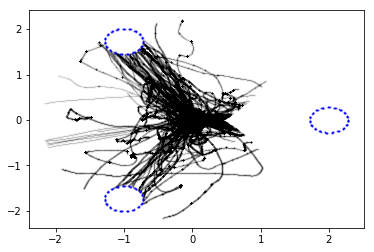

In [172]:

ANGLE = np.round(angle_used*180/math.pi).astype(int)
print('angle between posts:', str(ANGLE))

now= datetime.now()
act_date = now.strftime('%Y-%m-%d')

#trajectories
color = 'black'  # speeds #
plt.scatter(np.array(rot)[150:,0], np.array(rot)[150:,1],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'

if type(color) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)


#posts (approx size)
dot_x = math.cos(habp)*dist
dot_y = math.sin(habp)*dist
#plt.scatter(dot_x,dot_y, c='red', s=2900)
#plt.scatter(dot_x,-dot_y, c='blue', s=2900)

#limits of x and y axis
#plt.xlim(-0.6,2.3)
#plt.ylim(-2.3,2.3)
#appropriate size of posts in grey lines
plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.28+dot_x, np.array(ploY)[i]*0.28+dot_y, c='blue', s=1, alpha=0.5)
    plt.scatter((np.array(ploX)[i])*0.28+dot_x, np.array(ploY)[i]*0.28-dot_y, c='blue', s=1, alpha=0.5)
    plt.scatter((np.array(ploX)[i])*0.28+2, np.array(ploY)[i]*0.28, c='blue', s=1, alpha=0.5)
#act_date
filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_3post_'+ col_param +'_'+exper_date+'_'+'_all'+ '.png'
#filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_2post_'+ col_param +'_'+exper_date+'_'+tstart+ '.png'

speeds[np.where(speeds>4)[0]] = 0
#fig.set_dpi(100)

plt.savefig(filename, dpi=(250))

NameError: name 'data' is not defined

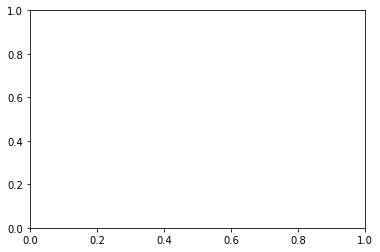

In [173]:


def forceAspect(ax,aspect=1):
    im = ax.get_images()
    extent =  im[0].get_extent()
    ax.set_aspect(abs((extent[5]-extent[1])/(extent[5]-extent[2]))/aspect)

#data = np.random.rand(0,2)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(data)
ax.set_xlabel('xlabel')
ax.set_aspect(1)
plt.scatter(np.array(rot)[150:,0], np.array(rot)[150:,1],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'


In [ ]:
speeds = np.array(d_v2)[:,0]

In [ ]:
#
speeds[np.where(speeds>4)[0]] = 0
speeds[np.where(speeds<0)[0]] = 0


In [45]:
len(speeds)

514647

(array([177814.,  43055.,  46223.,  38887.,  44564.,  51599.,  36972.,
         30751.,  28677.,  16105.]),
 array([0.        , 0.39999898, 0.79999796, 1.19999694, 1.59999592,
        1.9999949 , 2.39999388, 2.79999286, 3.19999183, 3.59999081,
        3.99998979]),
 <a list of 10 Patch objects>)

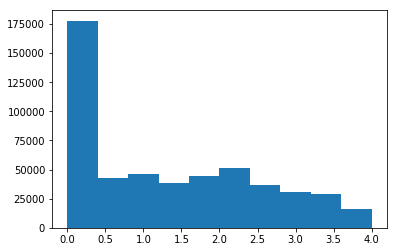

In [46]:
plt.hist(speeds)

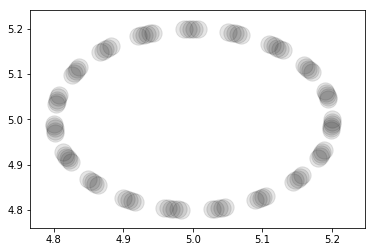

In [47]:
#dot plotting

plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.2+5, np.array(ploY)[i]*0.2+5, c='black', s=300, alpha=0.1)


In [ ]:

df = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0b4dc1ba-58fe-4452-9f75-630dd7cd07a8/results.csv')
df2 = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0cac2ffa-751c-47e2-a60c-a4394f0c3694/results.csv')

df.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df2.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df=df.append(df2)

#df, df2

In [ ]:
df4 = df[df['nStimuli'] == 4]
df4.head()

# plotting speed

In [37]:
#taking unrotated x,y values from df3
#if df['nStimuli'][j]== stim:
#print(df3['y'][i])  
#i=10000 

#need of implementation speed in relation to post-distance or starting point distance. otherwise two different locusts 
#plotted on top of each other don't make sense. they need some synchronization which is post-distance?? 
#bifurcation point distance?
window = 150
d_v = []
for i in range(window,(len(df3))): #len(df3)
    d=((((df3['x'][i]-df3['x'][i-window])**2 + (df3['y'][i]-df3['y'][i-window])**2)**0.5)/(df3['t'][i]-df3['t'][i-window]))
    #if d != 0.0:
        #d_v=( )

#plt.scatter(np.array(rot)[:,0], np.array(rot)[:,1], c='black', s=1, alpha=0.01)
#plt.scatter(df4['x'], df4['y'], c='black', s=1, alpha=0.01)
    #speed relative to location on x
    d_v.extend([(d*100,df3['x'][i])]) # *100 to get cm/s
    #speed to time
    #d_v.extend([(d*100,df3['t'][i])]) # *100 to get cm/s


In [38]:
#    rot.extend([(rotation(x,y,theta))])
d_v2 =[]
for i in range(window,(len(df3))): #len(df3)
    e=((((rot[i][0]-rot[i-window][0])**2 +       (rot[i][1]-rot[i-window][1]) **2)**0.5)/(df3['t'][i]-df3['t'][i-window]))
    #if d != 0.0:
        #d_v=( )
    d_v2.extend([(e*100,rot[i][0])])


(0, 4)

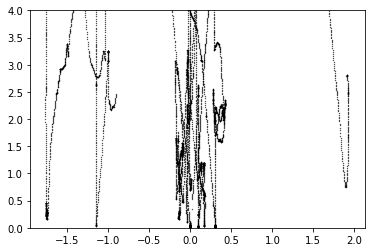

In [39]:
#color can get a list of colors to use for certain ID of the fly /locust

plt.scatter(np.array(d_v2)[50:8000,1], np.array(d_v2)[50:8000,0], c='black', s=0.1, alpha=1)
plt.ylim([0,4])

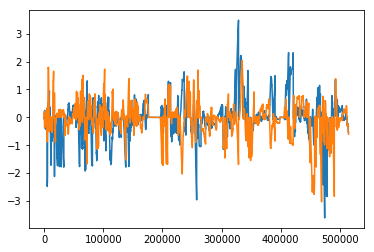

In [40]:
plt.plot(df3['x'][:])
plt.plot(df3['y'][:])
# plt.xlim([8700,11200])

In [41]:
xx = df3['x']
yy = df3['y']
distxxyy = np.sqrt(np.diff(xx)**2+np.diff(yy)**2)
speed = distxxyy/np.diff(tt)

NameError: name 'tt' is not defined

In [ ]:
dt = 1/100.0
threshold = np.quantile(distxxyy,0.99)
plt.hist(distxxyy[distxxyy<threshold]/dt)

In [ ]:
np.quantile(distxxyy,[0.95,0.99,1])

In [ ]:
tt  = df3['t']
plt.hist(np.diff(tt))

In [83]:
np.quantile(np.diff(tt),[0.95,0.99,1])

array([0.04771793, 0.05925059, 3.04935789])

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

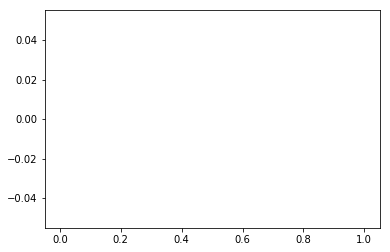

In [84]:
threshold = np.quantile(speed,0.99)
plt.hist(speed[speed<threshold])